In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import pickle
import re
import math

%matplotlib inline

In [ ]:
!pip install unzip
!unzip /content/drive/MyDrive/Image_processing_Project/Project_data.zip

  Created wheel for unzip: filename=unzip-1.0.0-py3-none-any.whl size=1319 sha256=ba3462b9e8599149fd03670d93e4c0623f8718766c9688a66fa20800cc9b9c42
  Stored in directory: /root/.cache/pip/wheels/c5/05/b3/f7b36dbaaf76de31b718cde792c953bfd11d2414a72f204b56
Successfully built unzip
Archive:  /content/drive/MyDrive/Image_processing_Project/Project_data.zip
  inflating: challenge_video.mp4     
  inflating: harder_challenge_video.mp4  
  inflating: project_video.mp4       
  inflating: test_images/straight_lines1.jpg  
  inflating: test_images/straight_lines2.jpg  
  inflating: test_images/test1.jpg   
  inflating: test_images/test2.jpg   
  inflating: test_images/test3.jpg   
  inflating: test_images/test4.jpg   
  inflating: test_images/test5.jpg   
  inflating: test_images/test6.jpg   


In [ ]:
### Utility Functions
def tryint(s):
    try:
        return int(s)
    except:
        return s
    
    
def plot_images(data, layout='row', cols=2, figsize=(20, 12)):
    '''
    Utility function for plotting images
    :param data [(ndarray, string)]: List of data to display, [(image, title)]
    :param layout (string): Layout, row-wise or column-wise
    :param cols (number): Number of columns per row
    :param figsize (number, number): Tuple indicating figure size
    '''
    rows = math.ceil(len(data) / cols)
    f, ax = plt.subplots(figsize=figsize)
    if layout == 'row':
        for idx, d in enumerate(data):
            img, title = d

            plt.subplot(rows, cols, idx+1)
            plt.title(title, fontsize=20)
            plt.axis('off')
            if len(img.shape) == 2:
                plt.imshow(img, cmap='gray')
                
            elif len(img.shape) == 3:
                plt.imshow(img)
                
    elif layout == 'col':
        counter = 0
        for r in range(rows):
            for c in range(cols):
                img, title = data[r + rows*c]
                nb_channels = len(img.shape)
                
                plt.subplot(rows, cols, counter+1)
                plt.title(title, fontsize=20)
                plt.axis('off')
                if len(img.shape) == 2:
                    plt.imshow(img, cmap='gray')
                
                elif len(img.shape) == 3:
                    plt.imshow(img)
              
                counter += 1

    return ax

def capture_frames(video_path, frames_dir):
    '''
    Utility function that captures and stores video frames
    :param video_path (string): Video path
    :param frames_dir (string): Frames directory
    '''
    cap = cv2.VideoCapture(video_path)

    print('Starting frame capture...')
    
    count = 0
    success = True
    while success:
        success, frame = cap.read()
        cv2.imwrite(frames_dir + 'frame{:02}.jpg'.format(count), frame)
        count += 1

    print('Completed!')
    

test_img_paths = glob.glob('/content/test_images/test*.jpg')


video1 = glob.glob('/content/video_frames/frame*.jpg')


video2 = glob.glob('/content/video_frames_1/frame*.jpg')


# List of all demos to visualise
plot_demo = [1, 2, 3, 4, 5, 6, 7, 8]

## 1. Camera Calibration & Distortion correction

Compute the camera calibration matrix and distortion coefficients

In [ ]:
def camera_Calibraton(path, nx, ny, img_size):
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

    objpoints = [] 
    imgpoints = []

    # Image List
    images = glob.glob(path+'/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            
    if (len(objpoints) > 0):
        # Camera successfully calibrated.
        print("Camera successfully calibrated.")
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    else:
        # Unable to calibrate the camera.
        print("Unable to calibrate the camera.")
        ret, mtx, dist, rvecs, tvecs = (None, None, None, None, None)
            
    #ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        
    return mtx, dist

def undistort(image, mtx, dist):
    image = cv2.undistort(image, mtx, dist, None, mtx)
    return image   

In [ ]:
def calibrate_camera():
    '''
    Computes the camera calibration matrix and distortion coefficients
    :return: Camera calibration matrix and distortion coefficients
    '''
    cal_img_path = '/content/drive/MyDrive/Image_processing_Project/camera_cal'
    imgpaths = glob.glob(cal_img_path+'/calibration*.jpg')
    
    
    # View a sample calibration image
    %matplotlib inline
    
    image = cv2.imread(imgpaths[0])
    imshape = image.shape[:2] # gets only the (height, width) to be used in the cv2.calibrateCamera()
    
    plt.imshow(image)
    plt.show()
    print('Image shape: {}'.format(image.shape))

    %matplotlib qt
    print()
    print('Calibrating the camera...')
    print()

    objpoints = []
    imgpoints = []

    nx = 9 # Number of inside corners on each row of the chessboard
    ny = 6 # Number of inside corners on each column of the chessboard

    # Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros([ny*nx, 3], dtype=np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    # Iterate over each calibration image and determine the objpoints and imgpoints
    for idx, imgpath in enumerate(imgpaths):
        img = cv2.imread(imgpath)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret:
            img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)

            imgpoints.append(corners)
            objpoints.append(objp)

            cv2.imshow('img', img)
            cv2.waitKey(500)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imshape[::-1], None, None)
   
    print('Calibration complete!')
    cv2.destroyAllWindows()
    return mtx, dist


def undistort(img, mtx, dist):

    undistort = cv2.undistort(img, mtx, dist, None, mtx)
    return undistort

### 1.1 Demo

Camera successfully calibrated.


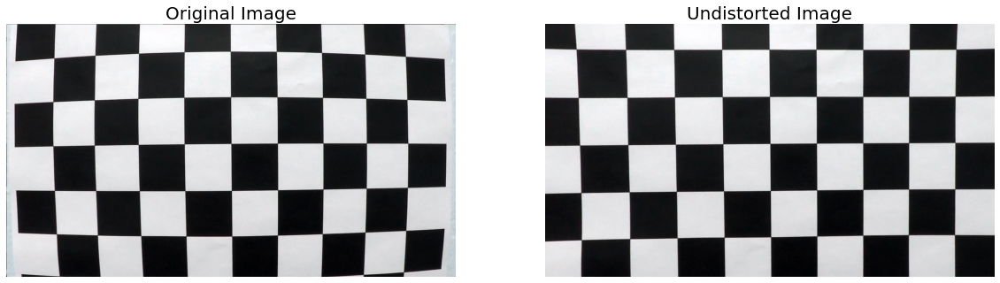

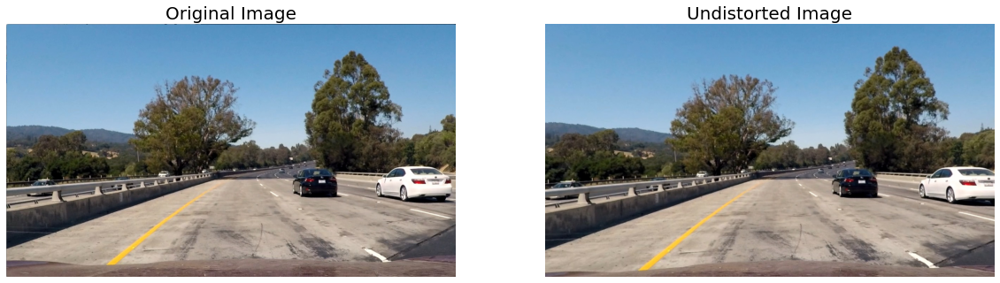

In [ ]:
# Undistort a sample camera calibration image and a sample test image
cal_img_path = "/content/drive/MyDrive/Image_processing_Project/camera_cal"
mtx, dist = camera_Calibraton( cal_img_path,  9, 6, (720, 1280))
if 1 in plot_demo:
    ccimg = cv2.imread(cal_img_path +'/calibration1.jpg')
    ccimg_undist = undistort(ccimg, mtx, dist)

    plot_images([
        (ccimg, 'Original Image'),
        (ccimg_undist, 'Undistorted Image')
    ])
    
    img_orig = mpimg.imread(test_img_paths[1])
    img = undistort(img_orig, mtx, dist)

    plot_images([
        (img_orig, 'Original Image'),
        (img, 'Undistorted Image')
    ])

## 2. Perspective Transformation

In [ ]:
IMG_SHAPE = (720, 1280)

def get_roi(img, vertices):
    '''
    Transforms an image by preserving only the ROI represented by the
    the 'vertices' and removes the remainder of the image by setting the pixel intensity to 0
    :param img (ndarray): Image
    :param vertices (ndarray): Region of Interest of the image
    :return : Modified image
    '''
    
    vertices = np.array(vertices, ndmin=3, dtype=np.int32)
    if len(img.shape) == 3:
        fill_color = (255,) * 3
    else:
        fill_color = 255
            
    mask = np.zeros_like(img)
    mask = cv2.fillPoly(mask, vertices, fill_color)
    return cv2.bitwise_and(img, mask)
    
def warp_image(img, warp_shape, src, dst):
    '''
    Performs perspective transformation (PT)
    :param img (ndarray): Image
    :param warp_shape: Shape of the warped image
    :param src (ndarray): Source points
    :param dst (ndarray): Destination points
    :return : Tuple (Transformed image, PT matrix, PT inverse matrix)
    '''
    
    # Get the perspective transformation matrix and its inverse
    M = cv2.getPerspectiveTransform(src, dst)
    invM = cv2.getPerspectiveTransform(dst, src)
    
    # Warp the image
    warped = cv2.warpPerspective(img, M, warp_shape, flags=cv2.INTER_LINEAR)
    return warped, M, invM

def preprocess_image(img, visualise=False):
    '''
    Pre-processes an image. Steps include:
    1. Distortion correction
    2. Perspective Transformation
    3. ROI crop
    
    :param img (ndarray): Original Image
    :param visualise (boolean): Boolean flag for visualisation
    :return : Pre-processed image, (PT matrix, PT inverse matrix)
    '''
    
    ysize = img.shape[0]
    xsize = img.shape[1]
    
    # 1. Distortion correction
    undist = undistort(img, mtx, dist)
    
    # 2. Perspective transformation
    src = np.float32([
        (696,455),    
        (587,455), 
        (235,700),  
        (1075,700)
    ])

    dst = np.float32([
        (xsize - 350, 0),
        (350, 0),
        (350, ysize),
        (xsize - 350, ysize)
    ])

    warped, M, invM = warp_image(undist, (xsize, ysize), src, dst)

    # 3. ROI crop
    vertices = np.array([
        [200, ysize],
        [200, 0],
        [1100, 0],
        [1100, ysize]
    ])
    img_copy = np.copy(undist)
    roi = get_roi(warped, vertices)
    roi_copy = np.copy(roi)
    cv2.polylines(img_copy, [np.int32(src)], True, (255, 0, 0), 3)
    cv2.polylines(roi_copy, [np.int32(dst)], True, (255, 0, 0), 3)

    # 4. Visualise the transformation
    if visualise:
        img_copy = np.copy(img)
        roi_copy = np.copy(roi)
        
        cv2.polylines(img_copy, [np.int32(src)], True, (255, 0, 0), 3)
        cv2.polylines(roi_copy, [np.int32(dst)], True, (255, 0, 0), 3)
        
        plot_images([
            (img_copy, 'Original Image'),
            (roi_copy, 'Bird\'s Eye View Perspective')
        ])

    return img_copy,roi_copy,roi, (M, invM)

def get_image(img_path, visualise=False):
    '''
    Load an image from the 'img_path' and pre-process it
    :param img_path (string): Image path
    :param visualise (boolean): Boolean flag for visualisation
    :return : Transformed Image, (PT matrix, PT inv matrix)
    '''
    img = mpimg.imread(img_path)
    return preprocess_image(img, visualise=visualise)

### 2.1 Demo

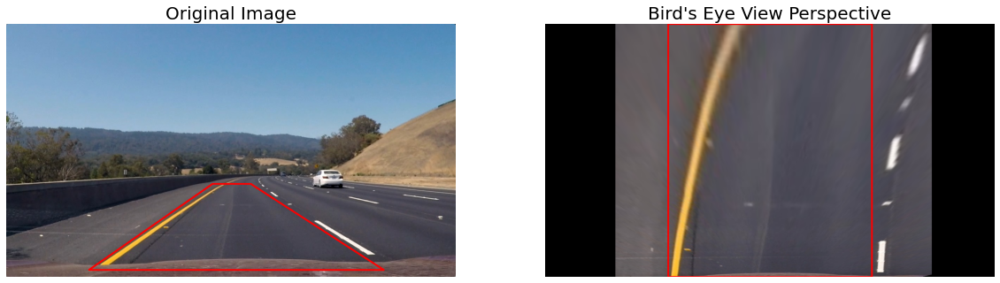

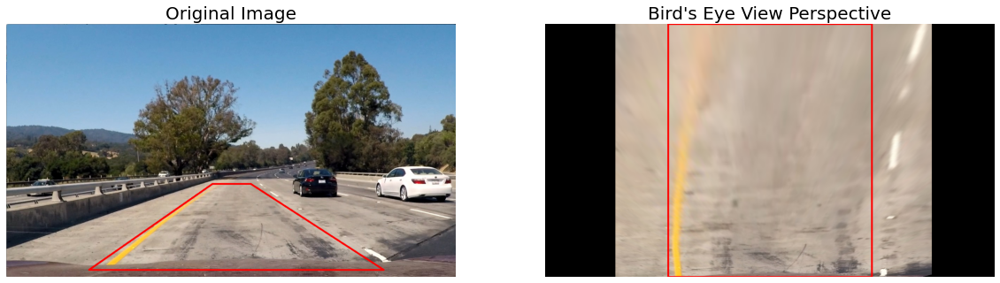

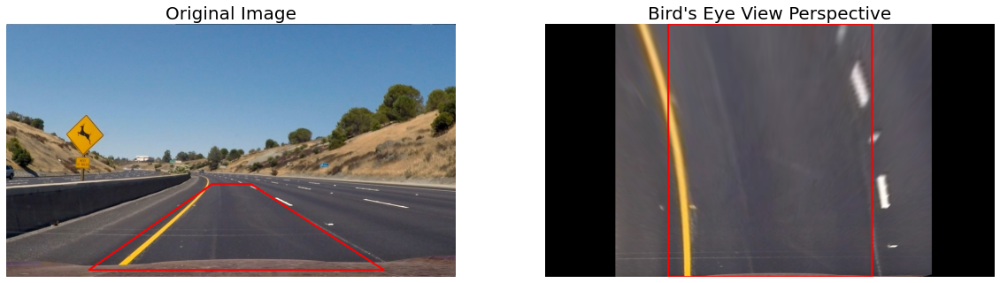

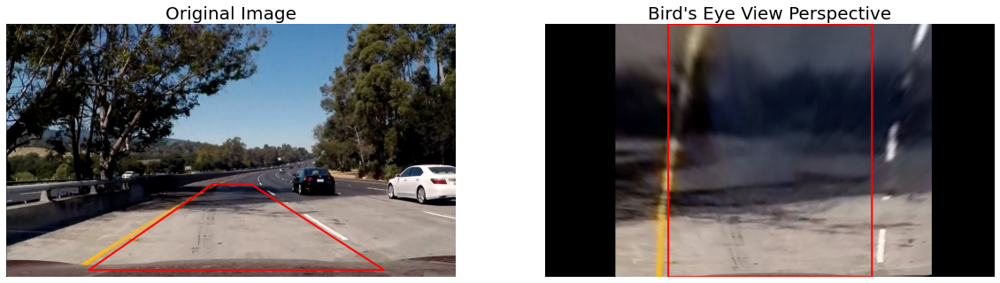

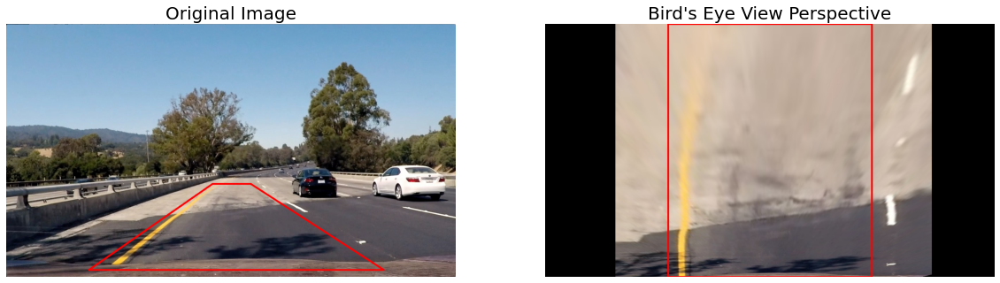

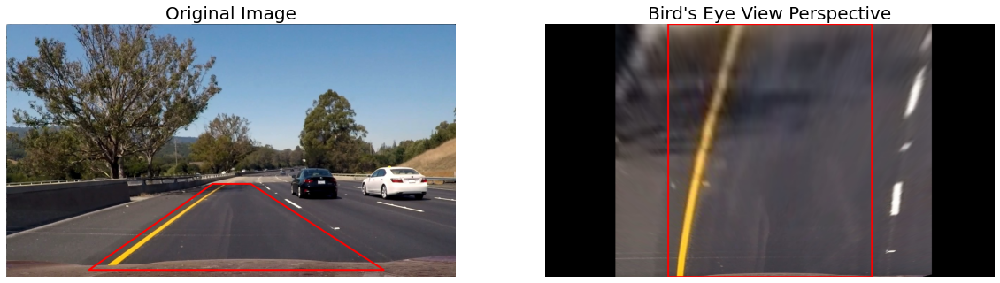

In [ ]:
if 2 in plot_demo:
    for path in test_img_paths[:]:
        get_image(path, visualise=True)

## 3. Generate Thresholded Binary image

In [ ]:
def binary_threshold(img, low, high):    
    if len(img.shape) == 2:
        output = np.zeros_like(img)
        mask = (img >= low) & (img <= high)
        
    elif len(img.shape) == 3:
        output = np.zeros_like(img[:,:,0])
        mask = (img[:,:,0] >= low[0]) & (img[:,:,0] <= high[0]) \
            & (img[:,:,1] >= low[1]) & (img[:,:,1] <= high[1]) \
            & (img[:,:,2] >= low[2]) & (img[:,:,2] <= high[2])
            
    output[mask] = 1
    return output

def get_binary_image(img, visualise=False):
    """
    Generate a thresholded binary image using transforms from an ensemble of color spaces: 
    LAB (Yellow), HSV (Yellow + White), HLS (Yellow + White), RGB (White) and 
    Adaptive Thresholding ()
    :param img (ndarray): Warped image
    :param visualise (boolean): Boolean flag for visualisation
    :return (ndarray): Thresholded binary image
    """
    
    ### LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    L = lab[:,:,0]
    L_max, L_mean = np.max(L), np.mean(L)
    B = lab[:,:,2]
    B_max, B_mean = np.max(B), np.mean(B)

    # YELLOW
    L_adapt_yellow = max(80, int(L_max * 0.45))
    B_adapt_yellow =  max(int(B_max * 0.70), int(B_mean * 1.2))
    lab_low_yellow = np.array((L_adapt_yellow, 120, B_adapt_yellow))
    lab_high_yellow = np.array((255, 145, 255))

    lab_yellow = binary_threshold(lab, lab_low_yellow, lab_high_yellow)
    lab_binary =lab_yellow
      
    ### HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    H = hsv[:,:,0]
    H_max, H_mean = np.max(H), np.mean(H)
    S = hsv[:,:,1]
    S_max, S_mean = np.max(S), np.mean(S)
    V = hsv[:,:,2]
    V_max, V_mean = np.max(V), np.mean(V)
    
    # YELLOW
    S_adapt_yellow =  max(int(S_max * 0.25), int(S_mean * 1.75))
    V_adapt_yellow =  max(50, int(V_mean * 1.25))
    hsv_low_yellow = np.array((15, S_adapt_yellow, V_adapt_yellow))
   
    hsv_high_yellow = np.array((30, 255, 255))
    hsv_yellow = binary_threshold(hsv, hsv_low_yellow, hsv_high_yellow)    

    # WHITE
    V_adapt_white = max(150, int(V_max * 0.8),int(V_mean * 1.25))
    hsv_low_white = np.array((0, 0, V_adapt_white))
    hsv_high_white = np.array((255, 40, 220))

    hsv_white = binary_threshold(hsv, hsv_low_white, hsv_high_white)

    hsv_binary = hsv_yellow | hsv_white

    ### HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    L = hls[:,:,1]
    L_max, L_mean = np.max(L), np.mean(L)
    S = hls[:,:,2]
    S_max, S_mean = np.max(S), np.mean(S)
 
    # YELLOW
    L_adapt_yellow = max(80, int(L_mean * 1.25))
    S_adapt_yellow = max(int(S_max * 0.25), int(S_mean * 1.75))
    hls_low_yellow = np.array((15, L_adapt_yellow, S_adapt_yellow))
    hls_high_yellow = np.array((30, 255, 255))

    hls_yellow = binary_threshold(hls, hls_low_yellow, hls_high_yellow)
    
    # WHITE
    L_adapt_white =  max(160, int(L_max *0.8),int(L_mean * 1.25))
    hls_low_white = np.array((0, L_adapt_white,  0))
    hls_high_white = np.array((255, 255, 255))

    hls_white = binary_threshold(hls, hls_low_white, hls_high_white)
        
    hls_binary = hls_yellow | hls_white

    ### R color channel (WHITE)
    R = img[:,:,0]
    R_max, R_mean = np.max(R), np.mean(R)
    
    R_low_white = min(max(150, int(R_max * 0.55), int(R_mean * 1.95)),230)
    R_binary = binary_threshold(R, R_low_white, 255)
    
    ### Adaptive thresholding: Gaussian kernel 
    # YELLOW
    
    adapt_yellow_S = cv2.adaptiveThreshold(hls[:,:,2], 1, \
                                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 161, -5)
    adapt_yellow_B = cv2.adaptiveThreshold(lab[:,:,2], 1, \
                                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 161, -5)
    adapt_yellow = adapt_yellow_S & adapt_yellow_B
    
    # WHITE
    adapt_white_R = cv2.adaptiveThreshold(img[:,:,0], 1, \
                                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 161, -27)
    adapt_white_L = cv2.adaptiveThreshold(hsv[:,:,2], 1, \
                                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 161, -27)
    adapt_white = adapt_white_R & adapt_white_L
    
                                                  
    adapt_binary =  adapt_yellow | adapt_white

    ### Ensemble Voting
    combined = np.asarray(R_binary + lab_binary + hls_binary + hsv_binary + adapt_binary, dtype=np.uint8)

    combined[combined < 3] = 0
    combined[combined >= 3] = 1

    if visualise:
        plot_images([
            (img, 'Original'),
            (R_binary, 'R'),
            (hls_binary, 'HLS'),
            (hsv_binary, 'HSV'),
            (lab_binary, 'LAB'),
            (adapt_binary, 'Adaptive Thresh'),
            (combined, 'Combined'),
#             (hls_white, 'hls_white'),
#             (hls_yellow, 'hls yellow'),
#             (lab_white, 'lab white'),
#             (lab_yellow, 'lab yello'),
        ], figsize=(32, 42))

    return  combined

### 3.1 Demo

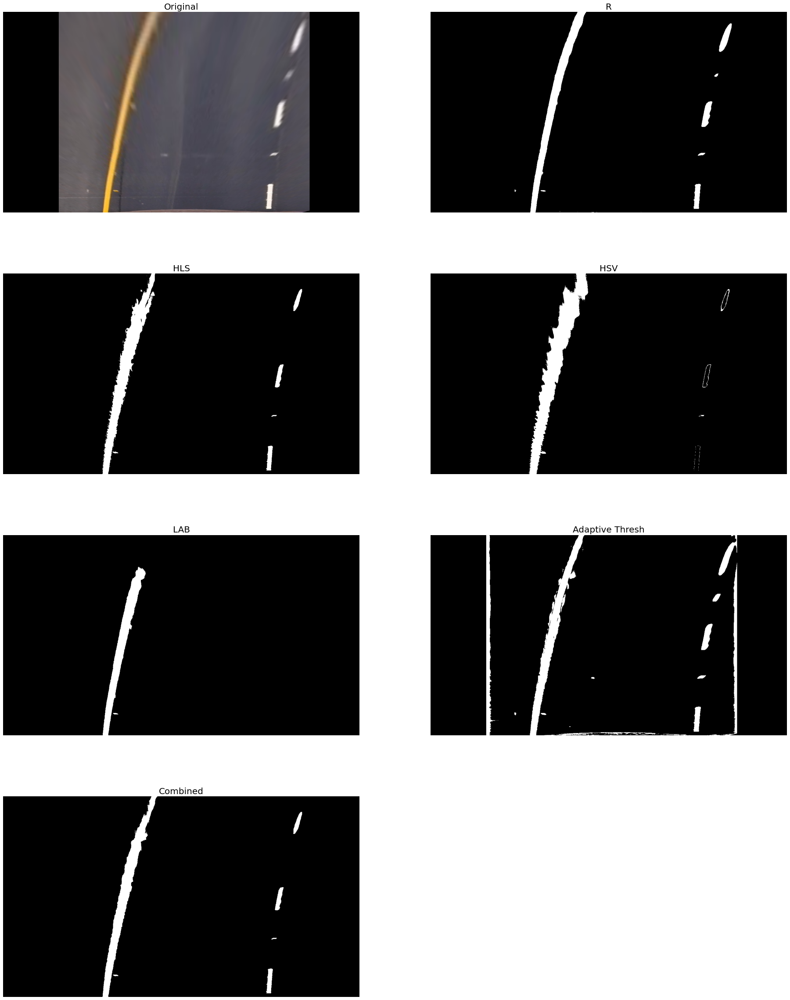

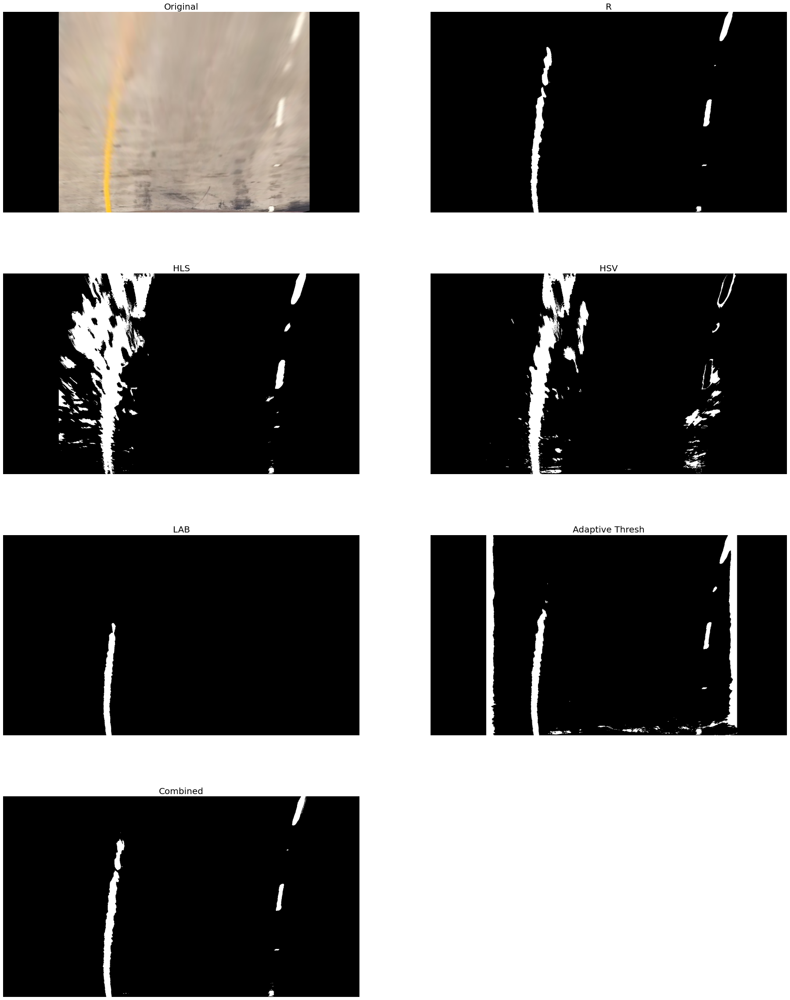

In [ ]:
if 3 in plot_demo:
    for img_path in test_img_paths[:2]: #video2[5:10]:
        img_copy,roi_copy,img, (M, invM) = get_image(img_path)
        get_binary_image(img, visualise=True)

## 4. Detect Lane Lines: Peaks in Histogram & Sliding Window Technique

In [ ]:
def get_poly_points(left_fit, right_fit):
    '''
    Get the points for the left lane/ right lane defined by the polynomial coeff's 'left_fit'
    and 'right_fit'
    :param left_fit (ndarray): Coefficients for the polynomial that defines the left lane line
    :param right_fit (ndarray): Coefficients for the polynomial that defines the right lane line
    : return (Tuple(ndarray, ndarray, ndarray, ndarray)): x-y coordinates for the left and right lane lines
    '''
    ysize, xsize = IMG_SHAPE
    
    # Get the points for the entire height of the image
    plot_y = np.linspace(0, ysize-1, ysize)
    plot_xleft = left_fit[0] * plot_y**2 + left_fit[1] * plot_y + left_fit[2]
    plot_xright = right_fit[0] * plot_y**2 + right_fit[1] * plot_y + right_fit[2]
    
    # But keep only those points that lie within the image
    plot_xleft = plot_xleft[(plot_xleft >= 0) & (plot_xleft <= xsize - 1)]
    plot_xright = plot_xright[(plot_xright >= 0) & (plot_xright <= xsize - 1)]
    plot_yleft = np.linspace(ysize - len(plot_xleft), ysize - 1, len(plot_xleft))
    plot_yright = np.linspace(ysize - len(plot_xright), ysize - 1, len(plot_xright))
    
    return plot_xleft.astype(np.int), plot_yleft.astype(np.int), plot_xright.astype(np.int), plot_yright.astype(np.int)

def check_validity(left_fit, right_fit, diagnostics=False):
    '''
    Determine the validity of lane lines represented by a set of second order polynomial coefficients 
    :param left_fit (ndarray): Coefficients for the 2nd order polynomial that defines the left lane line
    :param right_fit (ndarray): Coefficients for the 2nd order polynomial that defines the right lane line
    :param diagnostics (boolean): Boolean flag for logging
    : return (boolean)
    '''
    
    if left_fit is None or right_fit is None:
        return False
    
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)

    # Check whether the two lines lie within a plausible distance from one another for three distinct y-values

    y1 = IMG_SHAPE[0] - 1 # Bottom
    y2 = IMG_SHAPE[0] - int(min(len(plot_yleft), len(plot_yright)) * 0.35) # For the 2nd and 3rd, take values between y1 and the top-most available value.
    y3 = IMG_SHAPE[0] - int(min(len(plot_yleft), len(plot_yright)) * 0.75)

    # Compute the respective x-values for both lines
    x1l = left_fit[0]  * (y1**2) + left_fit[1]  * y1 + left_fit[2]
    x2l = left_fit[0]  * (y2**2) + left_fit[1]  * y2 + left_fit[2]
    x3l = left_fit[0]  * (y3**2) + left_fit[1]  * y3 + left_fit[2]

    x1r = right_fit[0] * (y1**2) + right_fit[1] * y1 + right_fit[2]
    x2r = right_fit[0] * (y2**2) + right_fit[1] * y2 + right_fit[2]
    x3r = right_fit[0] * (y3**2) + right_fit[1] * y3 + right_fit[2]

    # Compute the L1 norms
    x1_diff = abs(x1l - x1r)
    x2_diff = abs(x2l - x2r)
    x3_diff = abs(x3l - x3r)

    # Define the threshold values for each of the three points
    min_dist_y1 = 480 # 510 # 530 
    max_dist_y1 = 730 # 750 # 660
    min_dist_y2 = 280
    max_dist_y2 = 730 # 660
    min_dist_y3 = 140
    max_dist_y3 = 730 # 660
    
    if (x1_diff < min_dist_y1) | (x1_diff > max_dist_y1) | \
        (x2_diff < min_dist_y2) | (x2_diff > max_dist_y2) | \
        (x3_diff < min_dist_y3) | (x3_diff > max_dist_y3):
        if diagnostics:
            print("Violated distance criterion: " +
                  "x1_diff == {:.2f}, x2_diff == {:.2f}, x3_diff == {:.2f}".format(x1_diff, x2_diff, x3_diff))
        return False

    # Check whether the line slopes are similar for two distinct y-values
    # x = Ay**2 + By + C
    # dx/dy = 2Ay + B
    
    y1left_dx  = 2 * left_fit[0]  * y1 + left_fit[1]
    y3left_dx  = 2 * left_fit[0]  * y3 + left_fit[1]
    y1right_dx = 2 * right_fit[0] * y1 + right_fit[1]
    y3right_dx = 2 * right_fit[0] * y3 + right_fit[1]

    # Compute the L1-norm
    norm1 = abs(y1left_dx - y1right_dx)
    norm2 = abs(y3left_dx - y3right_dx)
    
#     if diagnostics: print( norm1, norm2)

    # Define the L1 norm threshold
    thresh = 0.6 #0.58 
    if (norm1 >= thresh) | (norm2 >= thresh):
        if diagnostics:
            print("Violated tangent criterion: " +
                  "norm1 == {:.3f}, norm2 == {:.3f} (thresh == {}).".format(norm1, norm2, thresh))
            return False
    
    return True

def polyfit_sliding_window(binary, lane_width_px=578, visualise=False, diagnostics=False):
    '''
    Detect lane lines in a thresholded binary image using the sliding window technique
    :param binary (ndarray): Thresholded binary image
    :param lane_width_px (int): Average lane line width (in px) for the warped image 
    computed empirically
    :param visualise (boolean): Boolean flag for visualisation
    :param diagnositics (boolean): Boolean flag for logging
    '''
    
    global cache
    ret = True

    # Sanity check
    if binary.max() <= 0:
        return False, np.array([]), np.array([]), np.array([])
    
    # Step 1: Compute the histogram along all the columns in the lower half of the image. 
    # The two most prominent peaks in this histogram will be good indicators of the
    # x-position of the base of the lane lines
    histogram = None
    cutoffs = [int(binary.shape[0] / 2), 0]
    
    for cutoff in cutoffs:
        histogram = np.sum(binary[cutoff:, :], axis=0)
        
        if histogram.max() > 0:
            break

    if histogram.max() == 0:
        print('Unable to detect lane lines in this frame. Trying another frame!')
        return False, np.array([]), np.array([])
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] / 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    if visualise:
        plot_images([(binary, 'Binary')])
        plt.plot(histogram, 'm', linewidth=4.0)
        plt.plot((midpoint, midpoint), (0, IMG_SHAPE[0]), 'c')
        plt.plot((0, IMG_SHAPE[1]), (cutoff, cutoff), 'c')

    out = np.dstack((binary, binary, binary)) * 255

    nb_windows = 12 # number of sliding windows
    margin = 100 # width of the windows +/- margin
    minpix = 50 # min number of pixels needed to recenter the window
    window_height = int(IMG_SHAPE[0] / nb_windows)
    min_lane_pts = 10  # min number of 'hot' pixels needed to fit a 2nd order polynomial as a 
                    # lane line
    
    # Identify the x-y positions of all nonzero pixels in the image
    # Note: the indices here are equivalent to the coordinate locations of the
    # pixel
    nonzero = binary.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    for window in range(nb_windows):
        # Identify window boundaries in x and y (and left and right)
        win_y_low = IMG_SHAPE[0] - (1 + window) * window_height
        win_y_high = IMG_SHAPE[0] - window * window_height

        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin

        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw windows for visualisation
        cv2.rectangle(out, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high),\
                      (0, 255, 0), 2)
        cv2.rectangle(out, (win_xright_low, win_y_low), (win_xright_high, win_y_high),\
                      (0, 255, 0), 2)

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high)
                         & (nonzerox >= win_xleft_low) & (nonzerox <= win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high)
                         & (nonzerox >= win_xright_low) & (nonzerox <= win_xright_high)).nonzero()[0]

        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) >  minpix:
            leftx_current = int(np.mean(nonzerox[good_left_inds]))

        if len(good_right_inds) > minpix:
            rightx_current = int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract pixel positions for the left and right lane lines
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit, right_fit = None, None
    
    # Sanity check; Fit a 2nd order polynomial for each lane line pixels
    if len(leftx) >= min_lane_pts and len(rightx) >= min_lane_pts:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    
    # Validate detected lane lines
    valid = check_validity(left_fit, right_fit, diagnostics=diagnostics)
   
    if not valid:
        # If the detected lane lines are NOT valid:
        # 1. Compute the lane lines as an average of the previously detected lines
        # from the cache and flag this detection cycle as a failure by setting ret=False
        # 2. Else, if cache is empty, return 
        
        if len(cache) == 0:
            if diagnostics: print('WARNING: Unable to detect lane lines in this frame.')
            return False, np.array([]), np.array([])
        
        avg_params = np.mean(cache, axis=0)
        left_fit, right_fit = avg_params[0], avg_params[1]
        ret = False
        
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)

    # Color the detected pixels for each lane line
    out[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [255, 10, 255]

    left_poly_pts = np.array([np.transpose(np.vstack([plot_xleft, plot_yleft]))])
    right_poly_pts = np.array([np.transpose(np.vstack([plot_xright, plot_yright]))])

    # Plot the fitted polynomial
    cv2.polylines(out, np.int32([left_poly_pts]), isClosed=False, color=(200,255,155), thickness=4)
    cv2.polylines(out, np.int32([right_poly_pts]), isClosed=False, color=(200,255,155), thickness=4)

    if visualise:
        plot_images([(img, 'Original'), (out, 'Out')], figsize=(30, 40))
        
    return ret, out, np.array([left_fit, right_fit])

### 4.1 Demo

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:132: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

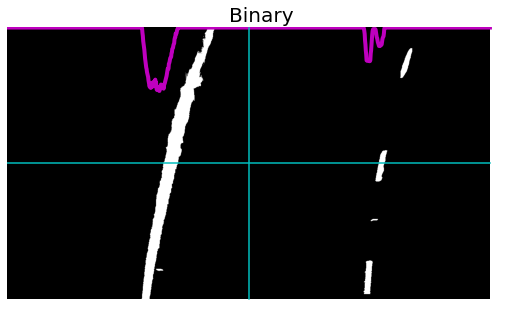

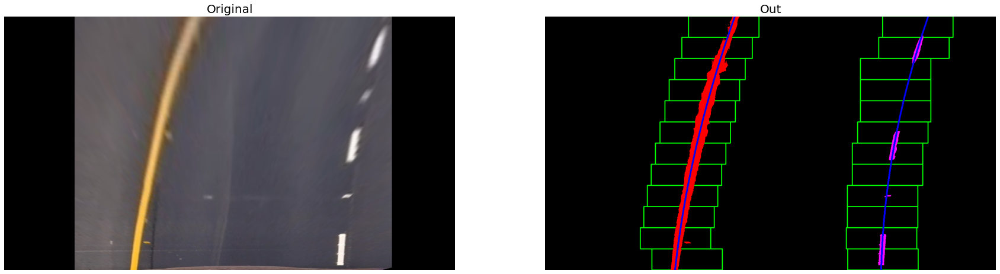

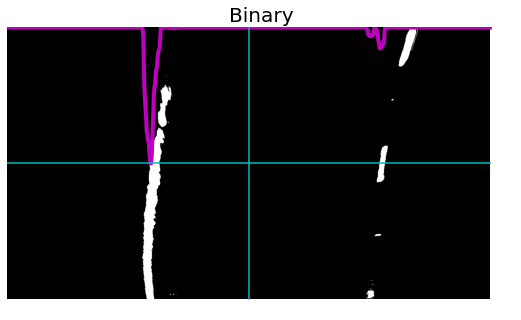

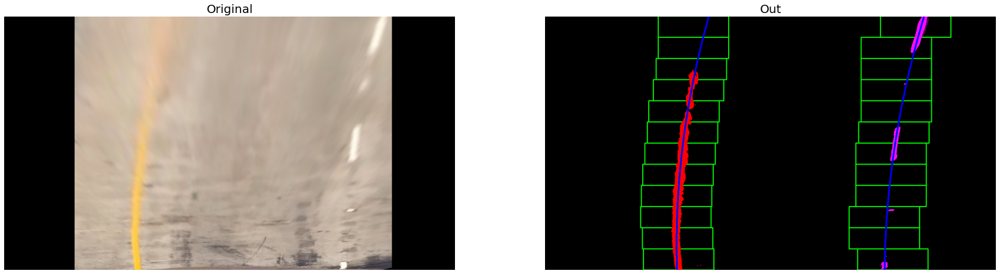

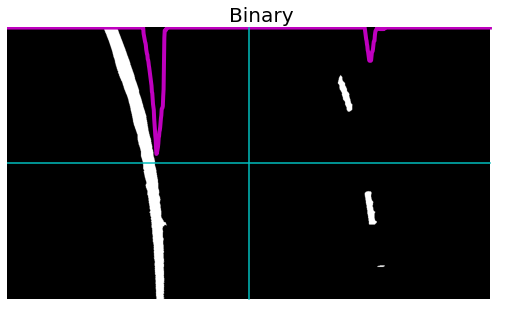

...

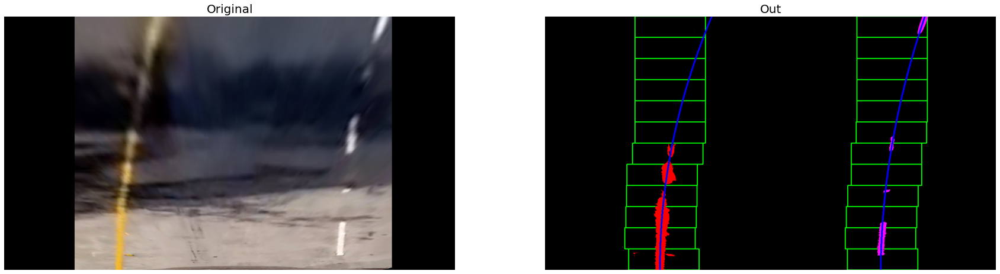

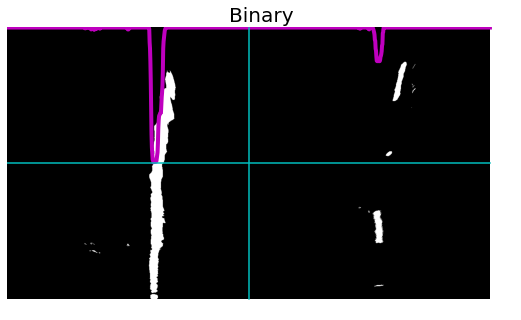

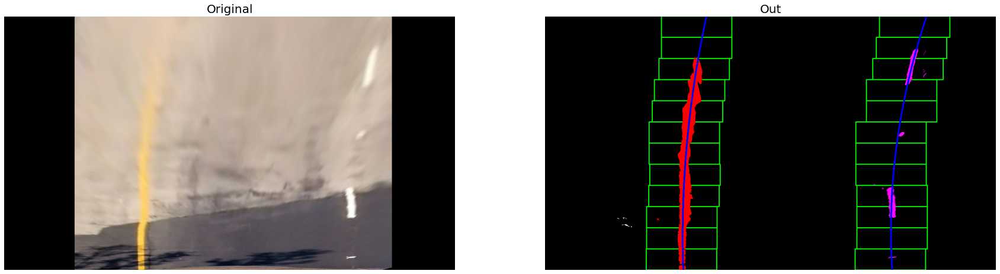

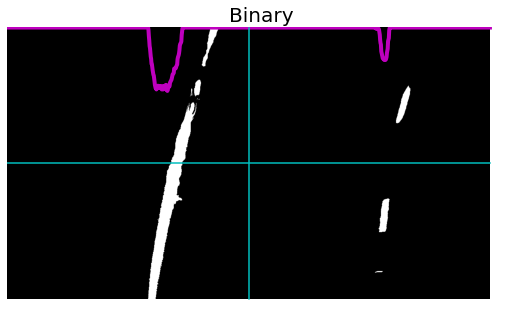

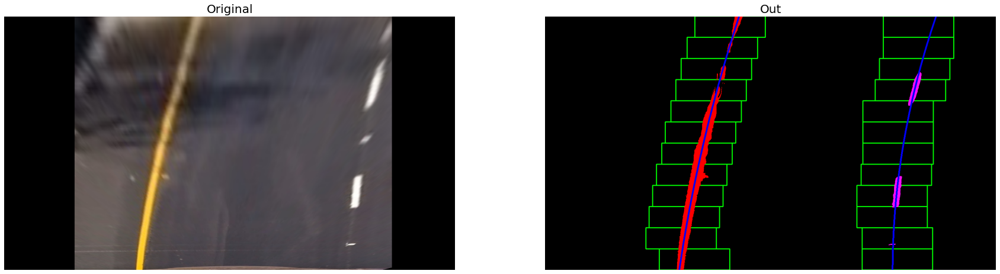

In [ ]:
if 4 in plot_demo:

    cache = np.array([])

    for img_path in test_img_paths[:]: #video2[134:138]:
        img,roi_copy,img, (M, invM)= get_image(img_path)
        binary = get_binary_image(img, visualise=False)
        polyfit_sliding_window(binary, visualise=True)

## 5. Detect Lane Lines: Adaptive Search 

In [ ]:
def polyfit_adapt_search(img, prev_poly_param, visualise=False, diagnostics=False):
    '''
    Function that: 
    1. Uses the sliding window technique to perform incremental localised adaptive threhsolding
    over the previosuly detected lane line trajectory to develop a threhsolded binary image. Then,
    2. Uses this generated binary image to detect and fit lane lines in a margin around the previous fit rather 
    than performing a blind search
    :param img (ndarray): Warped image
    :param prev_poly_param (ndarray): Polynomial coefficients of the previously detected lane lines
    :param visualise (boolean): Boolean flag for visualisation
    :param diagnostics (boolean): Boolean flag for logging
    : return (ndarray, ndarray): 3 channel image with the newly detected lane lines, current polynomial coefficients
    '''
    
    global cache # Cache of the previosuly detected lane line coefficients
    global attempts # Number of retries before the pipeline is RESET to detect lines via the smoothing window aproach
    
    # Sanity check
    assert(len(img.shape) == 3)
    
    # Setup
    nb_windows = 10 # Number of windows over which to perform the localised color thresholding  
    bin_margin = 80 # Width of the windows +/- margin for localised thresholding
    margin = 60 # Width around previous line positions +/- margin around which to search for the new lines
    window_height = int(img.shape[0] / nb_windows)
    smoothing_window = 5 # Number of frames over which to compute the Moving Average
    min_lane_pts = 10
    
    binary = np.zeros_like(img[:,:,0]) # Placeholder for the thresholded binary image
    img_plot = np.copy(img)

    left_fit, right_fit = prev_poly_param[0], prev_poly_param[1]
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)
    
    leftx_current = np.int(plot_xleft[-1])
    rightx_current = np.int(plot_xright[-1])
    
    # Iterate over the windows, perform localised color thresholding and generate the binary image
    for window in range(nb_windows):
        # Identify window boundaries in x and y (and left and right)
        win_y_low = IMG_SHAPE[0] - (window + 1) * window_height
        win_y_high = IMG_SHAPE[0] - window * window_height
        win_xleft_low = min(max(0, leftx_current - bin_margin), 1280)
        win_xleft_high = min(max(0, leftx_current + bin_margin), 1280)
        win_xright_low = min(max(0, rightx_current - bin_margin), 1280)
        win_xright_high = min(max(0, rightx_current + bin_margin), 1280)

        img_win_left = img[win_y_low:win_y_high, win_xleft_low:win_xleft_high,:]
        binary[win_y_low:win_y_high, win_xleft_low:win_xleft_high] = \
            get_binary_image(img_win_left, visualise=False)

        img_win_right = img[win_y_low:win_y_high, win_xright_low:win_xright_high, :]
        binary[win_y_low:win_y_high, win_xright_low:win_xright_high] = \
            get_binary_image(img_win_right, visualise=False)
   
        # Given that we only keep the points/values for a line that lie within the image
        # (see 'get_poly_points'), the overall length and consequently number of points (i.e. x-values
        # and y-values) can be < the length of the image. As a result, we check for the presence
        # of the current window's lower y-value i.e 'win_y_low' as a valid point within the previously detected line
        # If, a point associated with this y-value exists, we update the x-position of the next window with
        # the corresponding x-value.
        # Else, we keep the x-position of the subsequent windows the same and move up the image
        idxs = np.where(plot_yleft == win_y_low)[0]
        if len(idxs) != 0:
            leftx_current = int(plot_xleft[idxs[0]])
            
        idxs = np.where(plot_yright == win_y_low)[0]
        if len(idxs) != 0:
            rightx_current = int(plot_xright[idxs[0]])

        if visualise:
            left_pts = np.array([np.transpose(np.vstack([plot_xleft, plot_yleft]))])
            right_pts = np.array([np.transpose(np.vstack([plot_xright, plot_yright]))])
            
            # Plot the previously detected lane lines
            cv2.polylines(img_plot, np.int32([left_pts]), isClosed=False, color=(255, 20, 147), thickness=4)
            cv2.polylines(img_plot, np.int32([right_pts]), isClosed=False, color=(255, 20, 147), thickness=4)    
            
            bin_win_left = binary[win_y_low:win_y_high, win_xleft_low:win_xleft_high]
            bin_win_left = np.dstack((bin_win_left, np.zeros_like(bin_win_left), np.zeros_like(bin_win_left))) * 255

            bin_win_right = binary[win_y_low:win_y_high, win_xright_low:win_xright_high]
            bin_win_right = np.dstack([np.zeros_like(bin_win_right), np.zeros_like(bin_win_right), bin_win_right]) * 255
            
            # Blend the localised image window with its corresponding thresholded binary version
            win_left = cv2.addWeighted(bin_win_left, 0.5, img_win_left, 0.7, 0)
            win_right = cv2.addWeighted(bin_win_right, 0.5, img_win_right, 0.7, 0)
            
            # Draw the binary search window
            cv2.rectangle(img_plot, (win_xleft_low,win_y_low), (win_xleft_high,win_y_high), (0,255,0), 5)
            cv2.rectangle(img_plot, (win_xright_low,win_y_low), (win_xright_high,win_y_high), (0,255,0), 5)
            
            f, _ = plt.subplots(1, 2, figsize=(13,5))
            
            plt.subplot(121)
            plt.axis('off')
            plt.imshow(binary, cmap='gray')

            plt.subplot(122)
            plt.axis('off')
            plt.imshow(img_plot)

            plt.subplots_adjust(top=0.98, bottom=0.0, left=0.0, right=1.0, hspace=0.1, wspace=0.05)
            
            # The blended Binary window and Image window is added later for better visualisation
            img_plot[win_y_low:win_y_high, win_xleft_low:win_xleft_high] = win_left
            img_plot[win_y_low:win_y_high, win_xright_low:win_xright_high] = win_right
        
    # Identify the x-y coordinates of all the non-zero pixels from the binary image
    # generated above
    nonzero = binary.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Extract all the 
    left_lane_inds = \
        ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
        (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = \
        ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
         (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Sanity checks
    if len(leftx) > min_lane_pts:
        left_fit = np.polyfit(lefty, leftx, 2)
    else:
        if diagnostics: print('WARNING: Less than {} pts detected for the left lane. {}'.format(min_lane_pts, len(leftx)))

    if len(rightx) > min_lane_pts:
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        if diagnostics: print('WARNING: Less than {} pts detected for the right lane. {}'.format(min_lane_pts, len(rightx)))
        
    valid = check_validity(left_fit, right_fit, diagnostics=diagnostics)

    # Perform smoothing via moving average
    if valid:
        if len(cache) < smoothing_window:
            cache = np.concatenate((cache, [np.array([left_fit, right_fit])]), axis=0)
        elif len(cache) >= smoothing_window:
            cache[:-1] = cache[1:]
            cache[-1] = np.array([left_fit, right_fit])
  
        avg_params = np.mean(cache, axis=0)
        left_fit, right_fit = avg_params[0], avg_params[1]
        plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)
        curr_poly_param = np.array([left_fit, right_fit])
    else:
        attempts += 1
        curr_poly_param = prev_poly_param
    
    out = np.dstack([binary, binary, binary]) * 255
    out_copy = out.copy()
    win_img = np.zeros_like(out)

    # Color the lane line pixels
    out[lefty, leftx] = [255, 0, 0]
    out[righty, rightx] = [255, 10, 255]

    left_window1 = np.array([np.transpose(np.vstack([plot_xleft - margin, plot_yleft]))])
    left_window2 = np.array([np.flipud(np.transpose(np.vstack([plot_xleft + margin, plot_yleft])))])
    left_pts = np.hstack([left_window1, left_window2])

    right_window1 = np.array([np.transpose(np.vstack([plot_xright - margin, plot_yright]))])
    right_window2 = np.array([np.flipud(np.transpose(np.vstack([plot_xright + margin, plot_yright])))])
    right_pts = np.hstack([right_window1, right_window2])

    # Draw the search boundary
    cv2.fillPoly(win_img, np.int_([left_pts]), (0, 255, 0))
    cv2.fillPoly(win_img, np.int_([right_pts]), (0, 255, 0))
    out = cv2.addWeighted(out, 1, win_img, 0.25, 0)

    left_poly_pts = np.array([np.transpose(np.vstack([plot_xleft, plot_yleft]))])
    right_poly_pts = np.array([np.transpose(np.vstack([plot_xright, plot_yright]))])

    # Draw the fit lane lines
    cv2.polylines(out, np.int32([left_poly_pts]), isClosed=False, color=(200,0,155), thickness=4)
    cv2.polylines(out, np.int32([right_poly_pts]), isClosed=False, color=(200,0,155), thickness=4)

    return out,curr_poly_param

### 5.1 Demo

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:132: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

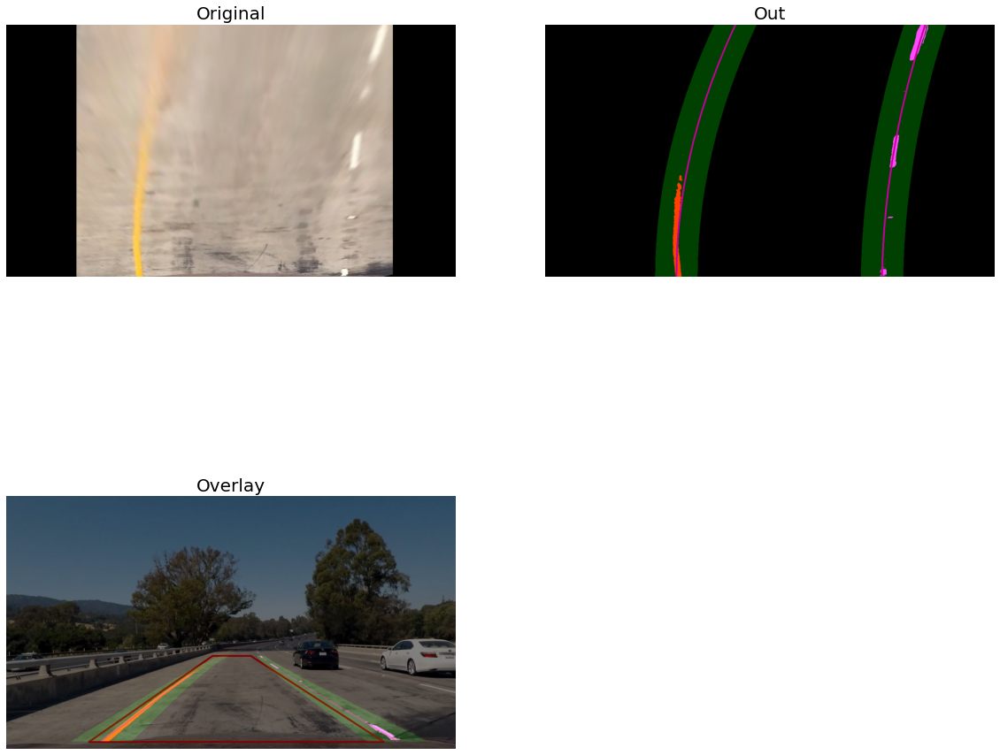

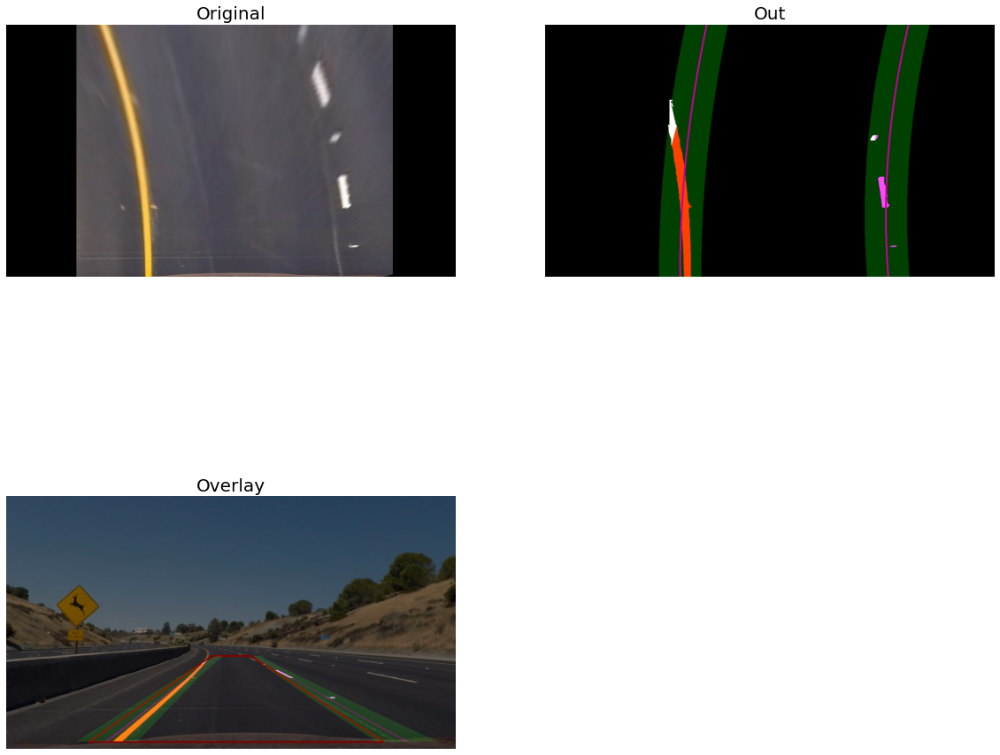

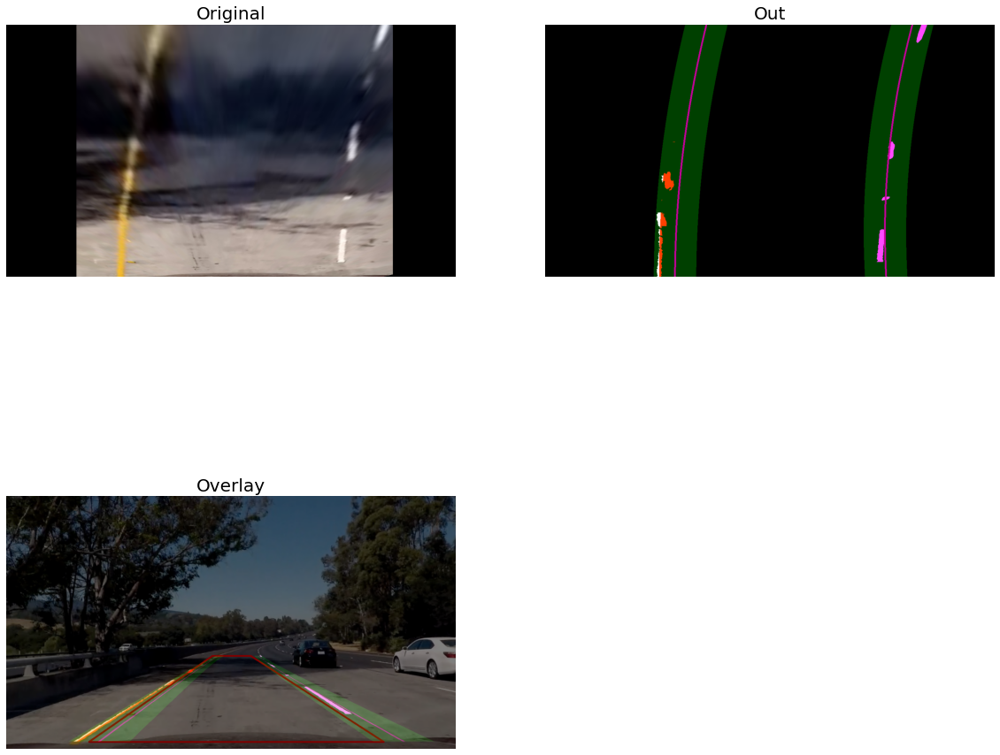

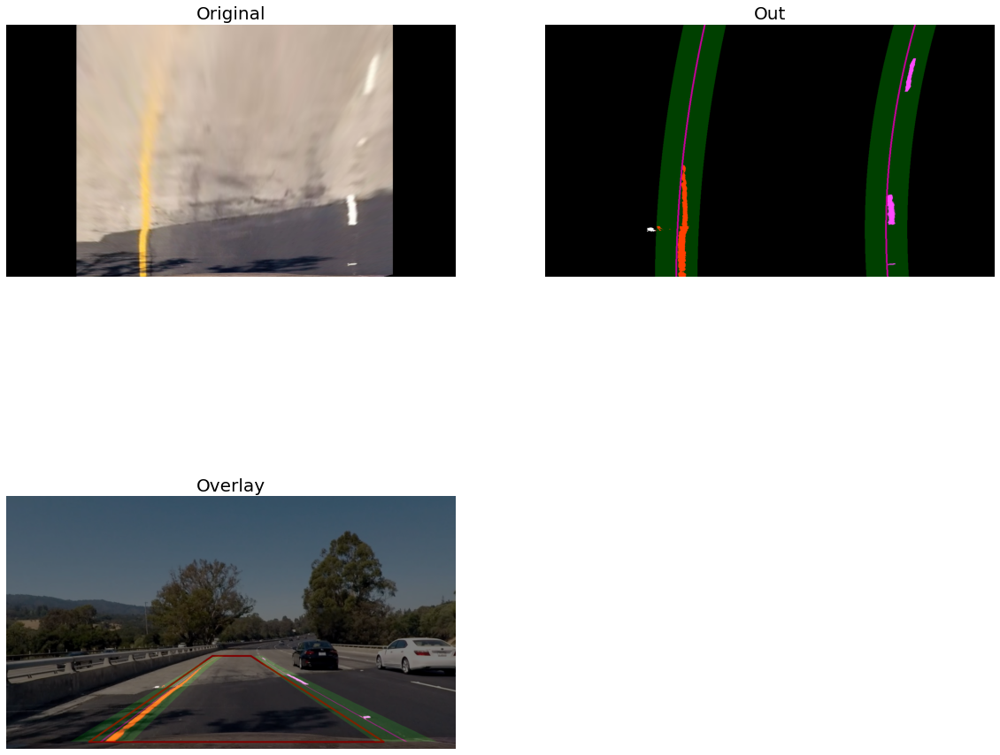

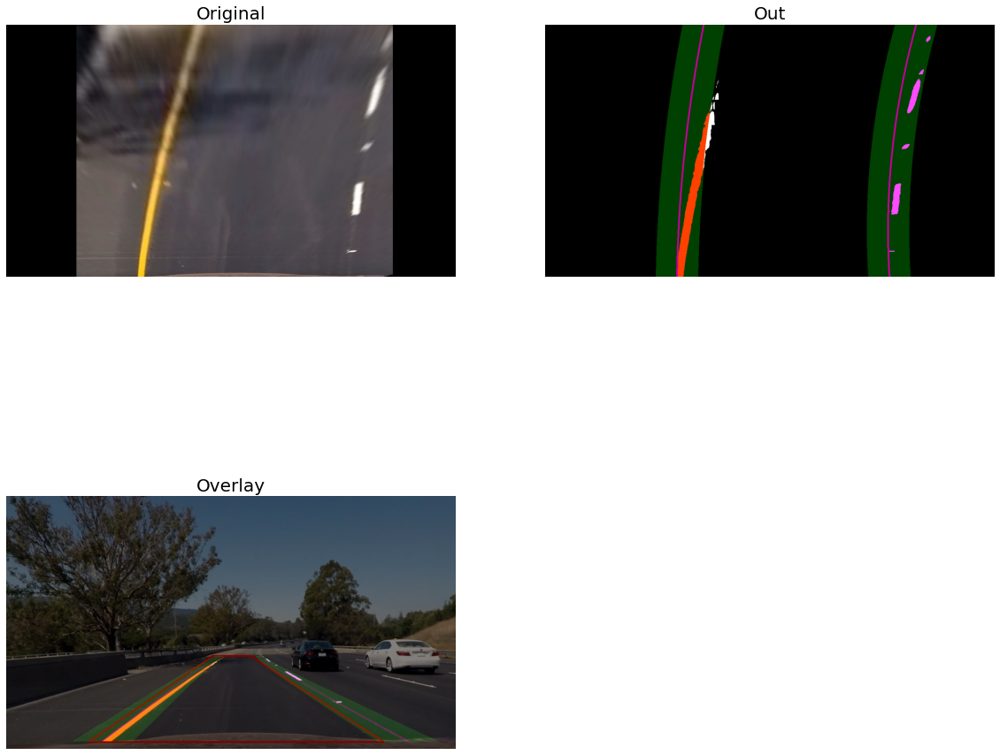

In [ ]:
if 5 in plot_demo:
    cache = np.array([])
    attempts = 0
    max_attempts = 4
    reset = True
    
    for frame_path in test_img_paths:
        img = mpimg.imread(frame_path)
        img ,roi_copy,warped, (M, invM), = get_image(frame_path)
        
        if reset == True:
            binary = get_binary_image(warped)
            ret, out, poly_param = polyfit_sliding_window(binary, visualise=False, diagnostics=True)
            if ret:
                reset = False
                cache = np.array([poly_param])
                
        else:
            out, poly_param = polyfit_adapt_search(warped, poly_param, visualise=False, diagnostics=False)
            if attempts == max_attempts:
                attempts = 0
                reset = True
        
            out_unwarped = cv2.warpPerspective(out, invM, (IMG_SHAPE[1], IMG_SHAPE[0]), flags=cv2.INTER_LINEAR)

            img_overlay = np.copy(img)
            img_overlay = cv2.addWeighted(out_unwarped, 0.5, img, 0.5, 0)
            
            plot_images([(warped, 'Original'), (out, 'Out'), (img_overlay, 'Overlay')], figsize=(20, 18))

## 6. Compute meters/pixel

In [ ]:
def compute_mppx(img, dashed_line_loc, visualise=False):
    '''
    Converts from pixel space to real world space and calculates the metres/pixel
    :param img (ndarray): Warped Image
    :param dashed_line_loc (string): Dashed line location (left/right)
    :param visualise (boolean): Boolean flag for visualisation
    : return (float32, float32): (metres/pixel y direction, metres/pixel x-direction)
    '''
    lane_width = 3.7
    dashed_line_len = 3.048
    
    if dashed_line_loc == 'left':
        y_top = 295
        y_bottom = 405
    elif dashed_line_loc == 'right':
        y_top = 395
        y_bottom = 495
        
    binary = get_binary_image(img)
    histogram = np.sum(binary[int(binary.shape[0] / 2):, :], axis=0)
    midpoint = np.int(histogram.shape[0] / 2)
    
    x_left = np.argmax(histogram[:midpoint])
    x_right = np.argmax(histogram[midpoint:]) + midpoint
    
    x_mppx = lane_width / (x_right - x_left)
    y_mppx = dashed_line_len / (y_bottom - y_top)
    
    if visualise:
        plt.figure(figsize=(10, 8))
        plt.imshow(img)
        plt.axis('off')
        
        if dashed_line_loc == 'left':
            plt.plot((x_left, x_left), (y_top, y_bottom), 'r')
            plt.text(x_left + 10, (y_top + y_bottom) // 2, '{} m'.format(dashed_line_len), color='r', fontsize=20)

        elif dashed_line_loc == 'right':
            plt.plot((x_right, x_right), (y_top, y_bottom), 'r')
            plt.text(x_right + 10, (y_top + y_bottom) // 2, '{} m'.format(dashed_line_len), color='r',fontsize=20)

        plt.plot((x_left, x_right), (img.shape[0] - 200 , img.shape[0] - 200), 'r')
        plt.text((x_left + x_right) // 2, img.shape[0] - 220, '{} m'.format(lane_width), color='r', fontsize=20)
        
    return y_mppx, x_mppx

### 6.1 Demo

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


Average meter/px along x-axis: 0.0063
Average meter/px along y-axis: 0.0291


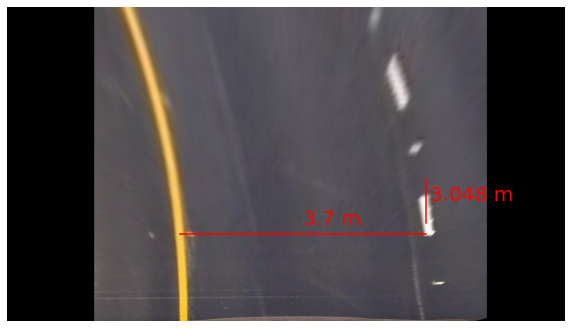

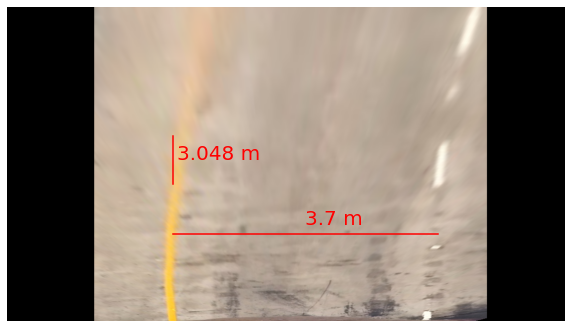

In [ ]:
if 6 in plot_demo:
    visualise = True
else:
    visualise = False

img_copy,roi_copy,img, (M, invM)= get_image(test_img_paths[2])
y_mppx1, x_mppx1 = compute_mppx(img, dashed_line_loc='right', visualise=visualise)

img_copy,roi_copy,img, (M, invM) = get_image(test_img_paths[1])
y_mppx2, x_mppx2 = compute_mppx(img, dashed_line_loc='left', visualise=visualise)

x_mppx = (x_mppx1 + x_mppx2) / 2
y_mppx = (y_mppx1 + y_mppx2) / 2

print('Average meter/px along x-axis: {:.4f}'.format(x_mppx))
print('Average meter/px along y-axis: {:.4f}'.format(y_mppx))

## 7. Compute Lane Line Curvature

In [ ]:
def compute_offset_from_center(poly_param, x_mppx):
    '''
    Computes the offset of the car from the center of the detected lane lines
    :param poly_param (ndarray): Set of 2nd order polynomial coefficients that represent the detected lane lines
    :param x_mppx (float32): metres/pixel in the x-direction
    :return (float32): Offset 
    '''
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(poly_param[0], poly_param[1])
    
    lane_center = (plot_xright[-1] + plot_xleft[-1]) / 2
    car_center = IMG_SHAPE[1] / 2
    
    offset = (lane_center - car_center) * x_mppx
    return offset

def compute_curvature(poly_param, y_mppx, x_mppx):
    '''
    Computes the curvature of the lane lines (in metres)
    :param poly_param (ndarray): Set of 2nd order polynomial coefficients that represent the detected lane lines
    :param y_mppx (float32): metres/pixel in the y-direction
    :param x_mppx (float32): metres/pixel in the x-direction
    :return (float32): Curvature (in metres) 
    '''
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(poly_param[0], poly_param[1])
    
    y_eval = np.max(plot_yleft)

    left_fit_cr = np.polyfit(plot_yleft * y_mppx, plot_xleft * x_mppx, 2)
    right_fit_cr = np.polyfit(plot_yright * y_mppx, plot_xright * x_mppx, 2)
    
    left_curverad = ((1 + (2*left_fit_cr[0]* y_eval*y_mppx + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*y_mppx + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

def draw(img, warped,polyfit_img, invM, poly_param, curve_rad, offset):
    '''
    Utility function to draw the lane boundaries and numerical estimation of lane curvature and vehicle position.
    :param img (ndarray): Original image
    :param warped (ndarray): Warped image
    :param invM (ndarray): Inverse Perpsective Transformation matrix
    :param poly_param (ndarray): Set of 2nd order polynomial coefficients that represent the detected lane lines
    :param curve_rad (float32): Lane line curvature
    :param offset (float32): Car offset
    :return (ndarray): Image with visual display
    '''
    
    undist = undistort(img, mtx, dist)
    warp_zero = np.zeros_like(warped[:,:,0]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    left_fit = poly_param[0]
    right_fit = poly_param[1]
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)
    
    pts_left = np.array([np.transpose(np.vstack([plot_xleft, plot_yleft]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([plot_xright, plot_yright])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Color the road
    polyfit_img_copy = polyfit_img.copy()
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 220, 110))
    cv2.fillPoly(polyfit_img_copy, np.int_([pts]), (0, 220, 110))


    cv2.polylines(polyfit_img_copy, np.int32([pts_left]), isClosed=False,
                  color=(255, 0, 0), thickness=20)
    cv2.polylines(polyfit_img_copy, np.int32([pts_right]), isClosed=False,
                  color=(0, 0, 255), thickness= 20)
                    
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False,
                  color=(255, 0, 255), thickness=20)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False,
                  color=(255, 0, 255), thickness= 20)
    
    # Unwarp and merge with undistorted original image
    unwarped = cv2.warpPerspective(color_warp, invM, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    out = cv2.addWeighted(undist, 1, unwarped, 0.4, 0)
    
    # Write data on the image
    if (left_fit[1] + right_fit[1]) / 2 > 0.05:
        text = 'Left turn, curve radius: {:04.2f} m'.format(curve_rad)
    elif (left_fit[1] + right_fit[1]) / 2 < -0.05:
        text = 'Right turn, curve radius: {:04.2f} m'.format(curve_rad)
    else:
        text = 'Straight'
    
    cv2.putText(out, text, (40, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 0, 0), 2, cv2.LINE_AA)
    
    direction = ''
    if offset > 0:
        direction = 'left'
    elif offset < 0:
        direction = 'right'
    
    text = 'Vehicle is {:0.1f} cm {} of center'.format(abs(offset) * 100, direction)
    cv2.putText(out, text, (40, 110), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0,0, 0), 2, cv2.LINE_AA)
    
    return out ,polyfit_img_copy

### 7.1 Demo

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:132: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

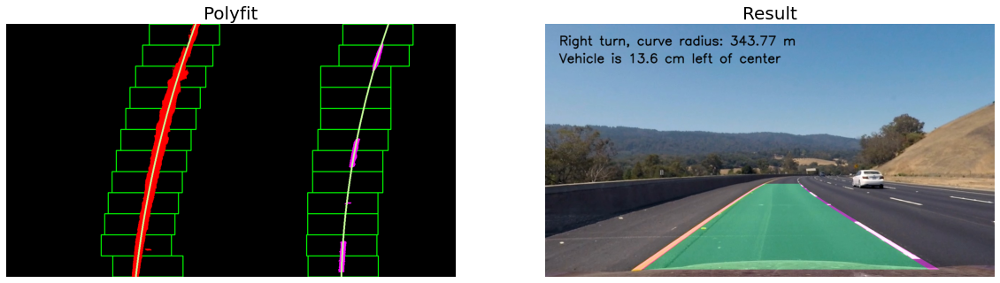

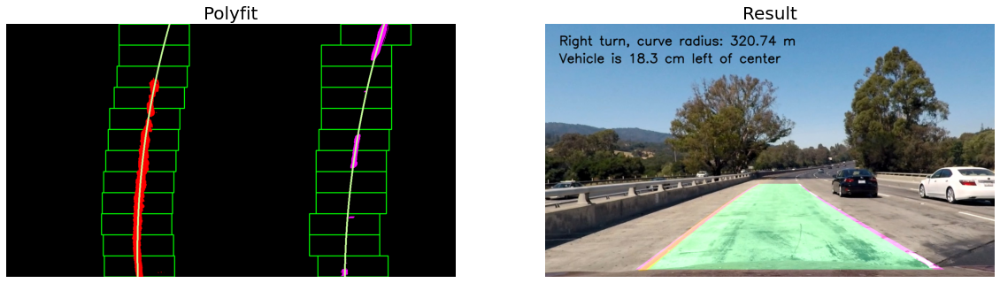

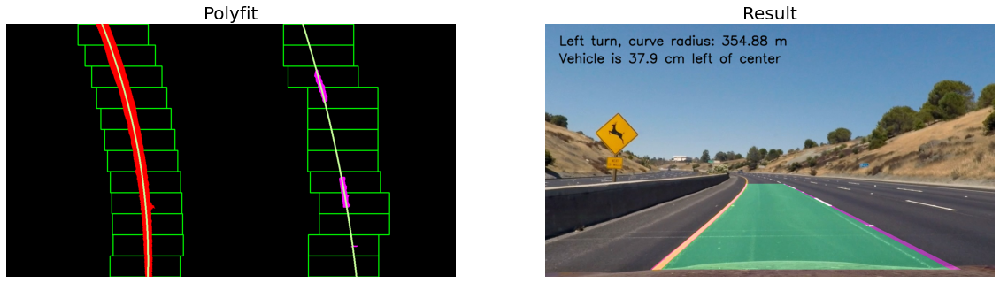

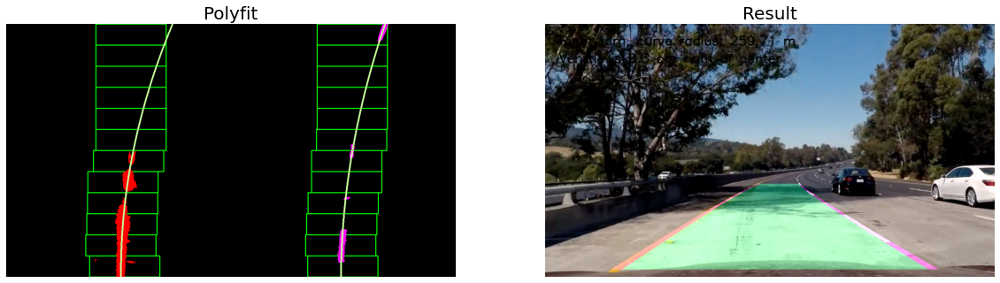

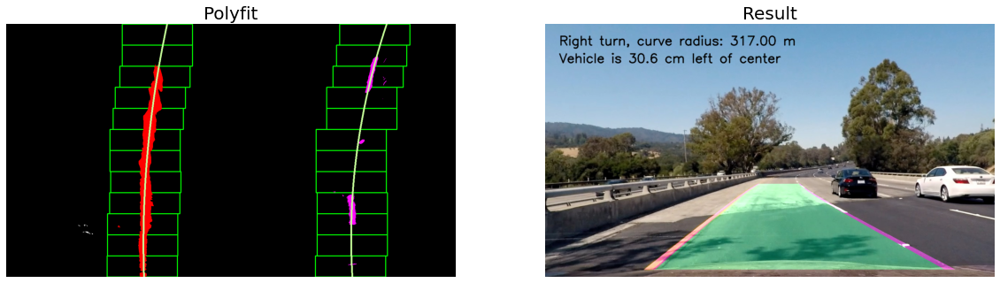

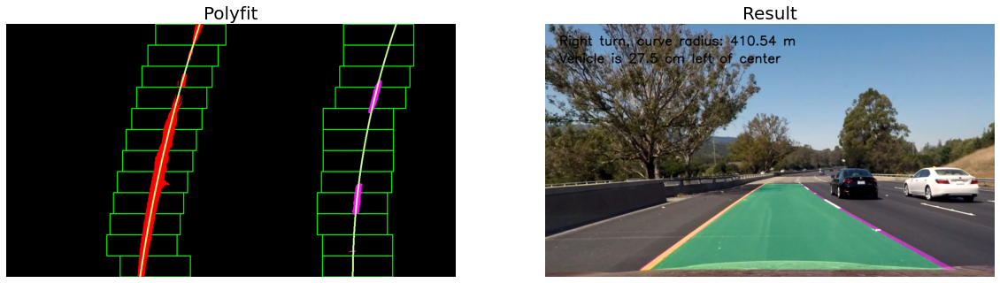

In [ ]:
### DEMO
if 7 in plot_demo:
    cache = np.array([])
    
    for img_path in test_img_paths:#test_img_paths:
        img = mpimg.imread(img_path)
        img_copy,roi_copy,warped, (M, invM) = get_image(img_path)
        
        binary = get_binary_image(warped)
        ret, img_poly, poly_param = polyfit_sliding_window(binary)
        
        left_curverad, right_curverad = compute_curvature(poly_param, y_mppx, x_mppx)
        curvature = (left_curverad + right_curverad) / 2
        offset = compute_offset_from_center(poly_param, x_mppx)
        result,x = draw(img, warped,img_poly, invM, poly_param, curvature, offset)
        
        plot_images([(img_poly, 'Polyfit'), (result, 'Result')])

## 8. Pipeline

In [ ]:
from numpy.lib.polynomial import polyfit
def hconcat_resize_min(im_list, interpolation=cv2.INTER_CUBIC):
    h_min = min(im.shape[0] for im in im_list)
    im_list_resize = [cv2.resize(im, (int(im.shape[1] * h_min / im.shape[0]), h_min), interpolation=interpolation)
                      for im in im_list]
    return cv2.hconcat(im_list_resize)
  
def vconcat_resize_min(im_list, interpolation=cv2.INTER_CUBIC):
    w_min = min(im.shape[1] for im in im_list)
    im_list_resize = [cv2.resize(im, (w_min, int(im.shape[0] * w_min / im.shape[1])), interpolation=interpolation)
                      for im in im_list]
    return cv2.vconcat(im_list_resize)               
def concat_tile_resize(im_list_2d, interpolation=cv2.INTER_CUBIC):
    im_list_v = [vconcat_resize_min(im_list_h, interpolation=cv2.INTER_CUBIC) for im_list_h in im_list_2d]
    return hconcat_resize_min(im_list_v, interpolation=cv2.INTER_CUBIC)  

def pipeline(img, visualise=False, diagnostics=False):
    global cache
    global poly_param # Important for successive calls to the pipeline
    global attempts
    global reset
    max_attempts = 5
    
    result = np.copy(img)
    img_copy,roi_copy,warped, (M, invM) = preprocess_image(img)
    title = ''
   
    try:
        if reset == True:
            title = 'Sliding window'
            if diagnostics: print(title)
            
            binary = get_binary_image(warped)
            ret, img_poly, poly_param = polyfit_sliding_window(binary, diagnostics=diagnostics)
            if ret:
                if diagnostics: print('Success!')
                reset = False
                cache = np.array([poly_param])
            else:
                if len(img_poly) == 0:
                    print('Sliding window failed!')
                    return img
                
        else:
            title = 'Adaptive Search'
            if diagnostics: print(title)
            
            img_poly, poly_param = polyfit_adapt_search(warped, poly_param, diagnostics=diagnostics)
            if attempts == max_attempts:
                if diagnostics: print('Resetting...')
                reset = True
                attempts = 0

        polyfit_copy = img_poly.copy()
        polyfit_copy_2 = img_poly.copy()
        #binary_copy =binary.copy()
        cv2.putText(polyfit_copy, 'Sliding ', (2, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255, 255), 3, cv2.LINE_AA)
        cv2.putText(polyfit_copy, 'window ', (2, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255, 255), 3, cv2.LINE_AA)
        cv2.putText(polyfit_copy, 'Result', (2, 130), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255, 255), 3, cv2.LINE_AA)
        cv2.putText(roi_copy, "Bird's Eye ", (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0,225, 0), 3, cv2.LINE_AA)
        cv2.putText(roi_copy, "View ", (20, 120), cv2.FONT_HERSHEY_SIMPLEX, 1.3, (0,225, 0), 3, cv2.LINE_AA)
        cv2.putText(roi_copy, "perspective", (20, 160), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0,225, 0), 3, cv2.LINE_AA)
        #binary_image = np.dstack((binary_copy, binary_copy, binary_copy)) * 255
        cv2.putText(img_copy, "After Distortion correction", (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0,225, 0), 3, cv2.LINE_AA)
        # cv2.putText(binary_image, "Combined ", (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0,225, 0), 3, cv2.LINE_AA)
        # cv2.putText(binary_image, "binary ", (20, 120), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0,225, 0), 3, cv2.LINE_AA)
        # cv2.putText(binary_image, "threshold", (20, 160), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0,225, 0), 3, cv2.LINE_AA)
        left_curverad, right_curverad = compute_curvature(poly_param, y_mppx, x_mppx)
        offset = compute_offset_from_center(poly_param, x_mppx)
        result , x= draw(img, warped,polyfit_copy_2, invM, poly_param, (left_curverad + right_curverad) / 2, offset)
        blended_warped_poly = cv2.addWeighted(img_poly, 0.6, warped, 1, 0)
        cv2.putText(blended_warped_poly, 'Blended ', (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255, 255), 3, cv2.LINE_AA)
        cv2.putText(blended_warped_poly, 'warped ', (20, 120), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255, 255), 3, cv2.LINE_AA)
        cv2.putText(blended_warped_poly, 'polyfit', (20, 170), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255, 255), 3, cv2.LINE_AA)
        cv2.putText(x, 'polynomial ', (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255, 255), 3, cv2.LINE_AA)
        cv2.putText(x, 'fit', (20, 130), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255, 255), 3, cv2.LINE_AA)
        raw1 = concat_tile_resize([[result],[img_copy,roi_copy]])
        raw2 =hconcat_resize_min([x,blended_warped_poly, polyfit_copy])
        final = vconcat_resize_min([raw1,raw2])
    
      
       

        if visualise:
            plt.figure(figsize=(20, 12))
            plt.title(title)
            plt.imshow(final)
            plt.axis('off')

        return final 
    
    except Exception as e:
        print(e)
        return img

### 8.1 Demo

Demo of consecutive frames
Sliding window


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:132: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

Success!


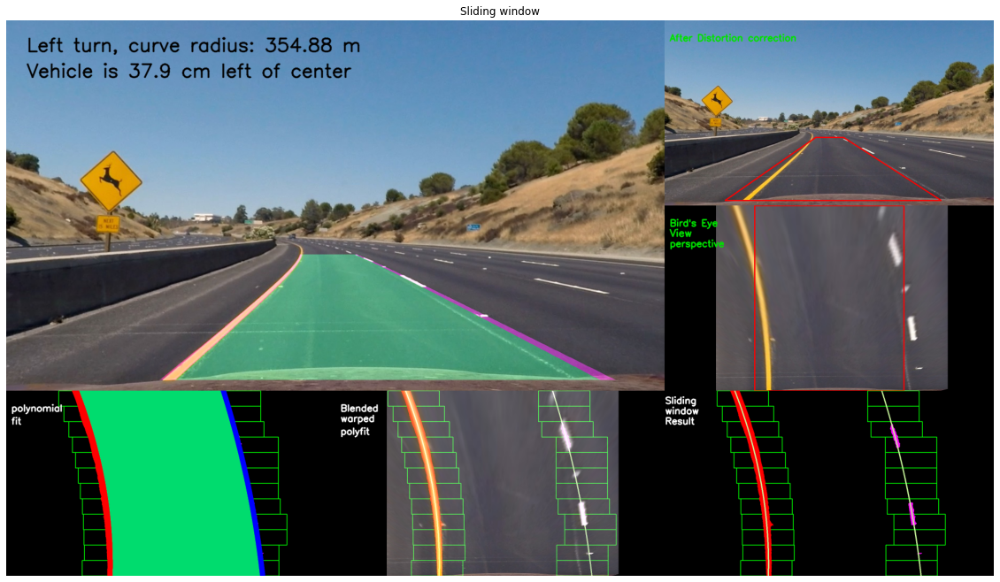

In [ ]:

if 8 in plot_demo:
    print('Demo of consecutive frames')
    
    cache = np.array([])
    attempts = 0
    reset = True
    img = mpimg.imread(test_img_paths[2])
    result = pipeline(img, visualise=True, diagnostics=1)
   


Demo of consecutive frames
Sliding window


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:132: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

Success!
Adaptive Search


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecat

Adaptive Search
Adaptive Search
Adaptive Search
Adaptive Search


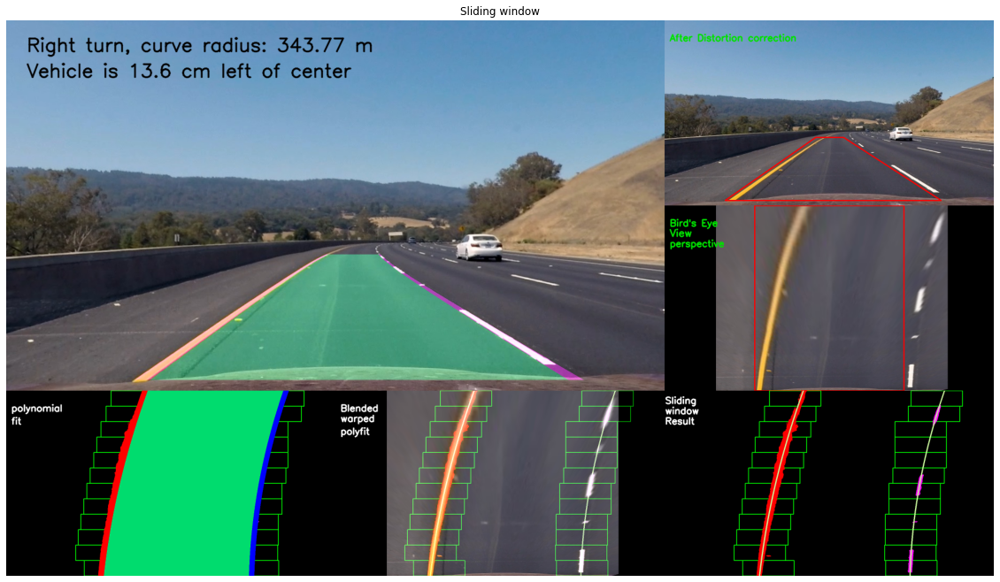

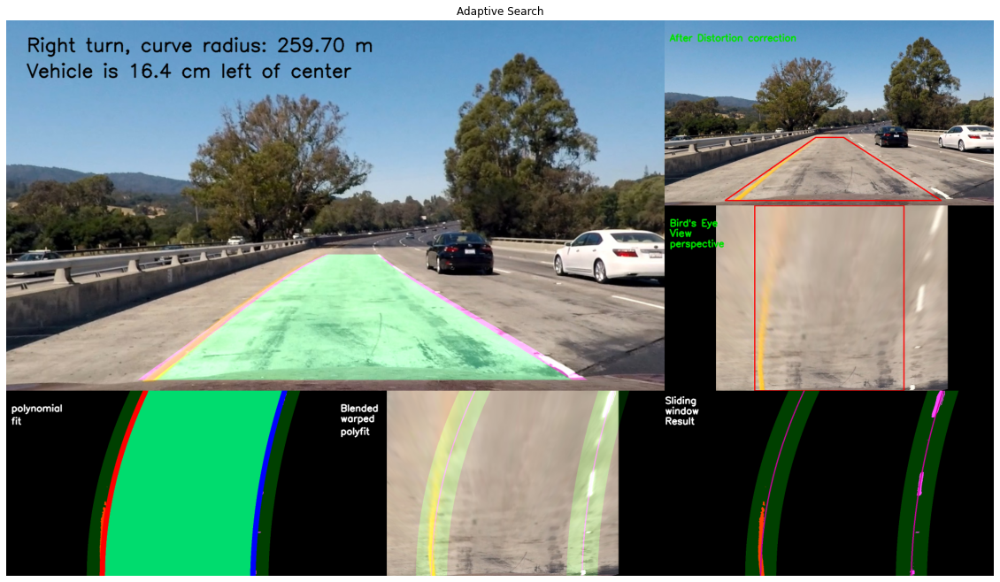

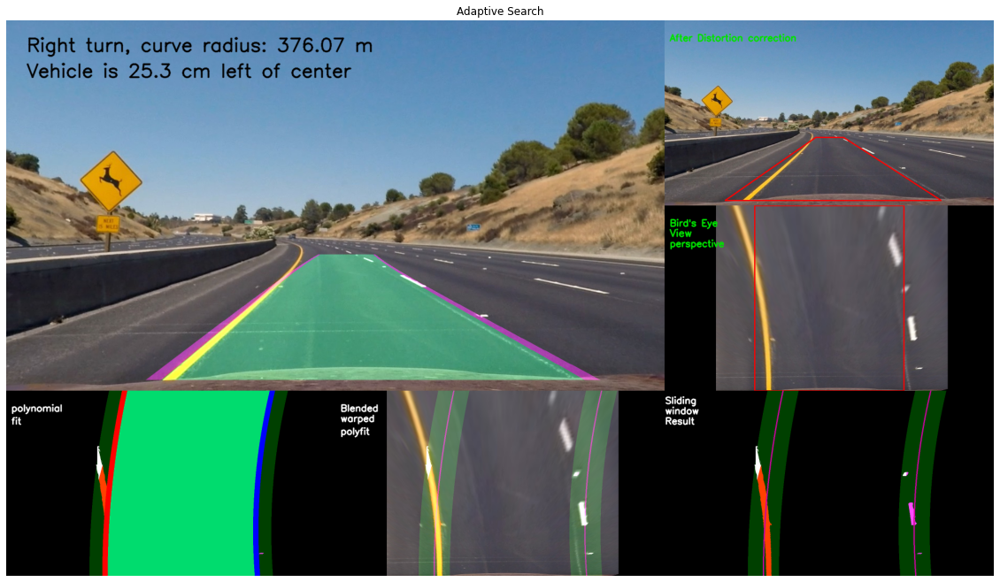

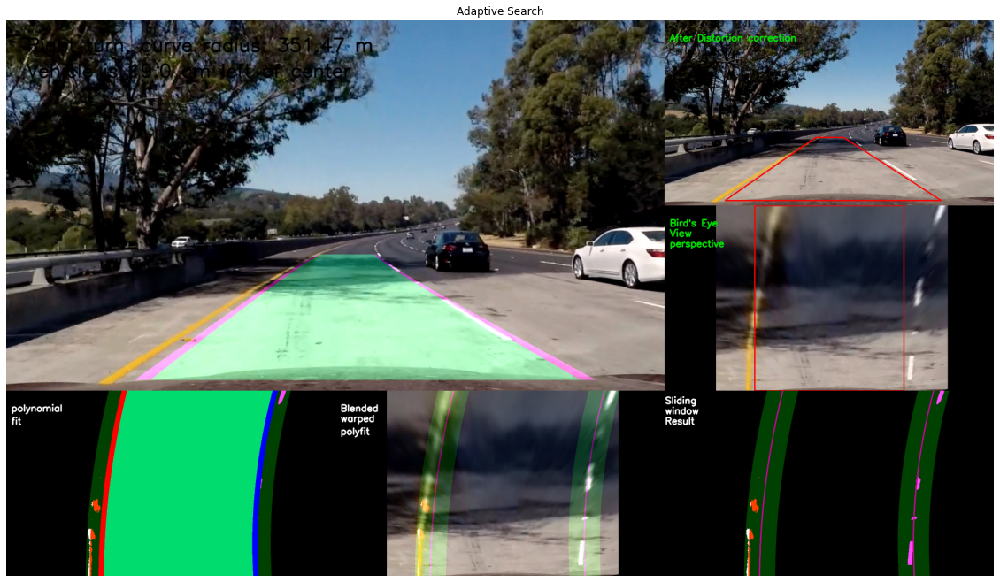

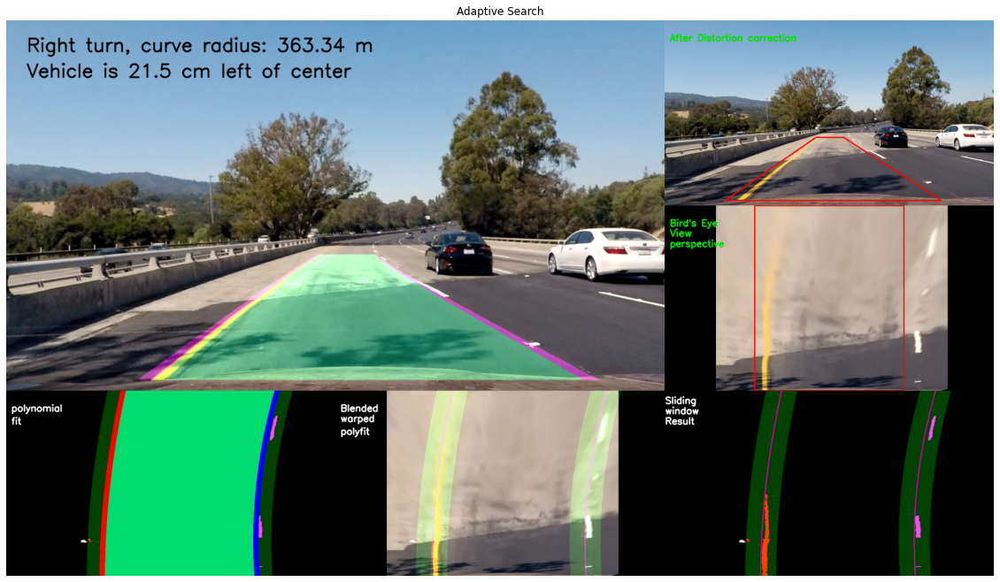

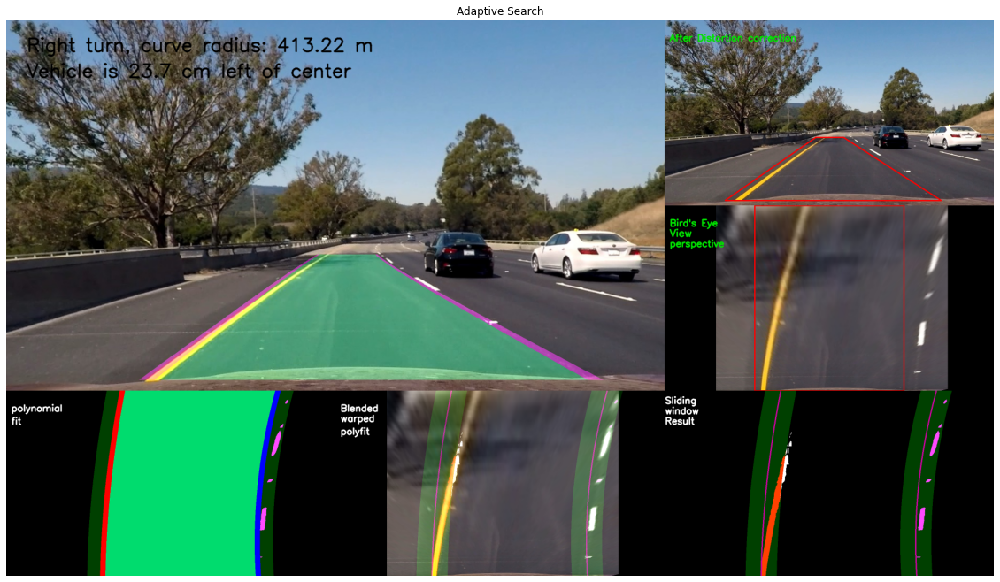

In [ ]:
if 8 in plot_demo:
    print('Demo of consecutive frames')
    
    cache = np.array([])
    attempts = 0
    reset = True
    
    for img_path in test_img_paths:
        img = mpimg.imread(img_path)
        result = pipeline(img, visualise=True, diagnostics=1)

## 9. Process Video

In [ ]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

process_frame = lambda frame: pipeline(frame, diagnostics=1)

# Pipeline initialisation
cache = np.array([])
attempts = 0
reset = True

video_output = 'project_video_output.mp4'
video_input = VideoFileClip('/content/project_video.mp4')#.subclip(18,27)                          
processed_video = video_input.fl_image(process_frame)
%time processed_video.write_videofile(video_output, audio=False)

# video1_output = 'challenge_video_output.mp4'
# video1_input = VideoFileClip('/content/challenge_video.mp4')#.subclip(4, 7)                          
# processed_video = video1_input.fl_image(process_frame)
# %time processed_video.write_videofile(video1_output, audio=False)

# video2_output = 'harder_challenge_video_output.mp4'
# video2_input = VideoFileClip('/content/harder_challenge_video.mp4')                          
# processed_video = video2_input.fl_image(process_frame)#.subclip(0,5)
# %time processed_video.write_videofile(video2_output, audio=False)

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)3211264/45929032 bytes (7.0%)6455296/45929032 bytes (14.1%)9887744/45929032 bytes (21.5%)13271040/45929032 bytes (28.9%)16588800/45929032 bytes (36.1%)19873792/45929032 bytes (43.3%)23060480/45929032 bytes (50.2%)26370048/45929032 bytes (57.4%)29638656/45929032 bytes (64.5%)32915456/45929032 bytes (71.7%)36143104/45929032 bytes (78.7%)39354368/45929032 bytes (85.7%)

  0%|          | 0/1261 [00:00<?, ?it/s]

Adaptive Search


  0%|          | 1/1261 [00:00<05:19,  3.94it/s]

Adaptive Search


  0%|          | 3/1261 [00:00<05:38,  3.71it/s]

Adaptive Search


  0%|          | 4/1261 [00:01<05:30,  3.81it/s]

Adaptive Search


  0%|          | 5/1261 [00:01<05:26,  3.85it/s]

Adaptive Search


  0%|          | 6/1261 [00:01<05:23,  3.88it/s]

Adaptive Search
Adaptive Search


  1%|          | 8/1261 [00:02<05:23,  3.88it/s]

Adaptive Search


  1%|          | 9/1261 [00:02<05:21,  3.90it/s]

Adaptive Search


  1%|          | 10/1261 [00:02<05:12,  4.01it/s]

Adaptive Search


  1%|          | 11/1261 [00:02<05:09,  4.04it/s]

Adaptive Search


  1%|          | 12/1261 [00:03<05:07,  4.06it/s]

Adaptive Search
Adaptive Search


  1%|          | 13/1261 [00:03<05:23,  3.86it/s]

Adaptive Search


  1%|          | 14/1261 [00:03<06:39,  3.12it/s]

Adaptive Search


  1%|          | 15/1261 [00:04<07:26,  2.79it/s]

Adaptive Search


  1%|▏         | 16/1261 [00:04<08:00,  2.59it/s]

Adaptive Search


  1%|▏         | 18/1261 [00:05<07:24,  2.79it/s]

Adaptive Search


  2%|▏         | 19/1261 [00:05<06:36,  3.13it/s]

Adaptive Search


  2%|▏         | 20/1261 [00:05<06:08,  3.37it/s]

Adaptive Search
Adaptive Search


  2%|▏         | 21/1261 [00:06<06:24,  3.22it/s]

Adaptive Search


  2%|▏         | 22/1261 [00:06<06:51,  3.01it/s]

Adaptive Search


  2%|▏         | 23/1261 [00:07<07:33,  2.73it/s]

Adaptive Search


  2%|▏         | 24/1261 [00:07<07:50,  2.63it/s]

Adaptive Search


  2%|▏         | 26/1261 [00:08<06:41,  3.07it/s]

Adaptive Search


  2%|▏         | 27/1261 [00:08<06:12,  3.32it/s]

Adaptive Search
Adaptive Search


  2%|▏         | 28/1261 [00:08<06:29,  3.17it/s]

Adaptive Search


  2%|▏         | 29/1261 [00:08<06:23,  3.21it/s]

Adaptive Search


  2%|▏         | 30/1261 [00:09<06:42,  3.06it/s]

Adaptive Search


  2%|▏         | 31/1261 [00:09<08:06,  2.53it/s]

Adaptive Search


  3%|▎         | 32/1261 [00:10<08:10,  2.50it/s]

Adaptive Search


  3%|▎         | 33/1261 [00:10<08:19,  2.46it/s]

Adaptive Search


  3%|▎         | 35/1261 [00:11<08:06,  2.52it/s]

Adaptive Search


  3%|▎         | 36/1261 [00:11<07:04,  2.88it/s]

Adaptive Search


  3%|▎         | 37/1261 [00:11<06:23,  3.19it/s]

Adaptive Search


  3%|▎         | 38/1261 [00:12<05:56,  3.43it/s]

Adaptive Search


  3%|▎         | 39/1261 [00:12<05:37,  3.63it/s]

Adaptive Search


  3%|▎         | 40/1261 [00:12<05:19,  3.82it/s]

Adaptive Search


  3%|▎         | 41/1261 [00:12<05:06,  3.98it/s]

Adaptive Search


  3%|▎         | 42/1261 [00:13<05:05,  3.99it/s]

Adaptive Search
Adaptive Search


  3%|▎         | 43/1261 [00:13<05:36,  3.62it/s]

Adaptive Search


  3%|▎         | 44/1261 [00:13<06:15,  3.24it/s]

Adaptive Search


  4%|▎         | 46/1261 [00:14<06:14,  3.25it/s]

Adaptive Search
Adaptive Search


  4%|▎         | 47/1261 [00:14<06:06,  3.31it/s]

Adaptive Search


  4%|▍         | 48/1261 [00:15<06:17,  3.21it/s]

Adaptive Search


  4%|▍         | 49/1261 [00:15<06:20,  3.19it/s]

Adaptive Search


  4%|▍         | 50/1261 [00:15<06:13,  3.24it/s]

Adaptive Search


  4%|▍         | 51/1261 [00:16<06:08,  3.29it/s]

Adaptive Search


  4%|▍         | 52/1261 [00:16<06:20,  3.18it/s]

Adaptive Search


  4%|▍         | 53/1261 [00:16<06:27,  3.12it/s]

Adaptive Search


  4%|▍         | 54/1261 [00:17<06:27,  3.11it/s]

Adaptive Search


  4%|▍         | 55/1261 [00:17<06:20,  3.17it/s]

Adaptive Search


  4%|▍         | 56/1261 [00:17<06:38,  3.03it/s]

Adaptive Search


  5%|▍         | 57/1261 [00:18<06:36,  3.04it/s]

Adaptive Search


  5%|▍         | 58/1261 [00:18<06:26,  3.11it/s]

Adaptive Search


  5%|▍         | 59/1261 [00:18<06:16,  3.19it/s]

Adaptive Search


  5%|▍         | 60/1261 [00:19<06:41,  2.99it/s]

Adaptive Search


  5%|▍         | 61/1261 [00:19<06:41,  2.99it/s]

Adaptive Search


  5%|▍         | 62/1261 [00:19<06:24,  3.12it/s]

Adaptive Search


  5%|▍         | 63/1261 [00:19<06:14,  3.20it/s]

Adaptive Search


  5%|▌         | 64/1261 [00:20<06:33,  3.04it/s]

Adaptive Search


  5%|▌         | 65/1261 [00:20<06:34,  3.03it/s]

Adaptive Search


  5%|▌         | 66/1261 [00:20<06:23,  3.11it/s]

Adaptive Search


  5%|▌         | 67/1261 [00:21<06:22,  3.12it/s]

Adaptive Search


  5%|▌         | 68/1261 [00:21<06:29,  3.06it/s]

Adaptive Search


  5%|▌         | 69/1261 [00:21<06:50,  2.90it/s]

Adaptive Search


  6%|▌         | 70/1261 [00:22<06:33,  3.02it/s]

Adaptive Search


  6%|▌         | 71/1261 [00:22<06:20,  3.13it/s]

Adaptive Search


  6%|▌         | 72/1261 [00:22<06:32,  3.03it/s]

Adaptive Search


  6%|▌         | 73/1261 [00:23<06:38,  2.98it/s]

Adaptive Search


  6%|▌         | 74/1261 [00:23<06:32,  3.03it/s]

Adaptive Search


  6%|▌         | 75/1261 [00:23<06:20,  3.11it/s]

Adaptive Search


  6%|▌         | 76/1261 [00:24<06:28,  3.05it/s]

Adaptive Search


  6%|▌         | 77/1261 [00:24<06:34,  3.00it/s]

Adaptive Search


  6%|▌         | 78/1261 [00:24<06:36,  2.99it/s]

Adaptive Search


  6%|▋         | 79/1261 [00:25<06:28,  3.05it/s]

Adaptive Search


  6%|▋         | 80/1261 [00:25<06:36,  2.98it/s]

Adaptive Search


  6%|▋         | 81/1261 [00:25<06:34,  2.99it/s]

Adaptive Search


  7%|▋         | 82/1261 [00:26<06:25,  3.06it/s]

Adaptive Search


  7%|▋         | 83/1261 [00:26<06:15,  3.14it/s]

Adaptive Search


  7%|▋         | 84/1261 [00:27<08:22,  2.34it/s]

Adaptive Search


  7%|▋         | 85/1261 [00:27<08:09,  2.40it/s]

Adaptive Search


  7%|▋         | 86/1261 [00:28<08:42,  2.25it/s]

Adaptive Search


  7%|▋         | 87/1261 [00:28<08:32,  2.29it/s]

Adaptive Search


  7%|▋         | 88/1261 [00:28<07:55,  2.47it/s]

Adaptive Search


  7%|▋         | 89/1261 [00:29<07:44,  2.53it/s]

Adaptive Search


  7%|▋         | 90/1261 [00:29<07:12,  2.71it/s]

Adaptive Search


  7%|▋         | 91/1261 [00:29<06:53,  2.83it/s]

Adaptive Search


  7%|▋         | 92/1261 [00:30<06:59,  2.78it/s]

Adaptive Search


  7%|▋         | 93/1261 [00:30<07:01,  2.77it/s]

Adaptive Search


  7%|▋         | 94/1261 [00:30<06:47,  2.86it/s]

Adaptive Search


  8%|▊         | 95/1261 [00:31<06:43,  2.89it/s]

Adaptive Search


  8%|▊         | 96/1261 [00:31<07:07,  2.72it/s]

Adaptive Search


  8%|▊         | 97/1261 [00:32<07:01,  2.76it/s]

Adaptive Search


  8%|▊         | 98/1261 [00:32<06:39,  2.91it/s]

Adaptive Search


  8%|▊         | 99/1261 [00:32<06:23,  3.03it/s]

Adaptive Search


  8%|▊         | 100/1261 [00:32<06:22,  3.03it/s]

Adaptive Search


  8%|▊         | 101/1261 [00:33<06:30,  2.97it/s]

Adaptive Search


  8%|▊         | 102/1261 [00:33<06:24,  3.02it/s]

Adaptive Search


  8%|▊         | 103/1261 [00:33<06:09,  3.13it/s]

Adaptive Search


  8%|▊         | 104/1261 [00:34<06:21,  3.03it/s]

Adaptive Search


  8%|▊         | 105/1261 [00:34<06:32,  2.95it/s]

Adaptive Search


  8%|▊         | 106/1261 [00:34<06:19,  3.04it/s]

Adaptive Search


  8%|▊         | 107/1261 [00:35<06:10,  3.11it/s]

Adaptive Search


  9%|▊         | 108/1261 [00:35<06:23,  3.01it/s]

Adaptive Search


  9%|▊         | 109/1261 [00:35<06:30,  2.95it/s]

Adaptive Search


  9%|▊         | 110/1261 [00:36<06:15,  3.07it/s]

Adaptive Search


  9%|▉         | 111/1261 [00:36<06:06,  3.14it/s]

Adaptive Search


  9%|▉         | 112/1261 [00:36<06:29,  2.95it/s]

Adaptive Search


  9%|▉         | 113/1261 [00:37<06:26,  2.97it/s]

Adaptive Search


  9%|▉         | 114/1261 [00:37<06:10,  3.09it/s]

Adaptive Search


  9%|▉         | 115/1261 [00:37<06:02,  3.16it/s]

Adaptive Search


  9%|▉         | 116/1261 [00:38<06:26,  2.96it/s]

Adaptive Search


  9%|▉         | 117/1261 [00:38<06:21,  3.00it/s]

Adaptive Search


  9%|▉         | 118/1261 [00:38<06:12,  3.06it/s]

Adaptive Search


  9%|▉         | 119/1261 [00:39<06:03,  3.14it/s]

Adaptive Search


 10%|▉         | 120/1261 [00:39<06:05,  3.12it/s]

Adaptive Search


 10%|▉         | 121/1261 [00:39<06:18,  3.01it/s]

Adaptive Search


 10%|▉         | 122/1261 [00:40<06:16,  3.03it/s]

Adaptive Search


 10%|▉         | 123/1261 [00:40<06:03,  3.13it/s]

Adaptive Search


 10%|▉         | 124/1261 [00:40<06:13,  3.04it/s]

Adaptive Search


 10%|▉         | 125/1261 [00:41<06:31,  2.90it/s]

Adaptive Search


 10%|▉         | 126/1261 [00:41<06:17,  3.01it/s]

Adaptive Search


 10%|█         | 127/1261 [00:41<06:03,  3.12it/s]

Adaptive Search


 10%|█         | 128/1261 [00:42<06:14,  3.02it/s]

Adaptive Search


 10%|█         | 129/1261 [00:42<06:16,  3.01it/s]

Adaptive Search


 10%|█         | 130/1261 [00:42<06:07,  3.08it/s]

Adaptive Search


 10%|█         | 131/1261 [00:43<05:57,  3.16it/s]

Adaptive Search


 10%|█         | 132/1261 [00:43<06:10,  3.05it/s]

Adaptive Search


 11%|█         | 133/1261 [00:43<06:11,  3.04it/s]

Adaptive Search


 11%|█         | 134/1261 [00:44<06:10,  3.04it/s]

Adaptive Search


 11%|█         | 135/1261 [00:44<05:59,  3.13it/s]

Adaptive Search


 11%|█         | 136/1261 [00:44<06:03,  3.10it/s]

Adaptive Search


 11%|█         | 137/1261 [00:45<06:11,  3.02it/s]

Adaptive Search


 11%|█         | 138/1261 [00:45<06:09,  3.04it/s]

Adaptive Search


 11%|█         | 139/1261 [00:45<05:59,  3.12it/s]

Adaptive Search


 11%|█         | 140/1261 [00:46<06:22,  2.93it/s]

Adaptive Search


 11%|█         | 141/1261 [00:46<06:11,  3.01it/s]

Adaptive Search


 11%|█▏        | 142/1261 [00:46<05:59,  3.11it/s]

Adaptive Search


 11%|█▏        | 143/1261 [00:47<05:50,  3.19it/s]

Adaptive Search


 11%|█▏        | 144/1261 [00:47<05:49,  3.20it/s]

Adaptive Search


 11%|█▏        | 145/1261 [00:47<06:01,  3.09it/s]

Adaptive Search


 12%|█▏        | 146/1261 [00:48<06:01,  3.08it/s]

Adaptive Search


 12%|█▏        | 147/1261 [00:48<05:51,  3.17it/s]

Adaptive Search


 12%|█▏        | 148/1261 [00:48<06:16,  2.95it/s]

Adaptive Search


 12%|█▏        | 149/1261 [00:49<06:14,  2.97it/s]

Adaptive Search


 12%|█▏        | 150/1261 [00:49<06:05,  3.04it/s]

Adaptive Search


 12%|█▏        | 151/1261 [00:49<06:00,  3.08it/s]

Adaptive Search


 12%|█▏        | 152/1261 [00:50<06:33,  2.82it/s]

Adaptive Search


 12%|█▏        | 153/1261 [00:50<06:28,  2.86it/s]

Adaptive Search


 12%|█▏        | 154/1261 [00:50<06:09,  3.00it/s]

Adaptive Search


 12%|█▏        | 155/1261 [00:51<06:00,  3.07it/s]

Adaptive Search


 12%|█▏        | 156/1261 [00:51<06:21,  2.90it/s]

Adaptive Search


 12%|█▏        | 157/1261 [00:51<06:08,  2.99it/s]

Adaptive Search


 13%|█▎        | 158/1261 [00:52<05:57,  3.09it/s]

Adaptive Search


 13%|█▎        | 159/1261 [00:52<05:49,  3.16it/s]

Adaptive Search


 13%|█▎        | 160/1261 [00:52<06:11,  2.97it/s]

Adaptive Search


 13%|█▎        | 161/1261 [00:53<06:07,  2.99it/s]

Adaptive Search


 13%|█▎        | 162/1261 [00:53<05:57,  3.07it/s]

Adaptive Search


 13%|█▎        | 163/1261 [00:53<05:47,  3.16it/s]

Adaptive Search


 13%|█▎        | 164/1261 [00:53<05:58,  3.06it/s]

Adaptive Search


 13%|█▎        | 165/1261 [00:54<06:05,  3.00it/s]

Adaptive Search


 13%|█▎        | 166/1261 [00:54<05:51,  3.11it/s]

Adaptive Search


 13%|█▎        | 167/1261 [00:54<05:46,  3.16it/s]

Adaptive Search


 13%|█▎        | 168/1261 [00:55<06:04,  3.00it/s]

Adaptive Search


 13%|█▎        | 169/1261 [00:55<06:07,  2.97it/s]

Adaptive Search


 13%|█▎        | 170/1261 [00:55<05:53,  3.09it/s]

Adaptive Search


 14%|█▎        | 171/1261 [00:56<05:46,  3.15it/s]

Adaptive Search


 14%|█▎        | 172/1261 [00:56<06:03,  3.00it/s]

Adaptive Search


 14%|█▎        | 173/1261 [00:56<06:05,  2.98it/s]

Adaptive Search


 14%|█▍        | 174/1261 [00:57<05:53,  3.08it/s]

Adaptive Search


 14%|█▍        | 175/1261 [00:57<05:45,  3.14it/s]

Adaptive Search


 14%|█▍        | 176/1261 [00:57<05:59,  3.01it/s]

Adaptive Search


 14%|█▍        | 177/1261 [00:58<05:59,  3.01it/s]

Adaptive Search


 14%|█▍        | 178/1261 [00:58<05:46,  3.12it/s]

Adaptive Search


 14%|█▍        | 179/1261 [00:58<05:36,  3.22it/s]

Adaptive Search


 14%|█▍        | 180/1261 [00:59<05:51,  3.07it/s]

Adaptive Search


 14%|█▍        | 181/1261 [00:59<06:01,  2.99it/s]

Adaptive Search


 14%|█▍        | 182/1261 [00:59<05:48,  3.09it/s]

Adaptive Search


 15%|█▍        | 183/1261 [01:00<05:40,  3.16it/s]

Adaptive Search


 15%|█▍        | 184/1261 [01:00<06:00,  2.99it/s]

Adaptive Search


 15%|█▍        | 185/1261 [01:00<06:00,  2.98it/s]

Adaptive Search


 15%|█▍        | 186/1261 [01:01<05:48,  3.08it/s]

Adaptive Search


 15%|█▍        | 187/1261 [01:01<05:41,  3.14it/s]

Adaptive Search


 15%|█▍        | 188/1261 [01:01<06:05,  2.94it/s]

Adaptive Search


 15%|█▍        | 189/1261 [01:02<06:00,  2.97it/s]

Adaptive Search


 15%|█▌        | 190/1261 [01:02<05:52,  3.04it/s]

Adaptive Search


 15%|█▌        | 191/1261 [01:02<05:38,  3.16it/s]

Adaptive Search


 15%|█▌        | 192/1261 [01:03<05:51,  3.04it/s]

Adaptive Search


 15%|█▌        | 193/1261 [01:03<06:05,  2.92it/s]

Adaptive Search


 15%|█▌        | 194/1261 [01:03<05:49,  3.05it/s]

Adaptive Search


 15%|█▌        | 195/1261 [01:04<05:42,  3.12it/s]

Adaptive Search


 16%|█▌        | 196/1261 [01:04<06:05,  2.91it/s]

Adaptive Search


 16%|█▌        | 197/1261 [01:04<06:01,  2.94it/s]

Adaptive Search


 16%|█▌        | 198/1261 [01:05<05:50,  3.03it/s]

Adaptive Search


 16%|█▌        | 199/1261 [01:05<05:50,  3.03it/s]

Adaptive Search


 16%|█▌        | 200/1261 [01:05<05:44,  3.08it/s]

Adaptive Search


 16%|█▌        | 201/1261 [01:06<05:49,  3.04it/s]

Adaptive Search


 16%|█▌        | 202/1261 [01:06<05:56,  2.97it/s]

Adaptive Search


 16%|█▌        | 203/1261 [01:06<05:46,  3.05it/s]

Adaptive Search


 16%|█▌        | 204/1261 [01:07<05:55,  2.98it/s]

Adaptive Search


 16%|█▋        | 205/1261 [01:07<06:00,  2.93it/s]

Adaptive Search


 16%|█▋        | 206/1261 [01:07<05:50,  3.01it/s]

Adaptive Search


 16%|█▋        | 207/1261 [01:08<05:36,  3.14it/s]

Adaptive Search


 16%|█▋        | 208/1261 [01:08<05:45,  3.05it/s]

Adaptive Search


 17%|█▋        | 209/1261 [01:08<05:51,  3.00it/s]

Adaptive Search


 17%|█▋        | 210/1261 [01:09<05:40,  3.09it/s]

Adaptive Search


 17%|█▋        | 211/1261 [01:09<05:33,  3.15it/s]

Adaptive Search


 17%|█▋        | 212/1261 [01:09<05:56,  2.94it/s]

Adaptive Search


 17%|█▋        | 213/1261 [01:10<05:56,  2.94it/s]

Adaptive Search


 17%|█▋        | 214/1261 [01:10<05:44,  3.04it/s]

Adaptive Search


 17%|█▋        | 215/1261 [01:10<05:36,  3.11it/s]

Adaptive Search


 17%|█▋        | 216/1261 [01:11<06:00,  2.90it/s]

Adaptive Search


 17%|█▋        | 217/1261 [01:11<05:52,  2.96it/s]

Adaptive Search


 17%|█▋        | 218/1261 [01:11<05:40,  3.06it/s]

Adaptive Search


 17%|█▋        | 219/1261 [01:12<05:28,  3.17it/s]

Adaptive Search


 17%|█▋        | 220/1261 [01:12<05:51,  2.96it/s]

Adaptive Search


 18%|█▊        | 221/1261 [01:12<05:48,  2.98it/s]

Adaptive Search


 18%|█▊        | 222/1261 [01:13<05:38,  3.07it/s]

Adaptive Search


 18%|█▊        | 223/1261 [01:13<05:30,  3.15it/s]

Adaptive Search


 18%|█▊        | 224/1261 [01:13<05:43,  3.02it/s]

Adaptive Search


 18%|█▊        | 225/1261 [01:14<05:47,  2.98it/s]

Adaptive Search


 18%|█▊        | 226/1261 [01:14<05:37,  3.07it/s]

Adaptive Search


 18%|█▊        | 227/1261 [01:14<05:29,  3.14it/s]

Adaptive Search


 18%|█▊        | 228/1261 [01:15<05:44,  2.99it/s]

Adaptive Search


 18%|█▊        | 229/1261 [01:15<05:47,  2.97it/s]

Adaptive Search


 18%|█▊        | 230/1261 [01:15<05:36,  3.06it/s]

Adaptive Search


 18%|█▊        | 231/1261 [01:15<05:26,  3.16it/s]

Adaptive Search


 18%|█▊        | 232/1261 [01:16<05:29,  3.12it/s]

Adaptive Search


 18%|█▊        | 233/1261 [01:16<05:36,  3.06it/s]

Adaptive Search


 19%|█▊        | 234/1261 [01:17<05:40,  3.02it/s]

Adaptive Search


 19%|█▊        | 235/1261 [01:17<05:37,  3.04it/s]

Adaptive Search


 19%|█▊        | 236/1261 [01:17<05:49,  2.93it/s]

Adaptive Search


 19%|█▉        | 237/1261 [01:18<06:00,  2.84it/s]

Adaptive Search


 19%|█▉        | 238/1261 [01:18<05:51,  2.91it/s]

Adaptive Search


 19%|█▉        | 239/1261 [01:18<05:42,  2.98it/s]

Adaptive Search


 19%|█▉        | 240/1261 [01:19<05:59,  2.84it/s]

Adaptive Search


 19%|█▉        | 241/1261 [01:19<05:58,  2.85it/s]

Adaptive Search


 19%|█▉        | 242/1261 [01:19<05:44,  2.96it/s]

Adaptive Search


 19%|█▉        | 243/1261 [01:20<05:34,  3.05it/s]

Adaptive Search


 19%|█▉        | 244/1261 [01:20<05:55,  2.86it/s]

Adaptive Search


 19%|█▉        | 245/1261 [01:20<05:49,  2.90it/s]

Adaptive Search


 20%|█▉        | 246/1261 [01:21<05:38,  3.00it/s]

Adaptive Search


 20%|█▉        | 247/1261 [01:21<05:34,  3.03it/s]

Adaptive Search


 20%|█▉        | 248/1261 [01:21<06:03,  2.79it/s]

Adaptive Search


 20%|█▉        | 250/1261 [01:22<05:39,  2.98it/s]

Adaptive Search
Adaptive Search


 20%|█▉        | 251/1261 [01:22<05:26,  3.09it/s]

Adaptive Search


 20%|█▉        | 252/1261 [01:23<05:38,  2.98it/s]

Adaptive Search


 20%|██        | 253/1261 [01:23<05:47,  2.90it/s]

Adaptive Search


 20%|██        | 254/1261 [01:23<05:33,  3.02it/s]

Adaptive Search


 20%|██        | 255/1261 [01:24<05:23,  3.11it/s]

Adaptive Search


 20%|██        | 256/1261 [01:24<05:33,  3.01it/s]

Adaptive Search


 20%|██        | 257/1261 [01:24<05:44,  2.92it/s]

Adaptive Search


 20%|██        | 258/1261 [01:25<05:36,  2.98it/s]

Adaptive Search


 21%|██        | 259/1261 [01:25<05:26,  3.07it/s]

Adaptive Search


 21%|██        | 260/1261 [01:25<05:35,  2.98it/s]

Adaptive Search


 21%|██        | 261/1261 [01:26<05:40,  2.94it/s]

Adaptive Search


 21%|██        | 262/1261 [01:26<05:27,  3.05it/s]

Adaptive Search


 21%|██        | 263/1261 [01:26<05:17,  3.15it/s]

Adaptive Search


 21%|██        | 264/1261 [01:27<05:22,  3.09it/s]

Adaptive Search


 21%|██        | 265/1261 [01:27<05:39,  2.93it/s]

Adaptive Search


 21%|██        | 266/1261 [01:27<05:27,  3.04it/s]

Adaptive Search


 21%|██        | 267/1261 [01:28<05:18,  3.12it/s]

Adaptive Search


 21%|██▏       | 268/1261 [01:28<05:40,  2.91it/s]

Adaptive Search


 21%|██▏       | 269/1261 [01:28<05:33,  2.98it/s]

Adaptive Search


 21%|██▏       | 270/1261 [01:29<05:25,  3.04it/s]

Adaptive Search


 21%|██▏       | 271/1261 [01:29<05:20,  3.09it/s]

Adaptive Search


 22%|██▏       | 272/1261 [01:29<05:43,  2.88it/s]

Adaptive Search


 22%|██▏       | 273/1261 [01:30<05:40,  2.90it/s]

Adaptive Search


 22%|██▏       | 274/1261 [01:30<05:25,  3.03it/s]

Adaptive Search


 22%|██▏       | 275/1261 [01:30<05:17,  3.11it/s]

Adaptive Search


 22%|██▏       | 276/1261 [01:31<05:36,  2.93it/s]

Adaptive Search


 22%|██▏       | 277/1261 [01:31<05:36,  2.92it/s]

Adaptive Search


 22%|██▏       | 278/1261 [01:31<05:23,  3.04it/s]

Adaptive Search


 22%|██▏       | 279/1261 [01:32<05:17,  3.09it/s]

Adaptive Search


 22%|██▏       | 280/1261 [01:32<05:29,  2.97it/s]

Adaptive Search


 22%|██▏       | 281/1261 [01:32<05:27,  2.99it/s]

Adaptive Search


 22%|██▏       | 282/1261 [01:33<05:23,  3.03it/s]

Adaptive Search


 22%|██▏       | 283/1261 [01:33<05:14,  3.11it/s]

Adaptive Search


 23%|██▎       | 284/1261 [01:33<05:37,  2.90it/s]

Adaptive Search


 23%|██▎       | 285/1261 [01:34<05:32,  2.94it/s]

Adaptive Search


 23%|██▎       | 287/1261 [01:34<05:09,  3.15it/s]

Adaptive Search
Adaptive Search


 23%|██▎       | 288/1261 [01:35<05:33,  2.92it/s]

Adaptive Search


 23%|██▎       | 289/1261 [01:35<05:28,  2.96it/s]

Adaptive Search


 23%|██▎       | 290/1261 [01:35<05:16,  3.06it/s]

Adaptive Search


 23%|██▎       | 291/1261 [01:36<05:09,  3.13it/s]

Adaptive Search


 23%|██▎       | 292/1261 [01:36<05:13,  3.09it/s]

Adaptive Search


 23%|██▎       | 293/1261 [01:36<05:33,  2.91it/s]

Adaptive Search


 23%|██▎       | 294/1261 [01:37<06:09,  2.62it/s]

Adaptive Search


 23%|██▎       | 295/1261 [01:37<05:54,  2.73it/s]

Adaptive Search


 23%|██▎       | 296/1261 [01:37<05:32,  2.90it/s]

Adaptive Search


 24%|██▎       | 297/1261 [01:38<05:19,  3.02it/s]

Adaptive Search


 24%|██▎       | 298/1261 [01:38<05:25,  2.96it/s]

Adaptive Search


 24%|██▎       | 299/1261 [01:38<05:13,  3.07it/s]

Adaptive Search


 24%|██▍       | 300/1261 [01:39<05:02,  3.18it/s]

Adaptive Search


 24%|██▍       | 301/1261 [01:39<05:02,  3.17it/s]

Adaptive Search


 24%|██▍       | 302/1261 [01:39<05:05,  3.14it/s]

Adaptive Search


 24%|██▍       | 303/1261 [01:40<05:06,  3.12it/s]

Adaptive Search


 24%|██▍       | 304/1261 [01:40<05:08,  3.10it/s]

Adaptive Search


 24%|██▍       | 305/1261 [01:40<04:57,  3.21it/s]

Adaptive Search


 24%|██▍       | 306/1261 [01:41<05:11,  3.06it/s]

Adaptive Search


 24%|██▍       | 307/1261 [01:41<05:20,  2.98it/s]

Adaptive Search


 24%|██▍       | 308/1261 [01:41<05:07,  3.10it/s]

Adaptive Search


 25%|██▍       | 309/1261 [01:42<04:59,  3.18it/s]

Adaptive Search


 25%|██▍       | 310/1261 [01:42<05:20,  2.96it/s]

Adaptive Search


 25%|██▍       | 311/1261 [01:42<05:19,  2.98it/s]

Adaptive Search


 25%|██▍       | 312/1261 [01:43<05:10,  3.05it/s]

Adaptive Search


 25%|██▍       | 313/1261 [01:43<05:03,  3.12it/s]

Adaptive Search


 25%|██▍       | 314/1261 [01:43<05:24,  2.92it/s]

Adaptive Search


 25%|██▍       | 315/1261 [01:44<05:20,  2.95it/s]

Adaptive Search


 25%|██▌       | 316/1261 [01:44<05:08,  3.06it/s]

Adaptive Search


 25%|██▌       | 317/1261 [01:44<05:01,  3.13it/s]

Adaptive Search


 25%|██▌       | 318/1261 [01:45<05:09,  3.04it/s]

Adaptive Search


 25%|██▌       | 319/1261 [01:45<05:19,  2.95it/s]

Adaptive Search


 25%|██▌       | 320/1261 [01:45<05:08,  3.05it/s]

Adaptive Search


 25%|██▌       | 321/1261 [01:45<04:57,  3.15it/s]

Adaptive Search


 26%|██▌       | 322/1261 [01:46<05:06,  3.06it/s]

Adaptive Search


 26%|██▌       | 323/1261 [01:46<05:03,  3.09it/s]

Adaptive Search


 26%|██▌       | 324/1261 [01:46<05:02,  3.10it/s]

Adaptive Search


 26%|██▌       | 325/1261 [01:47<04:54,  3.18it/s]

Adaptive Search


 26%|██▌       | 326/1261 [01:47<05:08,  3.03it/s]

Adaptive Search


 26%|██▌       | 328/1261 [01:48<05:01,  3.10it/s]

Adaptive Search
Adaptive Search


 26%|██▌       | 329/1261 [01:48<04:57,  3.14it/s]

Adaptive Search


 26%|██▌       | 330/1261 [01:48<05:04,  3.06it/s]

Adaptive Search


 26%|██▌       | 331/1261 [01:49<05:12,  2.97it/s]

Adaptive Search


 26%|██▋       | 332/1261 [01:49<05:03,  3.06it/s]

Adaptive Search


 26%|██▋       | 333/1261 [01:49<04:58,  3.11it/s]

Adaptive Search


 26%|██▋       | 334/1261 [01:50<05:13,  2.95it/s]

Adaptive Search


 27%|██▋       | 335/1261 [01:50<05:17,  2.92it/s]

Adaptive Search


 27%|██▋       | 336/1261 [01:50<05:07,  3.01it/s]

Adaptive Search


 27%|██▋       | 337/1261 [01:51<04:58,  3.09it/s]

Adaptive Search


 27%|██▋       | 338/1261 [01:51<05:12,  2.96it/s]

Adaptive Search


 27%|██▋       | 339/1261 [01:51<05:17,  2.91it/s]

Adaptive Search


 27%|██▋       | 340/1261 [01:52<05:04,  3.03it/s]

Adaptive Search


 27%|██▋       | 341/1261 [01:52<05:00,  3.06it/s]

Adaptive Search


 27%|██▋       | 342/1261 [01:52<05:12,  2.94it/s]

Adaptive Search


 27%|██▋       | 343/1261 [01:53<05:15,  2.91it/s]

Adaptive Search


 27%|██▋       | 344/1261 [01:53<05:10,  2.95it/s]

Adaptive Search


 27%|██▋       | 345/1261 [01:53<05:03,  3.02it/s]

Adaptive Search


 27%|██▋       | 346/1261 [01:54<05:07,  2.97it/s]

Adaptive Search


 28%|██▊       | 347/1261 [01:54<05:15,  2.89it/s]

Adaptive Search


 28%|██▊       | 348/1261 [01:55<05:11,  2.93it/s]

Adaptive Search


 28%|██▊       | 349/1261 [01:55<05:01,  3.03it/s]

Adaptive Search


 28%|██▊       | 350/1261 [01:55<04:57,  3.07it/s]

Adaptive Search


 28%|██▊       | 351/1261 [01:55<05:01,  3.02it/s]

Adaptive Search


 28%|██▊       | 352/1261 [01:56<05:10,  2.92it/s]

Adaptive Search


 28%|██▊       | 353/1261 [01:56<05:10,  2.92it/s]

Adaptive Search


 28%|██▊       | 354/1261 [01:57<05:32,  2.73it/s]

Adaptive Search


 28%|██▊       | 355/1261 [01:57<05:20,  2.82it/s]

Adaptive Search


 28%|██▊       | 356/1261 [01:57<05:06,  2.96it/s]

Adaptive Search


 28%|██▊       | 357/1261 [01:58<04:59,  3.02it/s]

Adaptive Search


 28%|██▊       | 358/1261 [01:58<05:17,  2.84it/s]

Adaptive Search


 28%|██▊       | 359/1261 [01:58<05:10,  2.91it/s]

Adaptive Search


 29%|██▊       | 360/1261 [01:59<05:02,  2.98it/s]

Adaptive Search


 29%|██▊       | 361/1261 [01:59<04:54,  3.06it/s]

Adaptive Search


 29%|██▊       | 362/1261 [01:59<05:05,  2.94it/s]

Adaptive Search


 29%|██▉       | 363/1261 [02:00<05:11,  2.88it/s]

Adaptive Search


 29%|██▉       | 364/1261 [02:00<05:01,  2.97it/s]

Adaptive Search


 29%|██▉       | 365/1261 [02:00<04:52,  3.06it/s]

Adaptive Search


 29%|██▉       | 366/1261 [02:01<05:09,  2.89it/s]

Adaptive Search


 29%|██▉       | 367/1261 [02:01<05:05,  2.93it/s]

Adaptive Search


 29%|██▉       | 368/1261 [02:01<04:55,  3.02it/s]

Adaptive Search


 29%|██▉       | 369/1261 [02:02<04:53,  3.04it/s]

Adaptive Search


 29%|██▉       | 370/1261 [02:02<05:14,  2.83it/s]

Adaptive Search


 29%|██▉       | 371/1261 [02:02<05:07,  2.90it/s]

Adaptive Search


 30%|██▉       | 372/1261 [02:03<05:01,  2.95it/s]

Adaptive Search


 30%|██▉       | 373/1261 [02:03<04:52,  3.04it/s]

Adaptive Search


 30%|██▉       | 374/1261 [02:03<05:11,  2.85it/s]

Adaptive Search


 30%|██▉       | 375/1261 [02:04<05:07,  2.88it/s]

Adaptive Search


 30%|██▉       | 376/1261 [02:04<04:59,  2.95it/s]

Adaptive Search


 30%|██▉       | 377/1261 [02:04<04:51,  3.03it/s]

Adaptive Search


 30%|██▉       | 378/1261 [02:05<04:59,  2.95it/s]

Adaptive Search


 30%|███       | 379/1261 [02:05<04:58,  2.96it/s]

Adaptive Search


 30%|███       | 380/1261 [02:05<04:55,  2.98it/s]

Adaptive Search


 30%|███       | 381/1261 [02:06<04:55,  2.98it/s]

Adaptive Search


 30%|███       | 382/1261 [02:06<05:01,  2.91it/s]

Adaptive Search


 30%|███       | 383/1261 [02:06<05:06,  2.87it/s]

Adaptive Search


 30%|███       | 384/1261 [02:07<04:59,  2.93it/s]

Adaptive Search


 31%|███       | 385/1261 [02:07<04:50,  3.02it/s]

Adaptive Search


 31%|███       | 386/1261 [02:07<04:50,  3.01it/s]

Adaptive Search


 31%|███       | 387/1261 [02:08<05:05,  2.86it/s]

Adaptive Search


 31%|███       | 388/1261 [02:08<04:53,  2.97it/s]

Adaptive Search


 31%|███       | 389/1261 [02:08<04:48,  3.02it/s]

Adaptive Search


 31%|███       | 390/1261 [02:09<05:08,  2.83it/s]

Adaptive Search


 31%|███       | 391/1261 [02:09<05:09,  2.81it/s]

Adaptive Search


 31%|███       | 392/1261 [02:09<04:59,  2.90it/s]

Adaptive Search


 31%|███       | 393/1261 [02:10<04:57,  2.92it/s]

Adaptive Search


 31%|███       | 394/1261 [02:10<05:21,  2.70it/s]

Adaptive Search


 31%|███▏      | 395/1261 [02:11<05:15,  2.74it/s]

Adaptive Search


 31%|███▏      | 396/1261 [02:11<05:08,  2.81it/s]

Adaptive Search


 31%|███▏      | 397/1261 [02:11<04:55,  2.92it/s]

Adaptive Search


 32%|███▏      | 398/1261 [02:12<05:08,  2.80it/s]

Adaptive Search


 32%|███▏      | 399/1261 [02:12<05:05,  2.82it/s]

Adaptive Search


 32%|███▏      | 400/1261 [02:12<04:55,  2.91it/s]

Adaptive Search


 32%|███▏      | 401/1261 [02:13<04:47,  2.99it/s]

Adaptive Search


 32%|███▏      | 402/1261 [02:13<04:54,  2.92it/s]

Adaptive Search


 32%|███▏      | 403/1261 [02:13<04:57,  2.88it/s]

Adaptive Search


 32%|███▏      | 404/1261 [02:14<04:51,  2.94it/s]

Adaptive Search


 32%|███▏      | 405/1261 [02:14<04:45,  3.00it/s]

Adaptive Search


 32%|███▏      | 406/1261 [02:14<04:50,  2.94it/s]

Adaptive Search


 32%|███▏      | 407/1261 [02:15<04:50,  2.94it/s]

Adaptive Search


 32%|███▏      | 408/1261 [02:15<04:56,  2.88it/s]

Adaptive Search


 32%|███▏      | 409/1261 [02:15<04:46,  2.98it/s]

Adaptive Search


 33%|███▎      | 410/1261 [02:16<05:04,  2.79it/s]

Adaptive Search


 33%|███▎      | 411/1261 [02:16<04:56,  2.86it/s]

Adaptive Search


 33%|███▎      | 412/1261 [02:16<04:48,  2.95it/s]

Adaptive Search


 33%|███▎      | 413/1261 [02:17<04:41,  3.02it/s]

Adaptive Search


 33%|███▎      | 414/1261 [02:17<04:55,  2.87it/s]

Adaptive Search


 33%|███▎      | 415/1261 [02:17<04:53,  2.89it/s]

Adaptive Search


 33%|███▎      | 416/1261 [02:18<04:46,  2.95it/s]

Adaptive Search


 33%|███▎      | 417/1261 [02:18<04:38,  3.03it/s]

Adaptive Search


 33%|███▎      | 418/1261 [02:18<04:57,  2.84it/s]

Adaptive Search


 33%|███▎      | 419/1261 [02:19<05:00,  2.80it/s]

Adaptive Search


 33%|███▎      | 420/1261 [02:19<04:52,  2.88it/s]

Adaptive Search


 33%|███▎      | 421/1261 [02:19<04:41,  2.98it/s]

Adaptive Search


 33%|███▎      | 422/1261 [02:20<04:42,  2.97it/s]

Adaptive Search


 34%|███▎      | 423/1261 [02:20<04:48,  2.91it/s]

Adaptive Search


 34%|███▎      | 424/1261 [02:21<04:47,  2.91it/s]

Adaptive Search


 34%|███▎      | 425/1261 [02:21<04:38,  3.00it/s]

Adaptive Search


 34%|███▍      | 426/1261 [02:21<04:50,  2.87it/s]

Adaptive Search


 34%|███▍      | 427/1261 [02:22<04:51,  2.87it/s]

Adaptive Search


 34%|███▍      | 428/1261 [02:22<04:46,  2.91it/s]

Adaptive Search


 34%|███▍      | 429/1261 [02:22<04:38,  2.98it/s]

Adaptive Search


 34%|███▍      | 430/1261 [02:23<04:40,  2.97it/s]

Adaptive Search


 34%|███▍      | 431/1261 [02:23<04:48,  2.87it/s]

Adaptive Search


 34%|███▍      | 432/1261 [02:23<04:40,  2.96it/s]

Adaptive Search


 34%|███▍      | 433/1261 [02:24<04:31,  3.05it/s]

Adaptive Search


 34%|███▍      | 434/1261 [02:24<04:45,  2.89it/s]

Adaptive Search


 34%|███▍      | 435/1261 [02:24<04:44,  2.91it/s]

Adaptive Search


 35%|███▍      | 436/1261 [02:25<04:44,  2.90it/s]

Adaptive Search


 35%|███▍      | 437/1261 [02:25<04:36,  2.99it/s]

Adaptive Search


 35%|███▍      | 438/1261 [02:25<04:46,  2.87it/s]

Adaptive Search


 35%|███▍      | 439/1261 [02:26<04:50,  2.83it/s]

Adaptive Search


 35%|███▍      | 440/1261 [02:26<04:38,  2.95it/s]

Adaptive Search


 35%|███▍      | 441/1261 [02:26<04:31,  3.02it/s]

Adaptive Search


 35%|███▌      | 442/1261 [02:27<04:49,  2.83it/s]

Adaptive Search


 35%|███▌      | 443/1261 [02:27<04:43,  2.89it/s]

Adaptive Search


 35%|███▌      | 444/1261 [02:27<04:34,  2.97it/s]

Adaptive Search


 35%|███▌      | 445/1261 [02:28<04:24,  3.08it/s]

Adaptive Search


 35%|███▌      | 446/1261 [02:28<04:29,  3.02it/s]

Adaptive Search


 35%|███▌      | 447/1261 [02:28<04:35,  2.96it/s]

Adaptive Search


 36%|███▌      | 448/1261 [02:29<04:35,  2.96it/s]

Adaptive Search


 36%|███▌      | 449/1261 [02:29<04:27,  3.04it/s]

Adaptive Search


 36%|███▌      | 450/1261 [02:29<04:42,  2.87it/s]

Adaptive Search


 36%|███▌      | 451/1261 [02:30<04:50,  2.79it/s]

Adaptive Search


 36%|███▌      | 452/1261 [02:30<04:42,  2.86it/s]

Adaptive Search


 36%|███▌      | 453/1261 [02:30<04:38,  2.90it/s]

Adaptive Search


 36%|███▌      | 454/1261 [02:31<04:48,  2.80it/s]

Adaptive Search


 36%|███▌      | 455/1261 [02:31<04:53,  2.75it/s]

Adaptive Search


 36%|███▌      | 456/1261 [02:32<04:43,  2.84it/s]

Adaptive Search


 36%|███▌      | 457/1261 [02:32<04:32,  2.95it/s]

Adaptive Search


 36%|███▋      | 458/1261 [02:32<04:47,  2.79it/s]

Adaptive Search


 36%|███▋      | 459/1261 [02:33<04:44,  2.82it/s]

Adaptive Search


 36%|███▋      | 460/1261 [02:33<04:30,  2.96it/s]

Adaptive Search


 37%|███▋      | 461/1261 [02:33<04:21,  3.05it/s]

Adaptive Search


 37%|███▋      | 462/1261 [02:34<04:28,  2.98it/s]

Adaptive Search


 37%|███▋      | 463/1261 [02:34<04:31,  2.94it/s]

Adaptive Search


 37%|███▋      | 464/1261 [02:34<04:32,  2.92it/s]

Adaptive Search


 37%|███▋      | 465/1261 [02:35<04:30,  2.94it/s]

Adaptive Search


 37%|███▋      | 466/1261 [02:35<04:32,  2.92it/s]

Adaptive Search


 37%|███▋      | 467/1261 [02:35<04:41,  2.82it/s]

Adaptive Search


 37%|███▋      | 468/1261 [02:36<04:31,  2.92it/s]

Adaptive Search


 37%|███▋      | 469/1261 [02:36<04:24,  2.99it/s]

Adaptive Search


 37%|███▋      | 470/1261 [02:36<04:34,  2.88it/s]

Adaptive Search


 37%|███▋      | 471/1261 [02:37<04:40,  2.82it/s]

Adaptive Search


 37%|███▋      | 472/1261 [02:37<04:28,  2.93it/s]

Adaptive Search


 38%|███▊      | 473/1261 [02:37<04:19,  3.03it/s]

Adaptive Search


 38%|███▊      | 474/1261 [02:38<04:40,  2.80it/s]

Adaptive Search


 38%|███▊      | 475/1261 [02:38<04:35,  2.85it/s]

Adaptive Search


 38%|███▊      | 476/1261 [02:38<04:25,  2.96it/s]

Adaptive Search


 38%|███▊      | 477/1261 [02:39<04:20,  3.01it/s]

Adaptive Search


 38%|███▊      | 478/1261 [02:39<04:38,  2.81it/s]

Adaptive Search


 38%|███▊      | 479/1261 [02:39<04:35,  2.84it/s]

Adaptive Search


 38%|███▊      | 480/1261 [02:40<04:33,  2.86it/s]

Adaptive Search


 38%|███▊      | 481/1261 [02:40<04:28,  2.90it/s]

Adaptive Search


 38%|███▊      | 482/1261 [02:40<04:37,  2.81it/s]

Adaptive Search


 38%|███▊      | 483/1261 [02:41<04:52,  2.66it/s]

Adaptive Search


 38%|███▊      | 484/1261 [02:41<04:40,  2.77it/s]

Adaptive Search


 38%|███▊      | 485/1261 [02:42<04:32,  2.85it/s]

Adaptive Search


 39%|███▊      | 486/1261 [02:42<04:43,  2.73it/s]

Adaptive Search


 39%|███▊      | 487/1261 [02:42<04:40,  2.76it/s]

Adaptive Search


 39%|███▊      | 488/1261 [02:43<04:30,  2.86it/s]

Adaptive Search


 39%|███▉      | 489/1261 [02:43<04:19,  2.98it/s]

Adaptive Search


 39%|███▉      | 490/1261 [02:43<04:18,  2.98it/s]

Adaptive Search


 39%|███▉      | 491/1261 [02:44<04:25,  2.90it/s]

Adaptive Search


 39%|███▉      | 492/1261 [02:44<04:23,  2.92it/s]

Adaptive Search


 39%|███▉      | 493/1261 [02:44<04:14,  3.02it/s]

Adaptive Search


 39%|███▉      | 494/1261 [02:45<04:36,  2.77it/s]

Adaptive Search


 39%|███▉      | 495/1261 [02:45<04:28,  2.85it/s]

Adaptive Search


 39%|███▉      | 496/1261 [02:45<04:19,  2.95it/s]

Adaptive Search


 39%|███▉      | 497/1261 [02:46<04:11,  3.04it/s]

Adaptive Search


 39%|███▉      | 498/1261 [02:46<04:29,  2.83it/s]

Adaptive Search


 40%|███▉      | 499/1261 [02:46<04:24,  2.88it/s]

Adaptive Search


 40%|███▉      | 500/1261 [02:47<04:13,  3.00it/s]

Adaptive Search


 40%|███▉      | 501/1261 [02:47<04:10,  3.04it/s]

Adaptive Search


 40%|███▉      | 502/1261 [02:47<04:07,  3.06it/s]

Adaptive Search


 40%|███▉      | 503/1261 [02:48<04:08,  3.05it/s]

Adaptive Search


 40%|███▉      | 504/1261 [02:48<04:15,  2.96it/s]

Adaptive Search


 40%|████      | 505/1261 [02:48<04:06,  3.06it/s]

Adaptive Search


 40%|████      | 506/1261 [02:49<04:20,  2.90it/s]

Adaptive Search


 40%|████      | 507/1261 [02:49<04:22,  2.87it/s]

Adaptive Search


 40%|████      | 509/1261 [02:50<04:07,  3.03it/s]

Adaptive Search
Adaptive Search


 40%|████      | 510/1261 [02:50<04:23,  2.85it/s]

Adaptive Search


 41%|████      | 511/1261 [02:50<04:24,  2.83it/s]

Adaptive Search


 41%|████      | 512/1261 [02:51<04:14,  2.94it/s]

Adaptive Search


 41%|████      | 513/1261 [02:51<04:06,  3.03it/s]

Adaptive Search


 41%|████      | 514/1261 [02:51<04:17,  2.90it/s]

Adaptive Search


 41%|████      | 516/1261 [02:52<04:05,  3.03it/s]

Adaptive Search
Adaptive Search


 41%|████      | 517/1261 [02:52<04:02,  3.07it/s]

Adaptive Search


 41%|████      | 518/1261 [02:53<04:23,  2.82it/s]

Adaptive Search


 41%|████      | 519/1261 [02:53<04:23,  2.81it/s]

Adaptive Search


 41%|████      | 520/1261 [02:54<04:15,  2.90it/s]

Adaptive Search


 41%|████▏     | 521/1261 [02:54<04:12,  2.93it/s]

Adaptive Search


 41%|████▏     | 522/1261 [02:54<04:18,  2.85it/s]

Adaptive Search


 41%|████▏     | 523/1261 [02:55<04:22,  2.81it/s]

Adaptive Search


 42%|████▏     | 524/1261 [02:55<04:15,  2.89it/s]

Adaptive Search


 42%|████▏     | 525/1261 [02:55<04:07,  2.97it/s]

Adaptive Search


 42%|████▏     | 526/1261 [02:56<04:18,  2.84it/s]

Adaptive Search


 42%|████▏     | 527/1261 [02:56<04:21,  2.81it/s]

Adaptive Search


 42%|████▏     | 528/1261 [02:56<04:13,  2.89it/s]

Adaptive Search


 42%|████▏     | 529/1261 [02:57<04:05,  2.98it/s]

Adaptive Search


 42%|████▏     | 530/1261 [02:57<04:17,  2.84it/s]

Adaptive Search


 42%|████▏     | 531/1261 [02:57<04:22,  2.78it/s]

Adaptive Search


 42%|████▏     | 532/1261 [02:58<04:11,  2.90it/s]

Adaptive Search


 42%|████▏     | 533/1261 [02:58<04:02,  3.01it/s]

Adaptive Search


 42%|████▏     | 534/1261 [02:58<04:10,  2.90it/s]

Adaptive Search


 42%|████▏     | 535/1261 [02:59<04:17,  2.82it/s]

Adaptive Search


 43%|████▎     | 536/1261 [02:59<04:09,  2.90it/s]

Adaptive Search


 43%|████▎     | 537/1261 [02:59<04:06,  2.94it/s]

Adaptive Search


 43%|████▎     | 538/1261 [03:00<04:17,  2.81it/s]

Adaptive Search


 43%|████▎     | 539/1261 [03:00<04:19,  2.78it/s]

Adaptive Search


 43%|████▎     | 540/1261 [03:00<04:09,  2.89it/s]

Adaptive Search


 43%|████▎     | 541/1261 [03:01<04:02,  2.97it/s]

Adaptive Search


 43%|████▎     | 542/1261 [03:01<04:10,  2.88it/s]

Adaptive Search


 43%|████▎     | 543/1261 [03:02<04:24,  2.71it/s]

Adaptive Search


 43%|████▎     | 544/1261 [03:02<04:24,  2.71it/s]

Adaptive Search


 43%|████▎     | 545/1261 [03:02<04:36,  2.59it/s]

Adaptive Search


 43%|████▎     | 546/1261 [03:03<04:26,  2.68it/s]

Adaptive Search


 43%|████▎     | 547/1261 [03:03<04:10,  2.85it/s]

Adaptive Search


 43%|████▎     | 548/1261 [03:03<04:15,  2.79it/s]

Adaptive Search


 44%|████▎     | 549/1261 [03:04<04:06,  2.89it/s]

Adaptive Search


 44%|████▎     | 550/1261 [03:04<04:00,  2.96it/s]

Adaptive Search


 44%|████▎     | 551/1261 [03:04<04:00,  2.95it/s]

Adaptive Search


 44%|████▍     | 552/1261 [03:05<04:14,  2.78it/s]

Adaptive Search


 44%|████▍     | 553/1261 [03:05<04:15,  2.77it/s]

Adaptive Search


 44%|████▍     | 554/1261 [03:06<04:14,  2.78it/s]

Adaptive Search


 44%|████▍     | 555/1261 [03:06<04:05,  2.88it/s]

Adaptive Search


 44%|████▍     | 556/1261 [03:06<03:55,  2.99it/s]

Adaptive Search


 44%|████▍     | 557/1261 [03:06<04:01,  2.92it/s]

Adaptive Search


 44%|████▍     | 558/1261 [03:07<04:08,  2.83it/s]

Adaptive Search


 44%|████▍     | 559/1261 [03:07<04:08,  2.82it/s]

Adaptive Search


 44%|████▍     | 560/1261 [03:08<04:09,  2.81it/s]

Adaptive Search
Violated distance criterion: x1_diff == 627.31, x2_diff == 684.22, x3_diff == 743.70


 44%|████▍     | 561/1261 [03:08<04:02,  2.88it/s]

Adaptive Search
Violated distance criterion: x1_diff == 634.82, x2_diff == 699.18, x3_diff == 761.83


 45%|████▍     | 562/1261 [03:08<04:00,  2.91it/s]

Adaptive Search


 45%|████▍     | 563/1261 [03:09<04:05,  2.85it/s]

Adaptive Search


 45%|████▍     | 564/1261 [03:09<04:21,  2.67it/s]

Adaptive Search


 45%|████▍     | 565/1261 [03:09<04:21,  2.66it/s]

Adaptive Search


 45%|████▍     | 566/1261 [03:10<04:10,  2.78it/s]

Adaptive Search


 45%|████▍     | 567/1261 [03:10<03:59,  2.90it/s]

Adaptive Search


 45%|████▌     | 568/1261 [03:10<04:10,  2.76it/s]

Adaptive Search


 45%|████▌     | 569/1261 [03:11<04:07,  2.80it/s]

Adaptive Search


 45%|████▌     | 570/1261 [03:11<04:06,  2.80it/s]

Adaptive Search


 45%|████▌     | 571/1261 [03:11<04:00,  2.87it/s]

Adaptive Search


 45%|████▌     | 572/1261 [03:12<04:05,  2.81it/s]

Adaptive Search


 45%|████▌     | 573/1261 [03:12<04:07,  2.78it/s]

Adaptive Search


 46%|████▌     | 574/1261 [03:13<04:07,  2.77it/s]

Adaptive Search


 46%|████▌     | 575/1261 [03:13<04:00,  2.85it/s]

Adaptive Search


 46%|████▌     | 576/1261 [03:13<04:09,  2.74it/s]

Adaptive Search


 46%|████▌     | 577/1261 [03:14<04:14,  2.68it/s]

Adaptive Search


 46%|████▌     | 578/1261 [03:14<04:18,  2.64it/s]

Adaptive Search


 46%|████▌     | 579/1261 [03:14<04:10,  2.72it/s]

Adaptive Search


 46%|████▌     | 580/1261 [03:15<04:23,  2.59it/s]

Adaptive Search


 46%|████▌     | 581/1261 [03:15<04:14,  2.68it/s]

Adaptive Search


 46%|████▌     | 582/1261 [03:16<04:05,  2.77it/s]

Adaptive Search


 46%|████▌     | 583/1261 [03:16<03:57,  2.85it/s]

Adaptive Search


 46%|████▋     | 584/1261 [03:16<04:11,  2.69it/s]

Adaptive Search


 46%|████▋     | 585/1261 [03:17<04:14,  2.66it/s]

Adaptive Search


 46%|████▋     | 586/1261 [03:17<04:10,  2.69it/s]

Adaptive Search


 47%|████▋     | 587/1261 [03:17<04:01,  2.79it/s]

Adaptive Search


 47%|████▋     | 588/1261 [03:18<03:59,  2.81it/s]

Adaptive Search


 47%|████▋     | 589/1261 [03:18<03:56,  2.84it/s]

Adaptive Search


 47%|████▋     | 590/1261 [03:18<04:04,  2.74it/s]

Adaptive Search


 47%|████▋     | 591/1261 [03:19<03:56,  2.84it/s]

Adaptive Search


 47%|████▋     | 592/1261 [03:19<03:53,  2.86it/s]

Adaptive Search


 47%|████▋     | 593/1261 [03:19<03:56,  2.82it/s]

Adaptive Search


 47%|████▋     | 594/1261 [03:20<04:00,  2.78it/s]

Adaptive Search


 47%|████▋     | 595/1261 [03:20<03:48,  2.92it/s]

Adaptive Search


 47%|████▋     | 596/1261 [03:21<04:06,  2.70it/s]

Adaptive Search


 47%|████▋     | 597/1261 [03:21<03:58,  2.79it/s]

Adaptive Search


 47%|████▋     | 598/1261 [03:21<03:53,  2.83it/s]

Adaptive Search


 48%|████▊     | 599/1261 [03:22<03:47,  2.91it/s]

Adaptive Search


 48%|████▊     | 600/1261 [03:22<03:53,  2.83it/s]

Adaptive Search


 48%|████▊     | 601/1261 [03:22<03:47,  2.90it/s]

Adaptive Search


 48%|████▊     | 602/1261 [03:23<03:51,  2.85it/s]

Adaptive Search


 48%|████▊     | 603/1261 [03:23<03:55,  2.79it/s]

Adaptive Search


 48%|████▊     | 604/1261 [03:23<04:02,  2.71it/s]

Adaptive Search


 48%|████▊     | 605/1261 [03:24<04:02,  2.71it/s]

Adaptive Search


 48%|████▊     | 606/1261 [03:24<04:07,  2.65it/s]

Adaptive Search


 48%|████▊     | 607/1261 [03:25<03:59,  2.73it/s]

Adaptive Search


 48%|████▊     | 608/1261 [03:25<04:04,  2.67it/s]

Adaptive Search


 48%|████▊     | 609/1261 [03:25<04:04,  2.66it/s]

Adaptive Search


 48%|████▊     | 610/1261 [03:26<03:59,  2.71it/s]

Adaptive Search


 48%|████▊     | 611/1261 [03:26<03:55,  2.76it/s]

Adaptive Search


 49%|████▊     | 612/1261 [03:26<03:58,  2.72it/s]

Adaptive Search


 49%|████▊     | 613/1261 [03:27<03:55,  2.75it/s]

Adaptive Search


 49%|████▊     | 614/1261 [03:27<03:51,  2.79it/s]

Adaptive Search


 49%|████▉     | 615/1261 [03:27<03:49,  2.82it/s]

Adaptive Search


 49%|████▉     | 616/1261 [03:28<03:51,  2.78it/s]

Adaptive Search


 49%|████▉     | 617/1261 [03:28<03:49,  2.81it/s]

Adaptive Search


 49%|████▉     | 618/1261 [03:29<03:58,  2.69it/s]

Adaptive Search


 49%|████▉     | 619/1261 [03:29<03:56,  2.71it/s]

Adaptive Search


 49%|████▉     | 620/1261 [03:29<03:58,  2.69it/s]

Adaptive Search


 49%|████▉     | 621/1261 [03:30<04:06,  2.60it/s]

Adaptive Search


 49%|████▉     | 622/1261 [03:30<04:01,  2.65it/s]

Adaptive Search


 49%|████▉     | 623/1261 [03:30<03:56,  2.69it/s]

Adaptive Search


 49%|████▉     | 624/1261 [03:31<04:07,  2.58it/s]

Adaptive Search


 50%|████▉     | 625/1261 [03:31<04:03,  2.61it/s]

Adaptive Search


 50%|████▉     | 626/1261 [03:32<04:00,  2.64it/s]

Adaptive Search


 50%|████▉     | 627/1261 [03:32<03:52,  2.73it/s]

Adaptive Search


 50%|████▉     | 628/1261 [03:32<03:58,  2.65it/s]

Adaptive Search


 50%|████▉     | 629/1261 [03:33<04:05,  2.57it/s]

Adaptive Search


 50%|████▉     | 630/1261 [03:33<04:03,  2.59it/s]

Adaptive Search


 50%|█████     | 631/1261 [03:33<03:56,  2.67it/s]

Adaptive Search


 50%|█████     | 632/1261 [03:34<03:53,  2.69it/s]

Adaptive Search


 50%|█████     | 633/1261 [03:34<03:56,  2.66it/s]

Adaptive Search


 50%|█████     | 634/1261 [03:35<03:57,  2.64it/s]

Adaptive Search


 50%|█████     | 635/1261 [03:35<03:54,  2.67it/s]

Adaptive Search


 50%|█████     | 636/1261 [03:35<04:14,  2.45it/s]

Adaptive Search


 51%|█████     | 637/1261 [03:36<04:05,  2.54it/s]

Adaptive Search


 51%|█████     | 638/1261 [03:36<03:53,  2.67it/s]

Adaptive Search


 51%|█████     | 639/1261 [03:36<03:43,  2.78it/s]

Adaptive Search


 51%|█████     | 640/1261 [03:37<03:41,  2.81it/s]

Adaptive Search


 51%|█████     | 641/1261 [03:37<03:39,  2.83it/s]

Adaptive Search


 51%|█████     | 642/1261 [03:38<03:41,  2.80it/s]

Adaptive Search


 51%|█████     | 643/1261 [03:38<03:38,  2.83it/s]

Adaptive Search


 51%|█████     | 644/1261 [03:38<03:51,  2.66it/s]

Adaptive Search


 51%|█████     | 645/1261 [03:39<03:56,  2.61it/s]

Adaptive Search


 51%|█████     | 646/1261 [03:39<03:47,  2.71it/s]

Adaptive Search


 51%|█████▏    | 647/1261 [03:39<03:42,  2.76it/s]

Adaptive Search


 51%|█████▏    | 648/1261 [03:40<03:45,  2.71it/s]

Adaptive Search


 51%|█████▏    | 649/1261 [03:40<03:53,  2.62it/s]

Adaptive Search


 52%|█████▏    | 650/1261 [03:41<03:49,  2.66it/s]

Adaptive Search


 52%|█████▏    | 651/1261 [03:41<03:41,  2.75it/s]

Adaptive Search


 52%|█████▏    | 652/1261 [03:41<03:33,  2.86it/s]

Adaptive Search


 52%|█████▏    | 653/1261 [03:42<03:35,  2.82it/s]

Adaptive Search


 52%|█████▏    | 654/1261 [03:42<03:34,  2.83it/s]

Adaptive Search


 52%|█████▏    | 655/1261 [03:42<03:36,  2.80it/s]

Adaptive Search


 52%|█████▏    | 656/1261 [03:43<03:43,  2.71it/s]

Adaptive Search


 52%|█████▏    | 657/1261 [03:43<03:41,  2.73it/s]

Adaptive Search


 52%|█████▏    | 658/1261 [03:43<03:45,  2.67it/s]

Adaptive Search


 52%|█████▏    | 659/1261 [03:44<03:37,  2.76it/s]

Adaptive Search


 52%|█████▏    | 660/1261 [03:44<03:46,  2.66it/s]

Adaptive Search


 52%|█████▏    | 661/1261 [03:45<03:50,  2.61it/s]

Adaptive Search


 52%|█████▏    | 662/1261 [03:45<03:42,  2.69it/s]

Adaptive Search


 53%|█████▎    | 663/1261 [03:45<03:31,  2.82it/s]

Adaptive Search


 53%|█████▎    | 664/1261 [03:46<03:40,  2.70it/s]

Adaptive Search


 53%|█████▎    | 665/1261 [03:46<03:32,  2.80it/s]

Adaptive Search


 53%|█████▎    | 666/1261 [03:46<03:31,  2.81it/s]

Adaptive Search


 53%|█████▎    | 667/1261 [03:47<03:29,  2.84it/s]

Adaptive Search


 53%|█████▎    | 668/1261 [03:47<03:40,  2.69it/s]

Adaptive Search


 53%|█████▎    | 669/1261 [03:47<03:34,  2.76it/s]

Adaptive Search


 53%|█████▎    | 670/1261 [03:48<03:29,  2.82it/s]

Adaptive Search


 53%|█████▎    | 671/1261 [03:48<03:26,  2.85it/s]

Adaptive Search


 53%|█████▎    | 672/1261 [03:49<03:36,  2.72it/s]

Adaptive Search


 53%|█████▎    | 673/1261 [03:49<03:52,  2.53it/s]

Adaptive Search


 53%|█████▎    | 674/1261 [03:49<03:45,  2.61it/s]

Adaptive Search


 54%|█████▎    | 675/1261 [03:50<03:39,  2.67it/s]

Adaptive Search


 54%|█████▎    | 676/1261 [03:50<03:46,  2.59it/s]

Adaptive Search


 54%|█████▎    | 677/1261 [03:50<03:40,  2.65it/s]

Adaptive Search


 54%|█████▍    | 678/1261 [03:51<03:39,  2.65it/s]

Adaptive Search


 54%|█████▍    | 679/1261 [03:51<03:40,  2.64it/s]

Adaptive Search


 54%|█████▍    | 680/1261 [03:52<03:51,  2.51it/s]

Adaptive Search


 54%|█████▍    | 681/1261 [03:52<03:53,  2.48it/s]

Adaptive Search


 54%|█████▍    | 682/1261 [03:52<03:42,  2.60it/s]

Adaptive Search


 54%|█████▍    | 683/1261 [03:53<03:34,  2.70it/s]

Adaptive Search


 54%|█████▍    | 684/1261 [03:53<03:32,  2.72it/s]

Adaptive Search


 54%|█████▍    | 685/1261 [03:53<03:29,  2.75it/s]

Adaptive Search


 54%|█████▍    | 686/1261 [03:54<03:33,  2.69it/s]

Adaptive Search


 54%|█████▍    | 687/1261 [03:54<03:25,  2.79it/s]

Adaptive Search


 55%|█████▍    | 688/1261 [03:55<03:30,  2.72it/s]

Adaptive Search


 55%|█████▍    | 689/1261 [03:55<03:28,  2.75it/s]

Adaptive Search


 55%|█████▍    | 690/1261 [03:55<03:20,  2.84it/s]

Adaptive Search


 55%|█████▍    | 691/1261 [03:56<03:14,  2.92it/s]

Adaptive Search


 55%|█████▍    | 692/1261 [03:56<03:23,  2.79it/s]

Adaptive Search


 55%|█████▍    | 693/1261 [03:56<03:18,  2.85it/s]

Adaptive Search


 55%|█████▌    | 694/1261 [03:57<03:11,  2.95it/s]

Adaptive Search


 55%|█████▌    | 695/1261 [03:57<03:07,  3.02it/s]

Adaptive Search


 55%|█████▌    | 696/1261 [03:57<03:11,  2.94it/s]

Adaptive Search


 55%|█████▌    | 697/1261 [03:58<03:13,  2.91it/s]

Adaptive Search


 55%|█████▌    | 698/1261 [03:58<03:12,  2.93it/s]

Adaptive Search


 55%|█████▌    | 699/1261 [03:58<03:04,  3.04it/s]

Adaptive Search


 56%|█████▌    | 700/1261 [03:59<03:13,  2.89it/s]

Adaptive Search


 56%|█████▌    | 701/1261 [03:59<03:14,  2.88it/s]

Adaptive Search


 56%|█████▌    | 702/1261 [03:59<03:06,  3.00it/s]

Adaptive Search


 56%|█████▌    | 703/1261 [04:00<03:01,  3.07it/s]

Adaptive Search


 56%|█████▌    | 704/1261 [04:00<03:06,  2.98it/s]

Adaptive Search


 56%|█████▌    | 705/1261 [04:00<03:09,  2.93it/s]

Adaptive Search


 56%|█████▌    | 706/1261 [04:01<03:10,  2.91it/s]

Adaptive Search


 56%|█████▌    | 707/1261 [04:01<03:09,  2.93it/s]

Adaptive Search


 56%|█████▌    | 708/1261 [04:01<03:12,  2.88it/s]

Adaptive Search


 56%|█████▌    | 709/1261 [04:02<03:21,  2.74it/s]

Adaptive Search


 56%|█████▋    | 710/1261 [04:02<03:15,  2.81it/s]

Adaptive Search


 56%|█████▋    | 711/1261 [04:02<03:09,  2.90it/s]

Adaptive Search


 56%|█████▋    | 712/1261 [04:03<03:19,  2.75it/s]

Adaptive Search


 57%|█████▋    | 713/1261 [04:03<03:13,  2.83it/s]

Adaptive Search


 57%|█████▋    | 714/1261 [04:03<03:07,  2.91it/s]

Adaptive Search


 57%|█████▋    | 715/1261 [04:04<03:05,  2.95it/s]

Adaptive Search


 57%|█████▋    | 716/1261 [04:04<03:20,  2.72it/s]

Adaptive Search


 57%|█████▋    | 717/1261 [04:05<03:16,  2.76it/s]

Adaptive Search


 57%|█████▋    | 718/1261 [04:05<03:07,  2.89it/s]

Adaptive Search


 57%|█████▋    | 719/1261 [04:05<03:03,  2.96it/s]

Adaptive Search


 57%|█████▋    | 720/1261 [04:06<03:10,  2.84it/s]

Adaptive Search


 57%|█████▋    | 721/1261 [04:06<03:05,  2.92it/s]

Adaptive Search


 57%|█████▋    | 722/1261 [04:06<02:59,  3.01it/s]

Adaptive Search


 57%|█████▋    | 723/1261 [04:07<02:54,  3.09it/s]

Adaptive Search


 57%|█████▋    | 724/1261 [04:07<03:02,  2.94it/s]

Adaptive Search


 57%|█████▋    | 725/1261 [04:07<03:02,  2.94it/s]

Adaptive Search


 58%|█████▊    | 726/1261 [04:08<02:59,  2.99it/s]

Adaptive Search


 58%|█████▊    | 727/1261 [04:08<02:56,  3.03it/s]

Adaptive Search


 58%|█████▊    | 728/1261 [04:08<03:12,  2.77it/s]

Adaptive Search


 58%|█████▊    | 730/1261 [04:09<03:00,  2.94it/s]

Adaptive Search
Adaptive Search


 58%|█████▊    | 731/1261 [04:09<02:58,  2.97it/s]

Adaptive Search


 58%|█████▊    | 732/1261 [04:10<03:08,  2.81it/s]

Adaptive Search


 58%|█████▊    | 733/1261 [04:10<03:01,  2.91it/s]

Adaptive Search


 58%|█████▊    | 734/1261 [04:10<02:56,  2.99it/s]

Adaptive Search


 58%|█████▊    | 735/1261 [04:11<02:49,  3.09it/s]

Adaptive Search


 58%|█████▊    | 736/1261 [04:11<02:54,  3.00it/s]

Adaptive Search


 58%|█████▊    | 737/1261 [04:11<03:01,  2.89it/s]

Adaptive Search


 59%|█████▊    | 738/1261 [04:12<02:56,  2.96it/s]

Adaptive Search


 59%|█████▊    | 739/1261 [04:12<02:52,  3.02it/s]

Adaptive Search


 59%|█████▊    | 740/1261 [04:12<03:07,  2.77it/s]

Adaptive Search


 59%|█████▉    | 741/1261 [04:13<03:05,  2.80it/s]

Adaptive Search


 59%|█████▉    | 742/1261 [04:13<03:01,  2.86it/s]

Adaptive Search


 59%|█████▉    | 743/1261 [04:13<02:58,  2.91it/s]

Adaptive Search


 59%|█████▉    | 744/1261 [04:14<03:09,  2.73it/s]

Adaptive Search


 59%|█████▉    | 745/1261 [04:14<03:07,  2.75it/s]

Adaptive Search


 59%|█████▉    | 746/1261 [04:15<03:05,  2.78it/s]

Adaptive Search


 59%|█████▉    | 747/1261 [04:15<02:59,  2.86it/s]

Adaptive Search


 59%|█████▉    | 748/1261 [04:15<03:01,  2.83it/s]

Adaptive Search


 59%|█████▉    | 749/1261 [04:16<03:06,  2.75it/s]

Adaptive Search


 59%|█████▉    | 750/1261 [04:16<03:02,  2.81it/s]

Adaptive Search


 60%|█████▉    | 751/1261 [04:16<02:57,  2.87it/s]

Adaptive Search


 60%|█████▉    | 752/1261 [04:17<03:11,  2.65it/s]

Adaptive Search


 60%|█████▉    | 753/1261 [04:17<03:06,  2.72it/s]

Adaptive Search


 60%|█████▉    | 754/1261 [04:17<02:59,  2.83it/s]

Adaptive Search


 60%|█████▉    | 755/1261 [04:18<02:54,  2.89it/s]

Adaptive Search


 60%|█████▉    | 756/1261 [04:18<03:04,  2.74it/s]

Adaptive Search


 60%|██████    | 757/1261 [04:19<02:58,  2.82it/s]

Adaptive Search


 60%|██████    | 758/1261 [04:19<02:52,  2.92it/s]

Adaptive Search


 60%|██████    | 759/1261 [04:19<02:48,  2.99it/s]

Adaptive Search


 60%|██████    | 760/1261 [04:20<02:57,  2.82it/s]

Adaptive Search


 60%|██████    | 761/1261 [04:20<02:58,  2.80it/s]

Adaptive Search


 60%|██████    | 762/1261 [04:20<02:52,  2.90it/s]

Adaptive Search


 61%|██████    | 763/1261 [04:21<02:45,  3.01it/s]

Adaptive Search


 61%|██████    | 764/1261 [04:21<02:51,  2.90it/s]

Adaptive Search


 61%|██████    | 765/1261 [04:21<02:58,  2.77it/s]

Adaptive Search


 61%|██████    | 766/1261 [04:22<02:55,  2.82it/s]

Adaptive Search


 61%|██████    | 767/1261 [04:22<02:50,  2.90it/s]

Adaptive Search


 61%|██████    | 768/1261 [04:22<02:59,  2.74it/s]

Adaptive Search


 61%|██████    | 769/1261 [04:23<02:57,  2.76it/s]

Adaptive Search


 61%|██████    | 770/1261 [04:23<02:51,  2.86it/s]

Adaptive Search


 61%|██████    | 771/1261 [04:23<02:44,  2.98it/s]

Adaptive Search


 61%|██████    | 772/1261 [04:24<02:50,  2.88it/s]

Adaptive Search


 61%|██████▏   | 773/1261 [04:24<02:46,  2.93it/s]

Adaptive Search


 61%|██████▏   | 774/1261 [04:24<02:45,  2.93it/s]

Adaptive Search


 61%|██████▏   | 775/1261 [04:25<02:43,  2.98it/s]

Adaptive Search


 62%|██████▏   | 776/1261 [04:25<02:45,  2.94it/s]

Adaptive Search


 62%|██████▏   | 777/1261 [04:25<02:50,  2.84it/s]

Adaptive Search


 62%|██████▏   | 778/1261 [04:26<02:44,  2.93it/s]

Adaptive Search


 62%|██████▏   | 779/1261 [04:26<02:37,  3.06it/s]

Adaptive Search


 62%|██████▏   | 780/1261 [04:26<02:46,  2.89it/s]

Adaptive Search


 62%|██████▏   | 781/1261 [04:27<02:46,  2.88it/s]

Adaptive Search


 62%|██████▏   | 782/1261 [04:27<02:40,  2.99it/s]

Adaptive Search


 62%|██████▏   | 783/1261 [04:27<02:33,  3.10it/s]

Adaptive Search


 62%|██████▏   | 784/1261 [04:28<02:48,  2.83it/s]

Adaptive Search


 62%|██████▏   | 785/1261 [04:28<02:45,  2.87it/s]

Adaptive Search


 62%|██████▏   | 786/1261 [04:28<02:40,  2.97it/s]

Adaptive Search


 62%|██████▏   | 787/1261 [04:29<02:35,  3.06it/s]

Adaptive Search


 62%|██████▏   | 788/1261 [04:29<02:39,  2.96it/s]

Adaptive Search


 63%|██████▎   | 789/1261 [04:30<02:49,  2.79it/s]

Adaptive Search


 63%|██████▎   | 790/1261 [04:30<02:48,  2.80it/s]

Adaptive Search


 63%|██████▎   | 791/1261 [04:30<02:44,  2.86it/s]

Adaptive Search


 63%|██████▎   | 792/1261 [04:31<02:46,  2.82it/s]

Adaptive Search


 63%|██████▎   | 793/1261 [04:31<02:52,  2.71it/s]

Adaptive Search


 63%|██████▎   | 794/1261 [04:31<03:00,  2.59it/s]

Adaptive Search


 63%|██████▎   | 795/1261 [04:32<02:58,  2.61it/s]

Adaptive Search


 63%|██████▎   | 796/1261 [04:32<02:54,  2.66it/s]

Adaptive Search


 63%|██████▎   | 797/1261 [04:32<02:48,  2.75it/s]

Adaptive Search


 63%|██████▎   | 798/1261 [04:33<02:52,  2.68it/s]

Adaptive Search


 63%|██████▎   | 799/1261 [04:33<02:46,  2.77it/s]

Adaptive Search


 63%|██████▎   | 800/1261 [04:34<02:38,  2.91it/s]

Adaptive Search


 64%|██████▎   | 801/1261 [04:34<02:33,  2.99it/s]

Adaptive Search


 64%|██████▎   | 802/1261 [04:34<02:44,  2.79it/s]

Adaptive Search


 64%|██████▎   | 803/1261 [04:35<02:46,  2.76it/s]

Adaptive Search


 64%|██████▍   | 804/1261 [04:35<02:41,  2.84it/s]

Adaptive Search


 64%|██████▍   | 805/1261 [04:35<02:37,  2.89it/s]

Adaptive Search


 64%|██████▍   | 806/1261 [04:36<02:39,  2.86it/s]

Adaptive Search


 64%|██████▍   | 807/1261 [04:36<02:36,  2.90it/s]

Adaptive Search


 64%|██████▍   | 808/1261 [04:36<02:35,  2.92it/s]

Adaptive Search


 64%|██████▍   | 809/1261 [04:37<02:32,  2.97it/s]

Adaptive Search


 64%|██████▍   | 810/1261 [04:37<02:39,  2.82it/s]

Adaptive Search


 64%|██████▍   | 811/1261 [04:37<02:38,  2.84it/s]

Adaptive Search


 64%|██████▍   | 812/1261 [04:38<02:31,  2.96it/s]

Adaptive Search


 64%|██████▍   | 813/1261 [04:38<02:28,  3.01it/s]

Adaptive Search


 65%|██████▍   | 814/1261 [04:38<02:29,  2.99it/s]

Adaptive Search


 65%|██████▍   | 815/1261 [04:39<02:32,  2.92it/s]

Adaptive Search


 65%|██████▍   | 816/1261 [04:39<02:30,  2.96it/s]

Adaptive Search


 65%|██████▍   | 817/1261 [04:39<02:30,  2.95it/s]

Adaptive Search


 65%|██████▍   | 818/1261 [04:40<02:41,  2.74it/s]

Adaptive Search


 65%|██████▍   | 819/1261 [04:40<02:40,  2.75it/s]

Adaptive Search


 65%|██████▌   | 820/1261 [04:41<02:39,  2.76it/s]

Adaptive Search


 65%|██████▌   | 821/1261 [04:41<02:36,  2.81it/s]

Adaptive Search


 65%|██████▌   | 822/1261 [04:41<02:49,  2.59it/s]

Adaptive Search


 65%|██████▌   | 823/1261 [04:42<02:42,  2.69it/s]

Adaptive Search


 65%|██████▌   | 824/1261 [04:42<02:34,  2.83it/s]

Adaptive Search


 65%|██████▌   | 825/1261 [04:42<02:28,  2.93it/s]

Adaptive Search


 66%|██████▌   | 826/1261 [04:43<02:34,  2.81it/s]

Adaptive Search


 66%|██████▌   | 827/1261 [04:43<02:31,  2.86it/s]

Adaptive Search


 66%|██████▌   | 828/1261 [04:43<02:27,  2.94it/s]

Adaptive Search


 66%|██████▌   | 829/1261 [04:44<02:23,  3.01it/s]

Adaptive Search


 66%|██████▌   | 830/1261 [04:44<02:31,  2.84it/s]

Adaptive Search


 66%|██████▌   | 831/1261 [04:44<02:32,  2.81it/s]

Adaptive Search


 66%|██████▌   | 832/1261 [04:45<02:25,  2.95it/s]

Adaptive Search


 66%|██████▌   | 833/1261 [04:45<02:23,  2.99it/s]

Adaptive Search


 66%|██████▌   | 834/1261 [04:45<02:24,  2.95it/s]

Adaptive Search


 66%|██████▌   | 835/1261 [04:46<02:29,  2.84it/s]

Adaptive Search


 66%|██████▋   | 836/1261 [04:46<02:24,  2.95it/s]

Adaptive Search


 66%|██████▋   | 837/1261 [04:46<02:19,  3.04it/s]

Adaptive Search


 66%|██████▋   | 838/1261 [04:47<02:24,  2.94it/s]

Adaptive Search


 67%|██████▋   | 839/1261 [04:47<02:23,  2.95it/s]

Adaptive Search


 67%|██████▋   | 840/1261 [04:47<02:23,  2.93it/s]

Adaptive Search


 67%|██████▋   | 841/1261 [04:48<02:20,  3.00it/s]

Adaptive Search


 67%|██████▋   | 842/1261 [04:48<02:20,  2.98it/s]

Adaptive Search


 67%|██████▋   | 843/1261 [04:48<02:21,  2.94it/s]

Adaptive Search


 67%|██████▋   | 844/1261 [04:49<02:23,  2.91it/s]

Adaptive Search


 67%|██████▋   | 845/1261 [04:49<02:18,  3.00it/s]

Adaptive Search


 67%|██████▋   | 846/1261 [04:49<02:27,  2.81it/s]

Adaptive Search


 67%|██████▋   | 847/1261 [04:50<02:26,  2.82it/s]

Adaptive Search


 67%|██████▋   | 848/1261 [04:50<02:19,  2.95it/s]

Adaptive Search


 67%|██████▋   | 849/1261 [04:50<02:16,  3.01it/s]

Adaptive Search


 67%|██████▋   | 850/1261 [04:51<02:22,  2.89it/s]

Adaptive Search


 67%|██████▋   | 851/1261 [04:51<02:24,  2.83it/s]

Adaptive Search


 68%|██████▊   | 852/1261 [04:52<02:20,  2.91it/s]

Adaptive Search


 68%|██████▊   | 853/1261 [04:52<02:17,  2.97it/s]

Adaptive Search


 68%|██████▊   | 854/1261 [04:52<02:20,  2.90it/s]

Adaptive Search


 68%|██████▊   | 855/1261 [04:53<02:23,  2.83it/s]

Adaptive Search


 68%|██████▊   | 856/1261 [04:53<02:18,  2.93it/s]

Adaptive Search


 68%|██████▊   | 857/1261 [04:53<02:13,  3.03it/s]

Adaptive Search


 68%|██████▊   | 858/1261 [04:54<02:15,  2.97it/s]

Adaptive Search


 68%|██████▊   | 859/1261 [04:54<02:22,  2.83it/s]

Adaptive Search


 68%|██████▊   | 860/1261 [04:54<02:15,  2.95it/s]

Adaptive Search


 68%|██████▊   | 861/1261 [04:55<02:11,  3.04it/s]

Adaptive Search


 68%|██████▊   | 862/1261 [04:55<02:18,  2.88it/s]

Adaptive Search


 68%|██████▊   | 863/1261 [04:55<02:20,  2.83it/s]

Adaptive Search


 69%|██████▊   | 864/1261 [04:56<02:14,  2.95it/s]

Adaptive Search


 69%|██████▊   | 865/1261 [04:56<02:11,  3.00it/s]

Adaptive Search


 69%|██████▊   | 866/1261 [04:56<02:12,  2.98it/s]

Adaptive Search


 69%|██████▉   | 867/1261 [04:57<02:15,  2.90it/s]

Adaptive Search


 69%|██████▉   | 868/1261 [04:57<02:12,  2.97it/s]

Adaptive Search


 69%|██████▉   | 869/1261 [04:57<02:07,  3.06it/s]

Adaptive Search


 69%|██████▉   | 870/1261 [04:58<02:13,  2.93it/s]

Adaptive Search


 69%|██████▉   | 871/1261 [04:58<02:12,  2.94it/s]

Adaptive Search


 69%|██████▉   | 872/1261 [04:58<02:08,  3.03it/s]

Adaptive Search


 69%|██████▉   | 873/1261 [04:59<02:06,  3.07it/s]

Adaptive Search


 69%|██████▉   | 874/1261 [04:59<02:12,  2.91it/s]

Adaptive Search


 69%|██████▉   | 875/1261 [04:59<02:14,  2.87it/s]

Adaptive Search


 69%|██████▉   | 876/1261 [05:00<02:09,  2.97it/s]

Adaptive Search


 70%|██████▉   | 877/1261 [05:00<02:08,  2.99it/s]

Adaptive Search


 70%|██████▉   | 878/1261 [05:00<02:17,  2.79it/s]

Adaptive Search


 70%|██████▉   | 879/1261 [05:01<02:14,  2.85it/s]

Adaptive Search


 70%|██████▉   | 880/1261 [05:01<02:11,  2.91it/s]

Adaptive Search


 70%|██████▉   | 881/1261 [05:01<02:06,  3.01it/s]

Adaptive Search


 70%|██████▉   | 882/1261 [05:02<02:14,  2.83it/s]

Adaptive Search


 70%|███████   | 883/1261 [05:02<02:12,  2.86it/s]

Adaptive Search


 70%|███████   | 884/1261 [05:02<02:07,  2.97it/s]

Adaptive Search


 70%|███████   | 885/1261 [05:03<02:05,  3.00it/s]

Adaptive Search


 70%|███████   | 886/1261 [05:03<02:13,  2.81it/s]

Adaptive Search


 70%|███████   | 887/1261 [05:04<02:12,  2.82it/s]

Adaptive Search


 70%|███████   | 888/1261 [05:04<02:08,  2.90it/s]

Adaptive Search


 70%|███████   | 889/1261 [05:04<02:05,  2.95it/s]

Adaptive Search


 71%|███████   | 890/1261 [05:05<02:13,  2.78it/s]

Adaptive Search


 71%|███████   | 891/1261 [05:05<02:12,  2.80it/s]

Adaptive Search


 71%|███████   | 892/1261 [05:05<02:10,  2.83it/s]

Adaptive Search


 71%|███████   | 893/1261 [05:06<02:09,  2.85it/s]

Adaptive Search


 71%|███████   | 894/1261 [05:06<02:12,  2.77it/s]

Adaptive Search


 71%|███████   | 895/1261 [05:06<02:12,  2.76it/s]

Adaptive Search


 71%|███████   | 896/1261 [05:07<02:07,  2.87it/s]

Adaptive Search


 71%|███████   | 897/1261 [05:07<02:02,  2.97it/s]

Adaptive Search


 71%|███████   | 898/1261 [05:07<02:09,  2.80it/s]

Adaptive Search


 71%|███████▏  | 899/1261 [05:08<02:07,  2.84it/s]

Adaptive Search


 71%|███████▏  | 900/1261 [05:08<02:01,  2.97it/s]

Adaptive Search


 71%|███████▏  | 901/1261 [05:08<02:00,  2.99it/s]

Adaptive Search


 72%|███████▏  | 902/1261 [05:09<02:03,  2.90it/s]

Adaptive Search


 72%|███████▏  | 903/1261 [05:09<02:03,  2.91it/s]

Adaptive Search


 72%|███████▏  | 904/1261 [05:09<02:02,  2.93it/s]

Adaptive Search


 72%|███████▏  | 905/1261 [05:10<01:58,  3.00it/s]

Adaptive Search


 72%|███████▏  | 906/1261 [05:10<01:57,  3.02it/s]

Adaptive Search


 72%|███████▏  | 907/1261 [05:10<01:59,  2.97it/s]

Adaptive Search


 72%|███████▏  | 908/1261 [05:11<02:00,  2.92it/s]

Adaptive Search


 72%|███████▏  | 909/1261 [05:11<01:56,  3.01it/s]

Adaptive Search


 72%|███████▏  | 910/1261 [05:11<02:01,  2.88it/s]

Adaptive Search


 72%|███████▏  | 911/1261 [05:12<02:03,  2.84it/s]

Adaptive Search


 72%|███████▏  | 912/1261 [05:12<01:58,  2.94it/s]

Adaptive Search


 72%|███████▏  | 913/1261 [05:12<01:55,  3.01it/s]

Adaptive Search


 72%|███████▏  | 914/1261 [05:13<02:03,  2.81it/s]

Adaptive Search


 73%|███████▎  | 915/1261 [05:13<02:00,  2.87it/s]

Adaptive Search


 73%|███████▎  | 916/1261 [05:13<01:57,  2.93it/s]

Adaptive Search


 73%|███████▎  | 917/1261 [05:14<01:55,  2.97it/s]

Adaptive Search


 73%|███████▎  | 918/1261 [05:14<01:59,  2.86it/s]

Adaptive Search


 73%|███████▎  | 919/1261 [05:15<02:02,  2.79it/s]

Adaptive Search


 73%|███████▎  | 920/1261 [05:15<01:57,  2.90it/s]

Adaptive Search


 73%|███████▎  | 921/1261 [05:15<01:53,  2.99it/s]

Adaptive Search


 73%|███████▎  | 922/1261 [05:16<01:56,  2.91it/s]

Adaptive Search


 73%|███████▎  | 923/1261 [05:16<02:00,  2.81it/s]

Adaptive Search


 73%|███████▎  | 924/1261 [05:16<01:56,  2.90it/s]

Adaptive Search


 73%|███████▎  | 925/1261 [05:17<01:54,  2.94it/s]

Adaptive Search


 73%|███████▎  | 926/1261 [05:17<01:57,  2.84it/s]

Adaptive Search


 74%|███████▎  | 927/1261 [05:17<02:00,  2.78it/s]

Adaptive Search


 74%|███████▎  | 928/1261 [05:18<01:54,  2.90it/s]

Adaptive Search


 74%|███████▎  | 929/1261 [05:18<01:50,  2.99it/s]

Adaptive Search


 74%|███████▍  | 930/1261 [05:18<01:58,  2.80it/s]

Adaptive Search


 74%|███████▍  | 931/1261 [05:19<01:56,  2.83it/s]

Adaptive Search


 74%|███████▍  | 932/1261 [05:19<01:51,  2.95it/s]

Adaptive Search


 74%|███████▍  | 933/1261 [05:19<01:48,  3.02it/s]

Adaptive Search


 74%|███████▍  | 934/1261 [05:20<01:54,  2.86it/s]

Adaptive Search


 74%|███████▍  | 935/1261 [05:20<01:55,  2.81it/s]

Adaptive Search


 74%|███████▍  | 936/1261 [05:20<01:50,  2.95it/s]

Adaptive Search


 74%|███████▍  | 937/1261 [05:21<01:49,  2.97it/s]

Adaptive Search


 74%|███████▍  | 938/1261 [05:21<01:51,  2.91it/s]

Adaptive Search


 74%|███████▍  | 939/1261 [05:21<01:52,  2.86it/s]

Adaptive Search


 75%|███████▍  | 940/1261 [05:22<01:49,  2.92it/s]

Adaptive Search


 75%|███████▍  | 941/1261 [05:22<01:45,  3.03it/s]

Adaptive Search


 75%|███████▍  | 942/1261 [05:22<01:52,  2.82it/s]

Adaptive Search


 75%|███████▍  | 943/1261 [05:23<01:52,  2.83it/s]

Adaptive Search


 75%|███████▍  | 944/1261 [05:23<01:47,  2.94it/s]

Adaptive Search


 75%|███████▍  | 945/1261 [05:23<01:45,  3.00it/s]

Adaptive Search


 75%|███████▌  | 946/1261 [05:24<01:49,  2.89it/s]

Adaptive Search


 75%|███████▌  | 947/1261 [05:24<01:47,  2.91it/s]

Adaptive Search


 75%|███████▌  | 948/1261 [05:25<01:51,  2.81it/s]

Adaptive Search


 75%|███████▌  | 949/1261 [05:25<01:49,  2.84it/s]

Adaptive Search


 75%|███████▌  | 950/1261 [05:25<01:54,  2.72it/s]

Adaptive Search


 75%|███████▌  | 951/1261 [05:26<01:53,  2.73it/s]

Adaptive Search


 75%|███████▌  | 952/1261 [05:26<01:46,  2.90it/s]

Adaptive Search


 76%|███████▌  | 953/1261 [05:26<01:41,  3.03it/s]

Adaptive Search


 76%|███████▌  | 954/1261 [05:27<01:51,  2.76it/s]

Adaptive Search


 76%|███████▌  | 955/1261 [05:27<01:47,  2.84it/s]

Adaptive Search


 76%|███████▌  | 956/1261 [05:27<01:42,  2.97it/s]

Adaptive Search


 76%|███████▌  | 957/1261 [05:28<01:38,  3.07it/s]

Adaptive Search


 76%|███████▌  | 958/1261 [05:28<01:41,  2.98it/s]

Adaptive Search


 76%|███████▌  | 959/1261 [05:28<01:41,  2.97it/s]

Adaptive Search


 76%|███████▌  | 960/1261 [05:29<01:41,  2.96it/s]

Adaptive Search


 76%|███████▌  | 961/1261 [05:29<01:39,  3.00it/s]

Adaptive Search


 76%|███████▋  | 962/1261 [05:29<01:41,  2.93it/s]

Adaptive Search


 76%|███████▋  | 963/1261 [05:30<01:45,  2.82it/s]

Adaptive Search


 76%|███████▋  | 964/1261 [05:30<01:42,  2.89it/s]

Adaptive Search


 77%|███████▋  | 965/1261 [05:30<01:39,  2.98it/s]

Adaptive Search


 77%|███████▋  | 966/1261 [05:31<01:42,  2.88it/s]

Adaptive Search


 77%|███████▋  | 967/1261 [05:31<01:45,  2.78it/s]

Adaptive Search


 77%|███████▋  | 968/1261 [05:31<01:42,  2.85it/s]

Adaptive Search


 77%|███████▋  | 969/1261 [05:32<01:42,  2.85it/s]

Adaptive Search


 77%|███████▋  | 970/1261 [05:32<01:42,  2.84it/s]

Adaptive Search


 77%|███████▋  | 971/1261 [05:33<01:42,  2.82it/s]

Adaptive Search


 77%|███████▋  | 972/1261 [05:33<01:44,  2.77it/s]

Adaptive Search


 77%|███████▋  | 973/1261 [05:33<01:44,  2.74it/s]

Adaptive Search


 77%|███████▋  | 974/1261 [05:34<01:50,  2.60it/s]

Adaptive Search


 77%|███████▋  | 975/1261 [05:34<01:48,  2.63it/s]

Adaptive Search


 77%|███████▋  | 976/1261 [05:34<01:43,  2.74it/s]

Adaptive Search


 77%|███████▋  | 977/1261 [05:35<01:40,  2.83it/s]

Adaptive Search


 78%|███████▊  | 978/1261 [05:35<01:42,  2.75it/s]

Adaptive Search


 78%|███████▊  | 979/1261 [05:35<01:41,  2.77it/s]

Adaptive Search


 78%|███████▊  | 980/1261 [05:36<01:40,  2.79it/s]

Adaptive Search


 78%|███████▊  | 981/1261 [05:36<01:39,  2.82it/s]

Adaptive Search


 78%|███████▊  | 982/1261 [05:37<01:40,  2.77it/s]

Adaptive Search


 78%|███████▊  | 983/1261 [05:37<01:43,  2.68it/s]

Adaptive Search


 78%|███████▊  | 984/1261 [05:37<01:39,  2.78it/s]

Adaptive Search


 78%|███████▊  | 985/1261 [05:38<01:36,  2.87it/s]

Adaptive Search


 78%|███████▊  | 986/1261 [05:38<01:44,  2.63it/s]

Adaptive Search


 78%|███████▊  | 987/1261 [05:38<01:42,  2.66it/s]

Adaptive Search


 78%|███████▊  | 988/1261 [05:39<01:39,  2.75it/s]

Adaptive Search


 78%|███████▊  | 989/1261 [05:39<01:35,  2.85it/s]

Adaptive Search


 79%|███████▊  | 990/1261 [05:39<01:37,  2.79it/s]

Adaptive Search


 79%|███████▊  | 991/1261 [05:40<01:36,  2.80it/s]

Adaptive Search


 79%|███████▊  | 992/1261 [05:40<01:36,  2.80it/s]

Adaptive Search


 79%|███████▊  | 993/1261 [05:41<01:34,  2.83it/s]

Adaptive Search


 79%|███████▉  | 994/1261 [05:41<01:34,  2.81it/s]

Adaptive Search


 79%|███████▉  | 995/1261 [05:41<01:35,  2.79it/s]

Adaptive Search


 79%|███████▉  | 996/1261 [05:42<01:34,  2.81it/s]

Adaptive Search


 79%|███████▉  | 997/1261 [05:42<01:29,  2.94it/s]

Adaptive Search


 79%|███████▉  | 998/1261 [05:42<01:31,  2.89it/s]

Adaptive Search


 79%|███████▉  | 999/1261 [05:43<01:29,  2.93it/s]

Adaptive Search


 79%|███████▉  | 1000/1261 [05:43<01:30,  2.88it/s]

Adaptive Search


 79%|███████▉  | 1001/1261 [05:43<01:29,  2.91it/s]

Adaptive Search


 79%|███████▉  | 1002/1261 [05:44<01:28,  2.93it/s]

Adaptive Search


 80%|███████▉  | 1003/1261 [05:44<01:31,  2.81it/s]

Adaptive Search


 80%|███████▉  | 1004/1261 [05:44<01:34,  2.73it/s]

Adaptive Search


 80%|███████▉  | 1005/1261 [05:45<01:31,  2.79it/s]

Adaptive Search


 80%|███████▉  | 1006/1261 [05:45<01:38,  2.59it/s]

Adaptive Search


 80%|███████▉  | 1007/1261 [05:46<01:36,  2.64it/s]

Adaptive Search


 80%|███████▉  | 1008/1261 [05:46<01:31,  2.75it/s]

Adaptive Search


 80%|████████  | 1009/1261 [05:46<01:28,  2.86it/s]

Adaptive Search


 80%|████████  | 1010/1261 [05:47<01:30,  2.76it/s]

Adaptive Search


 80%|████████  | 1011/1261 [05:47<01:33,  2.68it/s]

Adaptive Search


 80%|████████  | 1012/1261 [05:47<01:31,  2.73it/s]

Adaptive Search


 80%|████████  | 1013/1261 [05:48<01:28,  2.79it/s]

Adaptive Search


 80%|████████  | 1014/1261 [05:48<01:29,  2.76it/s]

Adaptive Search


 80%|████████  | 1015/1261 [05:48<01:29,  2.76it/s]

Adaptive Search


 81%|████████  | 1016/1261 [05:49<01:29,  2.74it/s]

Adaptive Search


 81%|████████  | 1017/1261 [05:49<01:29,  2.73it/s]

Adaptive Search


 81%|████████  | 1018/1261 [05:50<01:28,  2.75it/s]

Adaptive Search


 81%|████████  | 1019/1261 [05:50<01:27,  2.75it/s]

Adaptive Search


 81%|████████  | 1020/1261 [05:50<01:25,  2.81it/s]

Adaptive Search


 81%|████████  | 1021/1261 [05:51<01:27,  2.75it/s]

Adaptive Search


 81%|████████  | 1022/1261 [05:51<01:28,  2.71it/s]

Adaptive Search


 81%|████████  | 1023/1261 [05:51<01:30,  2.64it/s]

Adaptive Search


 81%|████████  | 1024/1261 [05:52<01:29,  2.64it/s]

Adaptive Search


 81%|████████▏ | 1025/1261 [05:52<01:28,  2.67it/s]

Adaptive Search


 81%|████████▏ | 1026/1261 [05:53<01:31,  2.58it/s]

Adaptive Search


 81%|████████▏ | 1027/1261 [05:53<01:32,  2.53it/s]

Adaptive Search


 82%|████████▏ | 1028/1261 [05:53<01:31,  2.54it/s]

Adaptive Search


 82%|████████▏ | 1029/1261 [05:54<01:30,  2.57it/s]

Adaptive Search


 82%|████████▏ | 1030/1261 [05:54<01:30,  2.56it/s]

Adaptive Search


 82%|████████▏ | 1031/1261 [05:55<01:29,  2.58it/s]

Adaptive Search


 82%|████████▏ | 1032/1261 [05:55<01:28,  2.58it/s]

Adaptive Search


 82%|████████▏ | 1033/1261 [05:55<01:27,  2.60it/s]

Adaptive Search


 82%|████████▏ | 1034/1261 [05:56<01:29,  2.54it/s]

Adaptive Search


 82%|████████▏ | 1035/1261 [05:56<01:27,  2.60it/s]

Adaptive Search


 82%|████████▏ | 1036/1261 [05:56<01:23,  2.69it/s]

Adaptive Search


 82%|████████▏ | 1037/1261 [05:57<01:25,  2.62it/s]

Adaptive Search


 82%|████████▏ | 1038/1261 [05:57<01:28,  2.53it/s]

Adaptive Search


 82%|████████▏ | 1039/1261 [05:58<01:26,  2.56it/s]

Adaptive Search


 82%|████████▏ | 1040/1261 [05:58<01:22,  2.67it/s]

Adaptive Search


 83%|████████▎ | 1041/1261 [05:58<01:19,  2.78it/s]

Adaptive Search


 83%|████████▎ | 1042/1261 [05:59<01:21,  2.70it/s]

Adaptive Search


 83%|████████▎ | 1043/1261 [05:59<01:24,  2.57it/s]

Adaptive Search


 83%|████████▎ | 1044/1261 [06:00<01:26,  2.50it/s]

Adaptive Search


 83%|████████▎ | 1045/1261 [06:00<01:30,  2.38it/s]

Adaptive Search


 83%|████████▎ | 1046/1261 [06:00<01:26,  2.50it/s]

Adaptive Search


 83%|████████▎ | 1047/1261 [06:01<01:20,  2.67it/s]

Adaptive Search


 83%|████████▎ | 1048/1261 [06:01<01:22,  2.57it/s]

Adaptive Search


 83%|████████▎ | 1049/1261 [06:01<01:19,  2.68it/s]

Adaptive Search


 83%|████████▎ | 1050/1261 [06:02<01:16,  2.78it/s]

Adaptive Search


 83%|████████▎ | 1051/1261 [06:02<01:14,  2.82it/s]

Adaptive Search


 83%|████████▎ | 1052/1261 [06:02<01:16,  2.72it/s]

Adaptive Search


 84%|████████▎ | 1053/1261 [06:03<01:18,  2.65it/s]

Adaptive Search


 84%|████████▎ | 1054/1261 [06:03<01:18,  2.65it/s]

Adaptive Search


 84%|████████▎ | 1055/1261 [06:04<01:15,  2.72it/s]

Adaptive Search


 84%|████████▎ | 1056/1261 [06:04<01:16,  2.68it/s]

Adaptive Search


 84%|████████▍ | 1057/1261 [06:04<01:13,  2.77it/s]

Adaptive Search


 84%|████████▍ | 1058/1261 [06:05<01:13,  2.78it/s]

Adaptive Search


 84%|████████▍ | 1059/1261 [06:05<01:14,  2.73it/s]

Adaptive Search


 84%|████████▍ | 1060/1261 [06:05<01:17,  2.58it/s]

Adaptive Search


 84%|████████▍ | 1061/1261 [06:06<01:16,  2.61it/s]

Adaptive Search


 84%|████████▍ | 1062/1261 [06:06<01:13,  2.71it/s]

Adaptive Search


 84%|████████▍ | 1063/1261 [06:07<01:13,  2.69it/s]

Adaptive Search


 84%|████████▍ | 1064/1261 [06:07<01:14,  2.65it/s]

Adaptive Search


 84%|████████▍ | 1065/1261 [06:07<01:12,  2.71it/s]

Adaptive Search


 85%|████████▍ | 1066/1261 [06:08<01:18,  2.48it/s]

Adaptive Search


 85%|████████▍ | 1067/1261 [06:08<01:17,  2.51it/s]

Adaptive Search


 85%|████████▍ | 1068/1261 [06:09<01:17,  2.48it/s]

Adaptive Search


 85%|████████▍ | 1069/1261 [06:09<01:18,  2.45it/s]

Adaptive Search


 85%|████████▍ | 1070/1261 [06:09<01:18,  2.42it/s]

Adaptive Search


 85%|████████▍ | 1071/1261 [06:10<01:15,  2.53it/s]

Adaptive Search


 85%|████████▌ | 1072/1261 [06:10<01:14,  2.53it/s]

Adaptive Search


 85%|████████▌ | 1073/1261 [06:11<01:15,  2.48it/s]

Adaptive Search


 85%|████████▌ | 1074/1261 [06:11<01:15,  2.47it/s]

Adaptive Search


 85%|████████▌ | 1075/1261 [06:11<01:12,  2.56it/s]

Adaptive Search


 85%|████████▌ | 1076/1261 [06:12<01:11,  2.57it/s]

Adaptive Search


 85%|████████▌ | 1077/1261 [06:12<01:09,  2.64it/s]

Adaptive Search


 85%|████████▌ | 1078/1261 [06:13<01:10,  2.58it/s]

Adaptive Search


 86%|████████▌ | 1079/1261 [06:13<01:13,  2.47it/s]

Adaptive Search


 86%|████████▌ | 1080/1261 [06:13<01:15,  2.41it/s]

Adaptive Search


 86%|████████▌ | 1081/1261 [06:14<01:14,  2.42it/s]

Adaptive Search


 86%|████████▌ | 1082/1261 [06:14<01:10,  2.56it/s]

Adaptive Search


 86%|████████▌ | 1083/1261 [06:15<01:08,  2.62it/s]

Adaptive Search


 86%|████████▌ | 1084/1261 [06:15<01:12,  2.43it/s]

Adaptive Search


 86%|████████▌ | 1085/1261 [06:15<01:10,  2.48it/s]

Adaptive Search


 86%|████████▌ | 1086/1261 [06:16<01:07,  2.58it/s]

Adaptive Search


 86%|████████▌ | 1087/1261 [06:16<01:05,  2.65it/s]

Adaptive Search


 86%|████████▋ | 1088/1261 [06:17<01:06,  2.58it/s]

Adaptive Search


 86%|████████▋ | 1089/1261 [06:17<01:06,  2.60it/s]

Adaptive Search


 86%|████████▋ | 1090/1261 [06:17<01:08,  2.49it/s]

Adaptive Search


 87%|████████▋ | 1091/1261 [06:18<01:09,  2.43it/s]

Adaptive Search


 87%|████████▋ | 1092/1261 [06:18<01:10,  2.40it/s]

Adaptive Search


 87%|████████▋ | 1093/1261 [06:19<01:08,  2.44it/s]

Adaptive Search


 87%|████████▋ | 1094/1261 [06:19<01:06,  2.51it/s]

Adaptive Search


 87%|████████▋ | 1095/1261 [06:19<01:02,  2.64it/s]

Adaptive Search


 87%|████████▋ | 1096/1261 [06:20<01:02,  2.62it/s]

Adaptive Search


 87%|████████▋ | 1097/1261 [06:20<01:02,  2.64it/s]

Adaptive Search


 87%|████████▋ | 1098/1261 [06:20<01:00,  2.70it/s]

Adaptive Search


 87%|████████▋ | 1099/1261 [06:21<01:00,  2.69it/s]

Adaptive Search


 87%|████████▋ | 1100/1261 [06:21<01:02,  2.57it/s]

Adaptive Search


 87%|████████▋ | 1101/1261 [06:22<01:00,  2.66it/s]

Adaptive Search


 87%|████████▋ | 1102/1261 [06:22<00:57,  2.74it/s]

Adaptive Search


 87%|████████▋ | 1103/1261 [06:22<00:55,  2.84it/s]

Adaptive Search


 88%|████████▊ | 1104/1261 [06:23<00:57,  2.75it/s]

Adaptive Search


 88%|████████▊ | 1105/1261 [06:23<00:55,  2.80it/s]

Adaptive Search


 88%|████████▊ | 1106/1261 [06:23<00:55,  2.80it/s]

Adaptive Search


 88%|████████▊ | 1107/1261 [06:24<00:53,  2.90it/s]

Adaptive Search


 88%|████████▊ | 1108/1261 [06:24<00:53,  2.85it/s]

Adaptive Search


 88%|████████▊ | 1109/1261 [06:24<00:54,  2.78it/s]

Adaptive Search


 88%|████████▊ | 1110/1261 [06:25<00:54,  2.78it/s]

Adaptive Search


 88%|████████▊ | 1111/1261 [06:25<00:53,  2.82it/s]

Adaptive Search


 88%|████████▊ | 1112/1261 [06:25<00:53,  2.78it/s]

Adaptive Search


 88%|████████▊ | 1113/1261 [06:26<00:55,  2.65it/s]

Adaptive Search


 88%|████████▊ | 1114/1261 [06:26<00:52,  2.80it/s]

Adaptive Search


 88%|████████▊ | 1115/1261 [06:26<00:50,  2.89it/s]

Adaptive Search


 89%|████████▊ | 1116/1261 [06:27<00:53,  2.73it/s]

Adaptive Search


 89%|████████▊ | 1117/1261 [06:27<00:51,  2.78it/s]

Adaptive Search


 89%|████████▊ | 1118/1261 [06:28<00:49,  2.90it/s]

Adaptive Search


 89%|████████▊ | 1119/1261 [06:28<00:48,  2.93it/s]

Adaptive Search


 89%|████████▉ | 1120/1261 [06:28<00:48,  2.93it/s]

Adaptive Search


 89%|████████▉ | 1121/1261 [06:29<00:50,  2.78it/s]

Adaptive Search


 89%|████████▉ | 1122/1261 [06:29<00:49,  2.81it/s]

Adaptive Search


 89%|████████▉ | 1123/1261 [06:29<00:47,  2.90it/s]

Adaptive Search


 89%|████████▉ | 1124/1261 [06:30<00:50,  2.72it/s]

Adaptive Search


 89%|████████▉ | 1125/1261 [06:30<00:51,  2.67it/s]

Adaptive Search


 89%|████████▉ | 1126/1261 [06:30<00:48,  2.78it/s]

Adaptive Search


 89%|████████▉ | 1127/1261 [06:31<00:47,  2.82it/s]

Adaptive Search


 89%|████████▉ | 1128/1261 [06:31<00:48,  2.72it/s]

Adaptive Search


 90%|████████▉ | 1129/1261 [06:32<00:47,  2.75it/s]

Adaptive Search


 90%|████████▉ | 1130/1261 [06:32<00:46,  2.81it/s]

Adaptive Search


 90%|████████▉ | 1131/1261 [06:32<00:44,  2.92it/s]

Adaptive Search


 90%|████████▉ | 1132/1261 [06:33<00:47,  2.73it/s]

Adaptive Search


 90%|████████▉ | 1133/1261 [06:33<00:46,  2.76it/s]

Adaptive Search


 90%|████████▉ | 1134/1261 [06:33<00:44,  2.89it/s]

Adaptive Search


 90%|█████████ | 1135/1261 [06:34<00:42,  2.95it/s]

Adaptive Search


 90%|█████████ | 1136/1261 [06:34<00:44,  2.80it/s]

Adaptive Search


 90%|█████████ | 1137/1261 [06:34<00:44,  2.77it/s]

Adaptive Search


 90%|█████████ | 1138/1261 [06:35<00:43,  2.83it/s]

Adaptive Search


 90%|█████████ | 1139/1261 [06:35<00:42,  2.88it/s]

Adaptive Search


 90%|█████████ | 1140/1261 [06:35<00:43,  2.79it/s]

Adaptive Search


 90%|█████████ | 1141/1261 [06:36<00:43,  2.78it/s]

Adaptive Search


 91%|█████████ | 1142/1261 [06:36<00:42,  2.80it/s]

Adaptive Search


 91%|█████████ | 1143/1261 [06:36<00:40,  2.89it/s]

Adaptive Search


 91%|█████████ | 1144/1261 [06:37<00:41,  2.81it/s]

Adaptive Search


 91%|█████████ | 1145/1261 [06:37<00:41,  2.77it/s]

Adaptive Search


 91%|█████████ | 1146/1261 [06:38<00:40,  2.84it/s]

Adaptive Search


 91%|█████████ | 1147/1261 [06:38<00:39,  2.91it/s]

Adaptive Search


 91%|█████████ | 1148/1261 [06:38<00:39,  2.84it/s]

Adaptive Search


 91%|█████████ | 1149/1261 [06:39<00:39,  2.82it/s]

Adaptive Search


 91%|█████████ | 1150/1261 [06:39<00:39,  2.79it/s]

Adaptive Search


 91%|█████████▏| 1151/1261 [06:39<00:38,  2.88it/s]

Adaptive Search


 91%|█████████▏| 1152/1261 [06:40<00:37,  2.93it/s]

Adaptive Search


 91%|█████████▏| 1153/1261 [06:40<00:36,  2.93it/s]

Adaptive Search


 92%|█████████▏| 1154/1261 [06:40<00:37,  2.88it/s]

Adaptive Search


 92%|█████████▏| 1155/1261 [06:41<00:36,  2.87it/s]

Adaptive Search


 92%|█████████▏| 1156/1261 [06:41<00:38,  2.73it/s]

Adaptive Search


 92%|█████████▏| 1157/1261 [06:41<00:37,  2.75it/s]

Adaptive Search


 92%|█████████▏| 1158/1261 [06:42<00:35,  2.86it/s]

Adaptive Search


 92%|█████████▏| 1159/1261 [06:42<00:34,  2.93it/s]

Adaptive Search


 92%|█████████▏| 1160/1261 [06:42<00:37,  2.72it/s]

Adaptive Search


 92%|█████████▏| 1161/1261 [06:43<00:36,  2.75it/s]

Adaptive Search


 92%|█████████▏| 1162/1261 [06:43<00:34,  2.85it/s]

Adaptive Search


 92%|█████████▏| 1163/1261 [06:43<00:33,  2.95it/s]

Adaptive Search


 92%|█████████▏| 1164/1261 [06:44<00:34,  2.82it/s]

Adaptive Search


 92%|█████████▏| 1165/1261 [06:44<00:34,  2.78it/s]

Adaptive Search


 92%|█████████▏| 1166/1261 [06:45<00:33,  2.87it/s]

Adaptive Search


 93%|█████████▎| 1167/1261 [06:45<00:31,  2.97it/s]

Adaptive Search


 93%|█████████▎| 1168/1261 [06:45<00:33,  2.75it/s]

Adaptive Search


 93%|█████████▎| 1169/1261 [06:46<00:34,  2.68it/s]

Adaptive Search


 93%|█████████▎| 1170/1261 [06:46<00:32,  2.78it/s]

Adaptive Search


 93%|█████████▎| 1171/1261 [06:46<00:31,  2.85it/s]

Adaptive Search


 93%|█████████▎| 1172/1261 [06:47<00:33,  2.69it/s]

Adaptive Search


 93%|█████████▎| 1173/1261 [06:47<00:31,  2.75it/s]

Adaptive Search


 93%|█████████▎| 1174/1261 [06:47<00:30,  2.86it/s]

Adaptive Search


 93%|█████████▎| 1175/1261 [06:48<00:29,  2.91it/s]

Adaptive Search


 93%|█████████▎| 1176/1261 [06:48<00:30,  2.79it/s]

Adaptive Search


 93%|█████████▎| 1177/1261 [06:49<00:30,  2.74it/s]

Adaptive Search


 93%|█████████▎| 1178/1261 [06:49<00:29,  2.84it/s]

Adaptive Search


 93%|█████████▎| 1179/1261 [06:49<00:27,  2.93it/s]

Adaptive Search


 94%|█████████▎| 1180/1261 [06:50<00:29,  2.75it/s]

Adaptive Search


 94%|█████████▎| 1181/1261 [06:50<00:28,  2.78it/s]

Adaptive Search


 94%|█████████▎| 1182/1261 [06:50<00:27,  2.89it/s]

Adaptive Search


 94%|█████████▍| 1183/1261 [06:51<00:26,  2.90it/s]

Adaptive Search


 94%|█████████▍| 1184/1261 [06:51<00:26,  2.86it/s]

Adaptive Search


 94%|█████████▍| 1185/1261 [06:51<00:26,  2.83it/s]

Adaptive Search


 94%|█████████▍| 1186/1261 [06:52<00:26,  2.83it/s]

Adaptive Search


 94%|█████████▍| 1187/1261 [06:52<00:25,  2.91it/s]

Adaptive Search


 94%|█████████▍| 1188/1261 [06:52<00:25,  2.89it/s]

Adaptive Search


 94%|█████████▍| 1189/1261 [06:53<00:26,  2.68it/s]

Adaptive Search


 94%|█████████▍| 1190/1261 [06:53<00:25,  2.76it/s]

Adaptive Search


 94%|█████████▍| 1191/1261 [06:53<00:25,  2.79it/s]

Adaptive Search


 95%|█████████▍| 1192/1261 [06:54<00:25,  2.67it/s]

Adaptive Search


 95%|█████████▍| 1193/1261 [06:54<00:26,  2.61it/s]

Adaptive Search


 95%|█████████▍| 1194/1261 [06:55<00:25,  2.67it/s]

Adaptive Search


 95%|█████████▍| 1195/1261 [06:55<00:24,  2.75it/s]

Adaptive Search


 95%|█████████▍| 1196/1261 [06:55<00:23,  2.75it/s]

Adaptive Search


 95%|█████████▍| 1197/1261 [06:56<00:24,  2.62it/s]

Adaptive Search


 95%|█████████▌| 1198/1261 [06:56<00:22,  2.78it/s]

Adaptive Search


 95%|█████████▌| 1199/1261 [06:56<00:21,  2.92it/s]

Adaptive Search


 95%|█████████▌| 1200/1261 [06:57<00:22,  2.77it/s]

Adaptive Search


 95%|█████████▌| 1201/1261 [06:57<00:21,  2.77it/s]

Adaptive Search


 95%|█████████▌| 1202/1261 [06:57<00:20,  2.86it/s]

Adaptive Search


 95%|█████████▌| 1203/1261 [06:58<00:20,  2.88it/s]

Adaptive Search


 95%|█████████▌| 1204/1261 [06:58<00:21,  2.65it/s]

Adaptive Search


 96%|█████████▌| 1205/1261 [06:59<00:21,  2.64it/s]

Adaptive Search


 96%|█████████▌| 1206/1261 [06:59<00:20,  2.73it/s]

Adaptive Search


 96%|█████████▌| 1207/1261 [06:59<00:19,  2.81it/s]

Adaptive Search


 96%|█████████▌| 1208/1261 [07:00<00:19,  2.74it/s]

Adaptive Search


 96%|█████████▌| 1209/1261 [07:00<00:20,  2.58it/s]

Adaptive Search


 96%|█████████▌| 1210/1261 [07:00<00:19,  2.65it/s]

Adaptive Search


 96%|█████████▌| 1211/1261 [07:01<00:18,  2.71it/s]

Adaptive Search


 96%|█████████▌| 1212/1261 [07:01<00:18,  2.66it/s]

Adaptive Search


 96%|█████████▌| 1213/1261 [07:02<00:18,  2.65it/s]

Adaptive Search


 96%|█████████▋| 1214/1261 [07:02<00:17,  2.66it/s]

Adaptive Search


 96%|█████████▋| 1215/1261 [07:02<00:16,  2.77it/s]

Adaptive Search


 96%|█████████▋| 1216/1261 [07:03<00:17,  2.55it/s]

Adaptive Search


 97%|█████████▋| 1217/1261 [07:03<00:16,  2.63it/s]

Adaptive Search


 97%|█████████▋| 1218/1261 [07:03<00:15,  2.74it/s]

Adaptive Search


 97%|█████████▋| 1219/1261 [07:04<00:14,  2.83it/s]

Adaptive Search


 97%|█████████▋| 1220/1261 [07:04<00:15,  2.70it/s]

Adaptive Search


 97%|█████████▋| 1221/1261 [07:05<00:14,  2.70it/s]

Adaptive Search


 97%|█████████▋| 1222/1261 [07:05<00:14,  2.78it/s]

Adaptive Search


 97%|█████████▋| 1223/1261 [07:05<00:13,  2.86it/s]

Adaptive Search


 97%|█████████▋| 1224/1261 [07:06<00:13,  2.76it/s]

Adaptive Search


 97%|█████████▋| 1225/1261 [07:06<00:13,  2.69it/s]

Adaptive Search


 97%|█████████▋| 1226/1261 [07:06<00:12,  2.81it/s]

Adaptive Search


 97%|█████████▋| 1227/1261 [07:07<00:11,  2.91it/s]

Adaptive Search


 97%|█████████▋| 1228/1261 [07:07<00:11,  2.89it/s]

Adaptive Search


 97%|█████████▋| 1229/1261 [07:07<00:11,  2.81it/s]

Adaptive Search


 98%|█████████▊| 1230/1261 [07:08<00:10,  2.83it/s]

Adaptive Search


 98%|█████████▊| 1231/1261 [07:08<00:10,  2.87it/s]

Adaptive Search


 98%|█████████▊| 1232/1261 [07:08<00:10,  2.84it/s]

Adaptive Search


 98%|█████████▊| 1233/1261 [07:09<00:10,  2.80it/s]

Adaptive Search


 98%|█████████▊| 1234/1261 [07:09<00:09,  2.82it/s]

Adaptive Search


 98%|█████████▊| 1235/1261 [07:09<00:08,  2.91it/s]

Adaptive Search


 98%|█████████▊| 1236/1261 [07:10<00:08,  2.82it/s]

Adaptive Search


 98%|█████████▊| 1237/1261 [07:10<00:08,  2.82it/s]

Adaptive Search


 98%|█████████▊| 1238/1261 [07:11<00:08,  2.84it/s]

Adaptive Search


 98%|█████████▊| 1239/1261 [07:11<00:07,  2.88it/s]

Adaptive Search


 98%|█████████▊| 1240/1261 [07:11<00:07,  2.65it/s]

Adaptive Search


 98%|█████████▊| 1241/1261 [07:12<00:07,  2.65it/s]

Adaptive Search


 98%|█████████▊| 1242/1261 [07:12<00:07,  2.67it/s]

Adaptive Search


 99%|█████████▊| 1243/1261 [07:12<00:06,  2.72it/s]

Adaptive Search


 99%|█████████▊| 1244/1261 [07:13<00:06,  2.57it/s]

Adaptive Search


 99%|█████████▊| 1245/1261 [07:13<00:06,  2.52it/s]

Adaptive Search


 99%|█████████▉| 1246/1261 [07:14<00:05,  2.65it/s]

Adaptive Search


 99%|█████████▉| 1247/1261 [07:14<00:05,  2.72it/s]

Adaptive Search


 99%|█████████▉| 1248/1261 [07:14<00:04,  2.63it/s]

Adaptive Search


 99%|█████████▉| 1249/1261 [07:15<00:04,  2.62it/s]

Adaptive Search


 99%|█████████▉| 1250/1261 [07:15<00:04,  2.74it/s]

Adaptive Search


 99%|█████████▉| 1251/1261 [07:15<00:03,  2.82it/s]

Adaptive Search


 99%|█████████▉| 1252/1261 [07:16<00:03,  2.69it/s]

Adaptive Search


 99%|█████████▉| 1253/1261 [07:16<00:02,  2.73it/s]

Adaptive Search


 99%|█████████▉| 1254/1261 [07:16<00:02,  2.81it/s]

Adaptive Search


100%|█████████▉| 1255/1261 [07:17<00:02,  2.87it/s]

Adaptive Search


100%|█████████▉| 1256/1261 [07:17<00:01,  2.86it/s]

Adaptive Search


100%|█████████▉| 1257/1261 [07:18<00:01,  2.82it/s]

Adaptive Search


100%|█████████▉| 1258/1261 [07:18<00:01,  2.84it/s]

Adaptive Search


100%|█████████▉| 1259/1261 [07:18<00:00,  2.93it/s]

Adaptive Search


100%|█████████▉| 1260/1261 [07:19<00:00,  2.87it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 7min 34s, sys: 7.85 s, total: 7min 41s
Wall time: 7min 23s


In [ ]:
video1_output = 'challenge_video_output.mp4'
video1_input = VideoFileClip('/content/challenge_video.mp4')#.subclip(4, 7)                          
processed_video = video1_input.fl_image(process_frame)
%time processed_video.write_videofile(video1_output, audio=False)

Adaptive Search
Violated tangent criterion: norm1 == 0.251, norm2 == 2.486 (thresh == 0.6).
[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


  0%|          | 0/485 [00:00<?, ?it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.251, norm2 == 2.486 (thresh == 0.6).


  0%|          | 2/485 [00:00<02:00,  4.00it/s]

Adaptive Search
Violated distance criterion: x1_diff == 550.61, x2_diff == 399.38, x3_diff == 82.35
Resetting...
Sliding window


  1%|          | 3/485 [00:00<02:53,  2.77it/s]

Violated tangent criterion: norm1 == 0.494, norm2 == 0.603 (thresh == 0.6).
Sliding window


  1%|          | 4/485 [00:01<03:11,  2.52it/s]

Violated tangent criterion: norm1 == 0.447, norm2 == 0.672 (thresh == 0.6).
Sliding window


  1%|          | 5/485 [00:01<03:20,  2.40it/s]

Success!
Adaptive Search


  1%|          | 6/485 [00:02<02:49,  2.82it/s]

Violated tangent criterion: norm1 == 0.477, norm2 == 0.713 (thresh == 0.6).
Adaptive Search


  1%|▏         | 7/485 [00:02<02:30,  3.17it/s]

Violated distance criterion: x1_diff == 369.68, x2_diff == 391.38, x3_diff == 106.69
Adaptive Search


  2%|▏         | 8/485 [00:02<02:19,  3.41it/s]

Violated tangent criterion: norm1 == 1.213, norm2 == 0.176 (thresh == 0.6).
Adaptive Search


  2%|▏         | 10/485 [00:03<02:09,  3.66it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.617, norm2 == 0.452 (thresh == 0.6).


  2%|▏         | 11/485 [00:03<02:05,  3.77it/s]

Adaptive Search


  2%|▏         | 12/485 [00:03<02:03,  3.84it/s]

Adaptive Search
Adaptive Search


  3%|▎         | 14/485 [00:04<02:02,  3.84it/s]

Adaptive Search


  3%|▎         | 15/485 [00:04<02:01,  3.87it/s]

Adaptive Search


  3%|▎         | 16/485 [00:04<01:59,  3.93it/s]

Adaptive Search


  4%|▎         | 17/485 [00:04<02:00,  3.88it/s]

Adaptive Search


  4%|▎         | 18/485 [00:05<02:00,  3.88it/s]

Adaptive Search


  4%|▍         | 19/485 [00:05<01:58,  3.93it/s]

Adaptive Search


  4%|▍         | 20/485 [00:05<01:56,  3.98it/s]

Adaptive Search


  4%|▍         | 21/485 [00:05<01:55,  4.01it/s]

Adaptive Search


  5%|▍         | 22/485 [00:06<01:53,  4.07it/s]

Adaptive Search


  5%|▍         | 23/485 [00:06<01:50,  4.18it/s]

Adaptive Search


  5%|▍         | 24/485 [00:06<01:49,  4.19it/s]

Adaptive Search


  5%|▌         | 25/485 [00:06<01:52,  4.10it/s]

Adaptive Search


  5%|▌         | 26/485 [00:07<01:53,  4.03it/s]

Adaptive Search


  6%|▌         | 27/485 [00:07<01:53,  4.04it/s]

Adaptive Search


  6%|▌         | 28/485 [00:07<01:54,  4.01it/s]

Adaptive Search


  6%|▌         | 29/485 [00:07<01:51,  4.08it/s]

Adaptive Search


  6%|▌         | 30/485 [00:08<01:51,  4.09it/s]

Adaptive Search


  6%|▋         | 31/485 [00:08<01:48,  4.18it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.615, norm2 == 0.290 (thresh == 0.6).
Resetting...
Sliding window


  7%|▋         | 32/485 [00:08<02:13,  3.38it/s]

Success!
Adaptive Search


  7%|▋         | 34/485 [00:09<01:58,  3.81it/s]

Adaptive Search


  7%|▋         | 35/485 [00:09<01:53,  3.96it/s]

Adaptive Search


  7%|▋         | 36/485 [00:09<01:49,  4.09it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.724, norm2 == 0.064 (thresh == 0.6).


  8%|▊         | 37/485 [00:09<01:48,  4.14it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.814, norm2 == 0.234 (thresh == 0.6).


  8%|▊         | 38/485 [00:10<01:48,  4.14it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.788, norm2 == 0.377 (thresh == 0.6).


  8%|▊         | 39/485 [00:10<01:45,  4.22it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.746, norm2 == 0.402 (thresh == 0.6).


  8%|▊         | 40/485 [00:10<01:44,  4.27it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.760, norm2 == 0.387 (thresh == 0.6).
Resetting...
Sliding window


  8%|▊         | 41/485 [00:11<02:09,  3.43it/s]

Violated tangent criterion: norm1 == 0.627, norm2 == 0.194 (thresh == 0.6).
Sliding window


  9%|▊         | 42/485 [00:11<02:28,  2.98it/s]

Success!
Adaptive Search


  9%|▉         | 43/485 [00:11<02:35,  2.85it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.614, norm2 == 0.095 (thresh == 0.6).


  9%|▉         | 44/485 [00:12<02:40,  2.75it/s]

Adaptive Search


  9%|▉         | 46/485 [00:12<02:21,  3.10it/s]

Adaptive Search
Adaptive Search


 10%|▉         | 47/485 [00:13<02:18,  3.16it/s]

Adaptive Search


 10%|▉         | 48/485 [00:13<02:16,  3.20it/s]

Adaptive Search


 10%|█         | 49/485 [00:13<02:19,  3.13it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.610, norm2 == 0.305 (thresh == 0.6).


 10%|█         | 50/485 [00:14<02:14,  3.24it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.640, norm2 == 0.132 (thresh == 0.6).


 11%|█         | 51/485 [00:14<02:13,  3.25it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.668, norm2 == 0.069 (thresh == 0.6).


 11%|█         | 52/485 [00:14<02:22,  3.04it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.672, norm2 == 0.176 (thresh == 0.6).
Resetting...


 11%|█         | 53/485 [00:15<02:25,  2.98it/s]

Sliding window


 11%|█         | 54/485 [00:15<02:45,  2.61it/s]

Success!
Adaptive Search


 11%|█▏        | 55/485 [00:15<02:33,  2.80it/s]

Adaptive Search


 12%|█▏        | 56/485 [00:16<02:33,  2.80it/s]

Adaptive Search


 12%|█▏        | 57/485 [00:16<02:28,  2.88it/s]

Adaptive Search


 12%|█▏        | 58/485 [00:16<02:22,  3.00it/s]

Adaptive Search


 12%|█▏        | 59/485 [00:17<02:18,  3.07it/s]

Adaptive Search


 12%|█▏        | 60/485 [00:17<02:26,  2.90it/s]

Adaptive Search


 13%|█▎        | 61/485 [00:17<02:26,  2.90it/s]

Adaptive Search


 13%|█▎        | 62/485 [00:18<02:19,  3.03it/s]

Adaptive Search
Violated distance criterion: x1_diff == 469.29, x2_diff == 399.48, x3_diff == 271.46


 13%|█▎        | 63/485 [00:18<02:14,  3.13it/s]

Adaptive Search
Violated distance criterion: x1_diff == 434.83, x2_diff == 398.36, x3_diff == 306.21


 13%|█▎        | 64/485 [00:18<02:19,  3.03it/s]

Adaptive Search
Violated distance criterion: x1_diff == 435.52, x2_diff == 399.60, x3_diff == 299.79


 13%|█▎        | 65/485 [00:19<02:21,  2.96it/s]

Adaptive Search
Violated distance criterion: x1_diff == 431.36, x2_diff == 401.72, x3_diff == 302.40


 14%|█▎        | 66/485 [00:19<02:16,  3.07it/s]

Adaptive Search
Violated distance criterion: x1_diff == 469.45, x2_diff == 390.47, x3_diff == 300.71
Resetting...


 14%|█▍        | 67/485 [00:19<02:11,  3.18it/s]

Sliding window


 14%|█▍        | 68/485 [00:20<02:43,  2.56it/s]

Success!
Adaptive Search


 14%|█▍        | 69/485 [00:20<02:33,  2.72it/s]

Violated tangent criterion: norm1 == 0.654, norm2 == 0.081 (thresh == 0.6).
Adaptive Search


 14%|█▍        | 70/485 [00:20<02:24,  2.88it/s]

Violated tangent criterion: norm1 == 0.606, norm2 == 0.111 (thresh == 0.6).
Adaptive Search


 15%|█▍        | 71/485 [00:21<02:16,  3.02it/s]

Violated tangent criterion: norm1 == 0.612, norm2 == 0.221 (thresh == 0.6).
Adaptive Search


 15%|█▍        | 72/485 [00:21<02:17,  3.00it/s]

Adaptive Search


 15%|█▌        | 73/485 [00:21<02:20,  2.94it/s]

Adaptive Search


 15%|█▌        | 74/485 [00:22<02:14,  3.06it/s]

Adaptive Search
Violated distance criterion: x1_diff == 477.08, x2_diff == 411.79, x3_diff == 373.12


 15%|█▌        | 75/485 [00:22<02:16,  3.00it/s]

Adaptive Search
Violated distance criterion: x1_diff == 470.40, x2_diff == 411.16, x3_diff == 337.26
Resetting...


 16%|█▌        | 76/485 [00:22<02:18,  2.94it/s]

Sliding window


 16%|█▌        | 77/485 [00:23<02:37,  2.58it/s]

Violated distance criterion: x1_diff == 479.09, x2_diff == 399.65, x3_diff == 348.70
Sliding window


 16%|█▌        | 78/485 [00:23<02:49,  2.40it/s]

Violated distance criterion: x1_diff == 471.89, x2_diff == 400.99, x3_diff == 347.13
Sliding window


 16%|█▋        | 79/485 [00:24<03:09,  2.14it/s]

Violated distance criterion: x1_diff == 473.05, x2_diff == 399.45, x3_diff == 345.57
Sliding window


 16%|█▋        | 80/485 [00:25<03:17,  2.05it/s]

Violated distance criterion: x1_diff == 472.94, x2_diff == 399.49, x3_diff == 342.63
Sliding window


 17%|█▋        | 81/485 [00:25<03:17,  2.05it/s]

Violated distance criterion: x1_diff == 472.85, x2_diff == 397.76, x3_diff == 330.52
Sliding window


 17%|█▋        | 82/485 [00:26<03:18,  2.03it/s]

Violated distance criterion: x1_diff == 474.90, x2_diff == 409.56, x3_diff == 328.03
Sliding window


 17%|█▋        | 83/485 [00:26<03:31,  1.90it/s]

Success!
Adaptive Search


 17%|█▋        | 84/485 [00:26<03:08,  2.13it/s]

Violated distance criterion: x1_diff == 466.33, x2_diff == 434.17, x3_diff == 358.57
Adaptive Search
Violated distance criterion: x1_diff == 473.08, x2_diff == 429.71, x3_diff == 349.10


 18%|█▊        | 85/485 [00:27<02:50,  2.34it/s]

Adaptive Search
Violated distance criterion: x1_diff == 477.59, x2_diff == 426.96, x3_diff == 340.09


 18%|█▊        | 86/485 [00:27<02:35,  2.56it/s]

Adaptive Search


 18%|█▊        | 87/485 [00:27<02:28,  2.68it/s]

Adaptive Search


 18%|█▊        | 88/485 [00:28<02:19,  2.85it/s]

Adaptive Search


 18%|█▊        | 89/485 [00:28<02:19,  2.85it/s]

Adaptive Search


 19%|█▊        | 90/485 [00:28<02:17,  2.87it/s]

Adaptive Search


 19%|█▉        | 91/485 [00:29<02:14,  2.93it/s]

Adaptive Search


 19%|█▉        | 92/485 [00:29<02:08,  3.05it/s]

Adaptive Search


 19%|█▉        | 93/485 [00:29<02:09,  3.03it/s]

Adaptive Search


 19%|█▉        | 94/485 [00:30<02:08,  3.04it/s]

Adaptive Search


 20%|█▉        | 95/485 [00:30<02:07,  3.06it/s]

Adaptive Search


 20%|█▉        | 96/485 [00:30<02:03,  3.15it/s]

Adaptive Search


 20%|██        | 97/485 [00:31<02:13,  2.91it/s]

Adaptive Search


 20%|██        | 98/485 [00:31<02:10,  2.97it/s]

Adaptive Search


 20%|██        | 99/485 [00:31<02:04,  3.09it/s]

Adaptive Search
Violated distance criterion: x1_diff == 479.45, x2_diff == 379.52, x3_diff == 344.45


 21%|██        | 100/485 [00:32<02:00,  3.19it/s]

Adaptive Search


 21%|██        | 101/485 [00:32<02:08,  2.99it/s]

Adaptive Search


 21%|██        | 102/485 [00:32<02:07,  3.00it/s]

Adaptive Search


 21%|██▏       | 104/485 [00:33<01:58,  3.21it/s]

Adaptive Search
Adaptive Search


 22%|██▏       | 105/485 [00:33<02:06,  3.00it/s]

Adaptive Search


 22%|██▏       | 106/485 [00:34<02:06,  2.99it/s]

Adaptive Search


 22%|██▏       | 107/485 [00:34<02:02,  3.09it/s]

Adaptive Search


 22%|██▏       | 108/485 [00:34<01:59,  3.15it/s]

Adaptive Search


 22%|██▏       | 109/485 [00:35<02:06,  2.98it/s]

Adaptive Search
Violated distance criterion: x1_diff == 477.59, x2_diff == 407.90, x3_diff == 347.41
Resetting...


 23%|██▎       | 110/485 [00:35<02:04,  3.01it/s]

Sliding window


 23%|██▎       | 111/485 [00:36<02:27,  2.53it/s]

Success!
Adaptive Search


 23%|██▎       | 112/485 [00:36<02:16,  2.74it/s]

Adaptive Search


 23%|██▎       | 113/485 [00:36<02:12,  2.80it/s]

Adaptive Search


 24%|██▎       | 114/485 [00:36<02:06,  2.93it/s]

Adaptive Search


 24%|██▎       | 115/485 [00:37<02:04,  2.97it/s]

Adaptive Search


 24%|██▍       | 116/485 [00:37<02:04,  2.96it/s]

Adaptive Search


 24%|██▍       | 117/485 [00:37<02:04,  2.95it/s]

Adaptive Search
Violated distance criterion: x1_diff == 479.71, x2_diff == 429.86, x3_diff == 405.63


 24%|██▍       | 118/485 [00:38<02:01,  3.02it/s]

Adaptive Search
Violated distance criterion: x1_diff == 462.75, x2_diff == 418.12, x3_diff == 370.23


 25%|██▍       | 119/485 [00:38<02:06,  2.90it/s]

Adaptive Search


 25%|██▍       | 120/485 [00:39<02:05,  2.90it/s]

Adaptive Search
Violated distance criterion: x1_diff == 474.43, x2_diff == 411.94, x3_diff == 380.95


 25%|██▍       | 121/485 [00:39<02:00,  3.02it/s]

Adaptive Search
Violated distance criterion: x1_diff == 456.49, x2_diff == 421.28, x3_diff == 375.53


 25%|██▌       | 122/485 [00:39<01:57,  3.08it/s]

Adaptive Search
Violated distance criterion: x1_diff == 463.09, x2_diff == 425.94, x3_diff == 418.58
Resetting...


 25%|██▌       | 123/485 [00:40<02:07,  2.83it/s]

Sliding window


 26%|██▌       | 124/485 [00:40<02:28,  2.43it/s]

Success!
Adaptive Search


 26%|██▌       | 125/485 [00:40<02:17,  2.62it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.336, norm2 == 0.883 (thresh == 0.6).


 26%|██▌       | 126/485 [00:41<02:07,  2.81it/s]

Adaptive Search


 26%|██▌       | 127/485 [00:41<02:07,  2.80it/s]

Adaptive Search


 26%|██▋       | 128/485 [00:41<02:04,  2.87it/s]

Adaptive Search


 27%|██▋       | 129/485 [00:42<02:03,  2.88it/s]

Adaptive Search


 27%|██▋       | 130/485 [00:42<01:59,  2.98it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.752, norm2 == 2.597 (thresh == 0.6).


 27%|██▋       | 131/485 [00:42<02:06,  2.80it/s]

Adaptive Search
Violated tangent criterion: norm1 == 7.030, norm2 == 8.525 (thresh == 0.6).


 27%|██▋       | 132/485 [00:43<02:04,  2.85it/s]

Adaptive Search
Violated distance criterion: x1_diff == 424.80, x2_diff == 450.11, x3_diff == 638.81


 27%|██▋       | 133/485 [00:43<01:56,  3.01it/s]

Adaptive Search
Violated distance criterion: x1_diff == 50.89, x2_diff == 278.76, x3_diff == 378.07
Resetting...


 28%|██▊       | 134/485 [00:43<01:52,  3.12it/s]

Sliding window


 28%|██▊       | 135/485 [00:44<02:21,  2.48it/s]

Sliding window


 28%|██▊       | 136/485 [00:44<02:34,  2.26it/s]

Sliding window


 28%|██▊       | 137/485 [00:45<02:39,  2.19it/s]

Sliding window


 28%|██▊       | 138/485 [00:46<02:47,  2.07it/s]

Sliding window


 29%|██▊       | 139/485 [00:46<03:00,  1.92it/s]

Sliding window


 29%|██▉       | 140/485 [00:47<03:01,  1.90it/s]

Sliding window


 29%|██▉       | 141/485 [00:47<02:58,  1.92it/s]

Violated distance criterion: x1_diff == 429.07, x2_diff == 385.93, x3_diff == 381.80
Sliding window


 29%|██▉       | 142/485 [00:48<02:59,  1.91it/s]

Violated distance criterion: x1_diff == 441.38, x2_diff == 384.29, x3_diff == 377.85
Sliding window


 29%|██▉       | 143/485 [00:48<03:08,  1.81it/s]

Violated distance criterion: x1_diff == 478.20, x2_diff == 383.05, x3_diff == 374.27
Sliding window


 30%|██▉       | 144/485 [00:49<03:06,  1.82it/s]

Violated distance criterion: x1_diff == 469.00, x2_diff == 388.18, x3_diff == 380.91
Sliding window


 30%|██▉       | 145/485 [00:49<03:02,  1.87it/s]

Violated distance criterion: x1_diff == 456.20, x2_diff == 388.76, x3_diff == 385.94
Sliding window


 30%|███       | 146/485 [00:50<02:57,  1.91it/s]

Success!
Adaptive Search


 30%|███       | 147/485 [00:50<02:36,  2.16it/s]

Violated distance criterion: x1_diff == 305.18, x2_diff == 445.92, x3_diff == 464.28
Adaptive Search


 31%|███       | 148/485 [00:51<02:23,  2.36it/s]

Violated distance criterion: x1_diff == 357.49, x2_diff == 436.73, x3_diff == 454.37
Adaptive Search
Violated distance criterion: x1_diff == 374.19, x2_diff == 435.11, x3_diff == 464.60


 31%|███       | 149/485 [00:51<02:17,  2.45it/s]

Adaptive Search
Violated distance criterion: x1_diff == 414.71, x2_diff == 431.59, x3_diff == 446.32


 31%|███       | 150/485 [00:51<02:07,  2.63it/s]

Adaptive Search
Violated distance criterion: x1_diff == 408.98, x2_diff == 431.11, x3_diff == 427.85
Resetting...


 31%|███       | 151/485 [00:52<02:02,  2.73it/s]

Sliding window


 31%|███▏      | 152/485 [00:52<02:26,  2.28it/s]

Success!
Adaptive Search


 32%|███▏      | 153/485 [00:52<02:12,  2.50it/s]

Violated distance criterion: x1_diff == 451.90, x2_diff == 416.95, x3_diff == 412.38
Adaptive Search


 32%|███▏      | 154/485 [00:53<02:04,  2.65it/s]

Violated distance criterion: x1_diff == 460.05, x2_diff == 422.47, x3_diff == 422.33
Adaptive Search


 32%|███▏      | 155/485 [00:53<02:06,  2.62it/s]

Violated distance criterion: x1_diff == 452.00, x2_diff == 434.31, x3_diff == 412.75
Adaptive Search
Violated distance criterion: x1_diff == 462.21, x2_diff == 434.47, x3_diff == 414.72


 32%|███▏      | 156/485 [00:54<02:02,  2.68it/s]

Adaptive Search
Violated distance criterion: x1_diff == 465.76, x2_diff == 435.69, x3_diff == 412.78
Resetting...


 32%|███▏      | 157/485 [00:54<01:56,  2.82it/s]

Sliding window


 33%|███▎      | 158/485 [00:54<02:10,  2.51it/s]

Success!
Adaptive Search


 33%|███▎      | 159/485 [00:55<02:05,  2.60it/s]

Violated distance criterion: x1_diff == 470.24, x2_diff == 442.07, x3_diff == 456.21
Adaptive Search
Violated distance criterion: x1_diff == 468.52, x2_diff == 441.46, x3_diff == 464.01


 33%|███▎      | 160/485 [00:55<02:04,  2.62it/s]

Adaptive Search
Violated distance criterion: x1_diff == 439.89, x2_diff == 440.53, x3_diff == 467.89


 33%|███▎      | 161/485 [00:55<01:59,  2.72it/s]

Adaptive Search
Violated distance criterion: x1_diff == 447.32, x2_diff == 441.05, x3_diff == 405.62


 33%|███▎      | 162/485 [00:56<01:53,  2.85it/s]

Adaptive Search
Violated distance criterion: x1_diff == 458.78, x2_diff == 438.94, x3_diff == 398.41
Resetting...


 34%|███▎      | 163/485 [00:56<01:56,  2.76it/s]

Sliding window


 34%|███▍      | 164/485 [00:57<02:15,  2.37it/s]

Success!
Adaptive Search


 34%|███▍      | 165/485 [00:57<02:04,  2.57it/s]

Adaptive Search
Violated distance criterion: x1_diff == 472.20, x2_diff == 437.39, x3_diff == 434.31


 34%|███▍      | 166/485 [00:57<01:57,  2.72it/s]

Adaptive Search
Violated distance criterion: x1_diff == 472.85, x2_diff == 440.98, x3_diff == 423.20


 34%|███▍      | 167/485 [00:58<01:59,  2.67it/s]

Adaptive Search
Violated distance criterion: x1_diff == 475.17, x2_diff == 435.21, x3_diff == 425.32


 35%|███▍      | 168/485 [00:58<01:55,  2.73it/s]

Adaptive Search
Violated distance criterion: x1_diff == 472.75, x2_diff == 429.50, x3_diff == 375.91


 35%|███▍      | 169/485 [00:58<01:51,  2.82it/s]

Adaptive Search
Violated distance criterion: x1_diff == 475.05, x2_diff == 412.49, x3_diff == 354.44
Resetting...


 35%|███▌      | 170/485 [00:59<01:49,  2.88it/s]

Sliding window


 35%|███▌      | 171/485 [00:59<02:18,  2.27it/s]

Success!
Adaptive Search


 35%|███▌      | 172/485 [01:00<02:10,  2.40it/s]

Adaptive Search
Violated distance criterion: x1_diff == 476.06, x2_diff == 399.89, x3_diff == 270.41


 36%|███▌      | 173/485 [01:00<02:02,  2.55it/s]

Adaptive Search
Violated distance criterion: x1_diff == 477.37, x2_diff == 394.50, x3_diff == 230.45


 36%|███▌      | 174/485 [01:00<01:56,  2.66it/s]

Adaptive Search
Violated distance criterion: x1_diff == 479.12, x2_diff == 398.58, x3_diff == 278.80


 36%|███▌      | 175/485 [01:01<01:54,  2.72it/s]

Adaptive Search


 36%|███▋      | 176/485 [01:01<01:50,  2.81it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.227, norm2 == 0.726 (thresh == 0.6).


 36%|███▋      | 177/485 [01:01<01:49,  2.80it/s]

Adaptive Search


 37%|███▋      | 178/485 [01:02<01:43,  2.95it/s]

Adaptive Search
Violated distance criterion: x1_diff == 468.97, x2_diff == 411.81, x3_diff == 358.17
Resetting...


 37%|███▋      | 179/485 [01:02<01:48,  2.82it/s]

Sliding window


 37%|███▋      | 180/485 [01:03<02:06,  2.41it/s]

Success!
Adaptive Search


 37%|███▋      | 181/485 [01:03<01:56,  2.61it/s]

Adaptive Search
Violated distance criterion: x1_diff == 478.98, x2_diff == 415.52, x3_diff == 371.13


 38%|███▊      | 182/485 [01:03<01:48,  2.78it/s]

Adaptive Search


 38%|███▊      | 183/485 [01:04<01:46,  2.83it/s]

Adaptive Search


 38%|███▊      | 184/485 [01:04<01:42,  2.92it/s]

Adaptive Search


 38%|███▊      | 185/485 [01:04<01:46,  2.83it/s]

Adaptive Search


 38%|███▊      | 186/485 [01:05<01:41,  2.95it/s]

Adaptive Search
Violated distance criterion: x1_diff == 473.56, x2_diff == 416.52, x3_diff == 358.64


 39%|███▊      | 187/485 [01:05<01:41,  2.93it/s]

Adaptive Search
Violated distance criterion: x1_diff == 422.97, x2_diff == 412.62, x3_diff == 356.21


 39%|███▉      | 188/485 [01:05<01:48,  2.75it/s]

Adaptive Search
Violated distance criterion: x1_diff == 445.43, x2_diff == 412.59, x3_diff == 376.38


 39%|███▉      | 189/485 [01:06<01:42,  2.89it/s]

Adaptive Search
Violated distance criterion: x1_diff == 451.36, x2_diff == 413.29, x3_diff == 369.17
Resetting...


 39%|███▉      | 190/485 [01:06<01:37,  3.03it/s]

Sliding window


 39%|███▉      | 191/485 [01:07<02:03,  2.39it/s]

Success!
Adaptive Search


 40%|███▉      | 192/485 [01:07<01:54,  2.57it/s]

Adaptive Search


 40%|███▉      | 193/485 [01:07<01:48,  2.70it/s]

Adaptive Search


 40%|████      | 194/485 [01:08<01:41,  2.87it/s]

Adaptive Search


 40%|████      | 195/485 [01:08<01:46,  2.73it/s]

Adaptive Search


 40%|████      | 196/485 [01:08<01:44,  2.75it/s]

Adaptive Search


 41%|████      | 197/485 [01:09<01:39,  2.89it/s]

Adaptive Search


 41%|████      | 198/485 [01:09<01:34,  3.02it/s]

Adaptive Search


 41%|████      | 199/485 [01:09<01:36,  2.98it/s]

Adaptive Search


 41%|████      | 200/485 [01:10<01:36,  2.95it/s]

Adaptive Search


 41%|████▏     | 201/485 [01:10<01:40,  2.82it/s]

Adaptive Search


 42%|████▏     | 202/485 [01:10<01:38,  2.87it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.605, norm2 == 0.095 (thresh == 0.6).


 42%|████▏     | 203/485 [01:11<01:41,  2.78it/s]

Adaptive Search


 42%|████▏     | 204/485 [01:11<01:36,  2.91it/s]

Adaptive Search


 42%|████▏     | 205/485 [01:11<01:37,  2.87it/s]

Adaptive Search


 42%|████▏     | 206/485 [01:12<01:38,  2.83it/s]

Adaptive Search


 43%|████▎     | 207/485 [01:12<01:35,  2.90it/s]

Adaptive Search


 43%|████▎     | 208/485 [01:12<01:32,  2.99it/s]

Adaptive Search


 43%|████▎     | 209/485 [01:13<01:36,  2.85it/s]

Adaptive Search


 43%|████▎     | 210/485 [01:13<01:37,  2.81it/s]

Adaptive Search


 44%|████▎     | 211/485 [01:13<01:33,  2.93it/s]

Adaptive Search


 44%|████▎     | 212/485 [01:14<01:29,  3.04it/s]

Adaptive Search


 44%|████▍     | 213/485 [01:14<01:31,  2.97it/s]

Adaptive Search


 44%|████▍     | 214/485 [01:14<01:33,  2.90it/s]

Adaptive Search


 44%|████▍     | 215/485 [01:15<01:30,  2.99it/s]

Adaptive Search


 45%|████▍     | 216/485 [01:15<01:26,  3.12it/s]

Adaptive Search


 45%|████▍     | 217/485 [01:15<01:26,  3.09it/s]

Adaptive Search


 45%|████▍     | 218/485 [01:16<01:33,  2.85it/s]

Adaptive Search


 45%|████▌     | 219/485 [01:16<01:30,  2.94it/s]

Adaptive Search


 45%|████▌     | 220/485 [01:16<01:27,  3.03it/s]

Adaptive Search


 46%|████▌     | 221/485 [01:17<01:25,  3.09it/s]

Adaptive Search


 46%|████▌     | 222/485 [01:17<01:28,  2.98it/s]

Adaptive Search


 46%|████▌     | 223/485 [01:17<01:29,  2.91it/s]

Adaptive Search


 46%|████▌     | 224/485 [01:18<01:29,  2.93it/s]

Adaptive Search


 46%|████▋     | 225/485 [01:18<01:24,  3.08it/s]

Adaptive Search


 47%|████▋     | 226/485 [01:18<01:30,  2.88it/s]

Adaptive Search


 47%|████▋     | 227/485 [01:19<01:29,  2.88it/s]

Adaptive Search


 47%|████▋     | 228/485 [01:19<01:25,  2.99it/s]

Adaptive Search


 47%|████▋     | 229/485 [01:19<01:23,  3.06it/s]

Adaptive Search


 47%|████▋     | 230/485 [01:20<01:22,  3.08it/s]

Adaptive Search


 48%|████▊     | 231/485 [01:20<01:26,  2.95it/s]

Adaptive Search


 48%|████▊     | 232/485 [01:20<01:25,  2.97it/s]

Adaptive Search


 48%|████▊     | 233/485 [01:21<01:20,  3.11it/s]

Adaptive Search


 48%|████▊     | 234/485 [01:21<01:19,  3.14it/s]

Adaptive Search


 48%|████▊     | 235/485 [01:21<01:22,  3.02it/s]

Adaptive Search


 49%|████▊     | 236/485 [01:22<01:22,  3.02it/s]

Adaptive Search


 49%|████▉     | 237/485 [01:22<01:19,  3.11it/s]

Adaptive Search


 49%|████▉     | 238/485 [01:22<01:21,  3.04it/s]

Adaptive Search


 49%|████▉     | 239/485 [01:23<01:22,  2.99it/s]

Adaptive Search


 49%|████▉     | 240/485 [01:23<01:26,  2.83it/s]

Adaptive Search
Violated distance criterion: x1_diff == 476.91, x2_diff == 369.98, x3_diff == 239.66


 50%|████▉     | 241/485 [01:23<01:23,  2.91it/s]

Adaptive Search
Violated distance criterion: x1_diff == 476.02, x2_diff == 381.17, x3_diff == 243.99


 50%|████▉     | 242/485 [01:24<01:28,  2.76it/s]

Adaptive Search
Violated distance criterion: x1_diff == 474.30, x2_diff == 384.14, x3_diff == 288.27


 50%|█████     | 243/485 [01:24<01:31,  2.66it/s]

Adaptive Search
Violated distance criterion: x1_diff == 479.38, x2_diff == 390.92, x3_diff == 308.85
Resetting...


 50%|█████     | 244/485 [01:25<01:27,  2.76it/s]

Sliding window


 51%|█████     | 245/485 [01:25<01:36,  2.48it/s]

Success!
Adaptive Search


 51%|█████     | 246/485 [01:25<01:34,  2.53it/s]

Adaptive Search


 51%|█████     | 247/485 [01:26<01:31,  2.61it/s]

Adaptive Search


 51%|█████     | 248/485 [01:26<01:26,  2.73it/s]

Adaptive Search


 51%|█████▏    | 249/485 [01:27<01:23,  2.82it/s]

Adaptive Search


 52%|█████▏    | 250/485 [01:27<01:26,  2.71it/s]

Adaptive Search


 52%|█████▏    | 251/485 [01:27<01:23,  2.80it/s]

Adaptive Search


 52%|█████▏    | 252/485 [01:28<01:19,  2.94it/s]

Adaptive Search


 52%|█████▏    | 253/485 [01:28<01:16,  3.05it/s]

Adaptive Search


 52%|█████▏    | 254/485 [01:28<01:20,  2.85it/s]

Adaptive Search


 53%|█████▎    | 255/485 [01:29<01:19,  2.88it/s]

Adaptive Search


 53%|█████▎    | 256/485 [01:29<01:17,  2.97it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.621, norm2 == 0.446 (thresh == 0.6).


 53%|█████▎    | 257/485 [01:29<01:13,  3.10it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.633, norm2 == 0.564 (thresh == 0.6).


 53%|█████▎    | 258/485 [01:30<01:17,  2.92it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.660, norm2 == 0.681 (thresh == 0.6).


 53%|█████▎    | 259/485 [01:30<01:16,  2.94it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.669, norm2 == 0.814 (thresh == 0.6).


 54%|█████▎    | 260/485 [01:30<01:14,  3.04it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.656, norm2 == 0.724 (thresh == 0.6).
Resetting...


 54%|█████▍    | 261/485 [01:30<01:11,  3.15it/s]

Sliding window


 54%|█████▍    | 262/485 [01:31<01:29,  2.50it/s]

Success!
Adaptive Search


 54%|█████▍    | 263/485 [01:31<01:23,  2.66it/s]

Violated tangent criterion: norm1 == 0.655, norm2 == 0.561 (thresh == 0.6).
Adaptive Search


 54%|█████▍    | 264/485 [01:32<01:17,  2.86it/s]

Adaptive Search


 55%|█████▍    | 265/485 [01:32<01:13,  3.01it/s]

Adaptive Search


 55%|█████▍    | 266/485 [01:32<01:15,  2.89it/s]

Adaptive Search


 55%|█████▌    | 267/485 [01:33<01:13,  2.95it/s]

Adaptive Search


 55%|█████▌    | 268/485 [01:33<01:10,  3.06it/s]

Adaptive Search


 55%|█████▌    | 269/485 [01:33<01:08,  3.17it/s]

Adaptive Search


 56%|█████▌    | 270/485 [01:34<01:12,  2.95it/s]

Adaptive Search


 56%|█████▌    | 271/485 [01:34<01:11,  2.98it/s]

Adaptive Search


 56%|█████▌    | 272/485 [01:34<01:09,  3.07it/s]

Adaptive Search


 56%|█████▋    | 273/485 [01:35<01:09,  3.05it/s]

Adaptive Search


 56%|█████▋    | 274/485 [01:35<01:16,  2.77it/s]

Adaptive Search


 57%|█████▋    | 275/485 [01:35<01:14,  2.84it/s]

Adaptive Search


 57%|█████▋    | 276/485 [01:36<01:10,  2.98it/s]

Adaptive Search


 57%|█████▋    | 277/485 [01:36<01:07,  3.08it/s]

Adaptive Search


 57%|█████▋    | 278/485 [01:36<01:07,  3.05it/s]

Adaptive Search


 58%|█████▊    | 279/485 [01:37<01:09,  2.94it/s]

Adaptive Search
Violated distance criterion: x1_diff == 477.77, x2_diff == 363.50, x3_diff == 258.84


 58%|█████▊    | 281/485 [01:37<01:07,  3.02it/s]

Adaptive Search
Violated distance criterion: x1_diff == 474.87, x2_diff == 362.84, x3_diff == 232.97
Adaptive Search
Violated distance criterion: x1_diff == 475.35, x2_diff == 366.54, x3_diff == 225.50


 58%|█████▊    | 282/485 [01:38<01:12,  2.79it/s]

Adaptive Search
Violated distance criterion: x1_diff == 475.29, x2_diff == 366.67, x3_diff == 206.67
Resetting...


 58%|█████▊    | 283/485 [01:38<01:10,  2.88it/s]

Sliding window


 59%|█████▊    | 284/485 [01:39<01:19,  2.54it/s]

Success!
Adaptive Search


 59%|█████▉    | 285/485 [01:39<01:12,  2.75it/s]

Adaptive Search


 59%|█████▉    | 286/485 [01:39<01:09,  2.87it/s]

Adaptive Search


 59%|█████▉    | 287/485 [01:40<01:12,  2.73it/s]

Adaptive Search


 59%|█████▉    | 288/485 [01:40<01:11,  2.75it/s]

Adaptive Search


 60%|█████▉    | 289/485 [01:40<01:09,  2.83it/s]

Adaptive Search


 60%|█████▉    | 290/485 [01:41<01:08,  2.83it/s]

Adaptive Search


 60%|██████    | 291/485 [01:41<01:06,  2.92it/s]

Adaptive Search


 60%|██████    | 292/485 [01:41<01:09,  2.77it/s]

Adaptive Search


 60%|██████    | 293/485 [01:42<01:11,  2.67it/s]

Adaptive Search


 61%|██████    | 294/485 [01:42<01:10,  2.71it/s]

Adaptive Search


 61%|██████    | 295/485 [01:42<01:05,  2.89it/s]

Adaptive Search


 61%|██████    | 296/485 [01:43<01:02,  3.02it/s]

Adaptive Search


 61%|██████    | 297/485 [01:43<00:59,  3.14it/s]

Adaptive Search


 61%|██████▏   | 298/485 [01:43<01:02,  3.00it/s]

Adaptive Search


 62%|██████▏   | 299/485 [01:44<01:00,  3.10it/s]

Adaptive Search


 62%|██████▏   | 300/485 [01:44<00:58,  3.15it/s]

Adaptive Search


 62%|██████▏   | 301/485 [01:44<00:58,  3.17it/s]

Adaptive Search


 62%|██████▏   | 302/485 [01:45<01:01,  2.99it/s]

Adaptive Search


 62%|██████▏   | 303/485 [01:45<01:01,  2.97it/s]

Adaptive Search


 63%|██████▎   | 304/485 [01:45<00:59,  3.03it/s]

Adaptive Search


 63%|██████▎   | 305/485 [01:46<00:59,  3.05it/s]

Adaptive Search


 63%|██████▎   | 306/485 [01:46<00:58,  3.06it/s]

Adaptive Search


 63%|██████▎   | 307/485 [01:46<00:57,  3.07it/s]

Adaptive Search


 64%|██████▎   | 308/485 [01:47<00:56,  3.16it/s]

Adaptive Search


 64%|██████▎   | 309/485 [01:47<00:59,  2.97it/s]

Adaptive Search


 64%|██████▍   | 310/485 [01:47<00:58,  2.97it/s]

Adaptive Search


 64%|██████▍   | 311/485 [01:48<00:56,  3.07it/s]

Adaptive Search


 64%|██████▍   | 312/485 [01:48<00:54,  3.15it/s]

Adaptive Search


 65%|██████▍   | 313/485 [01:48<00:59,  2.91it/s]

Adaptive Search


 65%|██████▍   | 314/485 [01:49<00:58,  2.94it/s]

Adaptive Search


 65%|██████▍   | 315/485 [01:49<00:56,  3.02it/s]

Adaptive Search


 65%|██████▌   | 316/485 [01:49<00:55,  3.06it/s]

Adaptive Search


 65%|██████▌   | 317/485 [01:50<00:54,  3.07it/s]

Adaptive Search


 66%|██████▌   | 318/485 [01:50<00:55,  3.02it/s]

Adaptive Search


 66%|██████▌   | 319/485 [01:50<00:55,  2.99it/s]

Adaptive Search


 66%|██████▌   | 320/485 [01:51<00:54,  3.05it/s]

Adaptive Search


 66%|██████▌   | 321/485 [01:51<00:53,  3.05it/s]

Adaptive Search


 66%|██████▋   | 322/485 [01:51<00:55,  2.93it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.288, norm2 == 0.627 (thresh == 0.6).


 67%|██████▋   | 323/485 [01:52<00:53,  3.02it/s]

Adaptive Search


 67%|██████▋   | 324/485 [01:52<00:51,  3.13it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.264, norm2 == 0.862 (thresh == 0.6).


 67%|██████▋   | 325/485 [01:52<00:53,  3.00it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.374, norm2 == 0.611 (thresh == 0.6).


 67%|██████▋   | 326/485 [01:53<00:53,  2.98it/s]

Adaptive Search


 67%|██████▋   | 327/485 [01:53<00:51,  3.06it/s]

Adaptive Search


 68%|██████▊   | 328/485 [01:53<00:50,  3.13it/s]

Adaptive Search


 68%|██████▊   | 329/485 [01:54<00:50,  3.06it/s]

Adaptive Search


 68%|██████▊   | 330/485 [01:54<00:49,  3.15it/s]

Adaptive Search


 68%|██████▊   | 331/485 [01:54<00:52,  2.92it/s]

Adaptive Search


 68%|██████▊   | 332/485 [01:55<00:52,  2.93it/s]

Adaptive Search


 69%|██████▊   | 333/485 [01:55<00:49,  3.04it/s]

Adaptive Search


 69%|██████▉   | 334/485 [01:55<00:47,  3.15it/s]

Adaptive Search


 69%|██████▉   | 335/485 [01:56<00:47,  3.14it/s]

Adaptive Search


 69%|██████▉   | 336/485 [01:56<00:48,  3.08it/s]

Adaptive Search


 69%|██████▉   | 337/485 [01:56<00:48,  3.04it/s]

Adaptive Search


 70%|██████▉   | 338/485 [01:56<00:46,  3.15it/s]

Adaptive Search


 70%|██████▉   | 339/485 [01:57<00:50,  2.92it/s]

Adaptive Search


 70%|███████   | 340/485 [01:57<00:50,  2.88it/s]

Adaptive Search


 70%|███████   | 341/485 [01:58<00:49,  2.92it/s]

Adaptive Search


 71%|███████   | 342/485 [01:58<00:47,  3.01it/s]

Adaptive Search


 71%|███████   | 343/485 [01:58<00:50,  2.82it/s]

Adaptive Search


 71%|███████   | 344/485 [01:59<00:50,  2.82it/s]

Adaptive Search


 71%|███████   | 345/485 [01:59<00:47,  2.94it/s]

Adaptive Search


 71%|███████▏  | 346/485 [01:59<00:45,  3.05it/s]

Adaptive Search


 72%|███████▏  | 347/485 [02:00<00:47,  2.90it/s]

Adaptive Search
Violated distance criterion: x1_diff == 479.96, x2_diff == 378.88, x3_diff == 244.93


 72%|███████▏  | 348/485 [02:00<00:47,  2.89it/s]

Adaptive Search


 72%|███████▏  | 349/485 [02:00<00:45,  2.99it/s]

Adaptive Search


 72%|███████▏  | 350/485 [02:01<00:44,  3.06it/s]

Adaptive Search


 72%|███████▏  | 351/485 [02:01<00:45,  2.96it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.321, norm2 == 0.642 (thresh == 0.6).
Resetting...


 73%|███████▎  | 352/485 [02:01<00:44,  3.00it/s]

Sliding window


 73%|███████▎  | 353/485 [02:02<00:51,  2.59it/s]

Success!
Adaptive Search


 73%|███████▎  | 354/485 [02:02<00:46,  2.79it/s]

Adaptive Search


 73%|███████▎  | 355/485 [02:02<00:45,  2.84it/s]

Adaptive Search


 73%|███████▎  | 356/485 [02:03<00:46,  2.80it/s]

Adaptive Search


 74%|███████▎  | 357/485 [02:03<00:43,  2.95it/s]

Adaptive Search


 74%|███████▍  | 358/485 [02:03<00:41,  3.08it/s]

Adaptive Search


 74%|███████▍  | 359/485 [02:04<00:42,  2.94it/s]

Adaptive Search


 74%|███████▍  | 360/485 [02:04<00:42,  2.94it/s]

Adaptive Search


 74%|███████▍  | 361/485 [02:04<00:40,  3.05it/s]

Adaptive Search


 75%|███████▍  | 362/485 [02:05<00:39,  3.12it/s]

Adaptive Search


 75%|███████▍  | 363/485 [02:05<00:41,  2.91it/s]

Adaptive Search


 75%|███████▌  | 364/485 [02:05<00:41,  2.93it/s]

Adaptive Search


 75%|███████▌  | 365/485 [02:06<00:39,  3.03it/s]

Adaptive Search


 75%|███████▌  | 366/485 [02:06<00:38,  3.11it/s]

Adaptive Search


 76%|███████▌  | 367/485 [02:06<00:40,  2.93it/s]

Adaptive Search


 76%|███████▌  | 368/485 [02:07<00:39,  2.94it/s]

Adaptive Search


 76%|███████▌  | 369/485 [02:07<00:38,  3.04it/s]

Adaptive Search


 76%|███████▋  | 370/485 [02:07<00:36,  3.12it/s]

Adaptive Search


 76%|███████▋  | 371/485 [02:08<00:37,  3.04it/s]

Adaptive Search


 77%|███████▋  | 372/485 [02:08<00:38,  2.96it/s]

Adaptive Search


 77%|███████▋  | 373/485 [02:08<00:36,  3.06it/s]

Adaptive Search


 77%|███████▋  | 374/485 [02:09<00:35,  3.12it/s]

Adaptive Search


 77%|███████▋  | 375/485 [02:09<00:35,  3.06it/s]

Adaptive Search


 78%|███████▊  | 376/485 [02:09<00:37,  2.92it/s]

Adaptive Search


 78%|███████▊  | 377/485 [02:10<00:35,  3.02it/s]

Adaptive Search


 78%|███████▊  | 378/485 [02:10<00:34,  3.10it/s]

Adaptive Search


 78%|███████▊  | 379/485 [02:10<00:35,  3.00it/s]

Adaptive Search


 78%|███████▊  | 380/485 [02:11<00:35,  2.99it/s]

Adaptive Search


 79%|███████▊  | 381/485 [02:11<00:34,  3.04it/s]

Adaptive Search


 79%|███████▉  | 382/485 [02:11<00:33,  3.05it/s]

Adaptive Search


 79%|███████▉  | 383/485 [02:12<00:35,  2.91it/s]

Adaptive Search


 79%|███████▉  | 384/485 [02:12<00:35,  2.86it/s]

Adaptive Search


 79%|███████▉  | 385/485 [02:12<00:34,  2.86it/s]

Adaptive Search


 80%|███████▉  | 386/485 [02:13<00:33,  2.96it/s]

Adaptive Search


 80%|███████▉  | 387/485 [02:13<00:35,  2.78it/s]

Adaptive Search


 80%|████████  | 388/485 [02:13<00:33,  2.86it/s]

Adaptive Search


 80%|████████  | 389/485 [02:14<00:32,  2.98it/s]

Adaptive Search


 80%|████████  | 390/485 [02:14<00:31,  3.03it/s]

Adaptive Search


 81%|████████  | 391/485 [02:14<00:32,  2.93it/s]

Adaptive Search


 81%|████████  | 392/485 [02:15<00:32,  2.84it/s]

Adaptive Search


 81%|████████  | 393/485 [02:15<00:31,  2.91it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.281, norm2 == 0.928 (thresh == 0.6).


 81%|████████  | 394/485 [02:15<00:29,  3.04it/s]

Adaptive Search


 81%|████████▏ | 395/485 [02:16<00:30,  2.92it/s]

Adaptive Search


 82%|████████▏ | 396/485 [02:16<00:30,  2.91it/s]

Adaptive Search


 82%|████████▏ | 397/485 [02:17<00:29,  3.00it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.373, norm2 == 0.631 (thresh == 0.6).


 82%|████████▏ | 398/485 [02:17<00:27,  3.11it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.401, norm2 == 0.607 (thresh == 0.6).


 82%|████████▏ | 399/485 [02:17<00:27,  3.10it/s]

Adaptive Search


 82%|████████▏ | 400/485 [02:18<00:29,  2.88it/s]

Adaptive Search


 83%|████████▎ | 401/485 [02:18<00:28,  2.98it/s]

Adaptive Search


 83%|████████▎ | 402/485 [02:18<00:26,  3.10it/s]

Adaptive Search


 83%|████████▎ | 403/485 [02:18<00:25,  3.16it/s]

Adaptive Search


 83%|████████▎ | 404/485 [02:19<00:26,  3.05it/s]

Adaptive Search


 84%|████████▎ | 405/485 [02:19<00:26,  3.04it/s]

Adaptive Search


 84%|████████▎ | 406/485 [02:19<00:25,  3.12it/s]

Adaptive Search


 84%|████████▍ | 407/485 [02:20<00:24,  3.19it/s]

Adaptive Search
Violated distance criterion: x1_diff == 478.49, x2_diff == 352.70, x3_diff == 101.57


 84%|████████▍ | 408/485 [02:20<00:25,  3.02it/s]

Adaptive Search


 84%|████████▍ | 409/485 [02:20<00:25,  2.94it/s]

Adaptive Search


 85%|████████▍ | 410/485 [02:21<00:24,  3.04it/s]

Adaptive Search


 85%|████████▍ | 411/485 [02:21<00:23,  3.16it/s]

Adaptive Search


 85%|████████▍ | 412/485 [02:21<00:24,  2.92it/s]

Adaptive Search


 85%|████████▌ | 413/485 [02:22<00:24,  3.00it/s]

Adaptive Search


 85%|████████▌ | 414/485 [02:22<00:22,  3.11it/s]

Adaptive Search


 86%|████████▌ | 415/485 [02:22<00:22,  3.17it/s]

Adaptive Search


 86%|████████▌ | 416/485 [02:23<00:22,  3.10it/s]

Adaptive Search


 86%|████████▌ | 417/485 [02:23<00:22,  3.01it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.356, norm2 == 0.661 (thresh == 0.6).
Resetting...


 86%|████████▌ | 418/485 [02:23<00:21,  3.07it/s]

Sliding window


 86%|████████▋ | 419/485 [02:24<00:24,  2.70it/s]

Success!
Adaptive Search


 87%|████████▋ | 420/485 [02:24<00:24,  2.64it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.356, norm2 == 0.726 (thresh == 0.6).


 87%|████████▋ | 421/485 [02:25<00:23,  2.77it/s]

Adaptive Search
Violated distance criterion: x1_diff == 498.07, x2_diff == 387.06, x3_diff == 136.14


 87%|████████▋ | 422/485 [02:25<00:21,  2.93it/s]

Adaptive Search


 87%|████████▋ | 423/485 [02:25<00:20,  3.07it/s]

Adaptive Search


 87%|████████▋ | 424/485 [02:25<00:20,  2.97it/s]

Adaptive Search


 88%|████████▊ | 425/485 [02:26<00:20,  2.95it/s]

Adaptive Search


 88%|████████▊ | 426/485 [02:26<00:19,  3.07it/s]

Adaptive Search


 88%|████████▊ | 427/485 [02:26<00:19,  3.05it/s]

Adaptive Search


 88%|████████▊ | 428/485 [02:27<00:20,  2.83it/s]

Adaptive Search


 88%|████████▊ | 429/485 [02:27<00:19,  2.89it/s]

Adaptive Search


 89%|████████▊ | 430/485 [02:28<00:18,  2.96it/s]

Adaptive Search


 89%|████████▉ | 431/485 [02:28<00:17,  3.08it/s]

Adaptive Search


 89%|████████▉ | 432/485 [02:28<00:17,  3.07it/s]

Adaptive Search


 89%|████████▉ | 433/485 [02:29<00:17,  2.94it/s]

Adaptive Search


 89%|████████▉ | 434/485 [02:29<00:17,  2.99it/s]

Adaptive Search


 90%|████████▉ | 435/485 [02:29<00:16,  3.03it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.294, norm2 == 0.749 (thresh == 0.6).


 90%|████████▉ | 436/485 [02:30<00:17,  2.88it/s]

Adaptive Search


 90%|█████████ | 437/485 [02:30<00:16,  2.87it/s]

Adaptive Search


 90%|█████████ | 438/485 [02:30<00:15,  3.00it/s]

Adaptive Search


 91%|█████████ | 439/485 [02:31<00:15,  3.06it/s]

Adaptive Search


 91%|█████████ | 440/485 [02:31<00:14,  3.06it/s]

Adaptive Search


 91%|█████████ | 441/485 [02:31<00:14,  3.03it/s]

Adaptive Search


 91%|█████████ | 442/485 [02:31<00:14,  3.06it/s]

Adaptive Search


 91%|█████████▏| 443/485 [02:32<00:13,  3.14it/s]

Adaptive Search


 92%|█████████▏| 444/485 [02:32<00:13,  2.95it/s]

Adaptive Search


 92%|█████████▏| 445/485 [02:33<00:13,  2.98it/s]

Adaptive Search


 92%|█████████▏| 446/485 [02:33<00:13,  3.00it/s]

Adaptive Search


 92%|█████████▏| 447/485 [02:33<00:12,  3.09it/s]

Adaptive Search


 92%|█████████▏| 448/485 [02:34<00:12,  2.88it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.299, norm2 == 0.721 (thresh == 0.6).


 93%|█████████▎| 449/485 [02:34<00:12,  2.86it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.267, norm2 == 0.874 (thresh == 0.6).
Resetting...


 93%|█████████▎| 450/485 [02:34<00:11,  3.01it/s]

Sliding window


 93%|█████████▎| 451/485 [02:35<00:13,  2.61it/s]

Success!
Adaptive Search


 93%|█████████▎| 452/485 [02:35<00:12,  2.69it/s]

Adaptive Search


 93%|█████████▎| 453/485 [02:35<00:11,  2.74it/s]

Adaptive Search


 94%|█████████▎| 454/485 [02:36<00:10,  2.87it/s]

Adaptive Search


 94%|█████████▍| 455/485 [02:36<00:09,  3.01it/s]

Adaptive Search


 94%|█████████▍| 456/485 [02:36<00:09,  2.98it/s]

Adaptive Search


 94%|█████████▍| 457/485 [02:37<00:09,  2.94it/s]

Adaptive Search


 94%|█████████▍| 458/485 [02:37<00:08,  3.02it/s]

Adaptive Search


 95%|█████████▍| 459/485 [02:37<00:08,  3.10it/s]

Adaptive Search


 95%|█████████▍| 460/485 [02:38<00:08,  2.98it/s]

Adaptive Search


 95%|█████████▌| 461/485 [02:38<00:08,  3.00it/s]

Adaptive Search


 95%|█████████▌| 462/485 [02:38<00:07,  2.98it/s]

Adaptive Search


 95%|█████████▌| 463/485 [02:39<00:07,  3.07it/s]

Adaptive Search


 96%|█████████▌| 465/485 [02:39<00:06,  3.15it/s]

Adaptive Search
Adaptive Search


 96%|█████████▌| 466/485 [02:40<00:06,  3.10it/s]

Adaptive Search


 96%|█████████▋| 467/485 [02:40<00:06,  2.98it/s]

Adaptive Search


 96%|█████████▋| 468/485 [02:40<00:05,  3.02it/s]

Adaptive Search


 97%|█████████▋| 469/485 [02:41<00:05,  3.14it/s]

Adaptive Search


 97%|█████████▋| 470/485 [02:41<00:04,  3.06it/s]

Adaptive Search


 97%|█████████▋| 471/485 [02:41<00:04,  2.98it/s]

Adaptive Search


 97%|█████████▋| 472/485 [02:42<00:04,  3.06it/s]

Adaptive Search


 98%|█████████▊| 473/485 [02:42<00:03,  3.11it/s]

Adaptive Search


 98%|█████████▊| 474/485 [02:42<00:03,  2.97it/s]

Adaptive Search


 98%|█████████▊| 475/485 [02:43<00:03,  2.92it/s]

Adaptive Search


 98%|█████████▊| 476/485 [02:43<00:02,  3.02it/s]

Adaptive Search


 98%|█████████▊| 477/485 [02:43<00:02,  3.15it/s]

Adaptive Search


 99%|█████████▊| 478/485 [02:44<00:02,  2.90it/s]

Adaptive Search


 99%|█████████▉| 479/485 [02:44<00:02,  2.95it/s]

Adaptive Search


 99%|█████████▉| 480/485 [02:44<00:01,  3.03it/s]

Adaptive Search


 99%|█████████▉| 481/485 [02:45<00:01,  3.13it/s]

Adaptive Search


 99%|█████████▉| 482/485 [02:45<00:00,  3.03it/s]

Adaptive Search


100%|█████████▉| 483/485 [02:45<00:00,  2.93it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.218, norm2 == 0.907 (thresh == 0.6).


100%|█████████▉| 484/485 [02:46<00:00,  3.04it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.218, norm2 == 0.907 (thresh == 0.6).


100%|██████████| 485/485 [02:46<00:00,  2.92it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 2min 58s, sys: 3.18 s, total: 3min 2s
Wall time: 2min 50s


In [ ]:
video2_output = 'harder_challenge_video_output.mp4'
video2_input = VideoFileClip('/content/harder_challenge_video.mp4')                          
processed_video = video2_input.fl_image(process_frame)#.subclip(0,5)
%time processed_video.write_videofile(video2_output, audio=False)

Adaptive Search
Violated distance criterion: x1_diff == 543.71, x2_diff == 236.63, x3_diff == 115.43
[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


  0%|          | 0/1200 [00:00<?, ?it/s]

Adaptive Search
Violated distance criterion: x1_diff == 543.71, x2_diff == 236.63, x3_diff == 115.43


  0%|          | 1/1200 [00:00<05:39,  3.54it/s]

Adaptive Search
Violated distance criterion: x1_diff == 535.87, x2_diff == 284.31, x3_diff == 119.27
Resetting...


  0%|          | 2/1200 [00:00<05:30,  3.62it/s]

Sliding window


  0%|          | 3/1200 [00:00<07:01,  2.84it/s]

Success!
Adaptive Search


  0%|          | 4/1200 [00:01<06:08,  3.24it/s]

Adaptive Search


  0%|          | 6/1200 [00:01<05:29,  3.63it/s]

Adaptive Search


  1%|          | 7/1200 [00:01<05:15,  3.78it/s]

Adaptive Search


  1%|          | 8/1200 [00:02<05:07,  3.87it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.546, norm2 == 0.665 (thresh == 0.6).


  1%|          | 9/1200 [00:02<05:00,  3.97it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.518, norm2 == 0.713 (thresh == 0.6).


  1%|          | 10/1200 [00:02<04:53,  4.05it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.503, norm2 == 0.740 (thresh == 0.6).


  1%|          | 11/1200 [00:02<04:52,  4.07it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.510, norm2 == 0.755 (thresh == 0.6).


  1%|          | 12/1200 [00:03<04:47,  4.14it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.525, norm2 == 0.782 (thresh == 0.6).
Resetting...
Sliding window


  1%|          | 13/1200 [00:03<05:59,  3.30it/s]

Success!
Adaptive Search


  1%|          | 14/1200 [00:03<05:38,  3.51it/s]

Violated tangent criterion: norm1 == 0.399, norm2 == 0.657 (thresh == 0.6).
Adaptive Search


  1%|▏         | 15/1200 [00:04<05:22,  3.67it/s]

Violated tangent criterion: norm1 == 0.419, norm2 == 0.762 (thresh == 0.6).
Adaptive Search


  1%|▏         | 16/1200 [00:04<05:14,  3.77it/s]

Violated tangent criterion: norm1 == 0.409, norm2 == 0.813 (thresh == 0.6).
Adaptive Search


  1%|▏         | 17/1200 [00:04<05:15,  3.75it/s]

Violated tangent criterion: norm1 == 0.386, norm2 == 0.859 (thresh == 0.6).
Adaptive Search


  2%|▏         | 18/1200 [00:04<05:13,  3.77it/s]

Violated tangent criterion: norm1 == 0.359, norm2 == 0.895 (thresh == 0.6).
Resetting...
Sliding window


  2%|▏         | 19/1200 [00:05<06:13,  3.16it/s]

Success!
Adaptive Search


  2%|▏         | 20/1200 [00:05<05:48,  3.39it/s]

Violated tangent criterion: norm1 == 0.289, norm2 == 0.996 (thresh == 0.6).
Adaptive Search


  2%|▏         | 21/1200 [00:05<05:30,  3.57it/s]

Violated tangent criterion: norm1 == 0.298, norm2 == 1.045 (thresh == 0.6).
Adaptive Search


  2%|▏         | 22/1200 [00:06<05:15,  3.74it/s]

Violated tangent criterion: norm1 == 0.313, norm2 == 1.079 (thresh == 0.6).
Adaptive Search


  2%|▏         | 23/1200 [00:06<05:04,  3.87it/s]

Violated tangent criterion: norm1 == 0.339, norm2 == 1.119 (thresh == 0.6).
Adaptive Search


  2%|▏         | 24/1200 [00:06<05:00,  3.91it/s]

Violated tangent criterion: norm1 == 0.361, norm2 == 1.171 (thresh == 0.6).
Resetting...
Sliding window


  2%|▏         | 25/1200 [00:06<06:00,  3.26it/s]

Violated distance criterion: x1_diff == 669.61, x2_diff == 812.60, x3_diff == 956.37
Sliding window


  2%|▏         | 26/1200 [00:07<06:45,  2.90it/s]

Violated distance criterion: x1_diff == 679.32, x2_diff == 818.96, x3_diff == 957.24
Sliding window


  2%|▏         | 27/1200 [00:07<07:24,  2.64it/s]

Violated distance criterion: x1_diff == 697.04, x2_diff == 819.53, x3_diff == 969.09
Sliding window


  2%|▏         | 28/1200 [00:08<07:49,  2.50it/s]

Violated distance criterion: x1_diff == 708.30, x2_diff == 820.44, x3_diff == 972.28
Sliding window


  2%|▏         | 29/1200 [00:08<08:05,  2.41it/s]

Violated distance criterion: x1_diff == 724.56, x2_diff == 820.78, x3_diff == 969.74
Sliding window


  2%|▎         | 30/1200 [00:09<08:10,  2.39it/s]

Violated distance criterion: x1_diff == 733.53, x2_diff == 822.81, x3_diff == 969.48
Sliding window


  3%|▎         | 31/1200 [00:09<08:17,  2.35it/s]

Violated distance criterion: x1_diff == 737.06, x2_diff == 818.53, x3_diff == 964.87
Sliding window


  3%|▎         | 32/1200 [00:10<08:19,  2.34it/s]

Violated distance criterion: x1_diff == 741.87, x2_diff == 820.85, x3_diff == 965.91
Sliding window


  3%|▎         | 33/1200 [00:10<08:21,  2.33it/s]

Violated distance criterion: x1_diff == 750.17, x2_diff == 821.42, x3_diff == 964.48
Sliding window


  3%|▎         | 34/1200 [00:10<08:34,  2.26it/s]

Violated distance criterion: x1_diff == 751.05, x2_diff == 817.08, x3_diff == 960.97
Sliding window


  3%|▎         | 35/1200 [00:11<08:35,  2.26it/s]

Violated distance criterion: x1_diff == 756.72, x2_diff == 809.90, x3_diff == 953.26
Sliding window


  3%|▎         | 36/1200 [00:11<08:34,  2.26it/s]

Violated distance criterion: x1_diff == 744.96, x2_diff == 805.41, x3_diff == 942.57
Sliding window


  3%|▎         | 37/1200 [00:12<08:28,  2.29it/s]

Violated distance criterion: x1_diff == 752.77, x2_diff == 792.16, x3_diff == 932.14
Sliding window


  3%|▎         | 38/1200 [00:12<08:33,  2.26it/s]

Violated distance criterion: x1_diff == 754.35, x2_diff == 785.74, x3_diff == 925.84
Sliding window


  3%|▎         | 39/1200 [00:13<08:39,  2.24it/s]

Violated distance criterion: x1_diff == 758.13, x2_diff == 778.21, x3_diff == 918.46
Sliding window


  3%|▎         | 40/1200 [00:13<08:40,  2.23it/s]

Violated distance criterion: x1_diff == 759.61, x2_diff == 771.90, x3_diff == 914.49
Sliding window


  3%|▎         | 41/1200 [00:14<08:47,  2.20it/s]

Violated distance criterion: x1_diff == 755.35, x2_diff == 765.63, x3_diff == 909.44
Sliding window


  4%|▎         | 42/1200 [00:14<08:44,  2.21it/s]

Violated distance criterion: x1_diff == 745.38, x2_diff == 762.44, x3_diff == 901.82
Sliding window


  4%|▎         | 43/1200 [00:15<10:07,  1.90it/s]

Violated distance criterion: x1_diff == 746.64, x2_diff == 761.20, x3_diff == 898.16
Sliding window


  4%|▎         | 44/1200 [00:15<10:58,  1.75it/s]

Violated distance criterion: x1_diff == 740.87, x2_diff == 757.51, x3_diff == 896.04
Sliding window


  4%|▍         | 45/1200 [00:16<10:06,  1.90it/s]

Violated distance criterion: x1_diff == 744.56, x2_diff == 751.14, x3_diff == 888.18
Sliding window


  4%|▍         | 46/1200 [00:16<09:36,  2.00it/s]

Violated distance criterion: x1_diff == 746.97, x2_diff == 746.21, x3_diff == 880.81
Sliding window


  4%|▍         | 47/1200 [00:17<09:31,  2.02it/s]

Violated distance criterion: x1_diff == 721.38, x2_diff == 787.06, x3_diff == 921.19
Sliding window


  4%|▍         | 48/1200 [00:17<10:03,  1.91it/s]

Violated distance criterion: x1_diff == 700.27, x2_diff == 797.79, x3_diff == 819.28
Sliding window


  4%|▍         | 49/1200 [00:18<10:05,  1.90it/s]

Violated distance criterion: x1_diff == 700.43, x2_diff == 797.81, x3_diff == 814.78
Sliding window


  4%|▍         | 50/1200 [00:18<10:07,  1.89it/s]

Violated distance criterion: x1_diff == 699.55, x2_diff == 803.57, x3_diff == 822.86
Sliding window


  4%|▍         | 51/1200 [00:19<10:04,  1.90it/s]

Violated distance criterion: x1_diff == 692.95, x2_diff == 823.32, x3_diff == 935.22
Sliding window


  4%|▍         | 52/1200 [00:20<10:47,  1.77it/s]

Violated distance criterion: x1_diff == 668.25, x2_diff == 822.45, x3_diff == 818.65
Sliding window


  4%|▍         | 53/1200 [00:20<10:49,  1.77it/s]

Violated distance criterion: x1_diff == 657.50, x2_diff == 835.19, x3_diff == 889.49
Sliding window


  4%|▍         | 54/1200 [00:21<10:39,  1.79it/s]

Violated distance criterion: x1_diff == 662.80, x2_diff == 834.81, x3_diff == 894.49
Sliding window


  5%|▍         | 55/1200 [00:21<10:33,  1.81it/s]

Violated distance criterion: x1_diff == 668.31, x2_diff == 837.13, x3_diff == 892.27
Sliding window


  5%|▍         | 56/1200 [00:22<11:09,  1.71it/s]

Violated distance criterion: x1_diff == 673.51, x2_diff == 827.37, x3_diff == 858.19
Sliding window


  5%|▍         | 57/1200 [00:22<11:03,  1.72it/s]

Violated distance criterion: x1_diff == 665.03, x2_diff == 823.05, x3_diff == 770.00
Sliding window


  5%|▍         | 58/1200 [00:23<10:40,  1.78it/s]

Violated distance criterion: x1_diff == 682.12, x2_diff == 808.41, x3_diff == 772.55
Sliding window


  5%|▍         | 59/1200 [00:24<10:28,  1.82it/s]

Violated distance criterion: x1_diff == 687.74, x2_diff == 800.67, x3_diff == 780.34
Sliding window


  5%|▌         | 60/1200 [00:24<10:56,  1.74it/s]

Violated distance criterion: x1_diff == 706.79, x2_diff == 765.49, x3_diff == 766.98
Sliding window


  5%|▌         | 61/1200 [00:25<10:48,  1.76it/s]

Violated distance criterion: x1_diff == 698.57, x2_diff == 786.61, x3_diff == 781.55
Sliding window


  5%|▌         | 62/1200 [00:25<10:26,  1.82it/s]

Violated distance criterion: x1_diff == 693.31, x2_diff == 791.78, x3_diff == 798.74
Sliding window


  5%|▌         | 63/1200 [00:26<10:14,  1.85it/s]

Violated distance criterion: x1_diff == 727.93, x2_diff == 762.67, x3_diff == 773.84
Sliding window


  5%|▌         | 64/1200 [00:26<10:50,  1.75it/s]

Violated distance criterion: x1_diff == 751.38, x2_diff == 749.51, x3_diff == 783.18
Sliding window


  5%|▌         | 65/1200 [00:27<10:48,  1.75it/s]

Violated distance criterion: x1_diff == 728.58, x2_diff == 754.09, x3_diff == 761.53
Sliding window


  6%|▌         | 66/1200 [00:27<10:30,  1.80it/s]

Violated distance criterion: x1_diff == 715.25, x2_diff == 763.69, x3_diff == 745.49
Sliding window


  6%|▌         | 67/1200 [00:28<10:26,  1.81it/s]

Violated distance criterion: x1_diff == 684.48, x2_diff == 796.97, x3_diff == 757.60
Sliding window


  6%|▌         | 68/1200 [00:29<11:08,  1.69it/s]

Violated distance criterion: x1_diff == 666.66, x2_diff == 813.49, x3_diff == 769.87
Sliding window


  6%|▌         | 69/1200 [00:29<11:02,  1.71it/s]

Violated distance criterion: x1_diff == 666.36, x2_diff == 815.68, x3_diff == 770.03
Sliding window


  6%|▌         | 70/1200 [00:30<10:42,  1.76it/s]

Violated distance criterion: x1_diff == 673.76, x2_diff == 814.25, x3_diff == 788.75
Sliding window


  6%|▌         | 71/1200 [00:30<10:25,  1.80it/s]

Violated distance criterion: x1_diff == 671.88, x2_diff == 827.68, x3_diff == 811.72
Sliding window


  6%|▌         | 72/1200 [00:31<10:55,  1.72it/s]

Violated distance criterion: x1_diff == 666.80, x2_diff == 822.70, x3_diff == 790.07
Sliding window


  6%|▌         | 73/1200 [00:32<10:49,  1.73it/s]

Violated distance criterion: x1_diff == 663.68, x2_diff == 829.20, x3_diff == 820.37
Sliding window


  6%|▌         | 74/1200 [00:32<10:38,  1.76it/s]

Violated distance criterion: x1_diff == 648.39, x2_diff == 850.18, x3_diff == 858.91
Sliding window


  6%|▋         | 75/1200 [00:33<10:25,  1.80it/s]

Violated distance criterion: x1_diff == 654.28, x2_diff == 853.97, x3_diff == 895.96
Sliding window


  6%|▋         | 76/1200 [00:33<11:00,  1.70it/s]

Violated distance criterion: x1_diff == 662.94, x2_diff == 854.14, x3_diff == 925.75
Sliding window


  6%|▋         | 77/1200 [00:34<10:53,  1.72it/s]

Violated distance criterion: x1_diff == 658.54, x2_diff == 838.72, x3_diff == 955.59
Sliding window


  6%|▋         | 78/1200 [00:34<10:32,  1.77it/s]

Violated distance criterion: x1_diff == 658.97, x2_diff == 818.12, x3_diff == 963.79
Sliding window


  7%|▋         | 79/1200 [00:35<10:16,  1.82it/s]

Violated distance criterion: x1_diff == 654.81, x2_diff == 848.90, x3_diff == 979.60
Sliding window


  7%|▋         | 80/1200 [00:36<10:45,  1.74it/s]

Violated distance criterion: x1_diff == 665.98, x2_diff == 831.78, x3_diff == 984.36
Sliding window


  7%|▋         | 81/1200 [00:36<10:37,  1.75it/s]

Violated distance criterion: x1_diff == 664.34, x2_diff == 876.20, x3_diff == 933.06
Sliding window


  7%|▋         | 82/1200 [00:37<10:21,  1.80it/s]

Violated distance criterion: x1_diff == 665.40, x2_diff == 864.73, x3_diff == 791.94
Sliding window


  7%|▋         | 83/1200 [00:37<10:08,  1.84it/s]

Violated distance criterion: x1_diff == 652.39, x2_diff == 870.10, x3_diff == 636.14
Sliding window


  7%|▋         | 84/1200 [00:38<10:40,  1.74it/s]

Violated tangent criterion: norm1 == 0.169, norm2 == 0.751 (thresh == 0.6).
Sliding window


  7%|▋         | 85/1200 [00:38<10:36,  1.75it/s]

Violated tangent criterion: norm1 == 0.640, norm2 == 0.008 (thresh == 0.6).
Sliding window


  7%|▋         | 86/1200 [00:39<10:15,  1.81it/s]

Violated tangent criterion: norm1 == 0.706, norm2 == 0.319 (thresh == 0.6).
Sliding window


  7%|▋         | 87/1200 [00:39<10:03,  1.84it/s]

Success!
Adaptive Search


  7%|▋         | 88/1200 [00:40<08:49,  2.10it/s]

Adaptive Search


  7%|▋         | 89/1200 [00:40<08:17,  2.23it/s]

Adaptive Search


  8%|▊         | 90/1200 [00:40<07:54,  2.34it/s]

Adaptive Search


  8%|▊         | 91/1200 [00:41<07:20,  2.52it/s]

Adaptive Search


  8%|▊         | 92/1200 [00:41<07:20,  2.52it/s]

Adaptive Search


  8%|▊         | 93/1200 [00:42<07:21,  2.51it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.675, norm2 == 2.907 (thresh == 0.6).


  8%|▊         | 94/1200 [00:42<07:10,  2.57it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.512, norm2 == 2.718 (thresh == 0.6).


  8%|▊         | 95/1200 [00:42<06:52,  2.68it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.619, norm2 == 2.888 (thresh == 0.6).


  8%|▊         | 96/1200 [00:43<06:46,  2.71it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.643, norm2 == 2.920 (thresh == 0.6).


  8%|▊         | 97/1200 [00:43<06:43,  2.73it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.700, norm2 == 2.992 (thresh == 0.6).
Resetting...


  8%|▊         | 98/1200 [00:43<07:03,  2.60it/s]

Sliding window


  8%|▊         | 99/1200 [00:44<07:49,  2.35it/s]

Violated tangent criterion: norm1 == 0.609, norm2 == 0.405 (thresh == 0.6).
Sliding window


  8%|▊         | 100/1200 [00:45<09:14,  1.98it/s]

Violated tangent criterion: norm1 == 1.030, norm2 == 1.659 (thresh == 0.6).
Sliding window


  8%|▊         | 101/1200 [00:45<09:42,  1.89it/s]

Violated distance criterion: x1_diff == 415.76, x2_diff == 594.45, x3_diff == 825.30
Sliding window


  8%|▊         | 102/1200 [00:46<09:42,  1.88it/s]

Violated tangent criterion: norm1 == 1.129, norm2 == 2.331 (thresh == 0.6).
Sliding window


  9%|▊         | 103/1200 [00:46<09:48,  1.87it/s]

Violated distance criterion: x1_diff == 491.74, x2_diff == 656.94, x3_diff == 869.30
Sliding window


  9%|▊         | 104/1200 [00:47<10:33,  1.73it/s]

Violated distance criterion: x1_diff == 518.06, x2_diff == 674.16, x3_diff == 877.94
Sliding window


  9%|▉         | 105/1200 [00:48<10:34,  1.73it/s]

Violated distance criterion: x1_diff == 544.14, x2_diff == 705.83, x3_diff == 910.06
Sliding window


  9%|▉         | 106/1200 [00:48<10:08,  1.80it/s]

Violated distance criterion: x1_diff == 532.18, x2_diff == 713.11, x3_diff == 930.05
Sliding window


  9%|▉         | 107/1200 [00:49<09:57,  1.83it/s]

Violated distance criterion: x1_diff == 375.26, x2_diff == 409.55, x3_diff == 346.44
Sliding window


  9%|▉         | 108/1200 [00:49<10:28,  1.74it/s]

Violated distance criterion: x1_diff == 263.07, x2_diff == 403.14, x3_diff == 295.75
Sliding window


  9%|▉         | 109/1200 [00:50<10:22,  1.75it/s]

Violated distance criterion: x1_diff == 200.67, x2_diff == 148.41, x3_diff == 102.51
Sliding window


  9%|▉         | 110/1200 [00:50<10:06,  1.80it/s]

Violated distance criterion: x1_diff == 0.72, x2_diff == 132.73, x3_diff == 88.97
Sliding window


  9%|▉         | 111/1200 [00:51<09:49,  1.85it/s]

Violated distance criterion: x1_diff == 24.59, x2_diff == 131.92, x3_diff == 86.62
Sliding window


  9%|▉         | 112/1200 [00:51<10:25,  1.74it/s]

Violated distance criterion: x1_diff == 477.40, x2_diff == 625.27, x3_diff == 527.43
Sliding window


  9%|▉         | 113/1200 [00:52<10:20,  1.75it/s]

Violated distance criterion: x1_diff == 435.35, x2_diff == 480.45, x3_diff == 690.41
Sliding window


 10%|▉         | 114/1200 [00:53<10:01,  1.80it/s]

Violated tangent criterion: norm1 == 0.898, norm2 == 1.561 (thresh == 0.6).
Sliding window


 10%|▉         | 115/1200 [00:53<09:47,  1.85it/s]

Violated distance criterion: x1_diff == 536.27, x2_diff == 547.41, x3_diff == 735.70
Sliding window


 10%|▉         | 116/1200 [00:54<10:27,  1.73it/s]

Violated distance criterion: x1_diff == 564.35, x2_diff == 530.85, x3_diff == 731.57
Sliding window


 10%|▉         | 117/1200 [00:54<10:22,  1.74it/s]

Violated distance criterion: x1_diff == 526.51, x2_diff == 556.26, x3_diff == 739.83
Sliding window


 10%|▉         | 118/1200 [00:55<10:02,  1.79it/s]

Violated distance criterion: x1_diff == 524.93, x2_diff == 545.88, x3_diff == 741.32
Sliding window


 10%|▉         | 119/1200 [00:55<09:51,  1.83it/s]

Violated distance criterion: x1_diff == 536.22, x2_diff == 548.77, x3_diff == 739.68
Sliding window


 10%|█         | 120/1200 [00:56<10:19,  1.74it/s]

Violated distance criterion: x1_diff == 520.16, x2_diff == 556.90, x3_diff == 735.64
Sliding window


 10%|█         | 121/1200 [00:57<10:19,  1.74it/s]

Violated tangent criterion: norm1 == 0.005, norm2 == 0.997 (thresh == 0.6).
Sliding window


 10%|█         | 122/1200 [00:57<09:56,  1.81it/s]

Violated tangent criterion: norm1 == 0.721, norm2 == 0.965 (thresh == 0.6).
Sliding window


 10%|█         | 123/1200 [00:58<09:48,  1.83it/s]

Success!
Adaptive Search


 10%|█         | 124/1200 [00:58<08:57,  2.00it/s]

Violated distance criterion: x1_diff == 740.26, x2_diff == 610.66, x3_diff == 703.37
Adaptive Search


 10%|█         | 125/1200 [00:58<08:10,  2.19it/s]

Adaptive Search


 10%|█         | 126/1200 [00:59<07:48,  2.29it/s]

Adaptive Search


 11%|█         | 127/1200 [00:59<07:17,  2.45it/s]

Adaptive Search


 11%|█         | 128/1200 [00:59<07:27,  2.40it/s]

Adaptive Search


 11%|█         | 129/1200 [01:00<07:10,  2.49it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.202, norm2 == 0.665 (thresh == 0.6).


 11%|█         | 130/1200 [01:00<06:49,  2.61it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.067, norm2 == 1.799 (thresh == 0.6).


 11%|█         | 131/1200 [01:01<06:38,  2.68it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.011, norm2 == 1.485 (thresh == 0.6).


 11%|█         | 132/1200 [01:01<06:48,  2.62it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.015, norm2 == 1.549 (thresh == 0.6).
Resetting...


 11%|█         | 133/1200 [01:01<06:56,  2.56it/s]

Sliding window


 11%|█         | 134/1200 [01:02<07:45,  2.29it/s]

Violated tangent criterion: norm1 == 0.087, norm2 == 1.098 (thresh == 0.6).
Sliding window


 11%|█▏        | 135/1200 [01:02<08:12,  2.16it/s]

Violated distance criterion: x1_diff == 464.19, x2_diff == 584.97, x3_diff == 246.75
Sliding window


 11%|█▏        | 136/1200 [01:03<09:12,  1.93it/s]

Violated distance criterion: x1_diff == 469.41, x2_diff == 576.97, x3_diff == 194.91
Sliding window


 11%|█▏        | 137/1200 [01:04<09:30,  1.86it/s]

Violated tangent criterion: norm1 == 1.317, norm2 == 2.631 (thresh == 0.6).
Sliding window


 12%|█▏        | 138/1200 [01:04<09:23,  1.89it/s]

Violated tangent criterion: norm1 == 1.318, norm2 == 2.636 (thresh == 0.6).
Sliding window


 12%|█▏        | 139/1200 [01:05<09:18,  1.90it/s]

Violated tangent criterion: norm1 == 1.387, norm2 == 2.677 (thresh == 0.6).
Sliding window


 12%|█▏        | 140/1200 [01:05<09:58,  1.77it/s]

Violated tangent criterion: norm1 == 1.405, norm2 == 2.731 (thresh == 0.6).
Sliding window


 12%|█▏        | 141/1200 [01:06<10:02,  1.76it/s]

Violated tangent criterion: norm1 == 1.408, norm2 == 2.789 (thresh == 0.6).
Sliding window


 12%|█▏        | 142/1200 [01:06<09:48,  1.80it/s]

Violated tangent criterion: norm1 == 1.270, norm2 == 2.679 (thresh == 0.6).
Sliding window


 12%|█▏        | 143/1200 [01:07<09:35,  1.84it/s]

Violated distance criterion: x1_diff == 221.81, x2_diff == 41.27, x3_diff == 14.49
Sliding window


 12%|█▏        | 144/1200 [01:08<10:08,  1.73it/s]

Violated distance criterion: x1_diff == 254.30, x2_diff == 66.33, x3_diff == 1.06
Sliding window


 12%|█▏        | 145/1200 [01:08<10:03,  1.75it/s]

Violated distance criterion: x1_diff == 253.49, x2_diff == 65.65, x3_diff == 2.55
Sliding window


 12%|█▏        | 146/1200 [01:09<09:48,  1.79it/s]

Violated distance criterion: x1_diff == 238.65, x2_diff == 43.20, x3_diff == 12.44
Sliding window


 12%|█▏        | 147/1200 [01:09<09:38,  1.82it/s]

Violated distance criterion: x1_diff == 238.89, x2_diff == 47.30, x3_diff == 12.90
Sliding window


 12%|█▏        | 148/1200 [01:10<10:19,  1.70it/s]

Violated distance criterion: x1_diff == 243.85, x2_diff == 48.50, x3_diff == 13.75
Sliding window


 12%|█▏        | 149/1200 [01:10<10:13,  1.71it/s]

Violated distance criterion: x1_diff == 244.81, x2_diff == 46.86, x3_diff == 14.92
Sliding window


 12%|█▎        | 150/1200 [01:11<09:57,  1.76it/s]

Violated distance criterion: x1_diff == 243.96, x2_diff == 45.40, x3_diff == 15.66
Sliding window


 13%|█▎        | 151/1200 [01:12<09:45,  1.79it/s]

Violated distance criterion: x1_diff == 228.07, x2_diff == 45.18, x3_diff == 10.38
Sliding window


 13%|█▎        | 152/1200 [01:12<10:21,  1.69it/s]

Violated distance criterion: x1_diff == 251.59, x2_diff == 53.77, x3_diff == 10.46
Sliding window


 13%|█▎        | 153/1200 [01:13<10:22,  1.68it/s]

Violated distance criterion: x1_diff == 250.73, x2_diff == 52.70, x3_diff == 14.79
Sliding window


 13%|█▎        | 154/1200 [01:13<10:04,  1.73it/s]

Violated distance criterion: x1_diff == 228.38, x2_diff == 42.60, x3_diff == 13.89
Sliding window


 13%|█▎        | 155/1200 [01:14<09:56,  1.75it/s]

Violated distance criterion: x1_diff == 216.73, x2_diff == 37.90, x3_diff == 16.00
Sliding window


 13%|█▎        | 156/1200 [01:15<10:20,  1.68it/s]

Violated distance criterion: x1_diff == 309.99, x2_diff == 86.89, x3_diff == 6.41
Sliding window


 13%|█▎        | 157/1200 [01:15<10:10,  1.71it/s]

Violated distance criterion: x1_diff == 270.84, x2_diff == 64.34, x3_diff == 8.77
Sliding window


 13%|█▎        | 158/1200 [01:16<09:49,  1.77it/s]

Violated distance criterion: x1_diff == 281.72, x2_diff == 68.87, x3_diff == 15.26
Sliding window


 13%|█▎        | 159/1200 [01:16<09:42,  1.79it/s]

Violated distance criterion: x1_diff == 280.73, x2_diff == 65.38, x3_diff == 12.58
Sliding window


 13%|█▎        | 160/1200 [01:17<10:11,  1.70it/s]

Violated distance criterion: x1_diff == 264.77, x2_diff == 56.96, x3_diff == 18.28
Sliding window


 13%|█▎        | 161/1200 [01:17<10:14,  1.69it/s]

Violated distance criterion: x1_diff == 230.10, x2_diff == 28.89, x3_diff == 42.58
Sliding window


 14%|█▎        | 162/1200 [01:18<09:56,  1.74it/s]

Violated distance criterion: x1_diff == 218.21, x2_diff == 26.86, x3_diff == 38.95
Sliding window


 14%|█▎        | 163/1200 [01:18<09:38,  1.79it/s]

Violated distance criterion: x1_diff == 236.25, x2_diff == 27.56, x3_diff == 55.20
Sliding window


 14%|█▎        | 164/1200 [01:19<10:15,  1.68it/s]

Violated distance criterion: x1_diff == 218.98, x2_diff == 26.10, x3_diff == 42.30
Sliding window


 14%|█▍        | 165/1200 [01:20<10:02,  1.72it/s]

Violated distance criterion: x1_diff == 227.89, x2_diff == 27.14, x3_diff == 40.49
Sliding window


 14%|█▍        | 166/1200 [01:20<09:42,  1.77it/s]

Violated distance criterion: x1_diff == 239.44, x2_diff == 29.34, x3_diff == 45.96
Sliding window


 14%|█▍        | 167/1200 [01:21<09:31,  1.81it/s]

Violated distance criterion: x1_diff == 252.58, x2_diff == 28.25, x3_diff == 59.52
Sliding window


 14%|█▍        | 168/1200 [01:21<10:11,  1.69it/s]

Violated distance criterion: x1_diff == 257.73, x2_diff == 27.40, x3_diff == 63.04
Sliding window


 14%|█▍        | 169/1200 [01:22<10:02,  1.71it/s]

Violated distance criterion: x1_diff == 265.44, x2_diff == 27.87, x3_diff == 68.95
Sliding window


 14%|█▍        | 170/1200 [01:23<09:43,  1.77it/s]

Violated distance criterion: x1_diff == 275.90, x2_diff == 28.37, x3_diff == 68.89
Sliding window


 14%|█▍        | 171/1200 [01:23<09:26,  1.82it/s]

Violated distance criterion: x1_diff == 278.81, x2_diff == 27.54, x3_diff == 86.88
Sliding window


 14%|█▍        | 172/1200 [01:24<09:52,  1.73it/s]

Violated tangent criterion: norm1 == 0.505, norm2 == 0.610 (thresh == 0.6).
Sliding window


 14%|█▍        | 173/1200 [01:24<09:54,  1.73it/s]

Violated tangent criterion: norm1 == 0.415, norm2 == 0.782 (thresh == 0.6).
Sliding window


 14%|█▍        | 174/1200 [01:25<09:34,  1.79it/s]

Violated tangent criterion: norm1 == 3.447, norm2 == 2.719 (thresh == 0.6).
Sliding window


 15%|█▍        | 175/1200 [01:25<09:25,  1.81it/s]

Violated tangent criterion: norm1 == 1.897, norm2 == 2.278 (thresh == 0.6).
Sliding window


 15%|█▍        | 176/1200 [01:26<09:52,  1.73it/s]

Violated tangent criterion: norm1 == 0.650, norm2 == 0.623 (thresh == 0.6).
Sliding window


 15%|█▍        | 177/1200 [01:27<09:47,  1.74it/s]

Violated tangent criterion: norm1 == 0.824, norm2 == 0.393 (thresh == 0.6).
Sliding window


 15%|█▍        | 178/1200 [01:27<09:29,  1.80it/s]

Violated tangent criterion: norm1 == 0.658, norm2 == 0.702 (thresh == 0.6).
Sliding window


 15%|█▍        | 179/1200 [01:28<09:14,  1.84it/s]

Violated tangent criterion: norm1 == 0.854, norm2 == 0.556 (thresh == 0.6).
Sliding window


 15%|█▌        | 180/1200 [01:28<09:38,  1.76it/s]

Violated tangent criterion: norm1 == 0.963, norm2 == 0.407 (thresh == 0.6).
Sliding window


 15%|█▌        | 181/1200 [01:29<09:29,  1.79it/s]

Violated tangent criterion: norm1 == 1.172, norm2 == 0.169 (thresh == 0.6).
Sliding window


 15%|█▌        | 182/1200 [01:29<09:14,  1.84it/s]

Violated tangent criterion: norm1 == 0.911, norm2 == 4.437 (thresh == 0.6).
Sliding window


 15%|█▌        | 183/1200 [01:30<08:56,  1.89it/s]

Violated tangent criterion: norm1 == 0.428, norm2 == 5.273 (thresh == 0.6).
Sliding window


 15%|█▌        | 184/1200 [01:30<09:24,  1.80it/s]

Violated tangent criterion: norm1 == 0.567, norm2 == 6.393 (thresh == 0.6).
Sliding window


 15%|█▌        | 185/1200 [01:31<09:14,  1.83it/s]

Violated distance criterion: x1_diff == 664.42, x2_diff == 504.51, x3_diff == 53.31
Sliding window


 16%|█▌        | 186/1200 [01:31<09:04,  1.86it/s]

Violated distance criterion: x1_diff == 623.49, x2_diff == 536.73, x3_diff == 133.68
Sliding window


 16%|█▌        | 187/1200 [01:32<08:48,  1.92it/s]

Violated distance criterion: x1_diff == 431.11, x2_diff == 408.07, x3_diff == 27.97
Sliding window


 16%|█▌        | 188/1200 [01:32<09:19,  1.81it/s]

Violated distance criterion: x1_diff == 379.59, x2_diff == 320.15, x3_diff == 40.50
Sliding window


 16%|█▌        | 189/1200 [01:33<09:12,  1.83it/s]

Violated distance criterion: x1_diff == 409.70, x2_diff == 298.63, x3_diff == 122.64
Sliding window


 16%|█▌        | 190/1200 [01:34<09:07,  1.84it/s]

Violated distance criterion: x1_diff == 334.54, x2_diff == 279.71, x3_diff == 127.43
Sliding window


 16%|█▌        | 191/1200 [01:34<08:58,  1.87it/s]

Violated distance criterion: x1_diff == 129.43, x2_diff == 109.68, x3_diff == 356.60
Sliding window


 16%|█▌        | 192/1200 [01:35<09:24,  1.78it/s]

Violated distance criterion: x1_diff == 112.66, x2_diff == 29.32, x3_diff == 3.40
Sliding window


 16%|█▌        | 193/1200 [01:35<09:17,  1.80it/s]

Violated distance criterion: x1_diff == 27.95, x2_diff == 1.70, x3_diff == 10.10
Sliding window


 16%|█▌        | 194/1200 [01:36<09:01,  1.86it/s]

Violated distance criterion: x1_diff == 5.70, x2_diff == 0.37, x3_diff == 1.59
Sliding window


 16%|█▋        | 195/1200 [01:36<08:45,  1.91it/s]

Violated distance criterion: x1_diff == 8.43, x2_diff == 0.45, x3_diff == 2.97
Sliding window


 16%|█▋        | 196/1200 [01:37<09:17,  1.80it/s]

Violated distance criterion: x1_diff == 750.05, x2_diff == 365.69, x3_diff == 443.00
Sliding window


 16%|█▋        | 197/1200 [01:37<09:12,  1.81it/s]

Sliding window


 16%|█▋        | 198/1200 [01:38<08:58,  1.86it/s]

Violated distance criterion: x1_diff == 45.27, x2_diff == 241.54, x3_diff == 357.55
Sliding window


 17%|█▋        | 199/1200 [01:38<08:45,  1.91it/s]

Violated distance criterion: x1_diff == 89.24, x2_diff == 336.85, x3_diff == 426.43
Sliding window


 17%|█▋        | 200/1200 [01:39<09:17,  1.79it/s]

Violated distance criterion: x1_diff == 154.89, x2_diff == 333.73, x3_diff == 385.02
Sliding window


 17%|█▋        | 201/1200 [01:40<09:22,  1.78it/s]

Violated distance criterion: x1_diff == 248.80, x2_diff == 320.53, x3_diff == 344.60
Sliding window


 17%|█▋        | 202/1200 [01:40<09:06,  1.83it/s]

Violated distance criterion: x1_diff == 1275.02, x2_diff == 972.29, x3_diff == 881.37
Sliding window


 17%|█▋        | 203/1200 [01:41<09:01,  1.84it/s]

Violated distance criterion: x1_diff == 46.08, x2_diff == 417.12, x3_diff == 641.96
Sliding window


 17%|█▋        | 204/1200 [01:41<09:35,  1.73it/s]

Success!
Adaptive Search


 17%|█▋        | 205/1200 [01:42<08:25,  1.97it/s]

Violated distance criterion: x1_diff == 909.03, x2_diff == 589.71, x3_diff == 679.95
Adaptive Search


 17%|█▋        | 206/1200 [01:42<07:28,  2.22it/s]

Violated distance criterion: x1_diff == 537.41, x2_diff == 576.65, x3_diff == 750.52
Adaptive Search


 17%|█▋        | 207/1200 [01:42<06:46,  2.44it/s]

Violated distance criterion: x1_diff == 491.02, x2_diff == 589.88, x3_diff == 768.71
Adaptive Search
Violated distance criterion: x1_diff == 471.66, x2_diff == 603.60, x3_diff == 555.78


 17%|█▋        | 208/1200 [01:43<06:43,  2.46it/s]

Adaptive Search
Violated distance criterion: x1_diff == 649.76, x2_diff == 137.32, x3_diff == 375.62
Resetting...


 17%|█▋        | 209/1200 [01:43<06:30,  2.54it/s]

Sliding window


 18%|█▊        | 210/1200 [01:44<07:07,  2.32it/s]

Violated distance criterion: x1_diff == 649.45, x2_diff == 548.58, x3_diff == 802.93
Sliding window


 18%|█▊        | 211/1200 [01:44<07:31,  2.19it/s]

Success!
Adaptive Search


 18%|█▊        | 212/1200 [01:44<06:53,  2.39it/s]

Adaptive Search


 18%|█▊        | 213/1200 [01:45<06:35,  2.50it/s]

Adaptive Search


 18%|█▊        | 214/1200 [01:45<06:20,  2.59it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.299, norm2 == 2.079 (thresh == 0.6).


 18%|█▊        | 215/1200 [01:45<06:11,  2.65it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.129, norm2 == 1.881 (thresh == 0.6).


 18%|█▊        | 216/1200 [01:46<06:21,  2.58it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.149, norm2 == 1.253 (thresh == 0.6).


 18%|█▊        | 217/1200 [01:46<06:22,  2.57it/s]

Adaptive Search


 18%|█▊        | 218/1200 [01:47<06:05,  2.69it/s]

Adaptive Search
Violated distance criterion: x1_diff == 548.22, x2_diff == 437.96, x3_diff == 23.37


 18%|█▊        | 219/1200 [01:47<05:46,  2.83it/s]

Adaptive Search


 18%|█▊        | 220/1200 [01:47<06:08,  2.66it/s]

Adaptive Search
Violated distance criterion: x1_diff == 576.16, x2_diff == 435.28, x3_diff == 57.31
Resetting...


 18%|█▊        | 221/1200 [01:48<05:59,  2.72it/s]

Sliding window


 18%|█▊        | 222/1200 [01:48<06:39,  2.45it/s]

Violated distance criterion: x1_diff == 676.79, x2_diff == 792.73, x3_diff == 752.66
Sliding window


 19%|█▊        | 223/1200 [01:49<07:05,  2.30it/s]

Violated distance criterion: x1_diff == 666.82, x2_diff == 802.65, x3_diff == 745.16
Sliding window


 19%|█▊        | 224/1200 [01:49<08:11,  1.98it/s]

Violated distance criterion: x1_diff == 662.25, x2_diff == 810.22, x3_diff == 759.55
Sliding window


 19%|█▉        | 225/1200 [01:50<08:25,  1.93it/s]

Violated distance criterion: x1_diff == 662.82, x2_diff == 814.47, x3_diff == 775.14
Sliding window


 19%|█▉        | 226/1200 [01:50<08:27,  1.92it/s]

Violated distance criterion: x1_diff == 654.26, x2_diff == 811.24, x3_diff == 689.69
Sliding window


 19%|█▉        | 227/1200 [01:51<08:33,  1.90it/s]

Violated distance criterion: x1_diff == 633.62, x2_diff == 814.73, x3_diff == 593.94
Sliding window


 19%|█▉        | 228/1200 [01:52<09:10,  1.76it/s]

Violated distance criterion: x1_diff == 602.70, x2_diff == 805.78, x3_diff == 338.06
Sliding window


 19%|█▉        | 229/1200 [01:52<09:16,  1.74it/s]

Violated distance criterion: x1_diff == 627.59, x2_diff == 832.85, x3_diff == 700.35
Sliding window


 19%|█▉        | 230/1200 [01:53<09:05,  1.78it/s]

Violated distance criterion: x1_diff == 625.97, x2_diff == 830.95, x3_diff == 649.20
Sliding window


 19%|█▉        | 231/1200 [01:53<09:03,  1.78it/s]

Violated distance criterion: x1_diff == 630.81, x2_diff == 830.83, x3_diff == 588.69
Sliding window


 19%|█▉        | 232/1200 [01:54<09:34,  1.69it/s]

Violated distance criterion: x1_diff == 597.95, x2_diff == 805.34, x3_diff == 204.44
Sliding window


 19%|█▉        | 233/1200 [01:55<09:20,  1.73it/s]

Violated distance criterion: x1_diff == 631.40, x2_diff == 797.41, x3_diff == 175.33
Sliding window


 20%|█▉        | 234/1200 [01:55<09:01,  1.78it/s]

Violated distance criterion: x1_diff == 639.85, x2_diff == 800.96, x3_diff == 232.47
Sliding window


 20%|█▉        | 235/1200 [01:56<08:50,  1.82it/s]

Violated distance criterion: x1_diff == 654.16, x2_diff == 797.95, x3_diff == 169.09
Sliding window


 20%|█▉        | 236/1200 [01:56<09:32,  1.68it/s]

Violated distance criterion: x1_diff == 655.07, x2_diff == 802.91, x3_diff == 181.91
Sliding window


 20%|█▉        | 237/1200 [01:57<09:22,  1.71it/s]

Violated distance criterion: x1_diff == 656.84, x2_diff == 804.59, x3_diff == 187.44
Sliding window


 20%|█▉        | 238/1200 [01:57<09:04,  1.77it/s]

Violated distance criterion: x1_diff == 664.55, x2_diff == 813.71, x3_diff == 283.42
Sliding window


 20%|█▉        | 239/1200 [01:58<08:47,  1.82it/s]

Violated distance criterion: x1_diff == 695.73, x2_diff == 784.97, x3_diff == 906.90
Sliding window


 20%|██        | 240/1200 [01:59<09:21,  1.71it/s]

Violated distance criterion: x1_diff == 706.57, x2_diff == 785.07, x3_diff == 912.30
Sliding window


 20%|██        | 241/1200 [01:59<09:17,  1.72it/s]

Violated distance criterion: x1_diff == 710.53, x2_diff == 784.76, x3_diff == 927.85
Sliding window


 20%|██        | 242/1200 [02:00<09:08,  1.75it/s]

Violated distance criterion: x1_diff == 712.82, x2_diff == 788.34, x3_diff == 893.05
Sliding window


 20%|██        | 243/1200 [02:00<09:04,  1.76it/s]

Violated distance criterion: x1_diff == 712.14, x2_diff == 791.01, x3_diff == 904.58
Sliding window


 20%|██        | 244/1200 [02:01<09:14,  1.72it/s]

Violated distance criterion: x1_diff == 720.36, x2_diff == 795.86, x3_diff == 917.59
Sliding window


 20%|██        | 245/1200 [02:01<09:09,  1.74it/s]

Violated distance criterion: x1_diff == 704.67, x2_diff == 800.48, x3_diff == 937.45
Sliding window


 20%|██        | 246/1200 [02:02<09:33,  1.66it/s]

Violated distance criterion: x1_diff == 730.00, x2_diff == 779.93, x3_diff == 917.48
Sliding window


 21%|██        | 247/1200 [02:03<09:27,  1.68it/s]

Violated distance criterion: x1_diff == 734.78, x2_diff == 761.21, x3_diff == 908.57
Sliding window


 21%|██        | 248/1200 [02:03<09:10,  1.73it/s]

Violated tangent criterion: norm1 == 0.324, norm2 == 0.647 (thresh == 0.6).
Sliding window


 21%|██        | 249/1200 [02:04<09:03,  1.75it/s]

Violated tangent criterion: norm1 == 0.351, norm2 == 0.664 (thresh == 0.6).
Sliding window


 21%|██        | 250/1200 [02:04<09:47,  1.62it/s]

Success!
Adaptive Search


 21%|██        | 251/1200 [02:05<08:45,  1.81it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.329, norm2 == 0.732 (thresh == 0.6).


 21%|██        | 252/1200 [02:05<07:49,  2.02it/s]

Adaptive Search


 21%|██        | 253/1200 [02:06<07:05,  2.23it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.362, norm2 == 1.620 (thresh == 0.6).


 21%|██        | 254/1200 [02:06<06:34,  2.40it/s]

Adaptive Search


 21%|██▏       | 255/1200 [02:06<06:17,  2.51it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.443, norm2 == 0.715 (thresh == 0.6).


 21%|██▏       | 256/1200 [02:07<06:24,  2.46it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.731, norm2 == 2.177 (thresh == 0.6).


 21%|██▏       | 257/1200 [02:07<06:13,  2.53it/s]

Adaptive Search


 22%|██▏       | 258/1200 [02:08<06:25,  2.44it/s]

Violated tangent criterion: norm1 == 1.206, norm2 == 3.283 (thresh == 0.6).
Resetting...
Sliding window


 22%|██▏       | 259/1200 [02:08<07:56,  1.98it/s]

Violated tangent criterion: norm1 == 0.543, norm2 == 1.096 (thresh == 0.6).
Sliding window


 22%|██▏       | 260/1200 [02:09<08:10,  1.92it/s]

Violated distance criterion: x1_diff == 390.65, x2_diff == 618.11, x3_diff == 177.28
Sliding window


 22%|██▏       | 261/1200 [02:09<08:17,  1.89it/s]

Violated distance criterion: x1_diff == 416.36, x2_diff == 612.91, x3_diff == 127.00
Sliding window


 22%|██▏       | 262/1200 [02:10<08:53,  1.76it/s]

Violated tangent criterion: norm1 == 0.619, norm2 == 0.975 (thresh == 0.6).
Sliding window


 22%|██▏       | 263/1200 [02:11<09:00,  1.73it/s]

Violated tangent criterion: norm1 == 0.555, norm2 == 1.006 (thresh == 0.6).
Sliding window


 22%|██▏       | 264/1200 [02:11<08:46,  1.78it/s]

Violated distance criterion: x1_diff == 465.24, x2_diff == 570.11, x3_diff == 714.63
Sliding window


 22%|██▏       | 265/1200 [02:12<08:41,  1.79it/s]

Violated tangent criterion: norm1 == 0.606, norm2 == 0.930 (thresh == 0.6).
Sliding window


 22%|██▏       | 266/1200 [02:12<09:31,  1.63it/s]

Violated tangent criterion: norm1 == 0.675, norm2 == 0.078 (thresh == 0.6).
Sliding window


 22%|██▏       | 267/1200 [02:13<09:26,  1.65it/s]

Violated tangent criterion: norm1 == 0.657, norm2 == 0.275 (thresh == 0.6).
Sliding window


 22%|██▏       | 268/1200 [02:14<09:13,  1.68it/s]

Violated tangent criterion: norm1 == 1.069, norm2 == 0.629 (thresh == 0.6).
Sliding window


 22%|██▏       | 269/1200 [02:14<08:55,  1.74it/s]

Violated distance criterion: x1_diff == 502.28, x2_diff == 632.03, x3_diff == 813.65
Sliding window


 22%|██▎       | 270/1200 [02:15<09:19,  1.66it/s]

Violated distance criterion: x1_diff == 513.94, x2_diff == 633.84, x3_diff == 814.50
Sliding window


 23%|██▎       | 271/1200 [02:15<09:14,  1.68it/s]

Violated distance criterion: x1_diff == 310.24, x2_diff == 458.86, x3_diff == 552.86
Sliding window


 23%|██▎       | 272/1200 [02:16<08:57,  1.73it/s]

Violated distance criterion: x1_diff == 317.89, x2_diff == 472.41, x3_diff == 540.66
Sliding window


 23%|██▎       | 273/1200 [02:16<08:46,  1.76it/s]

Violated distance criterion: x1_diff == 326.83, x2_diff == 482.59, x3_diff == 508.73
Sliding window


 23%|██▎       | 274/1200 [02:17<09:21,  1.65it/s]

Violated distance criterion: x1_diff == 329.74, x2_diff == 490.29, x3_diff == 295.87
Sliding window


 23%|██▎       | 275/1200 [02:18<09:22,  1.64it/s]

Violated distance criterion: x1_diff == 335.06, x2_diff == 502.61, x3_diff == 292.59
Sliding window


 23%|██▎       | 276/1200 [02:18<09:03,  1.70it/s]

Violated distance criterion: x1_diff == 341.33, x2_diff == 500.28, x3_diff == 469.69
Sliding window


 23%|██▎       | 277/1200 [02:19<08:57,  1.72it/s]

Violated distance criterion: x1_diff == 356.01, x2_diff == 484.78, x3_diff == 543.24
Sliding window


 23%|██▎       | 278/1200 [02:20<09:23,  1.64it/s]

Violated distance criterion: x1_diff == 369.58, x2_diff == 486.05, x3_diff == 520.03
Sliding window


 23%|██▎       | 279/1200 [02:20<09:23,  1.64it/s]

Violated distance criterion: x1_diff == 364.27, x2_diff == 495.51, x3_diff == 451.99
Sliding window


 23%|██▎       | 280/1200 [02:21<09:08,  1.68it/s]

Violated distance criterion: x1_diff == 376.55, x2_diff == 505.98, x3_diff == 235.48
Sliding window


 23%|██▎       | 281/1200 [02:21<08:57,  1.71it/s]

Violated distance criterion: x1_diff == 365.48, x2_diff == 491.41, x3_diff == 235.20
Sliding window


 24%|██▎       | 282/1200 [02:22<09:21,  1.63it/s]

Violated distance criterion: x1_diff == 358.83, x2_diff == 497.02, x3_diff == 195.61
Sliding window


 24%|██▎       | 283/1200 [02:23<09:21,  1.63it/s]

Violated distance criterion: x1_diff == 378.51, x2_diff == 501.78, x3_diff == 194.46
Sliding window


 24%|██▎       | 284/1200 [02:23<09:05,  1.68it/s]

Violated distance criterion: x1_diff == 402.16, x2_diff == 499.36, x3_diff == 147.77
Sliding window


 24%|██▍       | 285/1200 [02:24<08:53,  1.71it/s]

Violated distance criterion: x1_diff == 447.33, x2_diff == 522.26, x3_diff == 305.36
Sliding window


 24%|██▍       | 286/1200 [02:24<09:15,  1.64it/s]

Success!
Adaptive Search


 24%|██▍       | 287/1200 [02:25<08:08,  1.87it/s]

Violated distance criterion: x1_diff == 477.52, x2_diff == 627.51, x3_diff == 690.54
Adaptive Search
Violated distance criterion: x1_diff == 481.85, x2_diff == 594.24, x3_diff == 769.68


 24%|██▍       | 288/1200 [02:25<07:25,  2.05it/s]

Adaptive Search
Violated distance criterion: x1_diff == 516.86, x2_diff == 516.52, x3_diff == 742.94


 24%|██▍       | 289/1200 [02:25<06:58,  2.18it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.286, norm2 == 1.046 (thresh == 0.6).


 24%|██▍       | 290/1200 [02:26<06:33,  2.32it/s]

Adaptive Search


 24%|██▍       | 291/1200 [02:26<06:21,  2.38it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.809, norm2 == 1.302 (thresh == 0.6).
Resetting...


 24%|██▍       | 292/1200 [02:27<06:01,  2.51it/s]

Sliding window


 24%|██▍       | 293/1200 [02:27<07:36,  1.99it/s]

Violated tangent criterion: norm1 == 0.254, norm2 == 0.711 (thresh == 0.6).
Sliding window


 24%|██▍       | 294/1200 [02:28<08:43,  1.73it/s]

Violated distance criterion: x1_diff == 680.19, x2_diff == 719.00, x3_diff == 785.92
Sliding window


 25%|██▍       | 295/1200 [02:29<08:40,  1.74it/s]

Violated distance criterion: x1_diff == 670.82, x2_diff == 727.94, x3_diff == 801.22
Sliding window


 25%|██▍       | 296/1200 [02:29<08:38,  1.74it/s]

Violated distance criterion: x1_diff == 674.78, x2_diff == 727.96, x3_diff == 822.88
Sliding window


 25%|██▍       | 297/1200 [02:30<08:19,  1.81it/s]

Violated distance criterion: x1_diff == 677.20, x2_diff == 728.13, x3_diff == 862.38
Sliding window


 25%|██▍       | 298/1200 [02:30<08:26,  1.78it/s]

Violated distance criterion: x1_diff == 674.23, x2_diff == 715.41, x3_diff == 850.45
Sliding window


 25%|██▍       | 299/1200 [02:31<08:19,  1.80it/s]

Violated distance criterion: x1_diff == 672.27, x2_diff == 686.49, x3_diff == 788.54
Sliding window


 25%|██▌       | 300/1200 [02:31<08:11,  1.83it/s]

Success!
Adaptive Search


 25%|██▌       | 301/1200 [02:32<07:12,  2.08it/s]

Adaptive Search


 25%|██▌       | 302/1200 [02:32<06:28,  2.31it/s]

Adaptive Search


 25%|██▌       | 303/1200 [02:32<06:12,  2.41it/s]

Adaptive Search
Violated distance criterion: x1_diff == 673.75, x2_diff == 688.46, x3_diff == 864.47


 25%|██▌       | 304/1200 [02:33<06:36,  2.26it/s]

Adaptive Search
Violated distance criterion: x1_diff == 662.75, x2_diff == 687.92, x3_diff == 753.01


 25%|██▌       | 305/1200 [02:33<06:32,  2.28it/s]

Adaptive Search
Violated distance criterion: x1_diff == 659.11, x2_diff == 691.55, x3_diff == 739.94


 26%|██▌       | 306/1200 [02:34<06:12,  2.40it/s]

Adaptive Search


 26%|██▌       | 307/1200 [02:34<06:16,  2.37it/s]

Adaptive Search
Violated distance criterion: x1_diff == 370.13, x2_diff == 576.68, x3_diff == 706.46


 26%|██▌       | 308/1200 [02:35<06:06,  2.43it/s]

Adaptive Search
Violated distance criterion: x1_diff == 476.27, x2_diff == 629.53, x3_diff == 703.14
Resetting...


 26%|██▌       | 309/1200 [02:35<05:57,  2.50it/s]

Sliding window


 26%|██▌       | 310/1200 [02:36<07:24,  2.00it/s]

Success!
Adaptive Search


 26%|██▌       | 311/1200 [02:36<06:38,  2.23it/s]

Violated tangent criterion: norm1 == 0.355, norm2 == 1.201 (thresh == 0.6).
Adaptive Search
Violated tangent criterion: norm1 == 0.336, norm2 == 1.098 (thresh == 0.6).


 26%|██▌       | 312/1200 [02:36<06:26,  2.30it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.305, norm2 == 0.913 (thresh == 0.6).


 26%|██▌       | 313/1200 [02:37<06:05,  2.43it/s]

Adaptive Search


 26%|██▌       | 314/1200 [02:37<05:49,  2.53it/s]

Adaptive Search


 26%|██▋       | 315/1200 [02:37<05:40,  2.60it/s]

Adaptive Search


 26%|██▋       | 316/1200 [02:38<06:02,  2.44it/s]

Adaptive Search
Violated distance criterion: x1_diff == 478.23, x2_diff == 534.87, x3_diff == 476.08


 26%|██▋       | 317/1200 [02:38<06:10,  2.38it/s]

Adaptive Search


 26%|██▋       | 318/1200 [02:39<06:09,  2.39it/s]

Adaptive Search


 27%|██▋       | 319/1200 [02:39<05:59,  2.45it/s]

Adaptive Search


 27%|██▋       | 320/1200 [02:40<05:58,  2.45it/s]

Adaptive Search


 27%|██▋       | 321/1200 [02:40<05:45,  2.55it/s]

Adaptive Search
Violated distance criterion: x1_diff == 469.18, x2_diff == 498.34, x3_diff == 403.24
Resetting...


 27%|██▋       | 322/1200 [02:40<05:38,  2.59it/s]

Sliding window


 27%|██▋       | 323/1200 [02:41<06:49,  2.14it/s]

Violated distance criterion: x1_diff == 468.13, x2_diff == 528.64, x3_diff == 183.61
Sliding window


 27%|██▋       | 324/1200 [02:42<07:24,  1.97it/s]

Violated distance criterion: x1_diff == 439.34, x2_diff == 520.92, x3_diff == 179.61
Sliding window


 27%|██▋       | 325/1200 [02:42<07:27,  1.96it/s]

Violated distance criterion: x1_diff == 456.67, x2_diff == 505.44, x3_diff == 165.64
Sliding window


 27%|██▋       | 326/1200 [02:43<08:05,  1.80it/s]

Violated distance criterion: x1_diff == 425.42, x2_diff == 497.86, x3_diff == 162.53
Sliding window


 27%|██▋       | 327/1200 [02:43<08:13,  1.77it/s]

Violated distance criterion: x1_diff == 346.96, x2_diff == 483.44, x3_diff == 207.15
Sliding window


 27%|██▋       | 328/1200 [02:44<08:11,  1.77it/s]

Violated distance criterion: x1_diff == 347.20, x2_diff == 480.80, x3_diff == 207.12
Sliding window


 27%|██▋       | 329/1200 [02:44<08:08,  1.78it/s]

Violated distance criterion: x1_diff == 396.10, x2_diff == 498.28, x3_diff == 113.53
Sliding window


 28%|██▊       | 330/1200 [02:45<08:04,  1.80it/s]

Violated distance criterion: x1_diff == 422.11, x2_diff == 496.69, x3_diff == 112.79
Sliding window


 28%|██▊       | 331/1200 [02:46<08:38,  1.67it/s]

Violated distance criterion: x1_diff == 452.84, x2_diff == 507.44, x3_diff == 156.38
Sliding window


 28%|██▊       | 332/1200 [02:46<08:45,  1.65it/s]

Violated distance criterion: x1_diff == 344.62, x2_diff == 520.06, x3_diff == 146.38
Sliding window


 28%|██▊       | 333/1200 [02:47<08:32,  1.69it/s]

Violated distance criterion: x1_diff == 313.26, x2_diff == 516.93, x3_diff == 31.14
Sliding window


 28%|██▊       | 334/1200 [02:47<08:19,  1.73it/s]

Violated distance criterion: x1_diff == 2608.28, x2_diff == 871.03, x3_diff == 245.82
Sliding window


 28%|██▊       | 335/1200 [02:48<08:23,  1.72it/s]

Violated distance criterion: x1_diff == 2296.28, x2_diff == 657.40, x3_diff == 328.80
Sliding window


 28%|██▊       | 336/1200 [02:49<08:47,  1.64it/s]

Violated distance criterion: x1_diff == 2137.37, x2_diff == 543.14, x3_diff == 377.59
Sliding window


 28%|██▊       | 337/1200 [02:49<08:45,  1.64it/s]

Violated distance criterion: x1_diff == 2277.62, x2_diff == 647.46, x3_diff == 341.41
Sliding window


 28%|██▊       | 338/1200 [02:50<08:36,  1.67it/s]

Violated distance criterion: x1_diff == 1963.45, x2_diff == 436.96, x3_diff == 418.67
Sliding window


 28%|██▊       | 339/1200 [02:50<08:23,  1.71it/s]

Violated distance criterion: x1_diff == 1993.23, x2_diff == 454.58, x3_diff == 426.49
Sliding window


 28%|██▊       | 340/1200 [02:51<08:18,  1.72it/s]

Violated distance criterion: x1_diff == 1735.62, x2_diff == 286.58, x3_diff == 479.13
Sliding window


 28%|██▊       | 341/1200 [02:52<08:28,  1.69it/s]

Violated distance criterion: x1_diff == 1665.59, x2_diff == 231.35, x3_diff == 504.75
Sliding window


 28%|██▊       | 342/1200 [02:52<08:25,  1.70it/s]

Violated tangent criterion: norm1 == 0.663, norm2 == 1.634 (thresh == 0.6).
Sliding window


 29%|██▊       | 343/1200 [02:53<08:17,  1.72it/s]

Violated tangent criterion: norm1 == 0.667, norm2 == 2.129 (thresh == 0.6).
Sliding window


 29%|██▊       | 344/1200 [02:53<08:02,  1.77it/s]

Violated tangent criterion: norm1 == 0.866, norm2 == 2.287 (thresh == 0.6).
Sliding window


 29%|██▉       | 345/1200 [02:54<08:41,  1.64it/s]

Violated tangent criterion: norm1 == 0.751, norm2 == 2.064 (thresh == 0.6).
Sliding window


 29%|██▉       | 346/1200 [02:55<08:40,  1.64it/s]

Violated distance criterion: x1_diff == 304.85, x2_diff == 564.33, x3_diff == 321.94
Sliding window


 29%|██▉       | 347/1200 [02:55<08:22,  1.70it/s]

Violated distance criterion: x1_diff == 311.35, x2_diff == 575.50, x3_diff == 228.23
Sliding window


 29%|██▉       | 348/1200 [02:56<08:08,  1.74it/s]

Violated distance criterion: x1_diff == 466.98, x2_diff == 567.63, x3_diff == 214.80
Sliding window


 29%|██▉       | 349/1200 [02:56<08:15,  1.72it/s]

Violated distance criterion: x1_diff == 6.93, x2_diff == 565.31, x3_diff == 369.86
Sliding window


 29%|██▉       | 350/1200 [02:57<08:35,  1.65it/s]

Violated tangent criterion: norm1 == 0.434, norm2 == 0.990 (thresh == 0.6).
Sliding window


 29%|██▉       | 351/1200 [02:58<08:35,  1.65it/s]

Violated tangent criterion: norm1 == 0.150, norm2 == 1.751 (thresh == 0.6).
Sliding window


 29%|██▉       | 352/1200 [02:58<08:19,  1.70it/s]

Violated distance criterion: x1_diff == 670.69, x2_diff == 520.76, x3_diff == 132.50
Sliding window


 29%|██▉       | 353/1200 [02:59<08:19,  1.69it/s]

Violated tangent criterion: norm1 == 1.043, norm2 == 2.812 (thresh == 0.6).
Sliding window


 30%|██▉       | 354/1200 [02:59<08:31,  1.66it/s]

Violated tangent criterion: norm1 == 0.965, norm2 == 2.619 (thresh == 0.6).
Sliding window


 30%|██▉       | 355/1200 [03:00<08:31,  1.65it/s]

Violated tangent criterion: norm1 == 0.904, norm2 == 2.672 (thresh == 0.6).
Sliding window


 30%|██▉       | 356/1200 [03:00<08:10,  1.72it/s]

Violated tangent criterion: norm1 == 1.306, norm2 == 2.495 (thresh == 0.6).
Sliding window


 30%|██▉       | 357/1200 [03:01<08:12,  1.71it/s]

Violated tangent criterion: norm1 == 0.541, norm2 == 2.698 (thresh == 0.6).
Sliding window


 30%|██▉       | 358/1200 [03:02<08:09,  1.72it/s]

Violated distance criterion: x1_diff == 400.39, x2_diff == 461.65, x3_diff == 289.32
Sliding window


 30%|██▉       | 359/1200 [03:02<08:18,  1.69it/s]

Violated distance criterion: x1_diff == 414.25, x2_diff == 467.51, x3_diff == 262.94
Sliding window


 30%|███       | 360/1200 [03:03<08:07,  1.72it/s]

Violated distance criterion: x1_diff == 411.33, x2_diff == 460.07, x3_diff == 261.14
Sliding window


 30%|███       | 361/1200 [03:03<08:32,  1.64it/s]

Violated distance criterion: x1_diff == 443.60, x2_diff == 457.00, x3_diff == 253.55
Sliding window


 30%|███       | 362/1200 [03:04<08:35,  1.63it/s]

Violated distance criterion: x1_diff == 469.60, x2_diff == 483.19, x3_diff == 270.86
Sliding window


 30%|███       | 363/1200 [03:05<08:22,  1.66it/s]

Violated distance criterion: x1_diff == 446.74, x2_diff == 485.68, x3_diff == 295.25
Sliding window


 30%|███       | 364/1200 [03:05<08:14,  1.69it/s]

Violated tangent criterion: norm1 == 0.156, norm2 == 0.956 (thresh == 0.6).
Sliding window


 30%|███       | 365/1200 [03:06<08:27,  1.65it/s]

Violated tangent criterion: norm1 == 0.384, norm2 == 1.078 (thresh == 0.6).
Sliding window


 30%|███       | 366/1200 [03:06<08:20,  1.66it/s]

Violated tangent criterion: norm1 == 0.228, norm2 == 0.959 (thresh == 0.6).
Sliding window


 31%|███       | 367/1200 [03:07<08:01,  1.73it/s]

Violated tangent criterion: norm1 == 0.518, norm2 == 1.045 (thresh == 0.6).
Sliding window


 31%|███       | 368/1200 [03:08<07:55,  1.75it/s]

Violated tangent criterion: norm1 == 0.077, norm2 == 0.977 (thresh == 0.6).
Sliding window


 31%|███       | 369/1200 [03:08<08:25,  1.65it/s]

Violated tangent criterion: norm1 == 0.009, norm2 == 0.834 (thresh == 0.6).
Sliding window


 31%|███       | 370/1200 [03:09<08:21,  1.66it/s]

Violated distance criterion: x1_diff == 444.87, x2_diff == 481.52, x3_diff == 424.74


 31%|███       | 371/1200 [03:09<08:11,  1.69it/s]

Sliding window
Violated distance criterion: x1_diff == 426.85, x2_diff == 481.77, x3_diff == 445.80
Sliding window


 31%|███       | 372/1200 [03:10<08:21,  1.65it/s]

Violated distance criterion: x1_diff == 402.73, x2_diff == 506.24, x3_diff == 412.57
Sliding window


 31%|███       | 373/1200 [03:11<08:25,  1.64it/s]

Violated distance criterion: x1_diff == 410.03, x2_diff == 475.29, x3_diff == 564.50
Sliding window


 31%|███       | 374/1200 [03:11<08:15,  1.67it/s]

Success!
Adaptive Search


 31%|███▏      | 375/1200 [03:12<07:13,  1.90it/s]

Violated distance criterion: x1_diff == 640.59, x2_diff == 503.97, x3_diff == 134.06
Adaptive Search
Violated tangent criterion: norm1 == 0.225, norm2 == 0.944 (thresh == 0.6).


 31%|███▏      | 376/1200 [03:12<06:43,  2.04it/s]

Adaptive Search


 31%|███▏      | 377/1200 [03:12<06:12,  2.21it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.841, norm2 == 0.890 (thresh == 0.6).


 32%|███▏      | 378/1200 [03:13<05:52,  2.33it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.082, norm2 == 1.137 (thresh == 0.6).


 32%|███▏      | 379/1200 [03:13<05:39,  2.42it/s]

Adaptive Search
Violated distance criterion: x1_diff == 699.10, x2_diff == 562.95, x3_diff == 744.29


 32%|███▏      | 380/1200 [03:13<05:33,  2.46it/s]

Resetting...
Sliding window


 32%|███▏      | 381/1200 [03:14<06:43,  2.03it/s]

Success!
Adaptive Search


 32%|███▏      | 382/1200 [03:15<06:08,  2.22it/s]

Violated distance criterion: x1_diff == 731.73, x2_diff == 632.27, x3_diff == 806.52
Adaptive Search


 32%|███▏      | 383/1200 [03:15<05:39,  2.41it/s]

Violated distance criterion: x1_diff == 718.78, x2_diff == 636.04, x3_diff == 811.31
Adaptive Search
Violated tangent criterion: norm1 == 0.079, norm2 == 1.166 (thresh == 0.6).


 32%|███▏      | 384/1200 [03:15<05:28,  2.48it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.309, norm2 == 2.183 (thresh == 0.6).


 32%|███▏      | 385/1200 [03:16<05:35,  2.43it/s]

Adaptive Search


 32%|███▏      | 386/1200 [03:16<05:18,  2.55it/s]

Adaptive Search
Violated distance criterion: x1_diff == 694.18, x2_diff == 687.66, x3_diff == 863.91
Resetting...


 32%|███▏      | 387/1200 [03:16<05:11,  2.61it/s]

Sliding window


 32%|███▏      | 388/1200 [03:17<06:19,  2.14it/s]

Violated distance criterion: x1_diff == 575.59, x2_diff == 772.10, x3_diff == 846.07
Sliding window


 32%|███▏      | 389/1200 [03:18<06:49,  1.98it/s]

Violated distance criterion: x1_diff == 564.42, x2_diff == 783.64, x3_diff == 831.25
Sliding window


 32%|███▎      | 390/1200 [03:18<06:52,  1.96it/s]

Violated distance criterion: x1_diff == 521.55, x2_diff == 816.66, x3_diff == 783.23
Sliding window


 33%|███▎      | 391/1200 [03:19<07:02,  1.92it/s]

Violated distance criterion: x1_diff == 573.53, x2_diff == 808.31, x3_diff == 765.52
Sliding window


 33%|███▎      | 392/1200 [03:19<07:37,  1.76it/s]

Violated distance criterion: x1_diff == 604.35, x2_diff == 811.97, x3_diff == 744.71
Sliding window


 33%|███▎      | 393/1200 [03:20<07:48,  1.72it/s]

Violated distance criterion: x1_diff == 621.15, x2_diff == 813.30, x3_diff == 698.69
Sliding window


 33%|███▎      | 394/1200 [03:21<07:41,  1.75it/s]

Violated distance criterion: x1_diff == 599.95, x2_diff == 803.73, x3_diff == 689.23
Sliding window


 33%|███▎      | 395/1200 [03:21<07:34,  1.77it/s]

Violated distance criterion: x1_diff == 600.54, x2_diff == 801.77, x3_diff == 651.60
Sliding window


 33%|███▎      | 396/1200 [03:22<08:02,  1.67it/s]

Violated distance criterion: x1_diff == 614.45, x2_diff == 794.37, x3_diff == 641.31
Sliding window


 33%|███▎      | 397/1200 [03:22<07:56,  1.69it/s]

Violated distance criterion: x1_diff == 626.30, x2_diff == 798.25, x3_diff == 601.03
Sliding window


 33%|███▎      | 398/1200 [03:23<07:42,  1.73it/s]

Violated distance criterion: x1_diff == 617.01, x2_diff == 809.06, x3_diff == 591.50
Sliding window


 33%|███▎      | 399/1200 [03:23<07:32,  1.77it/s]

Violated distance criterion: x1_diff == 603.95, x2_diff == 805.19, x3_diff == 628.57
Sliding window


 33%|███▎      | 400/1200 [03:24<08:05,  1.65it/s]

Violated distance criterion: x1_diff == 645.14, x2_diff == 810.23, x3_diff == 705.83
Sliding window


 33%|███▎      | 401/1200 [03:25<08:09,  1.63it/s]

Violated distance criterion: x1_diff == 656.49, x2_diff == 824.34, x3_diff == 721.42
Sliding window


 34%|███▎      | 402/1200 [03:25<08:01,  1.66it/s]

Violated distance criterion: x1_diff == 656.33, x2_diff == 831.68, x3_diff == 751.40
Sliding window


 34%|███▎      | 403/1200 [03:26<07:51,  1.69it/s]

Violated distance criterion: x1_diff == 657.45, x2_diff == 833.53, x3_diff == 749.48
Sliding window


 34%|███▎      | 404/1200 [03:27<08:14,  1.61it/s]

Violated distance criterion: x1_diff == 678.74, x2_diff == 833.94, x3_diff == 751.75
Sliding window


 34%|███▍      | 405/1200 [03:27<08:09,  1.62it/s]

Violated distance criterion: x1_diff == 701.08, x2_diff == 837.99, x3_diff == 749.39
Sliding window


 34%|███▍      | 406/1200 [03:28<07:53,  1.68it/s]

Violated distance criterion: x1_diff == 715.59, x2_diff == 834.36, x3_diff == 755.77
Sliding window


 34%|███▍      | 407/1200 [03:28<07:46,  1.70it/s]

Violated distance criterion: x1_diff == 729.33, x2_diff == 828.24, x3_diff == 773.56
Sliding window


 34%|███▍      | 408/1200 [03:29<08:08,  1.62it/s]

Violated distance criterion: x1_diff == 740.01, x2_diff == 839.46, x3_diff == 787.14
Sliding window


 34%|███▍      | 409/1200 [03:30<08:09,  1.61it/s]

Violated distance criterion: x1_diff == 745.00, x2_diff == 840.90, x3_diff == 792.85
Sliding window


 34%|███▍      | 410/1200 [03:30<08:06,  1.62it/s]

Violated distance criterion: x1_diff == 779.66, x2_diff == 847.88, x3_diff == 794.41
Sliding window


 34%|███▍      | 411/1200 [03:31<08:01,  1.64it/s]

Violated distance criterion: x1_diff == 783.84, x2_diff == 833.01, x3_diff == 798.92
Sliding window


 34%|███▍      | 412/1200 [03:32<08:25,  1.56it/s]

Violated distance criterion: x1_diff == 781.61, x2_diff == 828.96, x3_diff == 806.99
Sliding window


 34%|███▍      | 413/1200 [03:32<08:25,  1.56it/s]

Violated distance criterion: x1_diff == 781.37, x2_diff == 825.77, x3_diff == 807.20
Sliding window


 34%|███▍      | 414/1200 [03:33<08:10,  1.60it/s]

Violated distance criterion: x1_diff == 712.64, x2_diff == 868.35, x3_diff == 820.49
Sliding window


 35%|███▍      | 415/1200 [03:33<08:02,  1.63it/s]

Violated distance criterion: x1_diff == 732.62, x2_diff == 854.76, x3_diff == 820.46
Sliding window


 35%|███▍      | 416/1200 [03:34<08:12,  1.59it/s]

Violated distance criterion: x1_diff == 753.21, x2_diff == 849.15, x3_diff == 809.81
Sliding window


 35%|███▍      | 417/1200 [03:35<08:09,  1.60it/s]

Violated distance criterion: x1_diff == 772.27, x2_diff == 846.32, x3_diff == 804.51
Sliding window


 35%|███▍      | 418/1200 [03:35<07:58,  1.63it/s]

Violated distance criterion: x1_diff == 799.59, x2_diff == 840.46, x3_diff == 813.42
Sliding window


 35%|███▍      | 419/1200 [03:36<08:04,  1.61it/s]

Violated distance criterion: x1_diff == 821.04, x2_diff == 837.65, x3_diff == 828.65
Sliding window


 35%|███▌      | 420/1200 [03:36<07:50,  1.66it/s]

Violated distance criterion: x1_diff == 809.98, x2_diff == 837.63, x3_diff == 808.03
Sliding window


 35%|███▌      | 421/1200 [03:37<08:18,  1.56it/s]

Violated distance criterion: x1_diff == 821.75, x2_diff == 842.39, x3_diff == 808.06
Sliding window


 35%|███▌      | 422/1200 [03:38<08:02,  1.61it/s]

Violated distance criterion: x1_diff == 851.33, x2_diff == 844.12, x3_diff == 813.32
Sliding window


 35%|███▌      | 423/1200 [03:38<07:43,  1.68it/s]

Violated distance criterion: x1_diff == 841.18, x2_diff == 846.06, x3_diff == 788.79
Sliding window


 35%|███▌      | 424/1200 [03:39<07:44,  1.67it/s]

Violated distance criterion: x1_diff == 836.78, x2_diff == 844.47, x3_diff == 792.08
Sliding window


 35%|███▌      | 425/1200 [03:39<07:58,  1.62it/s]

Violated distance criterion: x1_diff == 837.25, x2_diff == 840.45, x3_diff == 774.37
Sliding window


 36%|███▌      | 426/1200 [03:40<07:46,  1.66it/s]

Violated distance criterion: x1_diff == 844.75, x2_diff == 831.56, x3_diff == 797.55
Sliding window


 36%|███▌      | 427/1200 [03:41<07:29,  1.72it/s]

Violated distance criterion: x1_diff == 834.84, x2_diff == 830.82, x3_diff == 812.03
Sliding window


 36%|███▌      | 428/1200 [03:41<07:52,  1.64it/s]

Violated distance criterion: x1_diff == 813.03, x2_diff == 841.34, x3_diff == 804.83
Sliding window


 36%|███▌      | 429/1200 [03:42<07:53,  1.63it/s]

Violated distance criterion: x1_diff == 803.13, x2_diff == 847.29, x3_diff == 781.76
Sliding window


 36%|███▌      | 430/1200 [03:42<07:40,  1.67it/s]

Violated distance criterion: x1_diff == 807.76, x2_diff == 842.43, x3_diff == 796.94
Sliding window


 36%|███▌      | 431/1200 [03:43<07:24,  1.73it/s]

Violated distance criterion: x1_diff == 817.82, x2_diff == 835.53, x3_diff == 800.97
Sliding window


 36%|███▌      | 432/1200 [03:44<08:05,  1.58it/s]

Violated distance criterion: x1_diff == 819.60, x2_diff == 831.84, x3_diff == 808.06
Sliding window


 36%|███▌      | 433/1200 [03:44<08:05,  1.58it/s]

Violated distance criterion: x1_diff == 820.21, x2_diff == 827.81, x3_diff == 820.06
Sliding window


 36%|███▌      | 434/1200 [03:45<07:46,  1.64it/s]

Violated distance criterion: x1_diff == 823.29, x2_diff == 819.55, x3_diff == 829.26
Sliding window


 36%|███▋      | 435/1200 [03:46<07:43,  1.65it/s]

Violated distance criterion: x1_diff == 767.96, x2_diff == 824.59, x3_diff == 843.26
Sliding window


 36%|███▋      | 436/1200 [03:46<07:43,  1.65it/s]

Violated distance criterion: x1_diff == 743.52, x2_diff == 854.50, x3_diff == 791.77
Sliding window


 36%|███▋      | 437/1200 [03:47<07:36,  1.67it/s]

Violated distance criterion: x1_diff == 732.73, x2_diff == 879.40, x3_diff == 713.16
Sliding window


 36%|███▋      | 438/1200 [03:47<07:29,  1.70it/s]

Violated distance criterion: x1_diff == 727.00, x2_diff == 880.71, x3_diff == 622.50
Sliding window


 37%|███▋      | 439/1200 [03:48<07:44,  1.64it/s]

Violated distance criterion: x1_diff == 727.63, x2_diff == 876.14, x3_diff == 658.47
Sliding window


 37%|███▋      | 440/1200 [03:49<07:39,  1.66it/s]

Violated distance criterion: x1_diff == 721.91, x2_diff == 878.25, x3_diff == 640.55
Sliding window


 37%|███▋      | 441/1200 [03:49<07:23,  1.71it/s]

Violated distance criterion: x1_diff == 719.36, x2_diff == 878.56, x3_diff == 633.01
Sliding window


 37%|███▋      | 442/1200 [03:50<07:18,  1.73it/s]

Violated distance criterion: x1_diff == 726.63, x2_diff == 869.42, x3_diff == 610.73
Sliding window


 37%|███▋      | 443/1200 [03:50<07:51,  1.60it/s]

Violated distance criterion: x1_diff == 722.28, x2_diff == 870.51, x3_diff == 596.01
Sliding window


 37%|███▋      | 444/1200 [03:51<07:46,  1.62it/s]

Violated distance criterion: x1_diff == 736.71, x2_diff == 863.32, x3_diff == 591.44
Sliding window


 37%|███▋      | 445/1200 [03:52<07:31,  1.67it/s]

Violated distance criterion: x1_diff == 731.74, x2_diff == 873.03, x3_diff == 573.55
Sliding window


 37%|███▋      | 446/1200 [03:52<07:16,  1.73it/s]

Violated distance criterion: x1_diff == 703.26, x2_diff == 880.10, x3_diff == 562.01
Sliding window


 37%|███▋      | 447/1200 [03:53<07:35,  1.65it/s]

Violated distance criterion: x1_diff == 701.80, x2_diff == 885.54, x3_diff == 554.42
Sliding window


 37%|███▋      | 448/1200 [03:53<07:31,  1.67it/s]

Violated distance criterion: x1_diff == 761.64, x2_diff == 859.59, x3_diff == 822.70
Sliding window


 37%|███▋      | 449/1200 [03:54<07:16,  1.72it/s]

Violated distance criterion: x1_diff == 776.44, x2_diff == 792.76, x3_diff == 787.18
Sliding window


 38%|███▊      | 450/1200 [03:54<07:05,  1.76it/s]

Violated distance criterion: x1_diff == 784.14, x2_diff == 776.62, x3_diff == 765.48
Sliding window


 38%|███▊      | 451/1200 [03:55<07:23,  1.69it/s]

Violated distance criterion: x1_diff == 781.17, x2_diff == 804.11, x3_diff == 821.12
Sliding window


 38%|███▊      | 452/1200 [03:56<07:19,  1.70it/s]

Violated distance criterion: x1_diff == 728.77, x2_diff == 852.78, x3_diff == 663.34
Sliding window


 38%|███▊      | 453/1200 [03:56<07:03,  1.77it/s]

Violated distance criterion: x1_diff == 726.10, x2_diff == 869.58, x3_diff == 606.88
Sliding window


 38%|███▊      | 454/1200 [03:57<06:51,  1.81it/s]

Violated distance criterion: x1_diff == 786.34, x2_diff == 842.19, x3_diff == 824.20
Sliding window


 38%|███▊      | 455/1200 [03:57<07:22,  1.68it/s]

Violated distance criterion: x1_diff == 629.96, x2_diff == 479.17, x3_diff == 107.34
Sliding window


 38%|███▊      | 456/1200 [03:58<07:18,  1.70it/s]

Violated tangent criterion: norm1 == 1.406, norm2 == 0.124 (thresh == 0.6).
Sliding window


 38%|███▊      | 457/1200 [03:58<07:12,  1.72it/s]

Violated tangent criterion: norm1 == 1.625, norm2 == 0.435 (thresh == 0.6).
Sliding window


 38%|███▊      | 458/1200 [03:59<06:59,  1.77it/s]

Violated tangent criterion: norm1 == 1.891, norm2 == 0.710 (thresh == 0.6).
Sliding window


 38%|███▊      | 459/1200 [04:00<07:06,  1.74it/s]

Violated tangent criterion: norm1 == 1.726, norm2 == 0.883 (thresh == 0.6).
Sliding window


 38%|███▊      | 460/1200 [04:00<06:55,  1.78it/s]

Violated tangent criterion: norm1 == 1.613, norm2 == 0.964 (thresh == 0.6).
Sliding window


 38%|███▊      | 461/1200 [04:01<07:14,  1.70it/s]

Violated tangent criterion: norm1 == 1.473, norm2 == 1.004 (thresh == 0.6).
Sliding window


 38%|███▊      | 462/1200 [04:01<07:16,  1.69it/s]

Violated tangent criterion: norm1 == 1.334, norm2 == 0.182 (thresh == 0.6).
Sliding window


 39%|███▊      | 463/1200 [04:02<07:09,  1.72it/s]

Violated tangent criterion: norm1 == 1.463, norm2 == 0.350 (thresh == 0.6).
Sliding window


 39%|███▊      | 464/1200 [04:02<06:59,  1.76it/s]

Violated distance criterion: x1_diff == 639.52, x2_diff == 435.04, x3_diff == 66.73
Sliding window


 39%|███▉      | 465/1200 [04:03<07:20,  1.67it/s]

Violated distance criterion: x1_diff == 638.62, x2_diff == 425.16, x3_diff == 60.57
Sliding window


 39%|███▉      | 466/1200 [04:04<07:12,  1.70it/s]

Violated tangent criterion: norm1 == 1.782, norm2 == 0.079 (thresh == 0.6).
Sliding window


 39%|███▉      | 467/1200 [04:04<06:56,  1.76it/s]

Violated distance criterion: x1_diff == 639.27, x2_diff == 411.42, x3_diff == 49.31
Sliding window


 39%|███▉      | 468/1200 [04:05<06:45,  1.80it/s]

Violated distance criterion: x1_diff == 640.10, x2_diff == 407.06, x3_diff == 42.94
Sliding window


 39%|███▉      | 469/1200 [04:05<07:03,  1.73it/s]

Violated distance criterion: x1_diff == 644.85, x2_diff == 406.17, x3_diff == 39.03
Sliding window


 39%|███▉      | 470/1200 [04:06<06:59,  1.74it/s]

Violated distance criterion: x1_diff == 612.13, x2_diff == 430.98, x3_diff == 38.75
Sliding window


 39%|███▉      | 471/1200 [04:06<06:44,  1.80it/s]

Violated distance criterion: x1_diff == 608.67, x2_diff == 429.64, x3_diff == 33.05
Sliding window


 39%|███▉      | 472/1200 [04:07<06:36,  1.84it/s]

Violated distance criterion: x1_diff == 597.74, x2_diff == 435.16, x3_diff == 36.00
Sliding window


 39%|███▉      | 473/1200 [04:08<06:56,  1.74it/s]

Violated distance criterion: x1_diff == 614.18, x2_diff == 412.02, x3_diff == 29.57
Sliding window


 40%|███▉      | 474/1200 [04:08<06:57,  1.74it/s]

Violated distance criterion: x1_diff == 645.83, x2_diff == 387.10, x3_diff == 27.90
Sliding window


 40%|███▉      | 475/1200 [04:09<06:42,  1.80it/s]

Violated distance criterion: x1_diff == 566.18, x2_diff == 408.43, x3_diff == 55.79
Sliding window


 40%|███▉      | 476/1200 [04:09<06:39,  1.81it/s]

Violated distance criterion: x1_diff == 637.58, x2_diff == 394.73, x3_diff == 27.78
Sliding window


 40%|███▉      | 477/1200 [04:10<07:03,  1.71it/s]

Violated distance criterion: x1_diff == 631.24, x2_diff == 400.11, x3_diff == 30.35
Sliding window


 40%|███▉      | 478/1200 [04:11<06:58,  1.72it/s]

Violated distance criterion: x1_diff == 628.60, x2_diff == 401.25, x3_diff == 31.93
Sliding window


 40%|███▉      | 479/1200 [04:11<06:46,  1.77it/s]

Violated distance criterion: x1_diff == 625.05, x2_diff == 403.49, x3_diff == 33.18
Sliding window


 40%|████      | 480/1200 [04:12<06:34,  1.83it/s]

Violated distance criterion: x1_diff == 636.17, x2_diff == 388.61, x3_diff == 28.98
Sliding window


 40%|████      | 481/1200 [04:12<06:48,  1.76it/s]

Violated distance criterion: x1_diff == 783.83, x2_diff == 808.67, x3_diff == 831.08
Sliding window


 40%|████      | 482/1200 [04:13<07:07,  1.68it/s]

Violated distance criterion: x1_diff == 822.73, x2_diff == 815.04, x3_diff == 828.93
Sliding window


 40%|████      | 483/1200 [04:13<07:06,  1.68it/s]

Violated distance criterion: x1_diff == 806.82, x2_diff == 811.87, x3_diff == 831.51
Sliding window


 40%|████      | 484/1200 [04:14<06:53,  1.73it/s]

Violated distance criterion: x1_diff == 863.94, x2_diff == 821.30, x3_diff == 825.92
Sliding window


 40%|████      | 485/1200 [04:14<06:46,  1.76it/s]

Violated distance criterion: x1_diff == 813.29, x2_diff == 802.08, x3_diff == 826.29
Sliding window


 40%|████      | 486/1200 [04:15<07:11,  1.65it/s]

Violated distance criterion: x1_diff == 822.74, x2_diff == 802.48, x3_diff == 824.83
Sliding window


 41%|████      | 487/1200 [04:16<07:05,  1.68it/s]

Violated distance criterion: x1_diff == 838.69, x2_diff == 798.07, x3_diff == 820.09
Sliding window


 41%|████      | 488/1200 [04:16<06:57,  1.71it/s]

Violated distance criterion: x1_diff == 872.22, x2_diff == 805.23, x3_diff == 816.71
Sliding window


 41%|████      | 489/1200 [04:17<06:45,  1.75it/s]

Violated distance criterion: x1_diff == 890.25, x2_diff == 810.31, x3_diff == 814.60
Sliding window


 41%|████      | 490/1200 [04:18<07:04,  1.67it/s]

Violated distance criterion: x1_diff == 889.48, x2_diff == 815.11, x3_diff == 816.53
Sliding window


 41%|████      | 491/1200 [04:18<06:55,  1.71it/s]

Violated distance criterion: x1_diff == 842.10, x2_diff == 806.52, x3_diff == 821.96
Sliding window


 41%|████      | 492/1200 [04:19<06:40,  1.77it/s]

Violated distance criterion: x1_diff == 877.78, x2_diff == 810.14, x3_diff == 816.28
Sliding window


 41%|████      | 493/1200 [04:19<06:32,  1.80it/s]

Violated distance criterion: x1_diff == 915.93, x2_diff == 819.33, x3_diff == 819.72
Sliding window


 41%|████      | 494/1200 [04:20<06:53,  1.71it/s]

Violated distance criterion: x1_diff == 982.98, x2_diff == 829.70, x3_diff == 825.35
Sliding window


 41%|████▏     | 495/1200 [04:20<06:53,  1.70it/s]

Violated distance criterion: x1_diff == 877.20, x2_diff == 822.00, x3_diff == 817.36
Sliding window


 41%|████▏     | 496/1200 [04:21<06:37,  1.77it/s]

Violated distance criterion: x1_diff == 865.36, x2_diff == 823.35, x3_diff == 821.88
Sliding window


 41%|████▏     | 497/1200 [04:21<06:33,  1.79it/s]

Violated distance criterion: x1_diff == 869.06, x2_diff == 823.36, x3_diff == 822.58
Sliding window


 42%|████▏     | 498/1200 [04:22<06:54,  1.69it/s]

Violated distance criterion: x1_diff == 937.80, x2_diff == 835.37, x3_diff == 825.36
Sliding window


 42%|████▏     | 499/1200 [04:23<06:47,  1.72it/s]

Violated distance criterion: x1_diff == 992.89, x2_diff == 846.45, x3_diff == 845.48
Sliding window


 42%|████▏     | 500/1200 [04:23<06:36,  1.77it/s]

Violated distance criterion: x1_diff == 1131.02, x2_diff == 881.92, x3_diff == 841.42
Sliding window


 42%|████▏     | 501/1200 [04:24<06:27,  1.80it/s]

Violated distance criterion: x1_diff == 911.69, x2_diff == 860.10, x3_diff == 806.41
Sliding window


 42%|████▏     | 502/1200 [04:24<06:45,  1.72it/s]

Violated distance criterion: x1_diff == 619.87, x2_diff == 855.89, x3_diff == 690.83
Sliding window


 42%|████▏     | 503/1200 [04:25<06:37,  1.76it/s]

Violated distance criterion: x1_diff == 1074.17, x2_diff == 938.24, x3_diff == 749.89
Sliding window


 42%|████▏     | 504/1200 [04:25<06:27,  1.79it/s]

Violated distance criterion: x1_diff == 1147.17, x2_diff == 956.40, x3_diff == 785.66
Sliding window


 42%|████▏     | 505/1200 [04:26<06:18,  1.84it/s]

Violated distance criterion: x1_diff == 1179.24, x2_diff == 981.36, x3_diff == 806.20
Sliding window


 42%|████▏     | 506/1200 [04:27<06:39,  1.74it/s]

Violated distance criterion: x1_diff == 1145.92, x2_diff == 964.59, x3_diff == 814.25
Sliding window


 42%|████▏     | 507/1200 [04:27<06:33,  1.76it/s]

Violated distance criterion: x1_diff == 1146.80, x2_diff == 959.98, x3_diff == 821.66
Sliding window


 42%|████▏     | 508/1200 [04:28<06:25,  1.80it/s]

Violated distance criterion: x1_diff == 1138.14, x2_diff == 958.77, x3_diff == 832.32
Sliding window


 42%|████▏     | 509/1200 [04:28<06:13,  1.85it/s]

Violated distance criterion: x1_diff == 1156.21, x2_diff == 969.63, x3_diff == 855.20
Sliding window


 42%|████▎     | 510/1200 [04:29<06:35,  1.75it/s]

Violated distance criterion: x1_diff == 1167.98, x2_diff == 963.09, x3_diff == 864.01
Sliding window


 43%|████▎     | 511/1200 [04:29<06:34,  1.75it/s]

Violated distance criterion: x1_diff == 883.95, x2_diff == 906.64, x3_diff == 783.76
Sliding window


 43%|████▎     | 512/1200 [04:30<06:21,  1.80it/s]

Violated distance criterion: x1_diff == 937.13, x2_diff == 910.23, x3_diff == 827.61
Sliding window


 43%|████▎     | 513/1200 [04:30<06:14,  1.83it/s]

Violated tangent criterion: norm1 == 0.032, norm2 == 1.562 (thresh == 0.6).
Sliding window


 43%|████▎     | 514/1200 [04:31<06:31,  1.75it/s]

Violated tangent criterion: norm1 == 0.060, norm2 == 1.513 (thresh == 0.6).
Sliding window


 43%|████▎     | 515/1200 [04:32<06:30,  1.76it/s]

Violated tangent criterion: norm1 == 0.012, norm2 == 1.491 (thresh == 0.6).
Sliding window


 43%|████▎     | 516/1200 [04:32<06:21,  1.79it/s]

Violated tangent criterion: norm1 == 0.016, norm2 == 1.446 (thresh == 0.6).
Sliding window


 43%|████▎     | 517/1200 [04:33<06:18,  1.80it/s]

Violated tangent criterion: norm1 == 0.035, norm2 == 1.402 (thresh == 0.6).
Sliding window


 43%|████▎     | 518/1200 [04:33<06:40,  1.70it/s]

Violated tangent criterion: norm1 == 0.009, norm2 == 1.401 (thresh == 0.6).
Sliding window


 43%|████▎     | 519/1200 [04:34<06:33,  1.73it/s]

Violated tangent criterion: norm1 == 0.001, norm2 == 1.407 (thresh == 0.6).
Sliding window


 43%|████▎     | 520/1200 [04:34<06:19,  1.79it/s]

Violated tangent criterion: norm1 == 0.057, norm2 == 1.430 (thresh == 0.6).
Sliding window


 43%|████▎     | 521/1200 [04:35<06:08,  1.84it/s]

Violated tangent criterion: norm1 == 0.110, norm2 == 1.452 (thresh == 0.6).
Sliding window


 44%|████▎     | 522/1200 [04:36<06:27,  1.75it/s]

Violated tangent criterion: norm1 == 0.145, norm2 == 1.449 (thresh == 0.6).
Sliding window


 44%|████▎     | 523/1200 [04:36<06:20,  1.78it/s]

Violated tangent criterion: norm1 == 0.117, norm2 == 1.431 (thresh == 0.6).
Sliding window


 44%|████▎     | 524/1200 [04:37<06:09,  1.83it/s]

Violated tangent criterion: norm1 == 0.094, norm2 == 1.439 (thresh == 0.6).
Sliding window


 44%|████▍     | 525/1200 [04:37<05:59,  1.88it/s]

Violated tangent criterion: norm1 == 0.167, norm2 == 1.571 (thresh == 0.6).
Sliding window


 44%|████▍     | 526/1200 [04:38<06:28,  1.74it/s]

Violated tangent criterion: norm1 == 0.015, norm2 == 1.010 (thresh == 0.6).
Sliding window


 44%|████▍     | 527/1200 [04:38<06:22,  1.76it/s]

Violated tangent criterion: norm1 == 0.025, norm2 == 0.918 (thresh == 0.6).
Sliding window


 44%|████▍     | 528/1200 [04:39<06:17,  1.78it/s]

Violated tangent criterion: norm1 == 0.078, norm2 == 0.839 (thresh == 0.6).
Sliding window


 44%|████▍     | 529/1200 [04:39<06:06,  1.83it/s]

Violated tangent criterion: norm1 == 0.107, norm2 == 0.806 (thresh == 0.6).
Sliding window


 44%|████▍     | 530/1200 [04:40<06:22,  1.75it/s]

Violated tangent criterion: norm1 == 0.142, norm2 == 0.763 (thresh == 0.6).
Sliding window


 44%|████▍     | 531/1200 [04:41<06:16,  1.78it/s]

Violated tangent criterion: norm1 == 0.180, norm2 == 0.685 (thresh == 0.6).
Sliding window


 44%|████▍     | 532/1200 [04:41<06:06,  1.82it/s]

Violated tangent criterion: norm1 == 0.209, norm2 == 0.629 (thresh == 0.6).
Sliding window


 44%|████▍     | 533/1200 [04:42<05:56,  1.87it/s]

Success!
Adaptive Search


 44%|████▍     | 534/1200 [04:42<05:16,  2.10it/s]

Violated tangent criterion: norm1 == 0.099, norm2 == 0.868 (thresh == 0.6).
Adaptive Search
Violated tangent criterion: norm1 == 0.143, norm2 == 0.689 (thresh == 0.6).


 45%|████▍     | 535/1200 [04:42<04:59,  2.22it/s]

Adaptive Search


 45%|████▍     | 536/1200 [04:43<04:38,  2.39it/s]

Adaptive Search


 45%|████▍     | 537/1200 [04:43<04:23,  2.51it/s]

Adaptive Search


 45%|████▍     | 538/1200 [04:43<04:33,  2.42it/s]

Adaptive Search


 45%|████▍     | 539/1200 [04:44<04:22,  2.52it/s]

Adaptive Search


 45%|████▌     | 540/1200 [04:44<04:06,  2.68it/s]

Adaptive Search


 45%|████▌     | 541/1200 [04:44<03:56,  2.78it/s]

Adaptive Search


 45%|████▌     | 542/1200 [04:45<03:54,  2.81it/s]

Adaptive Search


 45%|████▌     | 543/1200 [04:45<03:56,  2.78it/s]

Adaptive Search


 45%|████▌     | 544/1200 [04:46<04:28,  2.45it/s]

Adaptive Search


 45%|████▌     | 545/1200 [04:46<04:28,  2.44it/s]

Adaptive Search


 46%|████▌     | 546/1200 [04:46<04:09,  2.62it/s]

Adaptive Search


 46%|████▌     | 547/1200 [04:47<03:54,  2.79it/s]

Adaptive Search


 46%|████▌     | 548/1200 [04:47<03:57,  2.75it/s]

Adaptive Search


 46%|████▌     | 549/1200 [04:47<03:52,  2.80it/s]

Adaptive Search


 46%|████▌     | 550/1200 [04:48<03:49,  2.84it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.109, norm2 == 0.601 (thresh == 0.6).


 46%|████▌     | 551/1200 [04:48<03:47,  2.85it/s]

Adaptive Search


 46%|████▌     | 552/1200 [04:49<03:55,  2.75it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.048, norm2 == 0.758 (thresh == 0.6).


 46%|████▌     | 553/1200 [04:49<03:54,  2.75it/s]

Adaptive Search


 46%|████▌     | 554/1200 [04:49<03:51,  2.78it/s]

Adaptive Search


 46%|████▋     | 555/1200 [04:50<03:45,  2.86it/s]

Adaptive Search


 46%|████▋     | 556/1200 [04:50<03:48,  2.81it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.134, norm2 == 0.675 (thresh == 0.6).
Resetting...


 46%|████▋     | 557/1200 [04:50<03:51,  2.77it/s]

Sliding window


 46%|████▋     | 558/1200 [04:51<04:39,  2.29it/s]

Success!
Adaptive Search


 47%|████▋     | 559/1200 [04:51<04:16,  2.50it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.061, norm2 == 0.978 (thresh == 0.6).


 47%|████▋     | 560/1200 [04:52<04:00,  2.67it/s]

Adaptive Search
Violated distance criterion: x1_diff == 546.26, x2_diff == 441.36, x3_diff == 25.31


 47%|████▋     | 561/1200 [04:52<03:53,  2.74it/s]

Adaptive Search
Violated distance criterion: x1_diff == 546.42, x2_diff == 442.72, x3_diff == 52.83


 47%|████▋     | 562/1200 [04:52<03:57,  2.68it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.055, norm2 == 1.183 (thresh == 0.6).


 47%|████▋     | 563/1200 [04:53<03:48,  2.79it/s]

Adaptive Search


 47%|████▋     | 564/1200 [04:53<03:47,  2.80it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.367, norm2 == 1.048 (thresh == 0.6).
Resetting...


 47%|████▋     | 565/1200 [04:53<03:46,  2.81it/s]

Sliding window


 47%|████▋     | 566/1200 [04:54<04:26,  2.38it/s]

Violated distance criterion: x1_diff == 540.28, x2_diff == 412.96, x3_diff == 25.68
Sliding window


 47%|████▋     | 567/1200 [04:54<04:40,  2.26it/s]

Violated tangent criterion: norm1 == 0.401, norm2 == 1.581 (thresh == 0.6).
Sliding window


 47%|████▋     | 568/1200 [04:55<05:12,  2.02it/s]

Success!
Adaptive Search


 47%|████▋     | 569/1200 [04:55<04:39,  2.26it/s]

Violated tangent criterion: norm1 == 0.260, norm2 == 1.216 (thresh == 0.6).
Adaptive Search
Violated distance criterion: x1_diff == 553.07, x2_diff == 412.42, x3_diff == 23.15


 48%|████▊     | 570/1200 [04:56<04:18,  2.44it/s]

Adaptive Search
Violated distance criterion: x1_diff == 548.47, x2_diff == 492.86, x3_diff == 76.02


 48%|████▊     | 571/1200 [04:56<03:59,  2.63it/s]

Adaptive Search
Violated distance criterion: x1_diff == 531.56, x2_diff == 519.34, x3_diff == 108.73


 48%|████▊     | 572/1200 [04:56<03:54,  2.68it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.271, norm2 == 0.734 (thresh == 0.6).
Resetting...


 48%|████▊     | 573/1200 [04:57<03:50,  2.71it/s]

Sliding window


 48%|████▊     | 574/1200 [04:57<04:27,  2.34it/s]

Violated tangent criterion: norm1 == 1.334, norm2 == 3.132 (thresh == 0.6).
Sliding window


 48%|████▊     | 575/1200 [04:58<04:41,  2.22it/s]

Violated distance criterion: x1_diff == 553.76, x2_diff == 504.41, x3_diff == 82.46
Sliding window


 48%|████▊     | 576/1200 [04:58<05:16,  1.97it/s]

Violated distance criterion: x1_diff == 539.71, x2_diff == 524.07, x3_diff == 112.74
Sliding window


 48%|████▊     | 577/1200 [04:59<05:22,  1.93it/s]

Violated tangent criterion: norm1 == 0.296, norm2 == 0.894 (thresh == 0.6).
Sliding window


 48%|████▊     | 578/1200 [04:59<05:22,  1.93it/s]

Success!
Adaptive Search


 48%|████▊     | 579/1200 [05:00<04:41,  2.20it/s]

Violated distance criterion: x1_diff == 501.17, x2_diff == 558.14, x3_diff == 137.81
Adaptive Search


 48%|████▊     | 580/1200 [05:00<04:26,  2.33it/s]

Violated distance criterion: x1_diff == 505.96, x2_diff == 559.23, x3_diff == 136.22
Adaptive Search
Violated distance criterion: x1_diff == 514.42, x2_diff == 555.18, x3_diff == 120.90


 48%|████▊     | 581/1200 [05:01<04:15,  2.43it/s]

Adaptive Search
Violated distance criterion: x1_diff == 515.33, x2_diff == 550.69, x3_diff == 126.51


 48%|████▊     | 582/1200 [05:01<04:00,  2.57it/s]

Adaptive Search
Violated distance criterion: x1_diff == 514.89, x2_diff == 560.65, x3_diff == 134.31
Resetting...


 49%|████▊     | 583/1200 [05:01<03:49,  2.69it/s]

Sliding window


 49%|████▊     | 584/1200 [05:02<04:40,  2.20it/s]

Violated distance criterion: x1_diff == 319.57, x2_diff == 301.88, x3_diff == 0.31
Sliding window


 49%|████▉     | 585/1200 [05:02<05:04,  2.02it/s]

Violated distance criterion: x1_diff == 315.19, x2_diff == 327.72, x3_diff == 20.37
Sliding window


 49%|████▉     | 586/1200 [05:03<05:08,  1.99it/s]

Violated distance criterion: x1_diff == 314.77, x2_diff == 321.21, x3_diff == 16.00
Sliding window


 49%|████▉     | 587/1200 [05:03<05:12,  1.96it/s]

Violated distance criterion: x1_diff == 306.49, x2_diff == 347.31, x3_diff == 19.10
Sliding window


 49%|████▉     | 588/1200 [05:04<05:28,  1.86it/s]

Violated distance criterion: x1_diff == 303.26, x2_diff == 268.11, x3_diff == 548.67
Sliding window


 49%|████▉     | 589/1200 [05:05<05:27,  1.87it/s]

Violated distance criterion: x1_diff == 5375.17, x2_diff == 3287.45, x3_diff == 1365.59
Sliding window


 49%|████▉     | 590/1200 [05:05<05:18,  1.92it/s]

Violated distance criterion: x1_diff == 267.91, x2_diff == 81.44, x3_diff == 1.34
Sliding window


 49%|████▉     | 591/1200 [05:06<05:14,  1.94it/s]

Sliding window


 49%|████▉     | 592/1200 [05:06<05:30,  1.84it/s]

Sliding window


 49%|████▉     | 593/1200 [05:07<05:25,  1.86it/s]

Violated distance criterion: x1_diff == 288.44, x2_diff == 312.12, x3_diff == 25.74
Sliding window


 50%|████▉     | 594/1200 [05:07<05:17,  1.91it/s]

Violated distance criterion: x1_diff == 24.95, x2_diff == 29.87, x3_diff == 118.51
Sliding window


 50%|████▉     | 595/1200 [05:08<05:13,  1.93it/s]

Violated distance criterion: x1_diff == 73.54, x2_diff == 59.56, x3_diff == 177.13
Sliding window


 50%|████▉     | 596/1200 [05:08<05:31,  1.82it/s]

Violated distance criterion: x1_diff == 49.07, x2_diff == 33.29, x3_diff == 55.50
Sliding window


 50%|████▉     | 597/1200 [05:09<05:28,  1.84it/s]

Violated distance criterion: x1_diff == 48.73, x2_diff == 86.50, x3_diff == 12.29
Sliding window


 50%|████▉     | 598/1200 [05:09<05:20,  1.88it/s]

Violated distance criterion: x1_diff == 35.42, x2_diff == 52.64, x3_diff == 511.67
Sliding window


 50%|████▉     | 599/1200 [05:10<05:10,  1.94it/s]

Violated distance criterion: x1_diff == 19.45, x2_diff == 212.45, x3_diff == 437.39
Sliding window


 50%|█████     | 600/1200 [05:10<05:30,  1.82it/s]

Violated distance criterion: x1_diff == 479.04, x2_diff == 18.49, x3_diff == 297.37
Sliding window


 50%|█████     | 601/1200 [05:11<05:32,  1.80it/s]

Violated distance criterion: x1_diff == 661.40, x2_diff == 762.87, x3_diff == 365.00
Sliding window


 50%|█████     | 602/1200 [05:12<05:27,  1.82it/s]

Violated distance criterion: x1_diff == 1517.17, x2_diff == 1044.64, x3_diff == 887.84
Sliding window


 50%|█████     | 603/1200 [05:12<05:21,  1.86it/s]

Violated distance criterion: x1_diff == 1050.96, x2_diff == 996.42, x3_diff == 496.35
Sliding window


 50%|█████     | 604/1200 [05:13<05:26,  1.82it/s]

Violated distance criterion: x1_diff == 1035.88, x2_diff == 920.83, x3_diff == 978.95
Sliding window


 50%|█████     | 605/1200 [05:13<05:47,  1.71it/s]

Violated distance criterion: x1_diff == 687.82, x2_diff == 679.58, x3_diff == 848.60
Sliding window


 50%|█████     | 606/1200 [05:14<05:39,  1.75it/s]

Sliding window


 51%|█████     | 607/1200 [05:14<05:27,  1.81it/s]

Sliding window


 51%|█████     | 608/1200 [05:15<05:19,  1.85it/s]

Sliding window


 51%|█████     | 609/1200 [05:16<05:36,  1.76it/s]

Sliding window


 51%|█████     | 610/1200 [05:16<05:30,  1.78it/s]

Violated distance criterion: x1_diff == 947.79, x2_diff == 475.35, x3_diff == 421.01
Sliding window


 51%|█████     | 611/1200 [05:17<05:18,  1.85it/s]

Violated distance criterion: x1_diff == 736.10, x2_diff == 615.86, x3_diff == 593.09
Sliding window


 51%|█████     | 612/1200 [05:17<05:14,  1.87it/s]

Success!
Adaptive Search


 51%|█████     | 613/1200 [05:17<04:48,  2.03it/s]

Adaptive Search


 51%|█████     | 614/1200 [05:18<04:36,  2.12it/s]

Adaptive Search


 51%|█████▏    | 615/1200 [05:18<04:20,  2.24it/s]

Adaptive Search


 51%|█████▏    | 616/1200 [05:19<04:03,  2.40it/s]

Adaptive Search


 51%|█████▏    | 617/1200 [05:19<04:01,  2.42it/s]

Adaptive Search


 52%|█████▏    | 618/1200 [05:19<03:51,  2.51it/s]

Adaptive Search


 52%|█████▏    | 619/1200 [05:20<03:44,  2.59it/s]

Adaptive Search


 52%|█████▏    | 620/1200 [05:20<03:35,  2.70it/s]

Adaptive Search


 52%|█████▏    | 621/1200 [05:20<03:34,  2.69it/s]

Adaptive Search


 52%|█████▏    | 622/1200 [05:21<03:42,  2.60it/s]

Adaptive Search


 52%|█████▏    | 623/1200 [05:21<03:30,  2.74it/s]

Adaptive Search


 52%|█████▏    | 624/1200 [05:22<03:21,  2.86it/s]

Adaptive Search


 52%|█████▏    | 625/1200 [05:22<03:20,  2.86it/s]

Adaptive Search


 52%|█████▏    | 626/1200 [05:22<03:24,  2.80it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.043, norm2 == 0.679 (thresh == 0.6).


 52%|█████▏    | 627/1200 [05:23<03:24,  2.80it/s]

Adaptive Search


 52%|█████▏    | 628/1200 [05:23<03:19,  2.87it/s]

Adaptive Search


 52%|█████▏    | 629/1200 [05:23<03:24,  2.79it/s]

Adaptive Search


 52%|█████▎    | 630/1200 [05:24<03:22,  2.81it/s]

Adaptive Search


 53%|█████▎    | 631/1200 [05:24<03:21,  2.83it/s]

Adaptive Search


 53%|█████▎    | 632/1200 [05:24<03:19,  2.85it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.096, norm2 == 0.902 (thresh == 0.6).


 53%|█████▎    | 633/1200 [05:25<03:18,  2.85it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.182, norm2 == 0.923 (thresh == 0.6).


 53%|█████▎    | 634/1200 [05:25<03:20,  2.82it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.119, norm2 == 1.307 (thresh == 0.6).


 53%|█████▎    | 635/1200 [05:25<03:17,  2.85it/s]

Adaptive Search


 53%|█████▎    | 636/1200 [05:26<03:22,  2.79it/s]

Adaptive Search


 53%|█████▎    | 637/1200 [05:26<03:19,  2.82it/s]

Adaptive Search


 53%|█████▎    | 638/1200 [05:27<03:27,  2.71it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.017, norm2 == 0.690 (thresh == 0.6).
Resetting...


 53%|█████▎    | 639/1200 [05:27<03:21,  2.79it/s]

Sliding window


 53%|█████▎    | 640/1200 [05:28<04:11,  2.23it/s]

Success!
Adaptive Search


 53%|█████▎    | 641/1200 [05:28<03:56,  2.36it/s]

Adaptive Search


 54%|█████▎    | 642/1200 [05:28<03:44,  2.48it/s]

Adaptive Search


 54%|█████▎    | 643/1200 [05:29<03:39,  2.54it/s]

Adaptive Search


 54%|█████▎    | 644/1200 [05:29<03:35,  2.58it/s]

Adaptive Search


 54%|█████▍    | 645/1200 [05:29<03:38,  2.53it/s]

Adaptive Search


 54%|█████▍    | 646/1200 [05:30<03:31,  2.62it/s]

Adaptive Search


 54%|█████▍    | 647/1200 [05:30<03:31,  2.62it/s]

Adaptive Search


 54%|█████▍    | 648/1200 [05:31<03:32,  2.60it/s]

Adaptive Search


 54%|█████▍    | 649/1200 [05:31<03:27,  2.65it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.181, norm2 == 0.672 (thresh == 0.6).


 54%|█████▍    | 650/1200 [05:31<03:31,  2.60it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.157, norm2 == 0.616 (thresh == 0.6).


 54%|█████▍    | 651/1200 [05:32<03:25,  2.67it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.199, norm2 == 0.698 (thresh == 0.6).


 54%|█████▍    | 652/1200 [05:32<03:31,  2.59it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.213, norm2 == 0.738 (thresh == 0.6).


 54%|█████▍    | 653/1200 [05:32<03:34,  2.55it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.242, norm2 == 0.770 (thresh == 0.6).
Resetting...


 55%|█████▍    | 654/1200 [05:33<03:38,  2.50it/s]

Sliding window


 55%|█████▍    | 655/1200 [05:34<04:18,  2.11it/s]

Violated tangent criterion: norm1 == 0.807, norm2 == 0.953 (thresh == 0.6).
Sliding window


 55%|█████▍    | 656/1200 [05:34<04:42,  1.92it/s]

Violated tangent criterion: norm1 == 1.082, norm2 == 1.375 (thresh == 0.6).
Sliding window


 55%|█████▍    | 657/1200 [05:35<04:50,  1.87it/s]

Violated tangent criterion: norm1 == 1.065, norm2 == 1.238 (thresh == 0.6).
Sliding window


 55%|█████▍    | 658/1200 [05:35<05:07,  1.76it/s]

Violated tangent criterion: norm1 == 1.309, norm2 == 1.602 (thresh == 0.6).
Sliding window


 55%|█████▍    | 659/1200 [05:36<05:31,  1.63it/s]

Violated tangent criterion: norm1 == 1.496, norm2 == 1.761 (thresh == 0.6).
Sliding window


 55%|█████▌    | 660/1200 [05:37<05:25,  1.66it/s]

Violated distance criterion: x1_diff == 540.73, x2_diff == 733.82, x3_diff == 419.79
Sliding window


 55%|█████▌    | 661/1200 [05:37<05:15,  1.71it/s]

Violated distance criterion: x1_diff == 599.45, x2_diff == 748.75, x3_diff == 720.47
Sliding window


 55%|█████▌    | 662/1200 [05:38<05:05,  1.76it/s]

Violated distance criterion: x1_diff == 574.95, x2_diff == 774.50, x3_diff == 731.45
Sliding window


 55%|█████▌    | 663/1200 [05:38<05:21,  1.67it/s]

Violated distance criterion: x1_diff == 499.30, x2_diff == 805.93, x3_diff == 545.46
Sliding window


 55%|█████▌    | 664/1200 [05:39<05:16,  1.69it/s]

Violated distance criterion: x1_diff == 439.74, x2_diff == 824.55, x3_diff == 461.25
Sliding window


 55%|█████▌    | 665/1200 [05:40<05:06,  1.74it/s]

Violated distance criterion: x1_diff == 436.41, x2_diff == 836.03, x3_diff == 475.06
Sliding window


 56%|█████▌    | 666/1200 [05:40<04:57,  1.79it/s]

Violated distance criterion: x1_diff == 486.69, x2_diff == 854.25, x3_diff == 478.98
Sliding window


 56%|█████▌    | 667/1200 [05:41<05:11,  1.71it/s]

Violated distance criterion: x1_diff == 683.72, x2_diff == 832.16, x3_diff == 394.38
Sliding window


 56%|█████▌    | 668/1200 [05:41<05:09,  1.72it/s]

Violated distance criterion: x1_diff == 611.79, x2_diff == 861.01, x3_diff == 446.76
Sliding window


 56%|█████▌    | 669/1200 [05:42<05:01,  1.76it/s]

Violated distance criterion: x1_diff == 688.05, x2_diff == 849.82, x3_diff == 416.32
Sliding window


 56%|█████▌    | 670/1200 [05:42<04:53,  1.81it/s]

Violated distance criterion: x1_diff == 741.82, x2_diff == 819.73, x3_diff == 370.34
Sliding window


 56%|█████▌    | 671/1200 [05:43<05:10,  1.71it/s]

Violated distance criterion: x1_diff == 756.96, x2_diff == 807.11, x3_diff == 347.11
Sliding window


 56%|█████▌    | 672/1200 [05:44<05:06,  1.72it/s]

Violated distance criterion: x1_diff == 784.78, x2_diff == 792.87, x3_diff == 322.78
Sliding window


 56%|█████▌    | 673/1200 [05:44<04:55,  1.78it/s]

Violated distance criterion: x1_diff == 782.99, x2_diff == 785.46, x3_diff == 300.96
Sliding window


 56%|█████▌    | 674/1200 [05:45<04:49,  1.81it/s]

Violated distance criterion: x1_diff == 802.85, x2_diff == 766.79, x3_diff == 265.37
Sliding window


 56%|█████▋    | 675/1200 [05:45<05:06,  1.71it/s]

Violated distance criterion: x1_diff == 817.31, x2_diff == 797.70, x3_diff == 288.93
Sliding window


 56%|█████▋    | 676/1200 [05:46<05:04,  1.72it/s]

Violated distance criterion: x1_diff == 781.26, x2_diff == 793.17, x3_diff == 291.91
Sliding window


 56%|█████▋    | 677/1200 [05:46<05:00,  1.74it/s]

Violated distance criterion: x1_diff == 768.61, x2_diff == 799.14, x3_diff == 282.02
Sliding window


 56%|█████▋    | 678/1200 [05:47<04:55,  1.77it/s]

Violated distance criterion: x1_diff == 803.94, x2_diff == 742.79, x3_diff == 168.38
Sliding window


 57%|█████▋    | 679/1200 [05:48<05:12,  1.67it/s]

Violated distance criterion: x1_diff == 754.03, x2_diff == 596.92, x3_diff == 42.93
Sliding window


 57%|█████▋    | 680/1200 [05:48<05:04,  1.71it/s]

Violated distance criterion: x1_diff == 806.33, x2_diff == 746.80, x3_diff == 224.74
Sliding window


 57%|█████▋    | 681/1200 [05:49<04:55,  1.75it/s]

Violated distance criterion: x1_diff == 834.73, x2_diff == 820.04, x3_diff == 678.84
Sliding window


 57%|█████▋    | 682/1200 [05:49<04:47,  1.80it/s]

Violated distance criterion: x1_diff == 849.07, x2_diff == 830.72, x3_diff == 875.82
Sliding window


 57%|█████▋    | 683/1200 [05:50<05:04,  1.70it/s]

Violated distance criterion: x1_diff == 844.40, x2_diff == 834.41, x3_diff == 897.21
Sliding window


 57%|█████▋    | 684/1200 [05:50<05:00,  1.72it/s]

Violated distance criterion: x1_diff == 851.10, x2_diff == 831.37, x3_diff == 899.71
Sliding window


 57%|█████▋    | 685/1200 [05:51<04:54,  1.75it/s]

Violated distance criterion: x1_diff == 850.13, x2_diff == 821.60, x3_diff == 860.06
Sliding window


 57%|█████▋    | 686/1200 [05:52<04:46,  1.79it/s]

Violated distance criterion: x1_diff == 816.09, x2_diff == 829.47, x3_diff == 835.36
Sliding window


 57%|█████▋    | 687/1200 [05:52<05:04,  1.69it/s]

Violated distance criterion: x1_diff == 813.28, x2_diff == 827.14, x3_diff == 915.47
Sliding window


 57%|█████▋    | 688/1200 [05:53<05:02,  1.69it/s]

Violated distance criterion: x1_diff == 789.98, x2_diff == 788.36, x3_diff == 553.22
Sliding window


 57%|█████▋    | 689/1200 [05:53<04:55,  1.73it/s]

Violated distance criterion: x1_diff == 789.73, x2_diff == 776.16, x3_diff == 457.81
Sliding window


 57%|█████▊    | 690/1200 [05:54<04:46,  1.78it/s]

Violated distance criterion: x1_diff == 781.29, x2_diff == 748.43, x3_diff == 256.23
Sliding window


 58%|█████▊    | 691/1200 [05:55<05:01,  1.69it/s]

Violated distance criterion: x1_diff == 787.03, x2_diff == 731.25, x3_diff == 291.01
Sliding window


 58%|█████▊    | 692/1200 [05:55<05:02,  1.68it/s]

Violated distance criterion: x1_diff == 792.49, x2_diff == 732.78, x3_diff == 343.04
Sliding window


 58%|█████▊    | 693/1200 [05:56<04:55,  1.72it/s]

Violated distance criterion: x1_diff == 796.27, x2_diff == 706.18, x3_diff == 271.94
Sliding window


 58%|█████▊    | 694/1200 [05:56<04:51,  1.73it/s]

Violated distance criterion: x1_diff == 643.37, x2_diff == 452.21, x3_diff == 137.76
Sliding window


 58%|█████▊    | 695/1200 [05:57<05:09,  1.63it/s]

Violated distance criterion: x1_diff == 469.70, x2_diff == 348.34, x3_diff == 488.46
Sliding window


 58%|█████▊    | 696/1200 [05:58<05:04,  1.65it/s]

Violated distance criterion: x1_diff == 449.33, x2_diff == 347.13, x3_diff == 539.15
Sliding window


 58%|█████▊    | 697/1200 [05:58<04:53,  1.71it/s]

Violated distance criterion: x1_diff == 407.17, x2_diff == 205.30, x3_diff == 218.56
Sliding window


 58%|█████▊    | 698/1200 [05:59<04:44,  1.76it/s]

Violated distance criterion: x1_diff == 414.83, x2_diff == 308.31, x3_diff == 425.31
Sliding window


 58%|█████▊    | 699/1200 [05:59<04:58,  1.68it/s]

Violated distance criterion: x1_diff == 446.49, x2_diff == 329.16, x3_diff == 209.46
Sliding window


 58%|█████▊    | 700/1200 [06:00<04:54,  1.70it/s]

Violated distance criterion: x1_diff == 410.13, x2_diff == 326.07, x3_diff == 505.84
Sliding window


 58%|█████▊    | 701/1200 [06:00<04:46,  1.74it/s]

Violated distance criterion: x1_diff == 405.66, x2_diff == 303.56, x3_diff == 423.45
Sliding window


 58%|█████▊    | 702/1200 [06:01<04:38,  1.79it/s]

Violated distance criterion: x1_diff == 402.82, x2_diff == 248.42, x3_diff == 60.13
Sliding window


 59%|█████▊    | 703/1200 [06:02<04:55,  1.68it/s]

Violated distance criterion: x1_diff == 265.03, x2_diff == 289.61, x3_diff == 64.63
Sliding window


 59%|█████▊    | 704/1200 [06:02<04:52,  1.69it/s]

Violated distance criterion: x1_diff == 344.95, x2_diff == 240.50, x3_diff == 258.65
Sliding window


 59%|█████▉    | 705/1200 [06:03<04:44,  1.74it/s]

Sliding window


 59%|█████▉    | 706/1200 [06:03<04:38,  1.77it/s]

Violated distance criterion: x1_diff == 2928.65, x2_diff == 1470.70, x3_diff == 452.03
Sliding window


 59%|█████▉    | 707/1200 [06:04<04:49,  1.70it/s]

Violated distance criterion: x1_diff == 83.53, x2_diff == 41.68, x3_diff == 4.74
Sliding window


 59%|█████▉    | 708/1200 [06:04<04:49,  1.70it/s]

Violated distance criterion: x1_diff == 54.30, x2_diff == 23.07, x3_diff == 1.35
Sliding window


 59%|█████▉    | 709/1200 [06:05<04:40,  1.75it/s]

Violated distance criterion: x1_diff == 0.00, x2_diff == 0.00, x3_diff == 0.00
Sliding window


 59%|█████▉    | 710/1200 [06:06<04:33,  1.79it/s]

Violated distance criterion: x1_diff == 0.00, x2_diff == 0.00, x3_diff == 0.00
Sliding window


 59%|█████▉    | 711/1200 [06:06<04:47,  1.70it/s]

Violated distance criterion: x1_diff == 269.19, x2_diff == 462.25, x3_diff == 223.56
Sliding window


 59%|█████▉    | 712/1200 [06:07<04:43,  1.72it/s]

Violated distance criterion: x1_diff == 427.99, x2_diff == 463.92, x3_diff == 766.25
Sliding window


 59%|█████▉    | 713/1200 [06:07<04:36,  1.76it/s]

Violated distance criterion: x1_diff == 28.71, x2_diff == 465.58, x3_diff == 99.69
Sliding window


 60%|█████▉    | 714/1200 [06:08<04:30,  1.80it/s]

Violated distance criterion: x1_diff == 69.16, x2_diff == 469.34, x3_diff == 64.00
Sliding window


 60%|█████▉    | 715/1200 [06:08<04:46,  1.69it/s]

Violated distance criterion: x1_diff == 376.69, x2_diff == 468.00, x3_diff == 56.13
Sliding window


 60%|█████▉    | 716/1200 [06:09<04:42,  1.71it/s]

Violated distance criterion: x1_diff == 341.82, x2_diff == 465.39, x3_diff == 42.74
Sliding window


 60%|█████▉    | 717/1200 [06:10<04:40,  1.72it/s]

Violated distance criterion: x1_diff == 305.96, x2_diff == 474.44, x3_diff == 46.88
Sliding window


 60%|█████▉    | 718/1200 [06:10<04:37,  1.74it/s]

Violated distance criterion: x1_diff == 323.13, x2_diff == 483.97, x3_diff == 79.57
Sliding window


 60%|█████▉    | 719/1200 [06:11<04:35,  1.75it/s]

Violated distance criterion: x1_diff == 309.46, x2_diff == 499.43, x3_diff == 121.62
Sliding window


 60%|██████    | 720/1200 [06:11<04:37,  1.73it/s]

Violated distance criterion: x1_diff == 355.42, x2_diff == 516.46, x3_diff == 209.50
Sliding window


 60%|██████    | 721/1200 [06:12<04:23,  1.82it/s]

Violated distance criterion: x1_diff == 409.91, x2_diff == 524.11, x3_diff == 250.20
Sliding window


 60%|██████    | 722/1200 [06:12<04:21,  1.83it/s]

Violated distance criterion: x1_diff == 425.48, x2_diff == 532.63, x3_diff == 273.63
Sliding window


 60%|██████    | 723/1200 [06:13<04:18,  1.85it/s]

Violated distance criterion: x1_diff == 423.26, x2_diff == 543.59, x3_diff == 300.41
Sliding window


 60%|██████    | 724/1200 [06:14<04:27,  1.78it/s]

Violated distance criterion: x1_diff == 438.19, x2_diff == 556.16, x3_diff == 330.18
Sliding window


 60%|██████    | 725/1200 [06:14<04:32,  1.74it/s]

Violated distance criterion: x1_diff == 469.87, x2_diff == 565.03, x3_diff == 383.82
Sliding window


 60%|██████    | 726/1200 [06:15<04:32,  1.74it/s]

Violated tangent criterion: norm1 == 0.528, norm2 == 0.828 (thresh == 0.6).
Sliding window


 61%|██████    | 727/1200 [06:15<04:37,  1.70it/s]

Success!
Adaptive Search


 61%|██████    | 728/1200 [06:16<04:00,  1.97it/s]

Adaptive Search


 61%|██████    | 729/1200 [06:16<03:39,  2.14it/s]

Adaptive Search


 61%|██████    | 730/1200 [06:16<03:25,  2.29it/s]

Adaptive Search


 61%|██████    | 731/1200 [06:17<03:10,  2.46it/s]

Adaptive Search


 61%|██████    | 732/1200 [06:17<03:12,  2.43it/s]

Adaptive Search


 61%|██████    | 733/1200 [06:18<03:13,  2.42it/s]

Adaptive Search


 61%|██████    | 734/1200 [06:18<03:13,  2.40it/s]

Adaptive Search


 61%|██████▏   | 735/1200 [06:18<03:04,  2.52it/s]

Adaptive Search


 61%|██████▏   | 736/1200 [06:19<02:56,  2.64it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.676, norm2 == 0.933 (thresh == 0.6).


 61%|██████▏   | 737/1200 [06:19<02:59,  2.57it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.210, norm2 == 2.381 (thresh == 0.6).


 62%|██████▏   | 738/1200 [06:19<02:56,  2.61it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.038, norm2 == 1.949 (thresh == 0.6).


 62%|██████▏   | 739/1200 [06:20<02:50,  2.71it/s]

Adaptive Search


 62%|██████▏   | 740/1200 [06:20<02:47,  2.74it/s]

Adaptive Search
Violated distance criterion: x1_diff == 671.92, x2_diff == 711.20, x3_diff == 893.23


 62%|██████▏   | 741/1200 [06:21<02:50,  2.69it/s]

Adaptive Search
Violated distance criterion: x1_diff == 667.77, x2_diff == 704.85, x3_diff == 773.42
Resetting...


 62%|██████▏   | 742/1200 [06:21<02:45,  2.76it/s]

Sliding window


 62%|██████▏   | 743/1200 [06:22<03:29,  2.18it/s]

Violated tangent criterion: norm1 == 1.127, norm2 == 2.499 (thresh == 0.6).
Sliding window


 62%|██████▏   | 744/1200 [06:22<03:40,  2.07it/s]

Violated tangent criterion: norm1 == 1.335, norm2 == 2.926 (thresh == 0.6).
Sliding window


 62%|██████▏   | 745/1200 [06:23<04:05,  1.85it/s]

Violated tangent criterion: norm1 == 1.489, norm2 == 3.454 (thresh == 0.6).
Sliding window


 62%|██████▏   | 746/1200 [06:23<04:10,  1.81it/s]

Violated tangent criterion: norm1 == 1.606, norm2 == 3.772 (thresh == 0.6).
Sliding window


 62%|██████▏   | 747/1200 [06:24<04:12,  1.79it/s]

Violated tangent criterion: norm1 == 1.407, norm2 == 3.650 (thresh == 0.6).
Sliding window


 62%|██████▏   | 748/1200 [06:24<04:15,  1.77it/s]

Violated tangent criterion: norm1 == 0.894, norm2 == 2.682 (thresh == 0.6).
Sliding window


 62%|██████▏   | 749/1200 [06:25<04:26,  1.69it/s]

Violated tangent criterion: norm1 == 1.349, norm2 == 2.832 (thresh == 0.6).
Sliding window


 62%|██████▎   | 750/1200 [06:26<04:33,  1.64it/s]

Violated distance criterion: x1_diff == 540.69, x2_diff == 528.99, x3_diff == 735.31
Sliding window


 63%|██████▎   | 751/1200 [06:26<04:34,  1.63it/s]

Violated distance criterion: x1_diff == 537.13, x2_diff == 470.20, x3_diff == 117.11
Sliding window


 63%|██████▎   | 752/1200 [06:27<04:28,  1.67it/s]

Violated distance criterion: x1_diff == 553.10, x2_diff == 464.35, x3_diff == 82.69
Sliding window


 63%|██████▎   | 753/1200 [06:28<04:30,  1.65it/s]

Violated tangent criterion: norm1 == 1.615, norm2 == 2.814 (thresh == 0.6).
Sliding window


 63%|██████▎   | 754/1200 [06:28<04:35,  1.62it/s]

Success!
Adaptive Search


 63%|██████▎   | 755/1200 [06:29<03:56,  1.88it/s]

Violated tangent criterion: norm1 == 0.059, norm2 == 1.130 (thresh == 0.6).
Adaptive Search


 63%|██████▎   | 756/1200 [06:29<03:31,  2.10it/s]

Adaptive Search


 63%|██████▎   | 757/1200 [06:29<03:18,  2.24it/s]

Adaptive Search


 63%|██████▎   | 758/1200 [06:30<03:07,  2.36it/s]

Adaptive Search


 63%|██████▎   | 759/1200 [06:30<03:08,  2.34it/s]

Adaptive Search


 63%|██████▎   | 760/1200 [06:30<03:02,  2.42it/s]

Adaptive Search


 63%|██████▎   | 761/1200 [06:31<03:05,  2.36it/s]

Adaptive Search


 64%|██████▎   | 762/1200 [06:31<02:57,  2.47it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.689, norm2 == 0.354 (thresh == 0.6).


 64%|██████▎   | 763/1200 [06:32<03:02,  2.39it/s]

Adaptive Search


 64%|██████▎   | 764/1200 [06:32<02:55,  2.48it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.685, norm2 == 0.244 (thresh == 0.6).


 64%|██████▍   | 765/1200 [06:32<02:52,  2.52it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.686, norm2 == 0.304 (thresh == 0.6).


 64%|██████▍   | 766/1200 [06:33<02:46,  2.61it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.603, norm2 == 0.283 (thresh == 0.6).
Resetting...


 64%|██████▍   | 767/1200 [06:33<02:47,  2.58it/s]

Sliding window


 64%|██████▍   | 768/1200 [06:34<03:30,  2.05it/s]

Violated distance criterion: x1_diff == 839.69, x2_diff == 438.36, x3_diff == 319.86
Sliding window


 64%|██████▍   | 769/1200 [06:35<03:38,  1.97it/s]

Violated distance criterion: x1_diff == 1422.39, x2_diff == 649.65, x3_diff == 274.63
Sliding window


 64%|██████▍   | 770/1200 [06:35<03:43,  1.92it/s]

Violated distance criterion: x1_diff == 1291.61, x2_diff == 654.07, x3_diff == 341.47
Sliding window


 64%|██████▍   | 771/1200 [06:36<04:09,  1.72it/s]

Violated distance criterion: x1_diff == 969.62, x2_diff == 485.72, x3_diff == 268.20
Sliding window


 64%|██████▍   | 772/1200 [06:36<04:17,  1.66it/s]

Violated distance criterion: x1_diff == 968.69, x2_diff == 453.62, x3_diff == 269.35
Sliding window


 64%|██████▍   | 773/1200 [06:37<04:09,  1.71it/s]

Violated tangent criterion: norm1 == 1.560, norm2 == 0.061 (thresh == 0.6).
Sliding window


 64%|██████▍   | 774/1200 [06:38<04:04,  1.74it/s]

Violated tangent criterion: norm1 == 1.039, norm2 == 0.508 (thresh == 0.6).
Sliding window


 65%|██████▍   | 775/1200 [06:38<04:16,  1.66it/s]

Violated tangent criterion: norm1 == 0.734, norm2 == 0.215 (thresh == 0.6).
Sliding window


 65%|██████▍   | 776/1200 [06:39<04:15,  1.66it/s]

Violated tangent criterion: norm1 == 0.993, norm2 == 0.753 (thresh == 0.6).
Sliding window


 65%|██████▍   | 777/1200 [06:39<04:10,  1.69it/s]

Violated distance criterion: x1_diff == 677.88, x2_diff == 643.36, x3_diff == 821.87
Sliding window


 65%|██████▍   | 778/1200 [06:40<04:03,  1.73it/s]

Violated distance criterion: x1_diff == 364.06, x2_diff == 623.77, x3_diff == 867.04
Sliding window


 65%|██████▍   | 779/1200 [06:41<04:16,  1.64it/s]

Violated distance criterion: x1_diff == 635.39, x2_diff == 669.89, x3_diff == 863.78
Sliding window


 65%|██████▌   | 780/1200 [06:41<04:17,  1.63it/s]

Violated distance criterion: x1_diff == 108.89, x2_diff == 644.42, x3_diff == 755.25
Sliding window


 65%|██████▌   | 781/1200 [06:42<04:10,  1.67it/s]

Violated distance criterion: x1_diff == 105.66, x2_diff == 671.47, x3_diff == 707.53
Sliding window


 65%|██████▌   | 782/1200 [06:42<04:10,  1.67it/s]

Violated distance criterion: x1_diff == 88.17, x2_diff == 702.64, x3_diff == 747.44
Sliding window


 65%|██████▌   | 783/1200 [06:43<04:25,  1.57it/s]

Violated distance criterion: x1_diff == 68.43, x2_diff == 712.04, x3_diff == 733.09
Sliding window


 65%|██████▌   | 784/1200 [06:44<04:20,  1.60it/s]

Violated distance criterion: x1_diff == 148.27, x2_diff == 730.98, x3_diff == 717.28
Sliding window


 65%|██████▌   | 785/1200 [06:44<04:08,  1.67it/s]

Violated distance criterion: x1_diff == 37.76, x2_diff == 741.46, x3_diff == 584.78
Sliding window


 66%|██████▌   | 786/1200 [06:45<04:00,  1.72it/s]

Violated distance criterion: x1_diff == 218.63, x2_diff == 750.02, x3_diff == 606.07
Sliding window


 66%|██████▌   | 787/1200 [06:45<04:14,  1.62it/s]

Violated distance criterion: x1_diff == 250.13, x2_diff == 798.35, x3_diff == 260.71
Sliding window


 66%|██████▌   | 788/1200 [06:46<04:09,  1.65it/s]

Violated distance criterion: x1_diff == 164.31, x2_diff == 777.92, x3_diff == 451.26
Sliding window


 66%|██████▌   | 789/1200 [06:47<04:04,  1.68it/s]

Violated distance criterion: x1_diff == 89.65, x2_diff == 790.40, x3_diff == 453.03
Sliding window


 66%|██████▌   | 790/1200 [06:47<03:57,  1.73it/s]

Violated distance criterion: x1_diff == 557.34, x2_diff == 767.31, x3_diff == 668.70
Sliding window


 66%|██████▌   | 791/1200 [06:48<04:09,  1.64it/s]

Violated tangent criterion: norm1 == 0.747, norm2 == 0.784 (thresh == 0.6).
Sliding window


 66%|██████▌   | 792/1200 [06:48<04:08,  1.64it/s]

Violated tangent criterion: norm1 == 0.682, norm2 == 0.688 (thresh == 0.6).
Sliding window


 66%|██████▌   | 793/1200 [06:49<04:01,  1.68it/s]

Violated distance criterion: x1_diff == 642.83, x2_diff == 745.96, x3_diff == 693.72
Sliding window


 66%|██████▌   | 794/1200 [06:50<03:57,  1.71it/s]

Violated distance criterion: x1_diff == 684.33, x2_diff == 818.75, x3_diff == 283.40
Sliding window


 66%|██████▋   | 795/1200 [06:50<04:08,  1.63it/s]

Violated distance criterion: x1_diff == 701.21, x2_diff == 813.53, x3_diff == 216.75
Sliding window


 66%|██████▋   | 796/1200 [06:51<04:05,  1.64it/s]

Violated distance criterion: x1_diff == 689.58, x2_diff == 811.78, x3_diff == 199.91
Sliding window


 66%|██████▋   | 797/1200 [06:51<04:01,  1.67it/s]

Violated distance criterion: x1_diff == 651.02, x2_diff == 810.62, x3_diff == 51.93
Sliding window


 66%|██████▋   | 798/1200 [06:52<03:59,  1.68it/s]

Violated distance criterion: x1_diff == 668.50, x2_diff == 813.55, x3_diff == 254.84
Sliding window


 67%|██████▋   | 799/1200 [06:53<04:13,  1.58it/s]

Violated distance criterion: x1_diff == 672.84, x2_diff == 812.61, x3_diff == 269.48
Sliding window


 67%|██████▋   | 800/1200 [06:53<04:09,  1.60it/s]

Violated distance criterion: x1_diff == 733.28, x2_diff == 792.61, x3_diff == 247.57
Sliding window


 67%|██████▋   | 801/1200 [06:54<04:00,  1.66it/s]

Violated distance criterion: x1_diff == 739.97, x2_diff == 787.52, x3_diff == 270.84
Sliding window


 67%|██████▋   | 802/1200 [06:54<03:53,  1.71it/s]

Violated distance criterion: x1_diff == 741.40, x2_diff == 778.76, x3_diff == 282.63
Sliding window


 67%|██████▋   | 803/1200 [06:55<04:03,  1.63it/s]

Violated distance criterion: x1_diff == 738.72, x2_diff == 773.74, x3_diff == 287.62
Sliding window


 67%|██████▋   | 804/1200 [06:56<04:01,  1.64it/s]

Violated distance criterion: x1_diff == 754.61, x2_diff == 757.40, x3_diff == 279.85
Sliding window


 67%|██████▋   | 805/1200 [06:56<03:58,  1.65it/s]

Violated distance criterion: x1_diff == 788.75, x2_diff == 732.59, x3_diff == 262.28
Sliding window


 67%|██████▋   | 806/1200 [06:57<03:54,  1.68it/s]

Violated distance criterion: x1_diff == 798.36, x2_diff == 709.94, x3_diff == 247.37
Sliding window


 67%|██████▋   | 807/1200 [06:58<04:05,  1.60it/s]

Violated distance criterion: x1_diff == 801.26, x2_diff == 700.95, x3_diff == 238.23
Sliding window


 67%|██████▋   | 808/1200 [06:58<04:07,  1.59it/s]

Violated tangent criterion: norm1 == 0.670, norm2 == 3.572 (thresh == 0.6).
Sliding window


 67%|██████▋   | 809/1200 [06:59<04:02,  1.61it/s]

Violated tangent criterion: norm1 == 0.271, norm2 == 3.523 (thresh == 0.6).
Sliding window


 68%|██████▊   | 810/1200 [06:59<03:59,  1.63it/s]

Violated distance criterion: x1_diff == 409.12, x2_diff == 461.35, x3_diff == 145.07
Sliding window


 68%|██████▊   | 811/1200 [07:00<04:07,  1.57it/s]

Violated distance criterion: x1_diff == 423.62, x2_diff == 464.12, x3_diff == 139.81
Sliding window


 68%|██████▊   | 812/1200 [07:01<04:02,  1.60it/s]

Violated distance criterion: x1_diff == 433.75, x2_diff == 468.09, x3_diff == 134.29
Sliding window


 68%|██████▊   | 813/1200 [07:01<03:51,  1.67it/s]

Violated distance criterion: x1_diff == 437.38, x2_diff == 492.94, x3_diff == 184.55
Sliding window


 68%|██████▊   | 814/1200 [07:02<03:44,  1.72it/s]

Violated distance criterion: x1_diff == 457.18, x2_diff == 513.88, x3_diff == 343.07
Sliding window


 68%|██████▊   | 815/1200 [07:02<03:53,  1.65it/s]

Violated tangent criterion: norm1 == 1.849, norm2 == 5.065 (thresh == 0.6).
Sliding window


 68%|██████▊   | 816/1200 [07:03<03:50,  1.66it/s]

Violated distance criterion: x1_diff == 750.49, x2_diff == 715.81, x3_diff == 413.55
Sliding window


 68%|██████▊   | 817/1200 [07:04<03:43,  1.71it/s]

Violated distance criterion: x1_diff == 847.41, x2_diff == 840.44, x3_diff == 856.98
Sliding window


 68%|██████▊   | 818/1200 [07:04<03:37,  1.75it/s]

Violated distance criterion: x1_diff == 844.99, x2_diff == 837.38, x3_diff == 855.94
Sliding window


 68%|██████▊   | 819/1200 [07:05<03:49,  1.66it/s]

Violated distance criterion: x1_diff == 828.03, x2_diff == 847.12, x3_diff == 866.12
Sliding window


 68%|██████▊   | 820/1200 [07:05<03:46,  1.67it/s]

Violated distance criterion: x1_diff == 710.16, x2_diff == 795.25, x3_diff == 364.70
Sliding window


 68%|██████▊   | 821/1200 [07:06<03:38,  1.73it/s]

Violated distance criterion: x1_diff == 799.44, x2_diff == 843.63, x3_diff == 963.92
Sliding window


 68%|██████▊   | 822/1200 [07:06<03:33,  1.77it/s]

Violated distance criterion: x1_diff == 738.29, x2_diff == 828.13, x3_diff == 808.46
Sliding window


 69%|██████▊   | 823/1200 [07:07<03:46,  1.66it/s]

Violated distance criterion: x1_diff == 627.58, x2_diff == 671.66, x3_diff == 865.22
Sliding window


 69%|██████▊   | 824/1200 [07:08<03:44,  1.67it/s]

Violated distance criterion: x1_diff == 434.02, x2_diff == 530.39, x3_diff == 220.30
Sliding window


 69%|██████▉   | 825/1200 [07:08<03:39,  1.71it/s]

Violated distance criterion: x1_diff == 734.36, x2_diff == 801.06, x3_diff == 440.89
Sliding window


 69%|██████▉   | 826/1200 [07:09<03:35,  1.73it/s]

Violated distance criterion: x1_diff == 709.57, x2_diff == 856.97, x3_diff == 1004.75
Sliding window


 69%|██████▉   | 827/1200 [07:10<03:50,  1.62it/s]

Violated distance criterion: x1_diff == 590.48, x2_diff == 772.76, x3_diff == 726.75
Sliding window


 69%|██████▉   | 828/1200 [07:10<03:49,  1.62it/s]

Success!
Adaptive Search


 69%|██████▉   | 829/1200 [07:11<03:17,  1.87it/s]

Adaptive Search


 69%|██████▉   | 830/1200 [07:11<02:57,  2.08it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.718, norm2 == 0.490 (thresh == 0.6).


 69%|██████▉   | 831/1200 [07:11<02:48,  2.18it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.178, norm2 == 0.601 (thresh == 0.6).


 69%|██████▉   | 832/1200 [07:12<02:37,  2.33it/s]

Adaptive Search


 69%|██████▉   | 833/1200 [07:12<02:31,  2.42it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.720, norm2 == 0.306 (thresh == 0.6).


 70%|██████▉   | 834/1200 [07:12<02:29,  2.44it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.694, norm2 == 0.336 (thresh == 0.6).


 70%|██████▉   | 835/1200 [07:13<02:26,  2.50it/s]

Adaptive Search


 70%|██████▉   | 836/1200 [07:13<02:23,  2.53it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.937, norm2 == 0.500 (thresh == 0.6).
Resetting...


 70%|██████▉   | 837/1200 [07:14<02:20,  2.58it/s]

Sliding window


 70%|██████▉   | 838/1200 [07:14<02:46,  2.18it/s]

Success!
Adaptive Search


 70%|██████▉   | 839/1200 [07:15<02:40,  2.25it/s]

Violated tangent criterion: norm1 == 1.158, norm2 == 0.778 (thresh == 0.6).
Adaptive Search


 70%|███████   | 840/1200 [07:15<02:34,  2.33it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.178, norm2 == 1.068 (thresh == 0.6).


 70%|███████   | 841/1200 [07:15<02:27,  2.44it/s]

Adaptive Search


 70%|███████   | 842/1200 [07:16<02:21,  2.54it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.598, norm2 == 0.640 (thresh == 0.6).


 70%|███████   | 843/1200 [07:16<02:18,  2.57it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.750, norm2 == 0.220 (thresh == 0.6).


 70%|███████   | 844/1200 [07:16<02:16,  2.62it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.202, norm2 == 1.563 (thresh == 0.6).
Resetting...


 70%|███████   | 845/1200 [07:17<02:18,  2.56it/s]

Sliding window


 70%|███████   | 846/1200 [07:18<02:49,  2.09it/s]

Success!
Adaptive Search
Violated tangent criterion: norm1 == 0.627, norm2 == 0.473 (thresh == 0.6).


 71%|███████   | 847/1200 [07:18<02:40,  2.20it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.755, norm2 == 0.753 (thresh == 0.6).


 71%|███████   | 848/1200 [07:18<02:34,  2.28it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.732, norm2 == 0.603 (thresh == 0.6).


 71%|███████   | 849/1200 [07:19<02:27,  2.38it/s]

Adaptive Search


 71%|███████   | 850/1200 [07:19<02:28,  2.36it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.601, norm2 == 0.074 (thresh == 0.6).


 71%|███████   | 851/1200 [07:20<02:24,  2.41it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.770, norm2 == 0.323 (thresh == 0.6).
Resetting...


 71%|███████   | 852/1200 [07:20<02:20,  2.47it/s]

Sliding window


 71%|███████   | 853/1200 [07:21<02:43,  2.12it/s]

Violated tangent criterion: norm1 == 0.713, norm2 == 0.261 (thresh == 0.6).
Sliding window


 71%|███████   | 854/1200 [07:21<02:50,  2.03it/s]

Violated distance criterion: x1_diff == 406.88, x2_diff == 455.13, x3_diff == 617.23
Sliding window


 71%|███████▏  | 855/1200 [07:22<03:13,  1.78it/s]

Violated distance criterion: x1_diff == 439.50, x2_diff == 486.21, x3_diff == 670.20
Sliding window


 71%|███████▏  | 856/1200 [07:22<03:19,  1.73it/s]

Violated distance criterion: x1_diff == 458.29, x2_diff == 504.97, x3_diff == 721.73
Sliding window


 71%|███████▏  | 857/1200 [07:23<03:14,  1.77it/s]

Violated distance criterion: x1_diff == 528.66, x2_diff == 475.40, x3_diff == 736.31
Sliding window


 72%|███████▏  | 858/1200 [07:24<03:19,  1.71it/s]

Violated distance criterion: x1_diff == 474.12, x2_diff == 439.14, x3_diff == 722.42
Sliding window


 72%|███████▏  | 859/1200 [07:24<03:31,  1.61it/s]

Violated distance criterion: x1_diff == 453.84, x2_diff == 556.98, x3_diff == 486.43
Sliding window


 72%|███████▏  | 860/1200 [07:25<03:32,  1.60it/s]

Violated tangent criterion: norm1 == 0.740, norm2 == 0.737 (thresh == 0.6).
Sliding window


 72%|███████▏  | 861/1200 [07:26<03:27,  1.63it/s]

Violated tangent criterion: norm1 == 0.587, norm2 == 0.691 (thresh == 0.6).
Sliding window


 72%|███████▏  | 862/1200 [07:26<03:26,  1.64it/s]

Violated tangent criterion: norm1 == 0.688, norm2 == 1.118 (thresh == 0.6).
Sliding window


 72%|███████▏  | 863/1200 [07:27<03:14,  1.73it/s]

Success!
Adaptive Search


 72%|███████▏  | 864/1200 [07:27<02:48,  1.99it/s]

Adaptive Search


 72%|███████▏  | 865/1200 [07:27<02:35,  2.15it/s]

Adaptive Search
Violated distance criterion: x1_diff == 703.72, x2_diff == 568.57, x3_diff == 765.47


 72%|███████▏  | 866/1200 [07:28<02:19,  2.39it/s]

Adaptive Search
Violated distance criterion: x1_diff == 776.06, x2_diff == 565.71, x3_diff == 743.72


 72%|███████▏  | 867/1200 [07:28<02:11,  2.53it/s]

Adaptive Search
Violated distance criterion: x1_diff == 637.02, x2_diff == 586.88, x3_diff == 800.54


 72%|███████▏  | 868/1200 [07:28<02:16,  2.44it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.792, norm2 == 1.943 (thresh == 0.6).


 72%|███████▏  | 869/1200 [07:29<02:18,  2.38it/s]

Adaptive Search


 72%|███████▎  | 870/1200 [07:29<02:14,  2.45it/s]

Adaptive Search
Violated distance criterion: x1_diff == 659.37, x2_diff == 594.03, x3_diff == 799.56
Resetting...


 73%|███████▎  | 871/1200 [07:30<02:13,  2.46it/s]

Sliding window


 73%|███████▎  | 872/1200 [07:30<02:36,  2.10it/s]

Violated distance criterion: x1_diff == 814.16, x2_diff == 863.92, x3_diff == 859.97
Sliding window


 73%|███████▎  | 873/1200 [07:31<02:45,  1.97it/s]

Violated distance criterion: x1_diff == 819.66, x2_diff == 867.03, x3_diff == 859.61
Sliding window


 73%|███████▎  | 874/1200 [07:32<03:01,  1.80it/s]

Violated distance criterion: x1_diff == 822.21, x2_diff == 867.30, x3_diff == 858.58
Sliding window


 73%|███████▎  | 875/1200 [07:32<03:04,  1.76it/s]

Violated distance criterion: x1_diff == 821.86, x2_diff == 867.24, x3_diff == 857.25
Sliding window


 73%|███████▎  | 876/1200 [07:33<03:03,  1.76it/s]

Violated distance criterion: x1_diff == 822.52, x2_diff == 866.72, x3_diff == 859.15
Sliding window


 73%|███████▎  | 877/1200 [07:33<03:00,  1.79it/s]

Violated distance criterion: x1_diff == 824.46, x2_diff == 867.48, x3_diff == 857.03
Sliding window


 73%|███████▎  | 878/1200 [07:34<03:09,  1.70it/s]

Violated distance criterion: x1_diff == 831.18, x2_diff == 865.87, x3_diff == 859.63
Sliding window


 73%|███████▎  | 879/1200 [07:34<03:08,  1.70it/s]

Violated distance criterion: x1_diff == 830.81, x2_diff == 868.45, x3_diff == 852.91
Sliding window


 73%|███████▎  | 880/1200 [07:35<03:07,  1.71it/s]

Violated distance criterion: x1_diff == 818.42, x2_diff == 867.42, x3_diff == 850.27
Sliding window


 73%|███████▎  | 881/1200 [07:36<03:07,  1.71it/s]

Violated distance criterion: x1_diff == 814.65, x2_diff == 866.30, x3_diff == 849.94
Sliding window


 74%|███████▎  | 882/1200 [07:36<03:07,  1.70it/s]

Violated distance criterion: x1_diff == 808.17, x2_diff == 865.84, x3_diff == 850.36
Sliding window


 74%|███████▎  | 883/1200 [07:37<03:04,  1.72it/s]

Violated distance criterion: x1_diff == 808.80, x2_diff == 867.75, x3_diff == 843.98
Sliding window


 74%|███████▎  | 884/1200 [07:37<02:58,  1.77it/s]

Violated distance criterion: x1_diff == 817.78, x2_diff == 867.08, x3_diff == 844.56
Sliding window


 74%|███████▍  | 885/1200 [07:38<03:10,  1.65it/s]

Violated distance criterion: x1_diff == 819.73, x2_diff == 867.53, x3_diff == 851.44
Sliding window


 74%|███████▍  | 886/1200 [07:39<03:08,  1.67it/s]

Violated distance criterion: x1_diff == 813.38, x2_diff == 867.87, x3_diff == 839.24
Sliding window


 74%|███████▍  | 887/1200 [07:39<03:01,  1.72it/s]

Violated distance criterion: x1_diff == 797.27, x2_diff == 869.97, x3_diff == 814.61
Sliding window


 74%|███████▍  | 888/1200 [07:40<02:59,  1.74it/s]

Violated distance criterion: x1_diff == 771.77, x2_diff == 854.29, x3_diff == 648.46
Sliding window


 74%|███████▍  | 889/1200 [07:40<03:10,  1.64it/s]

Violated distance criterion: x1_diff == 824.49, x2_diff == 856.20, x3_diff == 770.44
Sliding window


 74%|███████▍  | 890/1200 [07:41<03:06,  1.66it/s]

Violated distance criterion: x1_diff == 816.90, x2_diff == 850.28, x3_diff == 701.74
Sliding window


 74%|███████▍  | 891/1200 [07:42<02:59,  1.73it/s]

Violated distance criterion: x1_diff == 817.68, x2_diff == 840.68, x3_diff == 632.09
Sliding window


 74%|███████▍  | 892/1200 [07:42<02:57,  1.74it/s]

Violated distance criterion: x1_diff == 809.81, x2_diff == 828.59, x3_diff == 584.56
Sliding window


 74%|███████▍  | 893/1200 [07:43<03:08,  1.63it/s]

Violated distance criterion: x1_diff == 808.51, x2_diff == 808.26, x3_diff == 483.84
Sliding window


 74%|███████▍  | 894/1200 [07:43<03:08,  1.62it/s]

Violated distance criterion: x1_diff == 817.07, x2_diff == 790.56, x3_diff == 516.83
Sliding window


 75%|███████▍  | 895/1200 [07:44<03:02,  1.67it/s]

Violated distance criterion: x1_diff == 752.85, x2_diff == 756.51, x3_diff == 225.53
Sliding window


 75%|███████▍  | 896/1200 [07:45<02:57,  1.71it/s]

Violated distance criterion: x1_diff == 756.05, x2_diff == 753.08, x3_diff == 446.96
Sliding window


 75%|███████▍  | 897/1200 [07:45<03:06,  1.63it/s]

Violated distance criterion: x1_diff == 762.30, x2_diff == 742.16, x3_diff == 796.73
Sliding window


 75%|███████▍  | 898/1200 [07:46<03:01,  1.67it/s]

Violated distance criterion: x1_diff == 758.62, x2_diff == 744.24, x3_diff == 745.64
Sliding window


 75%|███████▍  | 899/1200 [07:46<02:55,  1.71it/s]

Violated distance criterion: x1_diff == 762.82, x2_diff == 728.28, x3_diff == 734.64
Sliding window


 75%|███████▌  | 900/1200 [07:47<02:50,  1.76it/s]

Violated distance criterion: x1_diff == 728.08, x2_diff == 695.19, x3_diff == 746.65
Sliding window


 75%|███████▌  | 901/1200 [07:48<03:00,  1.66it/s]

Success!
Adaptive Search


 75%|███████▌  | 902/1200 [07:48<02:37,  1.90it/s]

Violated tangent criterion: norm1 == 0.896, norm2 == 2.566 (thresh == 0.6).
Adaptive Search
Violated distance criterion: x1_diff == 707.53, x2_diff == 745.26, x3_diff == 592.85


 75%|███████▌  | 903/1200 [07:48<02:23,  2.07it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.730, norm2 == 2.022 (thresh == 0.6).


 75%|███████▌  | 904/1200 [07:49<02:10,  2.27it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.064, norm2 == 3.026 (thresh == 0.6).


 75%|███████▌  | 905/1200 [07:49<02:04,  2.37it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.110, norm2 == 3.347 (thresh == 0.6).
Resetting...


 76%|███████▌  | 906/1200 [07:49<02:03,  2.39it/s]

Sliding window


 76%|███████▌  | 907/1200 [07:50<02:17,  2.13it/s]

Success!
Adaptive Search


 76%|███████▌  | 908/1200 [07:50<02:05,  2.33it/s]

Violated distance criterion: x1_diff == 512.15, x2_diff == 543.59, x3_diff == 46.82
Adaptive Search


 76%|███████▌  | 909/1200 [07:51<02:03,  2.36it/s]

Adaptive Search


 76%|███████▌  | 910/1200 [07:51<01:56,  2.49it/s]

Adaptive Search


 76%|███████▌  | 911/1200 [07:51<01:53,  2.55it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.726, norm2 == 1.498 (thresh == 0.6).


 76%|███████▌  | 912/1200 [07:52<01:48,  2.65it/s]

Adaptive Search


 76%|███████▌  | 913/1200 [07:52<01:54,  2.51it/s]

Violated distance criterion: x1_diff == 532.30, x2_diff == 539.32, x3_diff == 63.31
Adaptive Search


 76%|███████▌  | 914/1200 [07:53<01:48,  2.64it/s]

Violated tangent criterion: norm1 == 0.634, norm2 == 1.227 (thresh == 0.6).
Adaptive Search


 76%|███████▋  | 915/1200 [07:53<01:44,  2.72it/s]

Violated distance criterion: x1_diff == 518.62, x2_diff == 540.29, x3_diff == 4.00
Resetting...
Sliding window


 76%|███████▋  | 916/1200 [07:54<02:12,  2.15it/s]

Violated tangent criterion: norm1 == 5.247, norm2 == 9.961 (thresh == 0.6).
Sliding window


 76%|███████▋  | 917/1200 [07:54<02:29,  1.90it/s]

Violated distance criterion: x1_diff == 243.73, x2_diff == 316.36, x3_diff == 604.96
Sliding window


 76%|███████▋  | 918/1200 [07:55<02:33,  1.83it/s]

Violated distance criterion: x1_diff == 249.49, x2_diff == 317.19, x3_diff == 631.71
Sliding window


 77%|███████▋  | 919/1200 [07:55<02:35,  1.81it/s]

Violated distance criterion: x1_diff == 263.60, x2_diff == 324.72, x3_diff == 625.72
Sliding window


 77%|███████▋  | 920/1200 [07:56<02:31,  1.85it/s]

Violated distance criterion: x1_diff == 228.20, x2_diff == 373.45, x3_diff == 654.07
Sliding window


 77%|███████▋  | 921/1200 [07:57<02:41,  1.73it/s]

Sliding window


 77%|███████▋  | 922/1200 [07:57<02:39,  1.74it/s]

Sliding window


 77%|███████▋  | 923/1200 [07:58<02:35,  1.79it/s]

Sliding window


 77%|███████▋  | 924/1200 [07:58<02:30,  1.84it/s]

Sliding window


 77%|███████▋  | 925/1200 [07:59<02:40,  1.71it/s]

Sliding window


 77%|███████▋  | 926/1200 [07:59<02:39,  1.72it/s]

Sliding window


 77%|███████▋  | 927/1200 [08:00<02:33,  1.78it/s]

Sliding window


 77%|███████▋  | 928/1200 [08:01<02:30,  1.81it/s]

Sliding window


 77%|███████▋  | 929/1200 [08:01<02:36,  1.73it/s]

Violated tangent criterion: norm1 == 0.518, norm2 == 1.314 (thresh == 0.6).
Sliding window


 78%|███████▊  | 930/1200 [08:02<02:35,  1.74it/s]

Violated distance criterion: x1_diff == 534.06, x2_diff == 451.10, x3_diff == 132.59
Sliding window


 78%|███████▊  | 931/1200 [08:02<02:34,  1.74it/s]

Success!
Adaptive Search


 78%|███████▊  | 932/1200 [08:03<02:15,  1.98it/s]

Violated tangent criterion: norm1 == 3.373, norm2 == 9.318 (thresh == 0.6).
Adaptive Search


 78%|███████▊  | 933/1200 [08:03<02:05,  2.13it/s]

Violated distance criterion: x1_diff == 531.57, x2_diff == 560.78, x3_diff == 742.23
Adaptive Search
Violated tangent criterion: norm1 == 1.284, norm2 == 1.359 (thresh == 0.6).


 78%|███████▊  | 934/1200 [08:03<01:59,  2.23it/s]

Adaptive Search
Violated tangent criterion: norm1 == 3.190, norm2 == 5.701 (thresh == 0.6).


 78%|███████▊  | 935/1200 [08:04<01:51,  2.37it/s]

Adaptive Search
Violated tangent criterion: norm1 == 5.984, norm2 == 15.331 (thresh == 0.6).
Resetting...


 78%|███████▊  | 936/1200 [08:04<01:45,  2.51it/s]

Sliding window


 78%|███████▊  | 937/1200 [08:05<02:04,  2.11it/s]

Violated distance criterion: x1_diff == 532.12, x2_diff == 557.08, x3_diff == 779.09
Sliding window


 78%|███████▊  | 938/1200 [08:05<02:06,  2.07it/s]

Violated tangent criterion: norm1 == 0.156, norm2 == 1.215 (thresh == 0.6).
Sliding window


 78%|███████▊  | 939/1200 [08:06<02:19,  1.87it/s]

Violated distance criterion: x1_diff == 543.96, x2_diff == 553.36, x3_diff == 857.77
Sliding window


 78%|███████▊  | 940/1200 [08:06<02:20,  1.85it/s]

Violated tangent criterion: norm1 == 0.234, norm2 == 2.074 (thresh == 0.6).
Sliding window


 78%|███████▊  | 941/1200 [08:07<02:18,  1.87it/s]

Success!
Adaptive Search


 78%|███████▊  | 942/1200 [08:07<02:01,  2.12it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.157, norm2 == 0.921 (thresh == 0.6).


 79%|███████▊  | 943/1200 [08:08<01:53,  2.26it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.135, norm2 == 0.785 (thresh == 0.6).


 79%|███████▊  | 944/1200 [08:08<01:48,  2.37it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.174, norm2 == 1.231 (thresh == 0.6).


 79%|███████▉  | 945/1200 [08:08<01:43,  2.47it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.272, norm2 == 1.552 (thresh == 0.6).


 79%|███████▉  | 946/1200 [08:09<01:39,  2.55it/s]

Adaptive Search
Violated distance criterion: x1_diff == 523.34, x2_diff == 552.93, x3_diff == 799.13
Resetting...


 79%|███████▉  | 947/1200 [08:09<01:39,  2.55it/s]

Sliding window


 79%|███████▉  | 948/1200 [08:10<01:57,  2.14it/s]

Violated tangent criterion: norm1 == 1.081, norm2 == 2.713 (thresh == 0.6).
Sliding window


 79%|███████▉  | 949/1200 [08:10<02:02,  2.04it/s]

Success!
Adaptive Search


 79%|███████▉  | 950/1200 [08:11<01:56,  2.15it/s]

Adaptive Search


 79%|███████▉  | 951/1200 [08:11<01:47,  2.31it/s]

Adaptive Search


 79%|███████▉  | 952/1200 [08:12<01:43,  2.40it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.136, norm2 == 0.649 (thresh == 0.6).


 79%|███████▉  | 953/1200 [08:12<01:36,  2.56it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.112, norm2 == 0.701 (thresh == 0.6).


 80%|███████▉  | 954/1200 [08:12<01:33,  2.64it/s]

Adaptive Search
Violated distance criterion: x1_diff == 527.15, x2_diff == 560.90, x3_diff == 786.97


 80%|███████▉  | 955/1200 [08:13<01:33,  2.63it/s]

Adaptive Search
Violated distance criterion: x1_diff == 527.90, x2_diff == 575.16, x3_diff == 883.63


 80%|███████▉  | 956/1200 [08:13<01:30,  2.69it/s]

Adaptive Search
Violated distance criterion: x1_diff == 519.58, x2_diff == 566.64, x3_diff == 736.98
Resetting...


 80%|███████▉  | 957/1200 [08:13<01:31,  2.67it/s]

Sliding window


 80%|███████▉  | 958/1200 [08:14<01:50,  2.18it/s]

Violated tangent criterion: norm1 == 1.759, norm2 == 3.221 (thresh == 0.6).
Sliding window


 80%|███████▉  | 959/1200 [08:15<01:58,  2.03it/s]

Violated tangent criterion: norm1 == 2.367, norm2 == 3.836 (thresh == 0.6).
Sliding window


 80%|████████  | 960/1200 [08:15<02:02,  1.96it/s]

Violated tangent criterion: norm1 == 3.535, norm2 == 6.285 (thresh == 0.6).
Sliding window


 80%|████████  | 961/1200 [08:16<02:01,  1.97it/s]

Violated distance criterion: x1_diff == 568.75, x2_diff == 454.95, x3_diff == 99.65
Sliding window


 80%|████████  | 962/1200 [08:16<02:04,  1.91it/s]

Violated distance criterion: x1_diff == 533.66, x2_diff == 520.37, x3_diff == 6.46
Sliding window


 80%|████████  | 963/1200 [08:17<02:10,  1.82it/s]

Violated distance criterion: x1_diff == 535.62, x2_diff == 525.72, x3_diff == 38.06
Sliding window


 80%|████████  | 964/1200 [08:17<02:12,  1.78it/s]

Violated distance criterion: x1_diff == 2044.24, x2_diff == 364.14, x3_diff == 155.99
Sliding window


 80%|████████  | 965/1200 [08:18<02:10,  1.80it/s]

Violated distance criterion: x1_diff == 165.37, x2_diff == 250.89, x3_diff == 134.60
Sliding window


 80%|████████  | 966/1200 [08:18<02:08,  1.83it/s]

Violated distance criterion: x1_diff == 241.38, x2_diff == 352.48, x3_diff == 118.47
Sliding window


 81%|████████  | 967/1200 [08:19<02:07,  1.83it/s]

Violated distance criterion: x1_diff == 459.78, x2_diff == 415.73, x3_diff == 100.98
Sliding window


 81%|████████  | 968/1200 [08:20<02:12,  1.76it/s]

Violated distance criterion: x1_diff == 359.39, x2_diff == 376.83, x3_diff == 51.00
Sliding window


 81%|████████  | 969/1200 [08:20<02:13,  1.72it/s]

Violated distance criterion: x1_diff == 498.90, x2_diff == 368.93, x3_diff == 90.60
Sliding window


 81%|████████  | 970/1200 [08:21<02:11,  1.75it/s]

Violated tangent criterion: norm1 == 1.125, norm2 == 1.475 (thresh == 0.6).
Sliding window


 81%|████████  | 971/1200 [08:21<02:12,  1.73it/s]

Violated distance criterion: x1_diff == 1580.28, x2_diff == 156.53, x3_diff == 343.72
Sliding window


 81%|████████  | 972/1200 [08:22<02:07,  1.78it/s]

Violated distance criterion: x1_diff == 1494.83, x2_diff == 133.79, x3_diff == 250.86
Sliding window


 81%|████████  | 973/1200 [08:23<02:14,  1.68it/s]

Violated distance criterion: x1_diff == 3697.58, x2_diff == 1722.60, x3_diff == 303.54
Sliding window


 81%|████████  | 974/1200 [08:23<02:11,  1.72it/s]

Violated distance criterion: x1_diff == 1785.91, x2_diff == 307.45, x3_diff == 227.87
Sliding window


 81%|████████▏ | 975/1200 [08:24<02:17,  1.63it/s]

Violated distance criterion: x1_diff == 1759.55, x2_diff == 393.69, x3_diff == 7.76
Sliding window


 81%|████████▏ | 976/1200 [08:24<02:14,  1.66it/s]

Violated distance criterion: x1_diff == 2278.24, x2_diff == 473.01, x3_diff == 207.37
Sliding window


 81%|████████▏ | 977/1200 [08:25<02:08,  1.73it/s]

Violated distance criterion: x1_diff == 1951.06, x2_diff == 346.15, x3_diff == 185.15
Sliding window


 82%|████████▏ | 978/1200 [08:25<02:06,  1.76it/s]

Violated distance criterion: x1_diff == 1034.98, x2_diff == 42.08, x3_diff == 57.40
Sliding window


 82%|████████▏ | 979/1200 [08:26<02:11,  1.67it/s]

Violated distance criterion: x1_diff == 418.24, x2_diff == 55.57, x3_diff == 159.29
Sliding window


 82%|████████▏ | 980/1200 [08:27<02:08,  1.72it/s]

Violated distance criterion: x1_diff == 601.65, x2_diff == 38.49, x3_diff == 42.06
Sliding window


 82%|████████▏ | 981/1200 [08:27<02:03,  1.78it/s]

Violated distance criterion: x1_diff == 215.95, x2_diff == 64.69, x3_diff == 331.43
Sliding window


 82%|████████▏ | 982/1200 [08:28<02:01,  1.80it/s]

Violated distance criterion: x1_diff == 548.01, x2_diff == 93.24, x3_diff == 9.23
Sliding window


 82%|████████▏ | 983/1200 [08:28<02:08,  1.69it/s]

Violated distance criterion: x1_diff == 503.68, x2_diff == 103.23, x3_diff == 50.43
Sliding window


 82%|████████▏ | 984/1200 [08:29<02:05,  1.72it/s]

Violated distance criterion: x1_diff == 531.32, x2_diff == 99.34, x3_diff == 13.08
Sliding window


 82%|████████▏ | 985/1200 [08:30<02:03,  1.74it/s]

Violated distance criterion: x1_diff == 27.59, x2_diff == 1.21, x3_diff == 3.98
Sliding window


 82%|████████▏ | 986/1200 [08:30<01:58,  1.80it/s]

Violated distance criterion: x1_diff == 395.81, x2_diff == 63.20, x3_diff == 20.26
Sliding window


 82%|████████▏ | 987/1200 [08:31<02:05,  1.70it/s]

Violated distance criterion: x1_diff == 319.09, x2_diff == 64.56, x3_diff == 77.22
Sliding window


 82%|████████▏ | 988/1200 [08:31<02:05,  1.69it/s]

Violated distance criterion: x1_diff == 11.54, x2_diff == 2.60, x3_diff == 0.84
Sliding window


 82%|████████▏ | 989/1200 [08:32<02:02,  1.72it/s]

Violated distance criterion: x1_diff == 1109.58, x2_diff == 255.22, x3_diff == 240.50
Sliding window


 82%|████████▎ | 990/1200 [08:32<01:59,  1.76it/s]

Violated distance criterion: x1_diff == 593.38, x2_diff == 107.16, x3_diff == 463.13
Sliding window


 83%|████████▎ | 991/1200 [08:33<02:05,  1.67it/s]

Violated distance criterion: x1_diff == 838.81, x2_diff == 145.76, x3_diff == 372.72
Sliding window


 83%|████████▎ | 992/1200 [08:34<02:04,  1.66it/s]

Violated distance criterion: x1_diff == 465.34, x2_diff == 53.50, x3_diff == 423.32
Sliding window


 83%|████████▎ | 993/1200 [08:34<01:59,  1.73it/s]

Violated distance criterion: x1_diff == 173.37, x2_diff == 51.86, x3_diff == 316.79
Sliding window


 83%|████████▎ | 994/1200 [08:35<01:54,  1.79it/s]

Violated distance criterion: x1_diff == 45.13, x2_diff == 172.79, x3_diff == 111.48
Sliding window


 83%|████████▎ | 995/1200 [08:35<02:00,  1.70it/s]

Violated distance criterion: x1_diff == 152.48, x2_diff == 76.98, x3_diff == 325.83
Sliding window


 83%|████████▎ | 996/1200 [08:36<01:58,  1.72it/s]

Violated distance criterion: x1_diff == 238.03, x2_diff == 107.99, x3_diff == 352.78
Sliding window


 83%|████████▎ | 997/1200 [08:36<01:57,  1.73it/s]

Violated distance criterion: x1_diff == 234.42, x2_diff == 104.05, x3_diff == 367.84
Sliding window


 83%|████████▎ | 998/1200 [08:37<01:53,  1.78it/s]

Violated distance criterion: x1_diff == 109.34, x2_diff == 1.24, x3_diff == 84.23
Sliding window


 83%|████████▎ | 999/1200 [08:38<01:58,  1.70it/s]

Violated distance criterion: x1_diff == 87.99, x2_diff == 0.74, x3_diff == 10.19
Sliding window


 83%|████████▎ | 1000/1200 [08:38<01:55,  1.74it/s]

Violated distance criterion: x1_diff == 93.83, x2_diff == 4.72, x3_diff == 157.37
Sliding window


 83%|████████▎ | 1001/1200 [08:39<01:52,  1.77it/s]

Violated distance criterion: x1_diff == 111.33, x2_diff == 33.60, x3_diff == 560.09
Sliding window


 84%|████████▎ | 1002/1200 [08:39<01:49,  1.81it/s]

Violated tangent criterion: norm1 == 1.926, norm2 == 5.940 (thresh == 0.6).
Sliding window


 84%|████████▎ | 1003/1200 [08:40<01:55,  1.71it/s]

Violated distance criterion: x1_diff == 424.75, x2_diff == 422.25, x3_diff == 523.94
Sliding window


 84%|████████▎ | 1004/1200 [08:41<01:55,  1.70it/s]

Violated distance criterion: x1_diff == 53.90, x2_diff == 3.51, x3_diff == 0.66
Sliding window


 84%|████████▍ | 1005/1200 [08:41<01:53,  1.72it/s]

Violated distance criterion: x1_diff == 753.80, x2_diff == 277.83, x3_diff == 353.15
Sliding window


 84%|████████▍ | 1006/1200 [08:42<01:51,  1.74it/s]

Violated tangent criterion: norm1 == 2.983, norm2 == 2.983 (thresh == 0.6).
Sliding window


 84%|████████▍ | 1007/1200 [08:42<01:56,  1.65it/s]

Violated distance criterion: x1_diff == 564.74, x2_diff == 693.16, x3_diff == 773.96
Sliding window


 84%|████████▍ | 1008/1200 [08:43<01:55,  1.66it/s]

Violated tangent criterion: norm1 == 0.501, norm2 == 1.799 (thresh == 0.6).
Sliding window


 84%|████████▍ | 1009/1200 [08:43<01:52,  1.70it/s]

Violated distance criterion: x1_diff == 428.17, x2_diff == 493.44, x3_diff == 696.95
Sliding window


 84%|████████▍ | 1010/1200 [08:44<01:49,  1.74it/s]

Violated distance criterion: x1_diff == 116.79, x2_diff == 405.65, x3_diff == 741.85
Sliding window


 84%|████████▍ | 1011/1200 [08:45<01:53,  1.66it/s]

Violated distance criterion: x1_diff == 1199.54, x2_diff == 937.90, x3_diff == 904.22
Sliding window


 84%|████████▍ | 1012/1200 [08:45<01:51,  1.69it/s]

Violated distance criterion: x1_diff == 1337.63, x2_diff == 1046.78, x3_diff == 940.79
Sliding window


 84%|████████▍ | 1013/1200 [08:46<01:49,  1.72it/s]

Violated distance criterion: x1_diff == 304.12, x2_diff == 805.12, x3_diff == 495.43
Sliding window


 84%|████████▍ | 1014/1200 [08:46<01:45,  1.77it/s]

Violated distance criterion: x1_diff == 485.64, x2_diff == 800.06, x3_diff == 424.57
Sliding window


 85%|████████▍ | 1015/1200 [08:47<01:49,  1.68it/s]

Violated distance criterion: x1_diff == 686.14, x2_diff == 745.71, x3_diff == 330.46
Sliding window


 85%|████████▍ | 1016/1200 [08:48<01:46,  1.72it/s]

Violated distance criterion: x1_diff == 833.93, x2_diff == 669.13, x3_diff == 162.67
Sliding window


 85%|████████▍ | 1017/1200 [08:48<01:43,  1.77it/s]

Violated distance criterion: x1_diff == 1008.36, x2_diff == 575.93, x3_diff == 426.67
Sliding window


 85%|████████▍ | 1018/1200 [08:49<01:40,  1.81it/s]

Violated distance criterion: x1_diff == 86.96, x2_diff == 2.34, x3_diff == 44.81
Sliding window


 85%|████████▍ | 1019/1200 [08:49<01:45,  1.72it/s]

Violated distance criterion: x1_diff == 19.13, x2_diff == 0.82, x3_diff == 2.93
Sliding window


 85%|████████▌ | 1020/1200 [08:50<01:43,  1.75it/s]

Violated distance criterion: x1_diff == 11.01, x2_diff == 0.30, x3_diff == 2.13
Sliding window


 85%|████████▌ | 1021/1200 [08:50<01:39,  1.80it/s]

Violated distance criterion: x1_diff == 399.17, x2_diff == 503.13, x3_diff == 501.00
Sliding window


 85%|████████▌ | 1022/1200 [08:51<01:35,  1.86it/s]

Violated distance criterion: x1_diff == 402.29, x2_diff == 566.93, x3_diff == 399.16
Sliding window


 85%|████████▌ | 1023/1200 [08:51<01:42,  1.73it/s]

Violated distance criterion: x1_diff == 352.80, x2_diff == 372.26, x3_diff == 257.31
Sliding window


 85%|████████▌ | 1024/1200 [08:52<01:40,  1.75it/s]

Violated distance criterion: x1_diff == 402.15, x2_diff == 415.39, x3_diff == 366.62
Sliding window


 85%|████████▌ | 1025/1200 [08:53<01:37,  1.80it/s]

Violated distance criterion: x1_diff == 376.39, x2_diff == 446.44, x3_diff == 414.11
Sliding window


 86%|████████▌ | 1026/1200 [08:53<01:34,  1.83it/s]

Violated distance criterion: x1_diff == 304.15, x2_diff == 441.46, x3_diff == 401.36
Sliding window


 86%|████████▌ | 1027/1200 [08:54<01:39,  1.73it/s]

Success!
Adaptive Search


 86%|████████▌ | 1028/1200 [08:54<01:28,  1.94it/s]

Violated distance criterion: x1_diff == 458.01, x2_diff == 640.33, x3_diff == 681.05
Adaptive Search
Violated distance criterion: x1_diff == 452.76, x2_diff == 628.03, x3_diff == 613.04


 86%|████████▌ | 1029/1200 [08:54<01:18,  2.17it/s]

Adaptive Search
Violated distance criterion: x1_diff == 435.08, x2_diff == 667.00, x3_diff == 565.21


 86%|████████▌ | 1030/1200 [08:55<01:11,  2.39it/s]

Adaptive Search
Violated distance criterion: x1_diff == 410.50, x2_diff == 616.44, x3_diff == 301.96


 86%|████████▌ | 1031/1200 [08:55<01:11,  2.38it/s]

Adaptive Search
Violated tangent criterion: norm1 == 2.087, norm2 == 4.360 (thresh == 0.6).
Resetting...


 86%|████████▌ | 1032/1200 [08:56<01:09,  2.41it/s]

Sliding window


 86%|████████▌ | 1033/1200 [08:56<01:14,  2.24it/s]

Violated distance criterion: x1_diff == 753.67, x2_diff == 858.51, x3_diff == 857.95
Sliding window


 86%|████████▌ | 1034/1200 [08:57<01:17,  2.15it/s]

Violated distance criterion: x1_diff == 756.85, x2_diff == 855.17, x3_diff == 841.49
Sliding window


 86%|████████▋ | 1035/1200 [08:57<01:26,  1.91it/s]

Violated distance criterion: x1_diff == 771.06, x2_diff == 853.68, x3_diff == 838.97
Sliding window


 86%|████████▋ | 1036/1200 [08:58<01:27,  1.87it/s]

Violated distance criterion: x1_diff == 718.39, x2_diff == 856.52, x3_diff == 481.08
Sliding window


 86%|████████▋ | 1037/1200 [08:58<01:26,  1.88it/s]

Violated distance criterion: x1_diff == 650.17, x2_diff == 837.80, x3_diff == 415.83
Sliding window


 86%|████████▋ | 1038/1200 [08:59<01:25,  1.89it/s]

Violated distance criterion: x1_diff == 771.52, x2_diff == 842.22, x3_diff == 370.50
Sliding window


 87%|████████▋ | 1039/1200 [09:00<01:31,  1.76it/s]

Violated distance criterion: x1_diff == 736.20, x2_diff == 813.20, x3_diff == 193.09
Sliding window


 87%|████████▋ | 1040/1200 [09:00<01:30,  1.77it/s]

Violated distance criterion: x1_diff == 821.64, x2_diff == 802.12, x3_diff == 574.24
Sliding window


 87%|████████▋ | 1041/1200 [09:01<01:27,  1.81it/s]

Violated distance criterion: x1_diff == 787.15, x2_diff == 773.31, x3_diff == 47.99
Sliding window


 87%|████████▋ | 1042/1200 [09:01<01:28,  1.78it/s]

Violated distance criterion: x1_diff == 794.40, x2_diff == 762.75, x3_diff == 43.34
Sliding window


 87%|████████▋ | 1043/1200 [09:02<01:33,  1.69it/s]

Violated distance criterion: x1_diff == 802.47, x2_diff == 742.93, x3_diff == 15.49
Sliding window


 87%|████████▋ | 1044/1200 [09:02<01:31,  1.70it/s]

Violated distance criterion: x1_diff == 860.75, x2_diff == 770.86, x3_diff == 585.36
Sliding window


 87%|████████▋ | 1045/1200 [09:03<01:27,  1.77it/s]

Violated distance criterion: x1_diff == 849.14, x2_diff == 817.90, x3_diff == 727.64
Sliding window


 87%|████████▋ | 1046/1200 [09:03<01:24,  1.81it/s]

Violated distance criterion: x1_diff == 856.62, x2_diff == 836.60, x3_diff == 869.46
Sliding window


 87%|████████▋ | 1047/1200 [09:04<01:27,  1.74it/s]

Violated distance criterion: x1_diff == 838.01, x2_diff == 736.48, x3_diff == 243.37
Sliding window


 87%|████████▋ | 1048/1200 [09:05<01:27,  1.74it/s]

Violated distance criterion: x1_diff == 871.61, x2_diff == 794.82, x3_diff == 894.86
Sliding window


 87%|████████▋ | 1049/1200 [09:05<01:24,  1.79it/s]

Violated distance criterion: x1_diff == 875.50, x2_diff == 789.19, x3_diff == 878.84
Sliding window


 88%|████████▊ | 1050/1200 [09:06<01:21,  1.83it/s]

Violated distance criterion: x1_diff == 842.23, x2_diff == 719.55, x3_diff == 253.07
Sliding window


 88%|████████▊ | 1051/1200 [09:06<01:26,  1.72it/s]

Violated tangent criterion: norm1 == 1.814, norm2 == 5.751 (thresh == 0.6).
Sliding window


 88%|████████▊ | 1052/1200 [09:07<01:24,  1.74it/s]

Violated tangent criterion: norm1 == 1.540, norm2 == 5.441 (thresh == 0.6).
Sliding window


 88%|████████▊ | 1053/1200 [09:07<01:22,  1.77it/s]

Violated tangent criterion: norm1 == 0.611, norm2 == 4.832 (thresh == 0.6).
Sliding window


 88%|████████▊ | 1054/1200 [09:08<01:20,  1.82it/s]

Violated tangent criterion: norm1 == 0.226, norm2 == 3.371 (thresh == 0.6).
Sliding window


 88%|████████▊ | 1055/1200 [09:09<01:25,  1.70it/s]

Violated distance criterion: x1_diff == 647.74, x2_diff == 488.78, x3_diff == 97.83
Sliding window


 88%|████████▊ | 1056/1200 [09:09<01:24,  1.70it/s]

Violated distance criterion: x1_diff == 659.53, x2_diff == 458.53, x3_diff == 94.84
Sliding window


 88%|████████▊ | 1057/1200 [09:10<01:22,  1.73it/s]

Violated tangent criterion: norm1 == 0.960, norm2 == 4.249 (thresh == 0.6).
Sliding window


 88%|████████▊ | 1058/1200 [09:10<01:20,  1.77it/s]

Violated distance criterion: x1_diff == 556.58, x2_diff == 517.00, x3_diff == 101.40
Sliding window


 88%|████████▊ | 1059/1200 [09:11<01:24,  1.67it/s]

Violated distance criterion: x1_diff == 338.28, x2_diff == 427.55, x3_diff == 4.15
Sliding window


 88%|████████▊ | 1060/1200 [09:12<01:23,  1.68it/s]

Violated distance criterion: x1_diff == 415.58, x2_diff == 480.39, x3_diff == 171.29
Sliding window


 88%|████████▊ | 1061/1200 [09:12<01:19,  1.74it/s]

Violated distance criterion: x1_diff == 443.57, x2_diff == 509.17, x3_diff == 143.06
Sliding window


 88%|████████▊ | 1062/1200 [09:13<01:17,  1.78it/s]

Violated tangent criterion: norm1 == 0.802, norm2 == 3.617 (thresh == 0.6).
Sliding window


 89%|████████▊ | 1063/1200 [09:13<01:20,  1.69it/s]

Violated distance criterion: x1_diff == 609.04, x2_diff == 530.15, x3_diff == 94.29
Sliding window


 89%|████████▊ | 1064/1200 [09:14<01:19,  1.72it/s]

Violated distance criterion: x1_diff == 674.77, x2_diff == 512.18, x3_diff == 89.12
Sliding window


 89%|████████▉ | 1065/1200 [09:14<01:16,  1.76it/s]

Violated distance criterion: x1_diff == 727.47, x2_diff == 416.40, x3_diff == 68.19


 89%|████████▉ | 1066/1200 [09:15<01:14,  1.81it/s]

Sliding window
Violated distance criterion: x1_diff == 747.57, x2_diff == 568.53, x3_diff == 747.82
Sliding window


 89%|████████▉ | 1067/1200 [09:16<01:17,  1.71it/s]

Violated tangent criterion: norm1 == 1.135, norm2 == 0.347 (thresh == 0.6).
Sliding window


 89%|████████▉ | 1068/1200 [09:16<01:16,  1.72it/s]

Violated tangent criterion: norm1 == 0.294, norm2 == 1.303 (thresh == 0.6).
Sliding window


 89%|████████▉ | 1069/1200 [09:17<01:14,  1.77it/s]

Violated tangent criterion: norm1 == 0.237, norm2 == 2.803 (thresh == 0.6).
Sliding window


 89%|████████▉ | 1070/1200 [09:17<01:14,  1.74it/s]

Violated distance criterion: x1_diff == 441.46, x2_diff == 355.05, x3_diff == 286.92
Sliding window


 89%|████████▉ | 1071/1200 [09:18<01:15,  1.70it/s]

Violated tangent criterion: norm1 == 0.650, norm2 == 1.030 (thresh == 0.6).
Sliding window


 89%|████████▉ | 1072/1200 [09:18<01:14,  1.72it/s]

Violated distance criterion: x1_diff == 580.40, x2_diff == 268.90, x3_diff == 76.20
Sliding window


 89%|████████▉ | 1073/1200 [09:19<01:13,  1.73it/s]

Success!
Adaptive Search


 90%|████████▉ | 1074/1200 [09:19<01:06,  1.91it/s]

Adaptive Search


 90%|████████▉ | 1075/1200 [09:20<00:59,  2.10it/s]

Adaptive Search


 90%|████████▉ | 1076/1200 [09:20<00:55,  2.24it/s]

Adaptive Search


 90%|████████▉ | 1077/1200 [09:21<00:50,  2.43it/s]

Adaptive Search
Violated distance criterion: x1_diff == 593.59, x2_diff == 505.57, x3_diff == 54.34


 90%|████████▉ | 1078/1200 [09:21<00:50,  2.41it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.117, norm2 == 0.771 (thresh == 0.6).


 90%|████████▉ | 1079/1200 [09:21<00:49,  2.43it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.152, norm2 == 0.620 (thresh == 0.6).


 90%|█████████ | 1080/1200 [09:22<00:47,  2.54it/s]

Adaptive Search


 90%|█████████ | 1081/1200 [09:22<00:44,  2.65it/s]

Adaptive Search


 90%|█████████ | 1082/1200 [09:22<00:46,  2.53it/s]

Adaptive Search


 90%|█████████ | 1083/1200 [09:23<00:44,  2.62it/s]

Adaptive Search


 90%|█████████ | 1084/1200 [09:23<00:44,  2.62it/s]

Adaptive Search


 90%|█████████ | 1085/1200 [09:24<00:42,  2.69it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.105, norm2 == 0.868 (thresh == 0.6).


 90%|█████████ | 1086/1200 [09:24<00:42,  2.69it/s]

Adaptive Search


 91%|█████████ | 1087/1200 [09:24<00:42,  2.67it/s]

Adaptive Search


 91%|█████████ | 1088/1200 [09:25<00:41,  2.73it/s]

Adaptive Search


 91%|█████████ | 1089/1200 [09:25<00:41,  2.71it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.573, norm2 == 1.368 (thresh == 0.6).
Resetting...


 91%|█████████ | 1090/1200 [09:25<00:40,  2.70it/s]

Sliding window


 91%|█████████ | 1091/1200 [09:26<00:48,  2.26it/s]

Violated tangent criterion: norm1 == 1.746, norm2 == 1.892 (thresh == 0.6).
Sliding window


 91%|█████████ | 1092/1200 [09:27<00:50,  2.15it/s]

Violated tangent criterion: norm1 == 1.400, norm2 == 0.757 (thresh == 0.6).
Sliding window


 91%|█████████ | 1093/1200 [09:27<00:53,  2.01it/s]

Violated tangent criterion: norm1 == 1.336, norm2 == 0.651 (thresh == 0.6).
Sliding window


 91%|█████████ | 1094/1200 [09:28<00:56,  1.87it/s]

Violated tangent criterion: norm1 == 1.107, norm2 == 1.628 (thresh == 0.6).
Sliding window


 91%|█████████▏| 1095/1200 [09:28<00:57,  1.84it/s]

Violated distance criterion: x1_diff == 9.04, x2_diff == 1.52, x3_diff == 0.83
Sliding window


 91%|█████████▏| 1096/1200 [09:29<00:57,  1.81it/s]

Violated distance criterion: x1_diff == 474.71, x2_diff == 276.86, x3_diff == 213.53
Sliding window


 91%|█████████▏| 1097/1200 [09:30<01:00,  1.70it/s]

Violated distance criterion: x1_diff == 436.07, x2_diff == 211.97, x3_diff == 196.07
Sliding window


 92%|█████████▏| 1098/1200 [09:30<00:59,  1.72it/s]

Violated distance criterion: x1_diff == 302.53, x2_diff == 138.09, x3_diff == 174.19
Sliding window


 92%|█████████▏| 1099/1200 [09:31<00:56,  1.78it/s]

Violated distance criterion: x1_diff == 336.91, x2_diff == 156.68, x3_diff == 207.72
Sliding window


 92%|█████████▏| 1100/1200 [09:31<00:56,  1.76it/s]

Violated distance criterion: x1_diff == 249.23, x2_diff == 219.44, x3_diff == 419.34
Sliding window


 92%|█████████▏| 1101/1200 [09:32<00:57,  1.73it/s]

Success!
Adaptive Search


 92%|█████████▏| 1102/1200 [09:32<00:51,  1.89it/s]

Violated distance criterion: x1_diff == 396.30, x2_diff == 507.24, x3_diff == 596.10
Adaptive Search
Violated distance criterion: x1_diff == 431.39, x2_diff == 488.05, x3_diff == 558.55


 92%|█████████▏| 1103/1200 [09:33<00:48,  2.01it/s]

Adaptive Search
Violated distance criterion: x1_diff == 474.25, x2_diff == 478.49, x3_diff == 583.02


 92%|█████████▏| 1104/1200 [09:33<00:47,  2.02it/s]

Adaptive Search
Violated distance criterion: x1_diff == 446.35, x2_diff == 512.26, x3_diff == 574.28


 92%|█████████▏| 1105/1200 [09:33<00:43,  2.17it/s]

Adaptive Search
Violated distance criterion: x1_diff == 445.23, x2_diff == 520.05, x3_diff == 567.06
Resetting...


 92%|█████████▏| 1106/1200 [09:34<00:41,  2.28it/s]

Sliding window


 92%|█████████▏| 1107/1200 [09:34<00:44,  2.10it/s]

Violated distance criterion: x1_diff == 407.55, x2_diff == 365.62, x3_diff == 263.41
Sliding window


 92%|█████████▏| 1108/1200 [09:35<00:46,  1.99it/s]

Violated distance criterion: x1_diff == 432.58, x2_diff == 388.73, x3_diff == 226.12
Sliding window


 92%|█████████▏| 1109/1200 [09:36<00:48,  1.90it/s]

Violated distance criterion: x1_diff == 432.34, x2_diff == 362.34, x3_diff == 182.06
Sliding window


 92%|█████████▎| 1110/1200 [09:36<00:51,  1.73it/s]

Violated distance criterion: x1_diff == 458.90, x2_diff == 337.45, x3_diff == 125.93
Sliding window


 93%|█████████▎| 1111/1200 [09:37<00:52,  1.68it/s]

Success!
Adaptive Search


 93%|█████████▎| 1112/1200 [09:37<00:46,  1.90it/s]

Violated tangent criterion: norm1 == 0.280, norm2 == 1.171 (thresh == 0.6).
Adaptive Search
Violated tangent criterion: norm1 == 0.043, norm2 == 1.104 (thresh == 0.6).


 93%|█████████▎| 1113/1200 [09:38<00:41,  2.10it/s]

Adaptive Search


 93%|█████████▎| 1114/1200 [09:38<00:38,  2.22it/s]

Adaptive Search


 93%|█████████▎| 1115/1200 [09:38<00:36,  2.30it/s]

Adaptive Search


 93%|█████████▎| 1116/1200 [09:39<00:35,  2.34it/s]

Adaptive Search
Violated tangent criterion: norm1 == 0.145, norm2 == 0.804 (thresh == 0.6).


 93%|█████████▎| 1117/1200 [09:39<00:34,  2.41it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.460, norm2 == 2.477 (thresh == 0.6).


 93%|█████████▎| 1118/1200 [09:40<00:33,  2.46it/s]

Adaptive Search


 93%|█████████▎| 1119/1200 [09:40<00:32,  2.51it/s]

Adaptive Search


 93%|█████████▎| 1120/1200 [09:41<00:34,  2.33it/s]

Adaptive Search
Violated distance criterion: x1_diff == 466.31, x2_diff == 476.35, x3_diff == 302.55
Resetting...


 93%|█████████▎| 1121/1200 [09:41<00:32,  2.43it/s]

Sliding window


 94%|█████████▎| 1122/1200 [09:42<00:39,  1.99it/s]

Violated distance criterion: x1_diff == 286.02, x2_diff == 545.53, x3_diff == 808.84
Sliding window


 94%|█████████▎| 1123/1200 [09:42<00:39,  1.93it/s]

Violated distance criterion: x1_diff == 179.43, x2_diff == 441.21, x3_diff == 728.56
Sliding window


 94%|█████████▎| 1124/1200 [09:43<00:40,  1.89it/s]

Violated distance criterion: x1_diff == 955.77, x2_diff == 497.05, x3_diff == 371.07
Sliding window


 94%|█████████▍| 1125/1200 [09:43<00:39,  1.89it/s]

Violated distance criterion: x1_diff == 963.73, x2_diff == 529.74, x3_diff == 411.44
Sliding window


 94%|█████████▍| 1126/1200 [09:44<00:43,  1.72it/s]

Violated tangent criterion: norm1 == 0.698, norm2 == 0.236 (thresh == 0.6).
Sliding window


 94%|█████████▍| 1127/1200 [09:45<00:43,  1.69it/s]

Success!
Adaptive Search


 94%|█████████▍| 1128/1200 [09:45<00:37,  1.92it/s]

Violated distance criterion: x1_diff == 983.41, x2_diff == 618.97, x3_diff == 519.69
Adaptive Search
Violated distance criterion: x1_diff == 471.62, x2_diff == 458.81, x3_diff == 515.01


 94%|█████████▍| 1129/1200 [09:45<00:33,  2.11it/s]

Adaptive Search
Violated distance criterion: x1_diff == 188.70, x2_diff == 401.72, x3_diff == 460.50


 94%|█████████▍| 1130/1200 [09:46<00:32,  2.14it/s]

Adaptive Search
Violated tangent criterion: norm1 == 1.140, norm2 == 0.016 (thresh == 0.6).


 94%|█████████▍| 1131/1200 [09:46<00:30,  2.30it/s]

Adaptive Search
Violated distance criterion: x1_diff == 1378.77, x2_diff == 553.35, x3_diff == 413.77
Resetting...


 94%|█████████▍| 1132/1200 [09:46<00:28,  2.40it/s]

Sliding window


 94%|█████████▍| 1133/1200 [09:47<00:31,  2.12it/s]

Violated distance criterion: x1_diff == 69.01, x2_diff == 342.39, x3_diff == 652.55
Sliding window


 94%|█████████▍| 1134/1200 [09:48<00:35,  1.86it/s]

Violated distance criterion: x1_diff == 150.68, x2_diff == 381.81, x3_diff == 675.48
Sliding window


 95%|█████████▍| 1135/1200 [09:48<00:36,  1.80it/s]

Violated distance criterion: x1_diff == 67.42, x2_diff == 237.32, x3_diff == 628.59
Sliding window


 95%|█████████▍| 1136/1200 [09:49<00:35,  1.81it/s]

Violated distance criterion: x1_diff == 152.67, x2_diff == 82.97, x3_diff == 23.01
Sliding window


 95%|█████████▍| 1137/1200 [09:49<00:34,  1.82it/s]

Violated distance criterion: x1_diff == 235.42, x2_diff == 60.68, x3_diff == 6.80
Sliding window


 95%|█████████▍| 1138/1200 [09:50<00:37,  1.66it/s]

Violated distance criterion: x1_diff == 205.81, x2_diff == 153.59, x3_diff == 76.23
Sliding window


 95%|█████████▍| 1139/1200 [09:51<00:37,  1.65it/s]

Violated distance criterion: x1_diff == 229.76, x2_diff == 169.42, x3_diff == 67.55
Sliding window


 95%|█████████▌| 1140/1200 [09:51<00:35,  1.69it/s]

Violated distance criterion: x1_diff == 364.31, x2_diff == 438.33, x3_diff == 633.56
Sliding window


 95%|█████████▌| 1141/1200 [09:52<00:34,  1.72it/s]

Violated distance criterion: x1_diff == 21.40, x2_diff == 444.96, x3_diff == 626.09
Sliding window


 95%|█████████▌| 1142/1200 [09:53<00:35,  1.64it/s]

Violated tangent criterion: norm1 == 2.290, norm2 == 0.981 (thresh == 0.6).
Sliding window


 95%|█████████▌| 1143/1200 [09:53<00:35,  1.61it/s]

Violated distance criterion: x1_diff == 17.81, x2_diff == 454.45, x3_diff == 481.39
Sliding window


 95%|█████████▌| 1144/1200 [09:54<00:34,  1.64it/s]

Violated distance criterion: x1_diff == 420.04, x2_diff == 466.46, x3_diff == 393.52
Sliding window


 95%|█████████▌| 1145/1200 [09:54<00:32,  1.69it/s]

Violated distance criterion: x1_diff == 284.08, x2_diff == 443.22, x3_diff == 270.44
Sliding window


 96%|█████████▌| 1146/1200 [09:55<00:34,  1.59it/s]

Violated distance criterion: x1_diff == 340.00, x2_diff == 417.41, x3_diff == 281.81
Sliding window


 96%|█████████▌| 1147/1200 [09:56<00:33,  1.58it/s]

Violated distance criterion: x1_diff == 30.73, x2_diff == 19.33, x3_diff == 4.50
Sliding window


 96%|█████████▌| 1148/1200 [09:56<00:32,  1.61it/s]

Violated distance criterion: x1_diff == 250.83, x2_diff == 42.50, x3_diff == 51.64
Sliding window


 96%|█████████▌| 1149/1200 [09:57<00:31,  1.64it/s]

Violated distance criterion: x1_diff == 162.59, x2_diff == 29.50, x3_diff == 45.56
Sliding window


 96%|█████████▌| 1150/1200 [09:58<00:33,  1.50it/s]

Violated distance criterion: x1_diff == 231.63, x2_diff == 22.81, x3_diff == 91.14
Sliding window


 96%|█████████▌| 1151/1200 [09:58<00:32,  1.51it/s]

Violated distance criterion: x1_diff == 181.04, x2_diff == 17.91, x3_diff == 68.86
Sliding window


 96%|█████████▌| 1152/1200 [09:59<00:30,  1.55it/s]

Violated distance criterion: x1_diff == 92.42, x2_diff == 14.31, x3_diff == 24.13
Sliding window


 96%|█████████▌| 1153/1200 [10:00<00:29,  1.61it/s]

Violated distance criterion: x1_diff == 72.72, x2_diff == 6.04, x3_diff == 22.43
Sliding window


 96%|█████████▌| 1154/1200 [10:00<00:29,  1.53it/s]

Violated distance criterion: x1_diff == 132.58, x2_diff == 11.66, x3_diff == 7.96
Sliding window


 96%|█████████▋| 1155/1200 [10:01<00:28,  1.57it/s]

Violated distance criterion: x1_diff == 82.47, x2_diff == 7.90, x3_diff == 5.69
Sliding window


 96%|█████████▋| 1156/1200 [10:01<00:27,  1.62it/s]

Violated distance criterion: x1_diff == 198.84, x2_diff == 301.58, x3_diff == 521.16
Sliding window


 96%|█████████▋| 1157/1200 [10:02<00:25,  1.68it/s]

Violated distance criterion: x1_diff == 200.13, x2_diff == 311.63, x3_diff == 506.08
Sliding window


 96%|█████████▋| 1158/1200 [10:03<00:26,  1.61it/s]

Violated distance criterion: x1_diff == 225.35, x2_diff == 316.05, x3_diff == 495.37
Sliding window


 97%|█████████▋| 1159/1200 [10:03<00:25,  1.63it/s]

Violated distance criterion: x1_diff == 165.08, x2_diff == 308.27, x3_diff == 476.61
Sliding window


 97%|█████████▋| 1160/1200 [10:04<00:23,  1.69it/s]

Violated distance criterion: x1_diff == 157.40, x2_diff == 309.20, x3_diff == 454.81
Sliding window


 97%|█████████▋| 1161/1200 [10:04<00:22,  1.72it/s]

Violated distance criterion: x1_diff == 186.07, x2_diff == 310.36, x3_diff == 437.90
Sliding window


 97%|█████████▋| 1162/1200 [10:05<00:23,  1.64it/s]

Violated distance criterion: x1_diff == 570.83, x2_diff == 836.23, x3_diff == 630.40
Sliding window


 97%|█████████▋| 1163/1200 [10:06<00:22,  1.66it/s]

Violated distance criterion: x1_diff == 511.40, x2_diff == 836.74, x3_diff == 546.36
Sliding window


 97%|█████████▋| 1164/1200 [10:06<00:21,  1.68it/s]

Violated distance criterion: x1_diff == 464.33, x2_diff == 850.01, x3_diff == 483.60
Sliding window


 97%|█████████▋| 1165/1200 [10:07<00:20,  1.73it/s]

Violated distance criterion: x1_diff == 307.22, x2_diff == 896.47, x3_diff == 409.87
Sliding window


 97%|█████████▋| 1166/1200 [10:07<00:20,  1.70it/s]

Violated distance criterion: x1_diff == 354.21, x2_diff == 885.31, x3_diff == 321.74
Sliding window


 97%|█████████▋| 1167/1200 [10:08<00:19,  1.74it/s]

Violated distance criterion: x1_diff == 391.82, x2_diff == 888.42, x3_diff == 355.93
Sliding window


 97%|█████████▋| 1168/1200 [10:08<00:18,  1.70it/s]

Violated distance criterion: x1_diff == 6051.26, x2_diff == 3061.98, x3_diff == 705.79
Sliding window


 97%|█████████▋| 1169/1200 [10:09<00:19,  1.62it/s]

Violated distance criterion: x1_diff == 3671.56, x2_diff == 1353.25, x3_diff == 211.48
Sliding window


 98%|█████████▊| 1170/1200 [10:10<00:18,  1.65it/s]

Violated distance criterion: x1_diff == 3865.51, x2_diff == 1527.97, x3_diff == 118.89
Sliding window


 98%|█████████▊| 1171/1200 [10:10<00:17,  1.68it/s]

Violated distance criterion: x1_diff == 5333.16, x2_diff == 2580.09, x3_diff == 452.42
Sliding window


 98%|█████████▊| 1172/1200 [10:11<00:15,  1.75it/s]

Violated distance criterion: x1_diff == 125.01, x2_diff == 463.54, x3_diff == 226.83
Sliding window


 98%|█████████▊| 1173/1200 [10:12<00:16,  1.66it/s]

Violated distance criterion: x1_diff == 606.82, x2_diff == 786.32, x3_diff == 555.81
Sliding window


 98%|█████████▊| 1174/1200 [10:12<00:15,  1.68it/s]

Violated distance criterion: x1_diff == 550.74, x2_diff == 807.51, x3_diff == 371.63
Sliding window


 98%|█████████▊| 1175/1200 [10:13<00:14,  1.71it/s]

Violated distance criterion: x1_diff == 612.38, x2_diff == 756.67, x3_diff == 514.91
Sliding window


 98%|█████████▊| 1176/1200 [10:13<00:13,  1.76it/s]

Violated distance criterion: x1_diff == 636.77, x2_diff == 716.88, x3_diff == 758.22
Sliding window


 98%|█████████▊| 1177/1200 [10:14<00:13,  1.64it/s]

Violated distance criterion: x1_diff == 668.21, x2_diff == 717.15, x3_diff == 755.83
Sliding window


 98%|█████████▊| 1178/1200 [10:14<00:13,  1.64it/s]

Violated distance criterion: x1_diff == 3670.79, x2_diff == 1562.31, x3_diff == 86.00
Sliding window


 98%|█████████▊| 1179/1200 [10:15<00:12,  1.70it/s]

Violated distance criterion: x1_diff == 3484.08, x2_diff == 1477.31, x3_diff == 83.42
Sliding window


 98%|█████████▊| 1180/1200 [10:16<00:11,  1.73it/s]

Violated distance criterion: x1_diff == 2206.50, x2_diff == 633.79, x3_diff == 264.77
Sliding window


 98%|█████████▊| 1181/1200 [10:16<00:11,  1.63it/s]

Violated tangent criterion: norm1 == 0.399, norm2 == 0.646 (thresh == 0.6).
Sliding window


 98%|█████████▊| 1182/1200 [10:17<00:10,  1.64it/s]

Violated distance criterion: x1_diff == 2250.01, x2_diff == 685.53, x3_diff == 223.79
Sliding window


 99%|█████████▊| 1183/1200 [10:17<00:10,  1.68it/s]

Violated distance criterion: x1_diff == 2566.78, x2_diff == 925.93, x3_diff == 112.95
Sliding window


 99%|█████████▊| 1184/1200 [10:18<00:09,  1.70it/s]

Violated distance criterion: x1_diff == 1736.44, x2_diff == 423.82, x3_diff == 248.20
Sliding window


 99%|█████████▉| 1185/1200 [10:19<00:09,  1.59it/s]

Violated distance criterion: x1_diff == 1251.69, x2_diff == 118.43, x3_diff == 332.17
Sliding window


 99%|█████████▉| 1186/1200 [10:19<00:08,  1.60it/s]

Violated distance criterion: x1_diff == 1379.71, x2_diff == 211.41, x3_diff == 306.19
Sliding window


 99%|█████████▉| 1187/1200 [10:20<00:07,  1.65it/s]

Violated distance criterion: x1_diff == 1279.20, x2_diff == 157.55, x3_diff == 296.39
Sliding window


 99%|█████████▉| 1188/1200 [10:20<00:07,  1.70it/s]

Violated distance criterion: x1_diff == 1137.72, x2_diff == 86.95, x3_diff == 288.71
Sliding window


 99%|█████████▉| 1189/1200 [10:21<00:06,  1.62it/s]

Violated distance criterion: x1_diff == 1082.20, x2_diff == 100.43, x3_diff == 247.05
Sliding window


 99%|█████████▉| 1190/1200 [10:22<00:06,  1.63it/s]

Violated distance criterion: x1_diff == 749.66, x2_diff == 54.78, x3_diff == 209.22
Sliding window


 99%|█████████▉| 1191/1200 [10:22<00:05,  1.69it/s]

Violated distance criterion: x1_diff == 536.33, x2_diff == 161.21, x3_diff == 184.67
Sliding window


 99%|█████████▉| 1192/1200 [10:23<00:04,  1.72it/s]

Violated distance criterion: x1_diff == 533.83, x2_diff == 177.05, x3_diff == 195.45
Sliding window


 99%|█████████▉| 1193/1200 [10:24<00:04,  1.65it/s]

Violated distance criterion: x1_diff == 497.03, x2_diff == 175.50, x3_diff == 172.31
Sliding window


100%|█████████▉| 1194/1200 [10:24<00:03,  1.65it/s]

Violated distance criterion: x1_diff == 419.89, x2_diff == 197.43, x3_diff == 127.84
Sliding window


100%|█████████▉| 1195/1200 [10:25<00:02,  1.70it/s]

Violated distance criterion: x1_diff == 298.40, x2_diff == 197.60, x3_diff == 64.34
Sliding window


100%|█████████▉| 1196/1200 [10:25<00:02,  1.75it/s]

Violated distance criterion: x1_diff == 156.68, x2_diff == 212.18, x3_diff == 39.14
Sliding window


100%|█████████▉| 1197/1200 [10:26<00:01,  1.68it/s]

Violated distance criterion: x1_diff == 58.25, x2_diff == 222.43, x3_diff == 14.37
Sliding window


100%|█████████▉| 1198/1200 [10:26<00:01,  1.68it/s]

Violated distance criterion: x1_diff == 16.76, x2_diff == 251.40, x3_diff == 33.69
Sliding window


100%|█████████▉| 1199/1200 [10:27<00:00,  1.91it/s]

Violated distance criterion: x1_diff == 19.03, x2_diff == 255.91, x3_diff == 30.86


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 10min 52s, sys: 9.72 s, total: 11min 2s
Wall time: 10min 34s
